# DryCreek Watershed

In [1]:
watershed = 'DryCreek'

In [2]:
%matplotlib inline
import pandas as pd
import numpy as np
import datetime as dt
import copy
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [3]:
# some_file.py
#import sys
# insert at 1, 0 is the script path (or '' in REPL)
#sys.path.insert(1, '/Volumes/GoogleDrive/My Drive/DataReleasePaper/ReleaseData/Functions')
#import Abnormal_data_values_control 
#from Abnormal_data_values_control import threC
import os
os.getcwd()

'/Volumes/GoogleDrive/My Drive/DataReleasePaper/ReleaseData/2-DryCreek'

In [4]:
def nan_groupby(df, method = 'mean', ratio = 0.1): # 0.1*24=2.4 allow 2 hourly missing data points within 24h (one day)
    groupby_df = pd.DataFrame(columns = df.columns)
    for col in df.columns: 
        df_col = df[[col]]
        for group, data in df_col.groupby(df_col.index.date):
            na_rows = data.shape[0] - data.count()[0]
            total_rows = data.shape[0]
            na_ratio = na_rows/total_rows
            if method == 'mean':
                if 0<na_ratio<ratio: # don't want to waste data in this case
                    data[col] = pd.to_numeric(data[col], errors='coerce')
                    groupby_df.loc[group,col] = data.mean().values[0]
                    print([col,group])
                    print("nan ratio is",na_ratio,", groupby value is", data.mean().values[0])
                else:
                    data[col] = pd.to_numeric(data[col], errors='coerce')
                    groupby_df.loc[group,col] = data.mean(skipna = False).values[0]     
            if method == 'sum':
                if 0<na_ratio<ratio: # don't want to waste data case
                    data[col] = pd.to_numeric(data[col], errors='coerce')
                    groupby_df.loc[group,col] = (data.sum().values[0])/(1-na_ratio) # standardize the value
                    print([col,group])
                    print("nan ratio is",na_ratio,", groupby value is", (data.sum().values[0])/(1-na_ratio))
                else:
                    data[col] = pd.to_numeric(data[col], errors='coerce')
                    groupby_df.loc[group,col] = data.sum(skipna = False).values[0]                
    return groupby_df

In [5]:
# function for aggregation(daily) and combination
def aggre_and_comb_daily(lst, axis=1, func = "sum"):
    prep = pd.DataFrame()
    for df in lst:
        if axis == 1:
            if func == "sum":
                prep = prep.join(nan_groupby(df,method = func),how ='outer')
            elif func == "mean":
                prep = prep.join(nan_groupby(df,method = func),how ='outer')        
        elif axis == 0: # concatenate by year
            if func == "sum":
                prep = pd.concat([prep,nan_groupby(df,method = func)], axis = 0)
            elif func == "mean":
                prep = pd.concat([prep,nan_groupby(df,method = func)], axis = 0)
            prep.index.rename('DateTime', inplace = True)
        prep = prep[prep.index.notnull()]
    print('The final table is:')
    display(prep.head(2))
    display(prep.tail(2))
    prep.index = pd.to_datetime(prep.index,errors = 'coerce')
    return prep

In [6]:
# a case-by-case function where the threshold values could be changed according with different watersheds
def threC(prep,varname):
# This function returns a dataframe without unrealistic values
# This function only deletes unrealistic data, doesn't deal with the outliers
# SR avg is 1361 W/m2 for earth, could be net solar radiation so include negative values  
    thre_dic = {'Discharge':(0,9999999),  # comment here is the threshold values are changed for this case
                'Precipitation':(0,400), 
                'AirTemperature':(-20,50),
                'SolarRadiation':(-50,1361),
                'RelativeHumidity': (0,100), 
                'WindDirection': (0,365),
                'WindSpeed': (0, 99),
                'SWE': (0,9999),
                'SnowDepth': (0,9999),
                'VaporPressure': (0,101), 
                'SoilMoisture': (0,100),
                'SoilTemperature': (-5,50), ### avoid unreasonable records
                'Isotope': (-9999,9999), 
                'DewPointTemperature': (-100,100), 
                'Snowmelt': (0,9999)
                 }
    thmin = thre_dic[varname][0]
    thmax = thre_dic[varname][1]    
    for i in range(len(prep.columns)):
        col = prep.columns[i]     
        # tranfer the values to be numeric 
        prep[col] = np.array(pd.to_numeric(prep[col], errors='coerce'))        
        prep.iloc[np.ravel(np.argwhere(np.array(prep[col]) < thmin)),i] = np.nan
        if np.ravel(np.argwhere(np.array(prep[col]) < thmin)).shape[0]!=0:     
            print(col,'Out of lower threshold indexes:', np.ravel(np.argwhere(np.array(prep[col]) < thmin)))
            print(col,'Out of lower threshold number:', np.ravel(np.argwhere(np.array(prep[col]) < thmin)).shape[0])        
        prep.iloc[np.ravel(np.argwhere(np.array(prep[col]) > thmax)),i] = np.nan
        if np.ravel(np.argwhere(np.array(prep[col]) >thmax)).shape[0]!=0:
            print(col,'Out of upper threshold indexes:', np.ravel(np.argwhere(np.array(prep[col]) > thmax)))
            print(col,'Out of upper threshold number:', np.ravel(np.argwhere(np.array(prep[col]) > thmax)).shape[0])            
    return prep

## Download the data from the original website

In [7]:
# https://www.boisestate.edu/drycreek/dry-creek-data/

#### Bogus Ridge Weather (BRW) Meteorological Station

In [8]:
# meteorology data
linklist =['http://icewater.boisestate.edu/boisefront-products/historical/dcew_br/Weather/Hourly%20Summary%20Data/BRW_HrlySummary_2011.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_br/Weather/Hourly%20Summary%20Data/BRW_HrlySummary_2012.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_br/Weather/Hourly%20Summary%20Data/BRW_HrlySummary_2013.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_br/Weather/Hourly%20Summary%20Data/BRW_HrlySummary_2014.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_br/Weather/Hourly%20Summary%20Data/BRW_HrlySummary_2015.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_br/Weather/Hourly%20Summary%20Data/BRW_HrlySummary_2016.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_br/Weather/Hourly%20Summary%20Data/BRW_HrlySummary_2017.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_br/Weather/Hourly%20Summary%20Data/BRW_HrlySummary_2018.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_br/Weather/Hourly%20Summary%20Data/BRW_HrlySummary_2019.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_br/Weather/Hourly%20Summary%20Data/BRW_HrlySummary_2020.csv']
BRW_met = pd.DataFrame()
for i in range(len(linklist)):
    #print(i)
    link = linklist[i]
    data = pd.read_csv(link, skiprows = 19, sep = ',',index_col = 'DateTime')
    #display(data.head())
    data.columns = ['BRW_Precipitation', 'BRW_AirTemperature', 'BRW_SolarRadiation_regular',
       'BRW_SolarRadiation_net', 'BRW_RelativeHumidity', 'BRW_WindDirection',
       'BRW_WindSpeed', 'BRW_SnowDepth']
    BRW_met = copy.deepcopy(pd.concat([BRW_met,data], axis = 0))
BRW_met.head(3)

,BRW_Precipitation,BRW_AirTemperature,BRW_SolarRadiation_regular,BRW_SolarRadiation_net,BRW_RelativeHumidity,BRW_WindDirection,BRW_WindSpeed,BRW_SnowDepth
DateTime,,,,,,,,
1/1/2011 0:00,-6999.0,-6999,-6999,-6999,-6999,-6999.0,-6999,-6999.0
1/1/2011 1:00,-6999.0,-6999,-6999,-6999,-6999,-6999.0,-6999,-6999.0
1/1/2011 2:00,-6999.0,-6999,-6999,-6999,-6999,-6999.0,-6999,-6999.0


In [9]:
# soil data
BRW_soil = pd.DataFrame()
linklist = ['http://icewater.boisestate.edu/boisefront-products/historical/dcew_br/Soil/Hillslope/BRWhillslope_Soil_Lys_HrlySummary_2012_2017.csv',
       'http://icewater.boisestate.edu/boisefront-products/historical/dcew_br/Soil/Hillslope/BRWhillslope_Soil_Lys_HrlySummary_2018.csv']
       #'http://icewater.boisestate.edu/boisefront-products/historical/dcew_br/Soil/Hillslope/BRWhillslope_Soil_Lys_HrlySummary_2019.csv',
       #'http://icewater.boisestate.edu/boisefront-products/historical/dcew_br/Soil/Hillslope/BRWhillslope_Soil_Lys_HrlySummary_2020.csv']
for link in linklist:
    data = pd.read_csv(link, skiprows = 18, sep = ',',index_col = 'DateTime')
    # display(data.head())
    # L means lower, U means upper
    data.columns = ['BRW_SoilMoisture_L_5cm', 'BRW_SoilMoisture_L_15cm',
                    'BRW_SoilMoisture_L_30cm','BRW_SoilMoisture_L_81cm',
                    'BRW_SoilMoisture_U_5cm', 'BRW_SoilMoisture_U_15cm',
                    'BRW_SoilMoisture_U_30cm','BRW_SoilMoisture_U_55cm',
                    'BRW_SoilTemperature_L_5cm', 'BRW_SoilTemperature_L_15cm',
                    'BRW_SoilTemperature_L_30cm','BRW_SoilTemperature_L_81cm',
                    'BRW_SoilTemperature_U_5cm', 'BRW_SoilTemperature_U_15cm',
                    'BRW_SoilTemperature_U_30cm','BRW_SoilTemperature_U_55cm']
    BRW_soil = copy.deepcopy(pd.concat([BRW_soil,data], axis = 0))
BRW_soil.head(3)

,BRW_SoilMoisture_L_5cm,BRW_SoilMoisture_L_15cm,BRW_SoilMoisture_L_30cm,BRW_SoilMoisture_L_81cm,BRW_SoilMoisture_U_5cm,BRW_SoilMoisture_U_15cm,BRW_SoilMoisture_U_30cm,BRW_SoilMoisture_U_55cm,BRW_SoilTemperature_L_5cm,BRW_SoilTemperature_L_15cm,BRW_SoilTemperature_L_30cm,BRW_SoilTemperature_L_81cm,BRW_SoilTemperature_U_5cm,BRW_SoilTemperature_U_15cm,BRW_SoilTemperature_U_30cm,BRW_SoilTemperature_U_55cm
DateTime,,,,,,,,,,,,,,,,
11/24/2012 10:00,0.184,0.204,0.19,0.083,0.086,0.156,0.208,0.109,0.3,0.6,1.6,3.8,0.0,0.9,1.9,3.3
11/24/2012 10:15,0.180,0.202,0.19,0.083,0.088,0.156,0.208,0.109,0.3,0.6,1.6,3.8,0.0,0.8,1.9,3.3
11/24/2012 10:30,0.182,0.204,0.19,0.083,0.088,0.152,0.208,0.108,0.3,0.6,1.6,3.8,0.0,0.8,1.9,3.3


#### Lower Deer Point (LDP)

In [10]:
# meteorology data
linklist =['http://icewater.boisestate.edu/boisefront-products/historical/dcew_ldp/Weather/Hourly%20Summary%20Data/LDP_HrlySummary_2007.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_ldp/Weather/Hourly%20Summary%20Data/LDP_HrlySummary_2008.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_ldp/Weather/Hourly%20Summary%20Data/LDP_HrlySummary_2009.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_ldp/Weather/Hourly%20Summary%20Data/LDP_HrlySummary_2010.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_ldp/Weather/Hourly%20Summary%20Data/LDP_HrlySummary_2011.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_ldp/Weather/Hourly%20Summary%20Data/LDP_HrlySummary_2012.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_ldp/Weather/Hourly%20Summary%20Data/LDP_HrlySummary_2013.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_ldp/Weather/Hourly%20Summary%20Data/LDP_HrlySummary_2014.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_ldp/Weather/Hourly%20Summary%20Data/LDP_HrlySummary_2015.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_ldp/Weather/Hourly%20Summary%20Data/LDP_HrlySummary_2016.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_ldp/Weather/Hourly%20Summary%20Data/LDP_HrlySummary_2017.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_ldp/Weather/Hourly%20Summary%20Data/LDP_HrlySummary_2018.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_ldp/Weather/Hourly%20Summary%20Data/LDP_HrlySummary_2019.csv']
LDP_met = pd.DataFrame()
for i in range(len(linklist)):
    #print(i)
    link = linklist[i]
    data = pd.read_csv(link, skiprows = 19, sep = ',',index_col = 'DateTime')
    if i<5:
        data.drop(columns = ['Unnamed: 9', 'Unnamed: 10','Unnamed: 11'], inplace = True)
    #print(data.columns)
    #display(data.head())
    data.columns = ['LDP_Precipitation', 'LDP_AirTemperature', 'LDP_SolarRadiation_regular',
                   'LDP_SolarRadiation_net', 'LDP_RelativeHumidity', 'LDP_WindDirection',
                   'LDP_WindSpeed', 'LDP_SnowDepth']
    LDP_met = copy.deepcopy(pd.concat([LDP_met,data], axis = 0))
display(LDP_met.head(3))
LDP_met.tail(3)

,LDP_Precipitation,LDP_AirTemperature,LDP_SolarRadiation_regular,LDP_SolarRadiation_net,LDP_RelativeHumidity,LDP_WindDirection,LDP_WindSpeed,LDP_SnowDepth
DateTime,,,,,,,,
01/01/07 00:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0
01/01/07 01:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0
01/01/07 02:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0


,LDP_Precipitation,LDP_AirTemperature,LDP_SolarRadiation_regular,LDP_SolarRadiation_net,LDP_RelativeHumidity,LDP_WindDirection,LDP_WindSpeed,LDP_SnowDepth
DateTime,,,,,,,,
12/31/2019 21:00,167.5,-1.2,0.0,1.20,94.7,193.5,1.02,27.31
12/31/2019 22:00,167.9,-1.1,0.0,-0.26,96.6,147.8,1.11,28.82
12/31/2019 23:00,168.7,-0.3,0.0,1.02,91.7,214.9,1.47,29.52


In [11]:
# soil data
LDP_soil = pd.DataFrame()
linklist = ['http://icewater.boisestate.edu/boisefront-products/historical/dcew_ldp/Soil/LDP_SoilHrlySummary_2007_2016.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_ldp/Soil/LDP_SoilHrlySummary_2017.csv']
           #'http://icewater.boisestate.edu/boisefront-products/historical/dcew_ldp/Soil/LDP_SoilHrlySummary_2018.csv',
           #'http://icewater.boisestate.edu/boisefront-products/historical/dcew_ldp/Soil/LDP_SoilHrlySummary_2019.csv']
for i in range(len(linklist)):
    #print(i)
    link = linklist[i]
    data = pd.read_csv(link, skiprows = 21, sep = ',',index_col = 'DateTime')
    #display(data.head(3))
    # W means west, E means east
    data.columns = ['LDP_SoilMoisture_W_8cm', 'LDP_SoilMoisture_E_8cm',
                    'LDP_SoilTemperature_W_2cm', 'LDP_SoilTemperature_W_6cm',
                    'LDP_SoilTemperature_E_2cm','LDP_SoilTemperature_E_6cm',
                    'LDP_SoilTemperature_2.5cm', 'LDP_SoilTemperature_20cm','LDP_SoilTemperature_33cm']
    LDP_soil = copy.deepcopy(pd.concat([LDP_soil,data], axis = 0))
display(LDP_soil.head(3))
LDP_soil.tail(3)

,LDP_SoilMoisture_W_8cm,LDP_SoilMoisture_E_8cm,LDP_SoilTemperature_W_2cm,LDP_SoilTemperature_W_6cm,LDP_SoilTemperature_E_2cm,LDP_SoilTemperature_E_6cm,LDP_SoilTemperature_2.5cm,LDP_SoilTemperature_20cm,LDP_SoilTemperature_33cm
DateTime,,,,,,,,,
1/1/2007 0:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0
1/1/2007 1:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0
1/1/2007 2:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0


,LDP_SoilMoisture_W_8cm,LDP_SoilMoisture_E_8cm,LDP_SoilTemperature_W_2cm,LDP_SoilTemperature_W_6cm,LDP_SoilTemperature_E_2cm,LDP_SoilTemperature_E_6cm,LDP_SoilTemperature_2.5cm,LDP_SoilTemperature_20cm,LDP_SoilTemperature_33cm
DateTime,,,,,,,,,
12/31/2017 21:00,0.156,0.133,0.569537,0.922216,0.858371,1.020868,0.659542,1.457347,2.044101
12/31/2017 22:00,0.155,0.132,0.610533,0.984948,0.919662,1.073437,0.719399,1.498277,2.113944
12/31/2017 23:00,0.155,0.132,0.653897,1.002167,0.929628,1.108057,0.748241,1.534316,2.131115


#### Shingle Creek Ridge (SCR)

In [12]:
# meteorology data
linklist=['http://icewater.boisestate.edu/boisefront-products/historical/dcew_scr/weather/hourly%20summary%20data/SCR_HrlySummary_2010.csv',
          'http://icewater.boisestate.edu/boisefront-products/historical/dcew_scr/weather/hourly%20summary%20data/SCR_HrlySummary_2011.csv',
          'http://icewater.boisestate.edu/boisefront-products/historical/dcew_scr/weather/hourly%20summary%20data/SCR_HrlySummary_2012.csv',
          'http://icewater.boisestate.edu/boisefront-products/historical/dcew_scr/weather/hourly%20summary%20data/SCR_HrlySummary_2013.csv',
          'http://icewater.boisestate.edu/boisefront-products/historical/dcew_scr/weather/hourly%20summary%20data/SCR_HrlySummary_2014.csv',
          'http://icewater.boisestate.edu/boisefront-products/historical/dcew_scr/weather/hourly%20summary%20data/SCR_HrlySummary_2015.csv',
          'http://icewater.boisestate.edu/boisefront-products/historical/dcew_scr/weather/hourly%20summary%20data/SCR_HrlySummary_2016.csv',
          'http://icewater.boisestate.edu/boisefront-products/historical/dcew_scr/weather/hourly%20summary%20data/SCR_HrlySummary_2017.csv',
          'http://icewater.boisestate.edu/boisefront-products/historical/dcew_scr/weather/hourly%20summary%20data/SCR_HrlySummary_2018.csv']
SCR_met = pd.DataFrame()
for i in range(len(linklist)):
    #print(i)
    link = linklist[i]
    if i in [0,1,2,3,4,5,7]:
        data = pd.read_csv(link, skiprows = 19, sep = ',',index_col = 'DateTime')
    else:
        data = pd.read_csv(link, skiprows = 18, sep = ',',index_col = 'DateTime')
    #display(data.head())
    if i<3:
        data.drop(columns = ['Unnamed: 9', 'Unnamed: 10','Unnamed: 11'], inplace = True)
    #print(data.columns)
    data.columns = ['SCR_Precipitation', 'SCR_AirTemperature', 'SCR_SolarRadiation_regular',
                  'SCR_SolarRadiation_net', 'SCR_RelativeHumidity', 'SCR_WindDirection',
                  'SCR_WindSpeed', 'SCR_SnowDepth']
    SCR_met = copy.deepcopy(pd.concat([SCR_met,data], axis = 0))
display(SCR_met.head(3))
SCR_met.tail(3)

,SCR_Precipitation,SCR_AirTemperature,SCR_SolarRadiation_regular,SCR_SolarRadiation_net,SCR_RelativeHumidity,SCR_WindDirection,SCR_WindSpeed,SCR_SnowDepth
DateTime,,,,,,,,
01/01/2010 00:00,-6999.0,-6999.0,-6999.0,-6999,-6999.0,-6999.0,-6999.0,-6999
01/01/2010 01:00,-6999.0,-6999.0,-6999.0,-6999,-6999.0,-6999.0,-6999.0,-6999
01/01/2010 02:00,-6999.0,-6999.0,-6999.0,-6999,-6999.0,-6999.0,-6999.0,-6999


,SCR_Precipitation,SCR_AirTemperature,SCR_SolarRadiation_regular,SCR_SolarRadiation_net,SCR_RelativeHumidity,SCR_WindDirection,SCR_WindSpeed,SCR_SnowDepth
DateTime,,,,,,,,
10/15/2018 11:00,0.0,5.0,478.6,273.5,36.10,238.3,1.67,8.99
10/15/2018 12:00,0.0,5.6,563.6,337.1,37.93,257.9,1.76,9.05
10/15/2018 13:00,0.0,6.2,627.4,390.2,41.07,248.3,1.89,7.48


In [13]:
# soil data
SCR_soil = pd.DataFrame()
linklist = ['http://icewater.boisestate.edu/boisefront-products/historical/dcew_scr/Soil/DCEW_ShingleCreekRidgeSoilData2012_2017.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_scr/Soil/DCEW_ShingleCreekRidgeSoilData2018.csv']
for i in range(len(linklist)):
    #print(i)
    link = linklist[i]
    data = pd.read_csv(link, skiprows = 14, sep = ',',index_col = 'DateTime')
    #display(data.head(3))
    data.columns = ['SCR_SoilMoisture_5cm','SCR_SoilTemperature_5cm']
    SCR_soil = copy.deepcopy(pd.concat([SCR_soil,data], axis = 0))
display(SCR_soil.head(3))
SCR_soil.tail(3)

,SCR_SoilMoisture_5cm,SCR_SoilTemperature_5cm
DateTime,,
1/1/2012 0:00,-6999.0,-6999.0
1/1/2012 1:00,-6999.0,-6999.0
1/1/2012 2:00,-6999.0,-6999.0


,SCR_SoilMoisture_5cm,SCR_SoilTemperature_5cm
DateTime,,
5/21/2018 7:00,0.167,11.0
5/21/2018 8:00,0.166,10.7
5/21/2018 9:00,0.165,11.1


#### Treeline (TL) station

In [14]:
# meteorology data
linklist=['http://icewater.boisestate.edu/boisefront-products/historical/dcew_tl/Weather/Hourly%20Summary%20Data/Treeline_HrlySummary_1999.csv',
         'http://icewater.boisestate.edu/boisefront-products/historical/dcew_tl/Weather/Hourly%20Summary%20Data/Treeline_HrlySummary_2000.csv',
         'http://icewater.boisestate.edu/boisefront-products/historical/dcew_tl/Weather/Hourly%20Summary%20Data/Treeline_HrlySummary_2001.csv',
         'http://icewater.boisestate.edu/boisefront-products/historical/dcew_tl/Weather/Hourly%20Summary%20Data/Treeline_HrlySummary_2002.csv',
         'http://icewater.boisestate.edu/boisefront-products/historical/dcew_tl/Weather/Hourly%20Summary%20Data/Treeline_HrlySummary_2003.csv',
         'http://icewater.boisestate.edu/boisefront-products/historical/dcew_tl/Weather/Hourly%20Summary%20Data/Treeline_HrlySummary_2004.csv',
         'http://icewater.boisestate.edu/boisefront-products/historical/dcew_tl/Weather/Hourly%20Summary%20Data/Treeline_HrlySummary_2005.csv',
         'http://icewater.boisestate.edu/boisefront-products/historical/dcew_tl/Weather/Hourly%20Summary%20Data/Treeline_HrlySummary_2006.csv',
         'http://icewater.boisestate.edu/boisefront-products/historical/dcew_tl/Weather/Hourly%20Summary%20Data/Treeline_HrlySummary_2007.csv',       
         'http://icewater.boisestate.edu/boisefront-products/historical/dcew_tl/Weather/Hourly%20Summary%20Data/Treeline_HrlySummary_2008.csv',
         'http://icewater.boisestate.edu/boisefront-products/historical/dcew_tl/Weather/Hourly%20Summary%20Data/Treeline_HrlySummary_2009.csv',
         'http://icewater.boisestate.edu/boisefront-products/historical/dcew_tl/Weather/Hourly%20Summary%20Data/Treeline_HrlySummary_2010.csv',
         'http://icewater.boisestate.edu/boisefront-products/historical/dcew_tl/Weather/Hourly%20Summary%20Data/Treeline_HrlySummary_2011.csv',
         'http://icewater.boisestate.edu/boisefront-products/historical/dcew_tl/Weather/Hourly%20Summary%20Data/Treeline_HrlySummary_2012.csv',
         'http://icewater.boisestate.edu/boisefront-products/historical/dcew_tl/Weather/Hourly%20Summary%20Data/Treeline_HrlySummary_2013.csv',
         'http://icewater.boisestate.edu/boisefront-products/historical/dcew_tl/Weather/Hourly%20Summary%20Data/Treeline_HrlySummary_2014.csv',
         'http://icewater.boisestate.edu/boisefront-products/historical/dcew_tl/Weather/Hourly%20Summary%20Data/Treeline_HrlySummary_2015.csv',
         'http://icewater.boisestate.edu/boisefront-products/historical/dcew_tl/Weather/Hourly%20Summary%20Data/Treeline_HrlySummary_2016.csv',
         'http://icewater.boisestate.edu/boisefront-products/historical/dcew_tl/Weather/Hourly%20Summary%20Data/Treeline_HrlySummary_2017.csv',
         'http://icewater.boisestate.edu/boisefront-products/historical/dcew_tl/Weather/Hourly%20Summary%20Data/Treeline_HrlySummary_2018.csv']
        # 'http://icewater.boisestate.edu/boisefront-products/historical/dcew_tl/Weather/Hourly%20Summary%20Data/Treeline_HrlySummary_2019.csv',]
TL_met = pd.DataFrame()
for i in range(len(linklist)):
    #print(i)
    link = linklist[i]
    data = pd.read_csv(link, skiprows = 19, sep = ',',index_col = 'DateTime')
    #display(data.head())
    data = copy.deepcopy(data.iloc[:,0:8])
    #print(data.columns)
    data.columns = ['TL_Precipitation', 'TL_AirTemperature', 'TL_SolarRadiation_regular',
                  'TL_SolarRadiation_net', 'TL_RelativeHumidity', 'TL_WindDirection',
                  'TL_WindSpeed', 'TL_SnowDepth']
    TL_met = copy.deepcopy(pd.concat([TL_met,data], axis = 0))
display(TL_met.head(3))
TL_met.tail(3)

,TL_Precipitation,TL_AirTemperature,TL_SolarRadiation_regular,TL_SolarRadiation_net,TL_RelativeHumidity,TL_WindDirection,TL_WindSpeed,TL_SnowDepth
DateTime,,,,,,,,
01/01/99 00:00,-6999.0,-6999.0,-6999.0,-6999,-6999.0,-6999.0,-6999.0,-6999
01/01/99 01:00,-6999.0,-6999.0,-6999.0,-6999,-6999.0,-6999.0,-6999.0,-6999
01/01/99 02:00,-6999.0,-6999.0,-6999.0,-6999,-6999.0,-6999.0,-6999.0,-6999


,TL_Precipitation,TL_AirTemperature,TL_SolarRadiation_regular,TL_SolarRadiation_net,TL_RelativeHumidity,TL_WindDirection,TL_WindSpeed,TL_SnowDepth
DateTime,,,,,,,,
10/15/2018 10:00,139.3,6.9,416.6,233.35,31.72,322.9,0.76,1.57
10/15/2018 11:00,139.4,7.3,551.9,352.32,36.14,232.9,0.76,1.77
10/15/2018 12:00,139.2,7.7,637.6,433.15,37.98,38.4,1.03,1.93


In [15]:
# Stream data (longer record available upon request)
linklist = ['http://icewater.boisestate.edu/boisefront-products/historical/dcew_tl/Streamflow/TL_StreamHrlySummary_2007.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_tl/Streamflow/TL_StreamHrlySummary_2008.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_tl/Streamflow/TL_StreamHrlySummary_2009.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_tl/Streamflow/TL_StreamHrlySummary_2010.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_tl/Streamflow/TL_StreamHrlySummary_2011.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_tl/Streamflow/TL_StreamHrlySummary_2012.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_tl/Streamflow/TL_StreamHrlySummary_2013.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_tl/Streamflow/TL_StreamHrlySummary_2014.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_tl/Streamflow/TL_StreamHrlySummary_2015.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_tl/Streamflow/TL_StreamHrlySummary_2016.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_tl/Streamflow/TL_StreamHrlySummary_2017.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_tl/Streamflow/TL_StreamHrlySummary_2018.csv']
TL_str = pd.DataFrame()
for i in range(len(linklist)):
    print(i)
    link = linklist[i]
    data = pd.read_csv(link, skiprows = 18, sep = ',',index_col = 'DateTime')
    #display(data.head())
    data = copy.deepcopy(data.iloc[:,[0]])
    data.columns = ['TL_Discharge']
    TL_str = copy.deepcopy(pd.concat([TL_str,data], axis = 0))
display(TL_str.head(3))
TL_str.tail(3)

0
1
2
3
4
5
6
7
8
9
10
11


,TL_Discharge
DateTime,
01/01/07 00:37,0.0
01/01/07 01:37,0.0
01/01/07 02:37,0.0


,TL_Discharge
DateTime,
12/31/2017 21:00,0.0
12/31/2017 22:00,0.0
12/31/2017 23:00,0.0


In [16]:
# soil data
# more is available for transect area
TL_soil = pd.DataFrame()
linklist = ['http://icewater.boisestate.edu/boisefront-products/historical/dcew_tl/Soil/TL_P3P4/TL_P3P4_SoilHrlySummary_1999.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_tl/Soil/TL_P3P4/TL_P3P4_SoilHrlySummary_2000.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_tl/Soil/TL_P3P4/TL_P3P4_SoilHrlySummary_2001.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_tl/Soil/TL_P3P4/TL_P3P4_SoilHrlySummary_2002.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_tl/Soil/TL_P3P4/TL_P3P4_SoilHrlySummary_2003.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_tl/Soil/TL_P3P4/TL_P3P4_SoilHrlySummary_2004.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_tl/Soil/TL_P3P4/TL_P3P4_SoilHrlySummary_2005.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_tl/Soil/TL_P3P4/TL_P3P4_SoilHrlySummary_2006.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_tl/Soil/TL_P3P4/TL_P3P4_SoilHrlySummary_2007.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_tl/Soil/TL_P3P4/TL_P3P4_SoilHrlySummary_2008.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_tl/Soil/TL_P3P4/TL_P3P4_SoilHrlySummary_2009.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_tl/Soil/TL_P3P4/TL_P3P4_SoilHrlySummary_2010.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_tl/Soil/TL_P3P4/TL_P3P4_SoilHrlySummary_2011.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_tl/Soil/TL_P3P4/TL_P3P4_SoilHrlySummary_2012.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_tl/Soil/TL_P3P4/TL_P3P4_SoilHrlySummary_2013.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_tl/Soil/TL_P3P4/TL_P3P4_SoilHrlySummary_2014.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_tl/Soil/TL_P3P4/TL_P3P4_SoilHrlySummary_2015.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_tl/Soil/TL_P3P4/TL_P3P4_SoilHrlySummary_2016.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_tl/Soil/TL_P3P4/TL_P3P4_SoilHrlySummary_2017.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_tl/Soil/TL_P3P4/TL_P3P4_SoilHrlySummary_2018.csv']
for i in range(len(linklist)):
    #print(i)
    link = linklist[i]
    if i >= 16:
        data = pd.read_csv(link, skiprows = 15, sep = ',', index_col = 'LocalDateTime')
    else:
        data = pd.read_csv(link, skiprows = 18, sep = ',', index_col = 'DateTime')
    #print(data.columns)
    data.columns = ['TL_SoilMoisture_P3_5cm','TL_SoilMoisture_P3_15cm','TL_SoilMoisture_P3_30cm','TL_SoilMoisture_P3_60cm','TL_SoilMoisture_P3_100cm',
                    'TL_SoilMoisture_P4_5cm','TL_SoilMoisture_P4_15cm','TL_SoilMoisture_P4_30cm','TL_SoilMoisture_P4_45cm','TL_SoilMoisture_P4_65cm',
                    'TL_SoilTemperature_P3_5cm','TL_SoilTemperatureP3_15cm','TL_SoilTemperature_P3_30cm','TL_SoilTemperature_P3_60cm','TL_SoilTemperature_P3_100cm',
                    'TL_SoilTemperature_P4_5cm','TL_SoilTemperature_P4_15cm','TL_SoilTemperature_P4_30cm','TL_SoilTemperature_P4_45cm','TL_SoilTemperature_P4_65cm']
    TL_soil = copy.deepcopy(pd.concat([TL_soil,data], axis = 0))
display(TL_soil.head(3))
TL_soil.tail(3)

,TL_SoilMoisture_P3_5cm,TL_SoilMoisture_P3_15cm,TL_SoilMoisture_P3_30cm,TL_SoilMoisture_P3_60cm,TL_SoilMoisture_P3_100cm,TL_SoilMoisture_P4_5cm,TL_SoilMoisture_P4_15cm,TL_SoilMoisture_P4_30cm,TL_SoilMoisture_P4_45cm,TL_SoilMoisture_P4_65cm,TL_SoilTemperature_P3_5cm,TL_SoilTemperatureP3_15cm,TL_SoilTemperature_P3_30cm,TL_SoilTemperature_P3_60cm,TL_SoilTemperature_P3_100cm,TL_SoilTemperature_P4_5cm,TL_SoilTemperature_P4_15cm,TL_SoilTemperature_P4_30cm,TL_SoilTemperature_P4_45cm,TL_SoilTemperature_P4_65cm
1/1/1999 0:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0
1/1/1999 1:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0
1/1/1999 2:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0


,TL_SoilMoisture_P3_5cm,TL_SoilMoisture_P3_15cm,TL_SoilMoisture_P3_30cm,TL_SoilMoisture_P3_60cm,TL_SoilMoisture_P3_100cm,TL_SoilMoisture_P4_5cm,TL_SoilMoisture_P4_15cm,TL_SoilMoisture_P4_30cm,TL_SoilMoisture_P4_45cm,TL_SoilMoisture_P4_65cm,TL_SoilTemperature_P3_5cm,TL_SoilTemperatureP3_15cm,TL_SoilTemperature_P3_30cm,TL_SoilTemperature_P3_60cm,TL_SoilTemperature_P3_100cm,TL_SoilTemperature_P4_5cm,TL_SoilTemperature_P4_15cm,TL_SoilTemperature_P4_30cm,TL_SoilTemperature_P4_45cm,TL_SoilTemperature_P4_65cm
12/31/2017 21:00,0.15,0.206,-6999.0,0.19,0.084,-6999.00,0.177,0.147,0.063,0.054,1.4,1.9,2.6,4.2,5.7,1.0,1.7,2.6,3.4,4.3
12/31/2017 22:00,0.15,0.205,-6999.0,0.19,0.084,0.12,0.177,0.147,0.063,0.054,1.5,2.0,2.6,4.2,5.7,1.0,1.8,2.6,3.5,4.3
12/31/2017 23:00,0.15,0.205,-6999.0,0.19,0.084,0.06,0.177,0.147,0.063,0.054,1.4,2.0,2.6,4.2,5.7,1.0,1.7,2.6,3.4,4.3


#### Lower Weather (LW)

In [17]:
# meteorology data
LW_met = pd.DataFrame()
linklist=['http://icewater.boisestate.edu/boisefront-products/historical/dcew_lw/Weather/Hourly%20Summary%20Data/LowerWeather_HrlySummary_1999.csv',
         'http://icewater.boisestate.edu/boisefront-products/historical/dcew_lw/Weather/Hourly%20Summary%20Data/LowerWeather_HrlySummary_2000.csv',
         'http://icewater.boisestate.edu/boisefront-products/historical/dcew_lw/Weather/Hourly%20Summary%20Data/LowerWeather_HrlySummary_2001.csv',
         'http://icewater.boisestate.edu/boisefront-products/historical/dcew_lw/Weather/Hourly%20Summary%20Data/LowerWeather_HrlySummary_2002.csv',
         'http://icewater.boisestate.edu/boisefront-products/historical/dcew_lw/Weather/Hourly%20Summary%20Data/LowerWeather_HrlySummary_2003.csv',
         'http://icewater.boisestate.edu/boisefront-products/historical/dcew_lw/Weather/Hourly%20Summary%20Data/LowerWeather_HrlySummary_2004.csv',
         'http://icewater.boisestate.edu/boisefront-products/historical/dcew_lw/Weather/Hourly%20Summary%20Data/LowerWeather_HrlySummary_2005.csv',
         'http://icewater.boisestate.edu/boisefront-products/historical/dcew_lw/Weather/Hourly%20Summary%20Data/LowerWeather_HrlySummary_2006.csv',
         'http://icewater.boisestate.edu/boisefront-products/historical/dcew_lw/Weather/Hourly%20Summary%20Data/LowerWeather_HrlySummary_2007.csv',
         'http://icewater.boisestate.edu/boisefront-products/historical/dcew_lw/Weather/Hourly%20Summary%20Data/LowerWeather_HrlySummary_2008.csv',
         'http://icewater.boisestate.edu/boisefront-products/historical/dcew_lw/Weather/Hourly%20Summary%20Data/LowerWeather_HrlySummary_2009.csv',
         'http://icewater.boisestate.edu/boisefront-products/historical/dcew_lw/Weather/Hourly%20Summary%20Data/LowerWeather_HrlySummary_2010.csv',
         'http://icewater.boisestate.edu/boisefront-products/historical/dcew_lw/Weather/Hourly%20Summary%20Data/LowerWeather_HrlySummary_2011.csv',
         'http://icewater.boisestate.edu/boisefront-products/historical/dcew_lw/Weather/Hourly%20Summary%20Data/LowerWeather_HrlySummary_2012.csv',
         'http://icewater.boisestate.edu/boisefront-products/historical/dcew_lw/Weather/Hourly%20Summary%20Data/LowerWeather_HrlySummary_2013.csv',
         'http://icewater.boisestate.edu/boisefront-products/historical/dcew_lw/Weather/Hourly%20Summary%20Data/LowerWeather_HrlySummary_2014.csv',
         'http://icewater.boisestate.edu/boisefront-products/historical/dcew_lw/Weather/Hourly%20Summary%20Data/LowerWeather_HrlySummary_2015.csv',
         'http://icewater.boisestate.edu/boisefront-products/historical/dcew_lw/Weather/Hourly%20Summary%20Data/LowerWeather_HrlySummary_2016.csv',
         'http://icewater.boisestate.edu/boisefront-products/historical/dcew_lw/Weather/Hourly%20Summary%20Data/LowerWeather_HrlySummary_2017.csv',
         'http://icewater.boisestate.edu/boisefront-products/historical/dcew_lw/Weather/Hourly%20Summary%20Data/LowerWeather_HrlySummary_2018.csv']
for i in range(len(linklist)):
    #print(i)
    link = linklist[i]
    if i == 17:
        data = pd.read_csv(link, skiprows = 20, sep = ',',index_col = 'DateTime')
    else:
        data = pd.read_csv(link, skiprows = 19, sep = ',',index_col = 'DateTime')
    #display(data.head(2))
    data = copy.deepcopy(data.iloc[:,0:8])
    #print(data.columns)
    data.columns = ['LW_Precipitation', 'LW_AirTemperature', 'LW_SolarRadiation_regular',
                  'LW_SolarRadiation_net', 'LW_RelativeHumidity', 'LW_WindDirection',
                  'LW_WindSpeed', 'LW_SnowDepth']
    LW_met = copy.deepcopy(pd.concat([LW_met,data], axis = 0))    
display(LW_met.head(3))
LW_met.tail(3)  

,LW_Precipitation,LW_AirTemperature,LW_SolarRadiation_regular,LW_SolarRadiation_net,LW_RelativeHumidity,LW_WindDirection,LW_WindSpeed,LW_SnowDepth
DateTime,,,,,,,,
01/01/1999 00:00,0.00,2.27,-6999.0,-6999.0,79.9,320.7,3.33,0.45
01/01/1999 01:00,0.00,2.62,-6999.0,-6999.0,75.1,318.4,5.10,0.52
01/01/1999 02:00,0.02,2.29,-6999.0,-6999.0,73.5,305.3,5.41,0.93


,LW_Precipitation,LW_AirTemperature,LW_SolarRadiation_regular,LW_SolarRadiation_net,LW_RelativeHumidity,LW_WindDirection,LW_WindSpeed,LW_SnowDepth
DateTime,,,,,,,,
10/15/2018 11:00,66.1,-7.8,0.0,-6999.0,-68.13,217.1,1.47,-2.51
10/15/2018 12:00,65.8,-6.4,0.0,-6999.0,-68.00,259.3,2.20,-2.17
10/15/2018 13:00,65.8,-7.0,0.0,-6999.0,-68.48,257.3,3.09,-2.51


In [18]:
# soil data
# more is available for transect area
LW_soil = pd.DataFrame()
linklist = ['http://icewater.boisestate.edu/boisefront-products/historical/dcew_lw/Soil/LW_P1P2_SoilHrlySummary_1999.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_lw/Soil/LW_P1P2_SoilHrlySummary_2000.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_lw/Soil/LW_P1P2_SoilHrlySummary_2001.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_lw/Soil/LW_P1P2_SoilHrlySummary_2002.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_lw/Soil/LW_P1P2_SoilHrlySummary_2003.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_lw/Soil/LW_P1P2_SoilHrlySummary_2004.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_lw/Soil/LW_P1P2_SoilHrlySummary_2005.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_lw/Soil/LW_P1P2_SoilHrlySummary_2006.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_lw/Soil/LW_P1P2_SoilHrlySummary_2007.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_lw/Soil/LW_P1P2_SoilHrlySummary_2008.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_lw/Soil/LW_P1P2_SoilHrlySummary_2009.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_lw/Soil/LW_P1P2_SoilHrlySummary_2010.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_lw/Soil/LW_P1P2_SoilHrlySummary_2011.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_lw/Soil/LW_P1P2_SoilHrlySummary_2012.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_lw/Soil/LW_P1P2_SoilHrlySummary_2013.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_lw/Soil/LW_P1P2_SoilHrlySummary_2014.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_lw/Soil/LW_P1P2_SoilHrlySummary_2015.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_lw/Soil/LW_P1P2_SoilHrlySummary_2016.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_lw/Soil/LW_P1P2_SoilHrlySummary_2017.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_lw/Soil/LW_P1P2_SoilHrlySummary_2018.csv']
for i in range(len(linklist)):
    #print(i)
    link = linklist[i]
    if i > 17:
        data = pd.read_csv(link, skiprows = 15, sep = ',', index_col = 'DateTime')
    else:
        data = pd.read_csv(link, skiprows = 18, sep = ',', index_col = 'DateTime')
    #display(data.head(4))
    #print(data.columns)
    data.columns = ['LW_SoilMoisture_P1_5cm','LW_SoilMoisture_P1_15cm','LW_SoilMoisture_P1_30cm',
                    'LW_SoilMoisture_P1_50cm','LW_SoilMoisture_P1_100cm',
                   'LW_SoilMoisture_P2_5cm','LW_SoilMoisture_P2_15cm','LW_SoilMoisture_P2_30cm',
                    'LW_SoilMoisture_P2_60cm','LW_SoilMoisture_P2_100cm',
                   'LW_SoilTemperature_P1_5cm','LW_SoilTemperature_P1_15cm','LW_SoilTemperature_P1_30cm',
                    'LW_SoilTemperature_P1_50cm','LW_SoilTemperature_P1_100cm',
                   'LW_SoilTemperature_P2_5cm','LW_SoilTemperature_P2_15cm','LW_SoilTemperature_P2_30cm',
                    'LW_SoilTemperature_P2_60cm','LW_SoilTemperature_P2_100cm']
    LW_soil = copy.deepcopy(pd.concat([LW_soil,data], axis = 0))
display(LW_soil.head(3))
LW_soil.tail(3)

,LW_SoilMoisture_P1_5cm,LW_SoilMoisture_P1_15cm,LW_SoilMoisture_P1_30cm,LW_SoilMoisture_P1_50cm,LW_SoilMoisture_P1_100cm,LW_SoilMoisture_P2_5cm,LW_SoilMoisture_P2_15cm,LW_SoilMoisture_P2_30cm,LW_SoilMoisture_P2_60cm,LW_SoilMoisture_P2_100cm,LW_SoilTemperature_P1_5cm,LW_SoilTemperature_P1_15cm,LW_SoilTemperature_P1_30cm,LW_SoilTemperature_P1_50cm,LW_SoilTemperature_P1_100cm,LW_SoilTemperature_P2_5cm,LW_SoilTemperature_P2_15cm,LW_SoilTemperature_P2_30cm,LW_SoilTemperature_P2_60cm,LW_SoilTemperature_P2_100cm
DateTime,,,,,,,,,,,,,,,,,,,,
01/01/1999 00:00,0.239,0.259,0.238,0.039,0.076,0.289,0.280,0.157,0.01,0.057,-0.1,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0
01/01/1999 01:00,0.239,0.259,0.238,0.039,0.076,0.285,0.279,0.158,0.01,0.057,0.3,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0
01/01/1999 02:00,0.237,0.259,0.238,0.039,0.076,0.279,0.279,0.161,0.01,0.057,0.3,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0


,LW_SoilMoisture_P1_5cm,LW_SoilMoisture_P1_15cm,LW_SoilMoisture_P1_30cm,LW_SoilMoisture_P1_50cm,LW_SoilMoisture_P1_100cm,LW_SoilMoisture_P2_5cm,LW_SoilMoisture_P2_15cm,LW_SoilMoisture_P2_30cm,LW_SoilMoisture_P2_60cm,LW_SoilMoisture_P2_100cm,LW_SoilTemperature_P1_5cm,LW_SoilTemperature_P1_15cm,LW_SoilTemperature_P1_30cm,LW_SoilTemperature_P1_50cm,LW_SoilTemperature_P1_100cm,LW_SoilTemperature_P2_5cm,LW_SoilTemperature_P2_15cm,LW_SoilTemperature_P2_30cm,LW_SoilTemperature_P2_60cm,LW_SoilTemperature_P2_100cm
DateTime,,,,,,,,,,,,,,,,,,,,
12/31/2017 21:00,0.147,0.229,-6999.0,-6999.0,0.087,0.183,0.134,0.077,0.051,-6999.000,0.6,1.2,2.2,3.2,6.0,0.0,0.8,-6999.0,3.7,5.9
12/31/2017 22:00,0.146,0.228,-6999.0,-6999.0,0.087,0.182,0.135,0.077,0.051,0.055,0.6,1.2,2.2,3.2,5.9,0.0,0.8,-6999.0,3.7,5.9
12/31/2017 23:00,0.145,0.228,-6999.0,-6999.0,0.087,0.181,0.135,0.077,0.051,-6999.000,0.6,1.1,2.1,3.1,5.9,0.0,0.8,-6999.0,3.6,5.9


#### Bogus South Gauge (BSG)

In [19]:
# Stream data
BSG_str = pd.DataFrame()
linklist = ['http://icewater.boisestate.edu/boisefront-products/historical/dcew_bsg/StreamHourlyData/BSG_StreamHrlySummary_2006.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_bsg/StreamHourlyData/BSG_StreamHrlySummary_2007.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_bsg/StreamHourlyData/BSG_StreamHrlySummary_2008.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_bsg/StreamHourlyData/BSG_StreamHrlySummary_2009.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_bsg/StreamHourlyData/BSG_StreamHrlySummary_2010.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_bsg/StreamHourlyData/BSG_StreamHrlySummary_2011.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_bsg/StreamHourlyData/BSG_StreamHrlySummary_2012.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_bsg/StreamHourlyData/BSG_StreamHrlySummary_2013.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_bsg/StreamHourlyData/BSG_StreamHrlySummary_2014.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_bsg/StreamHourlyData/BSG_StreamHrlySummary_2015.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_bsg/StreamHourlyData/BSG_StreamHrlySummary_2016.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_bsg/StreamHourlyData/BSG_StreamHrlySummary_2017.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_bsg/StreamHourlyData/BSG_StreamHrlySummary_2018.csv'
           ]
for i in range(len(linklist)):
    #print(i)
    link = linklist[i]
    #else:
    data = pd.read_csv(link, skiprows = 18, sep = ',', index_col = 'DateTime')
    #display(data.head(4))
    #print(data.columns)
    data = copy.deepcopy(data.iloc[:,[0]])
    data.columns = ['BSG_Discharge']
    BSG_str = copy.deepcopy(pd.concat([BSG_str,data], axis = 0))
display(BSG_str.head(3))
BSG_str.tail(3)    


,BSG_Discharge
DateTime,
1/1/2006 0:00,-6999.0
1/1/2006 1:00,-6999.0
1/1/2006 2:00,-6999.0


,BSG_Discharge
DateTime,
3/13/2018 9:00,1.38
3/13/2018 10:00,1.41
3/13/2018 11:00,1.41


#### Lower Gauge (LG)

In [20]:
# Stream data
LG_str = pd.DataFrame()
linklist = ['http://icewater.boisestate.edu/boisefront-products/historical/dcew_lg/StreamHourlyData/LG_StreamHrlySummary_1999.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_lg/StreamHourlyData/LG_StreamHrlySummary_2000.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_lg/StreamHourlyData/LG_StreamHrlySummary_2001.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_lg/StreamHourlyData/LG_StreamHrlySummary_2002.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_lg/StreamHourlyData/LG_StreamHrlySummary_2003.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_lg/StreamHourlyData/LG_StreamHrlySummary_2004.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_lg/StreamHourlyData/LG_StreamHrlySummary_2005.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_lg/StreamHourlyData/LG_StreamHrlySummary_2006.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_lg/StreamHourlyData/LG_StreamHrlySummary_2007.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_lg/StreamHourlyData/LG_StreamHrlySummary_2008.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_lg/StreamHourlyData/LG_StreamHrlySummary_2009.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_lg/StreamHourlyData/LG_StreamHrlySummary_2010.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_lg/StreamHourlyData/LG_StreamHrlySummary_2011.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_lg/StreamHourlyData/LG_StreamHrlySummary_2012.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_lg/StreamHourlyData/LG_StreamHrlySummary_2013.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_lg/StreamHourlyData/LG_StreamHrlySummary_2014.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_lg/StreamHourlyData/LG_StreamHrlySummary_2015.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_lg/StreamHourlyData/LG_StreamHrlySummary_2016.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_lg/StreamHourlyData/LG_StreamHrlySummary_2017.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_lg/StreamHourlyData/LG_StreamHrlySummary_2018.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_lg/StreamHourlyData/LG_StreamHrlySummary_2019.csv']
for i in range(len(linklist)):
    #print(i)
    link = linklist[i]
    #else:
    data = pd.read_csv(link, skiprows = 18, sep = ',', index_col = 'DateTime')
    #display(data.head(4))
    #print(data.columns)
    data = copy.deepcopy(data.iloc[:,[0]])
    data.columns = ['LG_Discharge']
    LG_str = copy.deepcopy(pd.concat([LG_str,data], axis = 0))
display(LG_str.head(3))
LG_str.tail(3)


,LG_Discharge
DateTime,
1/1/1999 0:00,-6999
1/1/1999 1:00,-6999
1/1/1999 2:00,-6999


,LG_Discharge
DateTime,
12/31/2019 21:00,60.03
12/31/2019 22:00,60.54
12/31/2019 23:00,61.06


#### Con1East (C1E)

In [21]:
# Stream data
C1E_str = pd.DataFrame()
linklist = ['http://icewater.boisestate.edu/boisefront-products/historical/dcew_c1e/StreamHourlyData/C1e_StreamHrlySummary_2004.csv',
            'http://icewater.boisestate.edu/boisefront-products/historical/dcew_c1e/StreamHourlyData/C1e_StreamHrlySummary_2005.csv',
            'http://icewater.boisestate.edu/boisefront-products/historical/dcew_c1e/StreamHourlyData/C1e_StreamHrlySummary_2006.csv',
            'http://icewater.boisestate.edu/boisefront-products/historical/dcew_c1e/StreamHourlyData/C1e_StreamHrlySummary_2007.csv',
            'http://icewater.boisestate.edu/boisefront-products/historical/dcew_c1e/StreamHourlyData/C1e_StreamHrlySummary_2008.csv',
            'http://icewater.boisestate.edu/boisefront-products/historical/dcew_c1e/StreamHourlyData/C1e_StreamHrlySummary_2009.csv',
            'http://icewater.boisestate.edu/boisefront-products/historical/dcew_c1e/StreamHourlyData/C1e_StreamHrlySummary_2010.csv',
            'http://icewater.boisestate.edu/boisefront-products/historical/dcew_c1e/StreamHourlyData/C1e_StreamHrlySummary_2011.csv',
            'http://icewater.boisestate.edu/boisefront-products/historical/dcew_c1e/StreamHourlyData/C1e_StreamHrlySummary_2012.csv',
            'http://icewater.boisestate.edu/boisefront-products/historical/dcew_c1e/StreamHourlyData/C1e_StreamHrlySummary_2013.csv',
            'http://icewater.boisestate.edu/boisefront-products/historical/dcew_c1e/StreamHourlyData/C1e_StreamHrlySummary_2014.csv',
            'http://icewater.boisestate.edu/boisefront-products/historical/dcew_c1e/StreamHourlyData/C1e_StreamHrlySummary_2015.csv',
            'http://icewater.boisestate.edu/boisefront-products/historical/dcew_c1e/StreamHourlyData/C1e_StreamHrlySummary_2016.csv',
            'http://icewater.boisestate.edu/boisefront-products/historical/dcew_c1e/StreamHourlyData/C1e_StreamHrlySummary_2017.csv',
            'http://icewater.boisestate.edu/boisefront-products/historical/dcew_c1e/StreamHourlyData/C1e_StreamHrlySummary_2018.csv']

for i in range(len(linklist)):
    #print(i)
    link = linklist[i]
    #else:
    data = pd.read_csv(link, skiprows = 18, sep = ',', index_col = 'DateTime')
    #display(data.head(4))
    #print(data.columns)
    data = copy.deepcopy(data.iloc[:,[0]])
    data.columns = ['C1E_Discharge']
    C1E_str = copy.deepcopy(pd.concat([C1E_str,data], axis = 0))
display(C1E_str.head(3))
C1E_str.tail(3) 

,C1E_Discharge
DateTime,
01/01/04 00:00,-6999.0
01/01/04 01:00,-6999.0
01/01/04 02:00,-6999.0


,C1E_Discharge
DateTime,
3/12/2018 11:00,27.14
3/12/2018 12:00,26.19
3/12/2018 13:00,29.12


#### Con1West (C1W)

In [22]:
# Stream data
C1W_str = pd.DataFrame()
linklist = ['http://icewater.boisestate.edu/boisefront-products/historical/dcew_c1w/StreamHourlyData/C1W_StreamHrlySummary_2004.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_c1w/StreamHourlyData/C1W_StreamHrlySummary_2005.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_c1w/StreamHourlyData/C1W_StreamHrlySummary_2006.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_c1w/StreamHourlyData/C1W_StreamHrlySummary_2007.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_c1w/StreamHourlyData/C1W_StreamHrlySummary_2008.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_c1w/StreamHourlyData/C1W_StreamHrlySummary_2009.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_c1w/StreamHourlyData/C1W_StreamHrlySummary_2010.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_c1w/StreamHourlyData/C1W_StreamHrlySummary_2011.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_c1w/StreamHourlyData/C1W_StreamHrlySummary_2012.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_c1w/StreamHourlyData/C1W_StreamHrlySummary_2013.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_c1w/StreamHourlyData/C1W_StreamHrlySummary_2014.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_c1w/StreamHourlyData/C1W_StreamHrlySummary_2015.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_c1w/StreamHourlyData/C1W_StreamHrlySummary_2016.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_c1w/StreamHourlyData/C1W_StreamHrlySummary_2017.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_c1w/StreamHourlyData/C1W_StreamHrlySummary_2018.csv']
for i in range(len(linklist)):
    #print(i)
    link = linklist[i]
    data = pd.read_csv(link, skiprows = 18, sep = ',', index_col = 'DateTime')
    #display(data.head(4))
    #print(data.columns)
    data = copy.deepcopy(data.iloc[:,[0]])
    data.columns = ['C1W_Discharge']
    C1W_str = copy.deepcopy(pd.concat([C1W_str,data], axis = 0))
display(C1W_str.head(3))
C1W_str.tail(3) 

,C1W_Discharge
DateTime,
01/01/04 00:00,-6999
01/01/04 01:00,-6999
01/01/04 02:00,-6999


,C1W_Discharge
DateTime,
3/12/2018 11:00,28.43
3/12/2018 12:00,25.86
3/12/2018 13:00,20.41


#### Con2East (C2E)

In [23]:
# Stream data
C2E_str = pd.DataFrame()
linklist = ['http://icewater.boisestate.edu/boisefront-products/historical/dcew_c2e/StreamHourlyData/C2E_StreamHrlySummary_2004.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_c2e/StreamHourlyData/C2E_StreamHrlySummary_2005.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_c2e/StreamHourlyData/C2E_StreamHrlySummary_2006.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_c2e/StreamHourlyData/C2E_StreamHrlySummary_2007.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_c2e/StreamHourlyData/C2E_StreamHrlySummary_2008.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_c2e/StreamHourlyData/C2E_StreamHrlySummary_2009.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_c2e/StreamHourlyData/C2E_StreamHrlySummary_2010.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_c2e/StreamHourlyData/C2E_StreamHrlySummary_2011.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_c2e/StreamHourlyData/C2E_StreamHrlySummary_2012.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_c2e/StreamHourlyData/C2E_StreamHrlySummary_2013.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_c2e/StreamHourlyData/C2E_StreamHrlySummary_2014.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_c2e/StreamHourlyData/C2E_StreamHrlySummary_2015.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_c2e/StreamHourlyData/C2E_StreamHrlySummary_2016.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_c2e/StreamHourlyData/C2E_StreamHrlySummary_2017.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_c2e/StreamHourlyData/C2E_StreamHrlySummary_2018.csv']
for i in range(len(linklist)):
    #print(i)
    link = linklist[i]
    data = pd.read_csv(link, skiprows = 18, sep = ',', index_col = 'DateTime')
    #display(data.head(4))
    #print(data.columns)
    data = copy.deepcopy(data.iloc[:,[0]])
    data.columns = ['C2E_Discharge']
    C2E_str = copy.deepcopy(pd.concat([C2E_str,data], axis = 0))
display(C2E_str.head(3))
display(C2E_str.tail(3))
#C2E_dis.plot()

,C2E_Discharge
DateTime,
01/01/04 00:00,-6999.0
01/01/04 01:00,-6999.0
01/01/04 02:00,-6999.0


,C2E_Discharge
DateTime,
3/7/2018 11:00,14.95
3/7/2018 12:00,14.60
3/7/2018 13:00,13.88


#### Con2Main (C2M)

In [24]:
# Stream data
C2M_str = pd.DataFrame()
linklist = ['http://icewater.boisestate.edu/boisefront-products/historical/dcew_c2m/StreamHourlyData/C2M_StreamHrlySummary_2004.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_c2m/StreamHourlyData/C2M_StreamHrlySummary_2005.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_c2m/StreamHourlyData/C2M_StreamHrlySummary_2006.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_c2m/StreamHourlyData/C2M_StreamHrlySummary_2007.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_c2m/StreamHourlyData/C2M_StreamHrlySummary_2008.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_c2m/StreamHourlyData/C2M_StreamHrlySummary_2009.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_c2m/StreamHourlyData/C2M_StreamHrlySummary_2010.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_c2m/StreamHourlyData/C2M_StreamHrlySummary_2011.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_c2m/StreamHourlyData/C2M_StreamHrlySummary_2012.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_c2m/StreamHourlyData/C2M_StreamHrlySummary_2013.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_c2m/StreamHourlyData/C2M_StreamHrlySummary_2014.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_c2m/StreamHourlyData/C2M_StreamHrlySummary_2015.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_c2m/StreamHourlyData/C2M_StreamHrlySummary_2016.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_c2m/StreamHourlyData/C2M_StreamHrlySummary_2017.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew_c2m/StreamHourlyData/C2M_StreamHrlySummary_2018.csv']
for i in range(len(linklist)):
    #print(i)
    link = linklist[i]
    data = pd.read_csv(link, skiprows = 18, sep = ',', index_col = 'DateTime')
    #display(data.head(4))
    #print(data.columns)
    data = copy.deepcopy(data.iloc[:,[0]])
    data.columns = ['C2M_Discharge']
    C2M_str = copy.deepcopy(pd.concat([C2M_str,data], axis = 0))
display(C2M_str.head(3))
display(C2M_str.tail(3))
#C2M_dis.plot()

,C2M_Discharge
DateTime,
01/01/04 00:00,-6999.0
01/01/04 01:00,-6999.0
01/01/04 02:00,-6999.0


,C2M_Discharge
DateTime,
1/1/2018 21:00,-6999.0
1/1/2018 22:00,-6999.0
1/1/2018 23:00,-6999.0


#### Soil Station: High N-Facing (HN)

In [25]:
# Soil data
HN_soil = pd.DataFrame()
linklist = ['http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/HN/HN_SoilHrlySummary_2008.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/HN/HN_SoilHrlySummary_2009.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/HN/HN_SoilHrlySummary_2010.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/HN/HN_SoilHrlySummary_2011.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/HN/HN_SoilHrlySummary_2012.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/HN/HN_SoilHrlySummary_2013.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/HN/HN_SoilHrlySummary_2014.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/HN/HN_SoilHrlySummary_2015.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/HN/HN_SoilHrlySummary_2016.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/HN/HN_SoilHrlySummary_2017.csv']
for i in range(len(linklist)):
    #print(i)
    link = linklist[i]
    if i >= 8:
        data = pd.read_csv(link, skiprows = 16, sep = ',', index_col = 'DateTime')
    else:
        data = pd.read_csv(link, skiprows = 18, sep = ',', index_col = 'DateTime') 
    display(data.head(4))
    data = copy.deepcopy(data.iloc[:,0:32])
    display(data.head(4))
    data.columns = ['HN_SoilMoisture_Pit1_2cm', 'HN_SoilMoisture_Pit1_15cm', 'HN_SoilMoisture_Pit1_30cm', 'HN_SoilMoisture_Pit1_37cmBdrk',
       'HN_SoilMoisture_Pit2_2cm', 'HN_SoilMoisture_Pit2_15cm', 'HN_SoilMoisture_Pit2_30cm', 'HN_SoilMoisture_Pit2_42cmBdrk',
       'HN_SoilMoisture_Pit3_2cm', 'HN_SoilMoisture_Pit3_15cm', 'HN_SoilMoisture_Pit3_30cm', 'HN_SoilMoisture_Pit3_54cmBdrk',
       'HN_SoilMoisture_Pit4_2cm', 'HN_SoilMoisture_Pit4_15cm', 'HN_SoilMoisture_Pit4_30cm', 'HN_SoilMoisture_Pit4_45cmBdrk',
       'HN_SoilTemperature_Pit1_2cm', 'HN_SoilTemperature_Pit1_15cm', 'HN_SoilTemperature_Pit1_30cm', 'HN_SoilTemperature_Pit1_37cmBdrk',
       'HN_SoilTemperature_Pit2_2cm', 'HN_SoilTemperature_Pit2_15cm', 'HN_SoilTemperature_Pit2_30cm', 'HN_SoilTemperature_Pit2_42cmBdrk',
       'HN_SoilTemperature_Pit3_2cm', 'HN_SoilTemperature_Pit3_15cm', 'HN_SoilTemperature_Pit3_30cm', 'HN_SoilTemperature_Pit3_54cmBdrk',
       'HN_SoilTemperature_Pit4_2cm', 'HN_SoilTemperature_Pit4_15cm', 'HN_SoilTemperature_Pit4_30cm', 'HN_SoilTemperature_Pit4_45cmBdrk']
    HN_soil = copy.deepcopy(pd.concat([HN_soil,data], axis = 0))
display(HN_soil.head(3))
display(HN_soil.tail(3))
#HN_soil.plot()

,VWC_HNPit1_2,VWC_HNPit1_15,VWC_HNPit1_30,VWC_HNPit1_37Bdrk,VWC_HNPit2_2,VWC_HNPit2_15,VWC_HNPit2_30,VWC_HNPit2_42Bdrk,VWC_HNPit3_2,VWC_HNPit3_15,...,Unnamed: 37,Unnamed: 38,Unnamed: 39,Unnamed: 40,Unnamed: 41,Unnamed: 42,Unnamed: 43,Unnamed: 44,Unnamed: 45,Unnamed: 46
DateTime,,,,,,,,,,,,,,,,,,,,,
01/01/2008 00:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
01/01/2008 01:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
01/01/2008 02:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
01/01/2008 03:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


,VWC_HNPit1_2,VWC_HNPit1_15,VWC_HNPit1_30,VWC_HNPit1_37Bdrk,VWC_HNPit2_2,VWC_HNPit2_15,VWC_HNPit2_30,VWC_HNPit2_42Bdrk,VWC_HNPit3_2,VWC_HNPit3_15,...,ST_HNPit2_30,ST_HNPit2_42Bdrk,ST_HNPit3_2,ST_HNPit3_15,ST_HNPit3_30,ST_HNPit3_54Bdrk,ST_HNPit4_2,ST_HNPit4_15,ST_HNPit4_30,ST_HNPit4_45Bdrk
DateTime,,,,,,,,,,,,,,,,,,,,,
01/01/2008 00:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,...,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0
01/01/2008 01:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,...,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0
01/01/2008 02:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,...,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0
01/01/2008 03:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,...,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0


,VWC_HNPit1_2,VWC_HNPit1_15,VWC_HNPit1_30,VWC_HNPit1_37Bdrk,VWC_HNPit2_2,VWC_HNPit2_15,VWC_HNPit2_30,VWC_HNPit2_42Bdrk,VWC_HNPit3_2,VWC_HNPit3_15,...,Unnamed: 37,Unnamed: 38,Unnamed: 39,Unnamed: 40,Unnamed: 41,Unnamed: 42,Unnamed: 43,Unnamed: 44,Unnamed: 45,Unnamed: 46
DateTime,,,,,,,,,,,,,,,,,,,,,
01/01/2009 00:00,0.218,0.270,0.305,0.254,0.265,0.308,0.345,0.239,0.190,0.312,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
01/01/2009 01:00,0.216,0.270,0.307,0.252,0.262,0.354,0.347,0.239,0.193,0.303,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
01/01/2009 02:00,0.216,0.274,0.307,0.252,0.263,0.350,0.343,0.240,0.185,0.304,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
01/01/2009 03:00,0.216,0.272,0.307,0.253,0.265,0.302,0.344,0.240,0.185,0.303,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


,VWC_HNPit1_2,VWC_HNPit1_15,VWC_HNPit1_30,VWC_HNPit1_37Bdrk,VWC_HNPit2_2,VWC_HNPit2_15,VWC_HNPit2_30,VWC_HNPit2_42Bdrk,VWC_HNPit3_2,VWC_HNPit3_15,...,ST_HNPit2_30,ST_HNPit2_42Bdrk,ST_HNPit3_2,ST_HNPit3_15,ST_HNPit3_30,ST_HNPit3_54Bdrk,ST_HNPit4_2,ST_HNPit4_15,ST_HNPit4_30,ST_HNPit4_45Bdrk
DateTime,,,,,,,,,,,,,,,,,,,,,
01/01/2009 00:00,0.218,0.270,0.305,0.254,0.265,0.308,0.345,0.239,0.190,0.312,...,2.1,2.9,0.5,1.3,1.4,2.5,1.1,1.7,1.8,2.4
01/01/2009 01:00,0.216,0.270,0.307,0.252,0.262,0.354,0.347,0.239,0.193,0.303,...,1.9,2.9,0.5,1.2,1.4,2.5,1.1,1.5,2.1,2.4
01/01/2009 02:00,0.216,0.274,0.307,0.252,0.263,0.350,0.343,0.240,0.185,0.304,...,1.9,2.9,0.5,1.4,1.4,2.5,1.1,1.7,2.0,2.4
01/01/2009 03:00,0.216,0.272,0.307,0.253,0.265,0.302,0.344,0.240,0.185,0.303,...,1.9,2.8,0.5,1.3,1.4,2.5,1.1,1.8,1.9,2.4


,VWC_HNPit1_2,VWC_HNPit1_15,VWC_HNPit1_30,VWC_HNPit1_37Bdrk,VWC_HNPit2_2,VWC_HNPit2_15,VWC_HNPit2_30,VWC_HNPit2_42Bdrk,VWC_HNPit3_2,VWC_HNPit3_15,...,Unnamed: 37,Unnamed: 38,Unnamed: 39,Unnamed: 40,Unnamed: 41,Unnamed: 42,Unnamed: 43,Unnamed: 44,Unnamed: 45,Unnamed: 46
DateTime,,,,,,,,,,,,,,,,,,,,,
01/01/2010 00:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
01/01/2010 01:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
01/01/2010 02:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
01/01/2010 03:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


,VWC_HNPit1_2,VWC_HNPit1_15,VWC_HNPit1_30,VWC_HNPit1_37Bdrk,VWC_HNPit2_2,VWC_HNPit2_15,VWC_HNPit2_30,VWC_HNPit2_42Bdrk,VWC_HNPit3_2,VWC_HNPit3_15,...,ST_HNPit2_30,ST_HNPit2_42Bdrk,ST_HNPit3_2,ST_HNPit3_15,ST_HNPit3_30,ST_HNPit3_54Bdrk,ST_HNPit4_2,ST_HNPit4_15,ST_HNPit4_30,ST_HNPit4_45Bdrk
DateTime,,,,,,,,,,,,,,,,,,,,,
01/01/2010 00:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,...,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0
01/01/2010 01:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,...,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0
01/01/2010 02:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,...,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0
01/01/2010 03:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,...,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0


,VWC_HNPit1_2,VWC_HNPit1_15,VWC_HNPit1_30,VWC_HNPit1_37Bdrk,VWC_HNPit2_2,VWC_HNPit2_15,VWC_HNPit2_30,VWC_HNPit2_42Bdrk,VWC_HNPit3_2,VWC_HNPit3_15,...,Unnamed: 37,Unnamed: 38,Unnamed: 39,Unnamed: 40,Unnamed: 41,Unnamed: 42,Unnamed: 43,Unnamed: 44,Unnamed: 45,Unnamed: 46
DateTime,,,,,,,,,,,,,,,,,,,,,
01/01/2011 00:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
01/01/2011 01:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
01/01/2011 02:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
01/01/2011 03:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


,VWC_HNPit1_2,VWC_HNPit1_15,VWC_HNPit1_30,VWC_HNPit1_37Bdrk,VWC_HNPit2_2,VWC_HNPit2_15,VWC_HNPit2_30,VWC_HNPit2_42Bdrk,VWC_HNPit3_2,VWC_HNPit3_15,...,ST_HNPit2_30,ST_HNPit2_42Bdrk,ST_HNPit3_2,ST_HNPit3_15,ST_HNPit3_30,ST_HNPit3_54Bdrk,ST_HNPit4_2,ST_HNPit4_15,ST_HNPit4_30,ST_HNPit4_45Bdrk
DateTime,,,,,,,,,,,,,,,,,,,,,
01/01/2011 00:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,...,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0
01/01/2011 01:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,...,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0
01/01/2011 02:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,...,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0
01/01/2011 03:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,...,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0


,VWC_HNPit1_2,VWC_HNPit1_15,VWC_HNPit1_30,VWC_HNPit1_37Bdrk,VWC_HNPit2_2,VWC_HNPit2_15,VWC_HNPit2_30,VWC_HNPit2_42Bdrk,VWC_HNPit3_2,VWC_HNPit3_15,...,Unnamed: 37,Unnamed: 38,Unnamed: 39,Unnamed: 40,Unnamed: 41,Unnamed: 42,Unnamed: 43,Unnamed: 44,Unnamed: 45,Unnamed: 46
DateTime,,,,,,,,,,,,,,,,,,,,,
01/01/2012 00:00,0.229,0.170,-6999.0,0.130,0.252,0.288,0.216,0.144,0.133,0.234,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
01/01/2012 01:00,0.226,0.173,-6999.0,0.126,0.254,0.288,0.216,0.145,0.132,0.245,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
01/01/2012 02:00,0.218,0.172,-6999.0,0.127,0.253,0.284,0.217,0.146,0.134,0.234,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
01/01/2012 03:00,0.227,0.172,-6999.0,0.129,0.251,0.288,0.218,0.149,0.131,0.257,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


,VWC_HNPit1_2,VWC_HNPit1_15,VWC_HNPit1_30,VWC_HNPit1_37Bdrk,VWC_HNPit2_2,VWC_HNPit2_15,VWC_HNPit2_30,VWC_HNPit2_42Bdrk,VWC_HNPit3_2,VWC_HNPit3_15,...,ST_HNPit2_30,ST_HNPit2_42Bdrk,ST_HNPit3_2,ST_HNPit3_15,ST_HNPit3_30,ST_HNPit3_54Bdrk,ST_HNPit4_2,ST_HNPit4_15,ST_HNPit4_30,ST_HNPit4_45Bdrk
DateTime,,,,,,,,,,,,,,,,,,,,,
01/01/2012 00:00,0.229,0.170,-6999.0,0.130,0.252,0.288,0.216,0.144,0.133,0.234,...,0.5,1.9,-0.2,-0.3,0.2,1.0,-0.3,0.0,0.2,0.9
01/01/2012 01:00,0.226,0.173,-6999.0,0.126,0.254,0.288,0.216,0.145,0.132,0.245,...,0.5,1.8,-0.2,-0.2,0.2,1.1,-0.3,-0.1,0.2,0.9
01/01/2012 02:00,0.218,0.172,-6999.0,0.127,0.253,0.284,0.217,0.146,0.134,0.234,...,0.5,1.6,-0.2,-0.4,0.2,1.0,-0.3,-0.1,0.2,0.9
01/01/2012 03:00,0.227,0.172,-6999.0,0.129,0.251,0.288,0.218,0.149,0.131,0.257,...,0.5,1.6,-0.2,-0.3,0.2,1.1,-0.3,-0.1,0.2,0.9


,VWC_HNPit1_2,VWC_HNPit1_15,VWC_HNPit1_30,VWC_HNPit1_37Bdrk,VWC_HNPit2_2,VWC_HNPit2_15,VWC_HNPit2_30,VWC_HNPit2_42Bdrk,VWC_HNPit3_2,VWC_HNPit3_15,...,ST_HNPit2_30,ST_HNPit2_42Bdrk,ST_HNPit3_2,ST_HNPit3_15,ST_HNPit3_30,ST_HNPit3_54Bdrk,ST_HNPit4_2,ST_HNPit4_15,ST_HNPit4_30,ST_HNPit4_45Bdrk
DateTime,,,,,,,,,,,,,,,,,,,,,
1/1/2013 0:00,0.162,0.194,-6999,0.173,0.192,0.289,0.224,0.160,0.089,0.303,...,1.4,2.7,0.2,1.2,1.5,2.4,0.7,1.1,2.1,2.5
1/1/2013 1:00,0.166,0.191,-6999,0.174,0.191,0.224,0.226,0.159,0.086,0.290,...,1.4,2.5,0.2,0.8,1.5,2.3,0.7,1.1,2.1,2.5
1/1/2013 2:00,0.178,0.194,-6999,0.173,0.191,0.279,0.226,0.158,0.089,0.287,...,1.4,2.7,0.2,0.8,1.5,2.4,0.7,1.1,2.2,2.5
1/1/2013 3:00,0.159,0.195,-6999,0.173,0.192,0.277,0.226,0.159,0.089,0.321,...,1.4,2.5,0.2,0.8,1.5,2.4,0.7,1.0,2.0,2.5


,VWC_HNPit1_2,VWC_HNPit1_15,VWC_HNPit1_30,VWC_HNPit1_37Bdrk,VWC_HNPit2_2,VWC_HNPit2_15,VWC_HNPit2_30,VWC_HNPit2_42Bdrk,VWC_HNPit3_2,VWC_HNPit3_15,...,ST_HNPit2_30,ST_HNPit2_42Bdrk,ST_HNPit3_2,ST_HNPit3_15,ST_HNPit3_30,ST_HNPit3_54Bdrk,ST_HNPit4_2,ST_HNPit4_15,ST_HNPit4_30,ST_HNPit4_45Bdrk
DateTime,,,,,,,,,,,,,,,,,,,,,
1/1/2013 0:00,0.162,0.194,-6999,0.173,0.192,0.289,0.224,0.160,0.089,0.303,...,1.4,2.7,0.2,1.2,1.5,2.4,0.7,1.1,2.1,2.5
1/1/2013 1:00,0.166,0.191,-6999,0.174,0.191,0.224,0.226,0.159,0.086,0.290,...,1.4,2.5,0.2,0.8,1.5,2.3,0.7,1.1,2.1,2.5
1/1/2013 2:00,0.178,0.194,-6999,0.173,0.191,0.279,0.226,0.158,0.089,0.287,...,1.4,2.7,0.2,0.8,1.5,2.4,0.7,1.1,2.2,2.5
1/1/2013 3:00,0.159,0.195,-6999,0.173,0.192,0.277,0.226,0.159,0.089,0.321,...,1.4,2.5,0.2,0.8,1.5,2.4,0.7,1.0,2.0,2.5


,VWC_HNPit1_2,VWC_HNPit1_15,VWC_HNPit1_30,VWC_HNPit1_37Bdrk,VWC_HNPit2_2,VWC_HNPit2_15,VWC_HNPit2_30,VWC_HNPit2_42Bdrk,VWC_HNPit3_2,VWC_HNPit3_15,...,ST_HNPit2_30,ST_HNPit2_42Bdrk,ST_HNPit3_2,ST_HNPit3_15,ST_HNPit3_30,ST_HNPit3_54Bdrk,ST_HNPit4_2,ST_HNPit4_15,ST_HNPit4_30,ST_HNPit4_45Bdrk
DateTime,,,,,,,,,,,,,,,,,,,,,
1/1/2014 0:00,0.023,0.194,-6999,0.168,0.099,0.293,0.276,0.200,-6999.0,0.263,...,1.1,2.0,-0.3,0.0,1.0,1.9,-0.1,-6999,-6999.0,2.1
1/1/2014 1:00,0.021,0.194,-6999,0.169,0.098,0.289,0.276,0.200,-6999.0,0.257,...,1.1,2.2,-0.3,0.2,1.0,1.9,-0.1,-6999,-6999.0,2.1
1/1/2014 2:00,0.017,0.199,-6999,0.170,0.101,0.292,0.276,0.203,-6999.0,0.260,...,1.1,2.2,-0.3,0.1,1.0,1.9,-0.1,-6999,-6999.0,2.1
1/1/2014 3:00,0.021,0.202,-6999,0.169,0.098,0.291,0.276,0.200,-6999.0,0.255,...,1.0,2.1,-0.3,0.0,1.0,1.9,-0.1,-6999,-6999.0,2.1


,VWC_HNPit1_2,VWC_HNPit1_15,VWC_HNPit1_30,VWC_HNPit1_37Bdrk,VWC_HNPit2_2,VWC_HNPit2_15,VWC_HNPit2_30,VWC_HNPit2_42Bdrk,VWC_HNPit3_2,VWC_HNPit3_15,...,ST_HNPit2_30,ST_HNPit2_42Bdrk,ST_HNPit3_2,ST_HNPit3_15,ST_HNPit3_30,ST_HNPit3_54Bdrk,ST_HNPit4_2,ST_HNPit4_15,ST_HNPit4_30,ST_HNPit4_45Bdrk
DateTime,,,,,,,,,,,,,,,,,,,,,
1/1/2014 0:00,0.023,0.194,-6999,0.168,0.099,0.293,0.276,0.200,-6999.0,0.263,...,1.1,2.0,-0.3,0.0,1.0,1.9,-0.1,-6999,-6999.0,2.1
1/1/2014 1:00,0.021,0.194,-6999,0.169,0.098,0.289,0.276,0.200,-6999.0,0.257,...,1.1,2.2,-0.3,0.2,1.0,1.9,-0.1,-6999,-6999.0,2.1
1/1/2014 2:00,0.017,0.199,-6999,0.170,0.101,0.292,0.276,0.203,-6999.0,0.260,...,1.1,2.2,-0.3,0.1,1.0,1.9,-0.1,-6999,-6999.0,2.1
1/1/2014 3:00,0.021,0.202,-6999,0.169,0.098,0.291,0.276,0.200,-6999.0,0.255,...,1.0,2.1,-0.3,0.0,1.0,1.9,-0.1,-6999,-6999.0,2.1


,VWC_HNPit1_2,VWC_HNPit1_15,VWC_HNPit1_30,VWC_HNPit1_37Bdrk,VWC_HNPit2_2,VWC_HNPit2_15,VWC_HNPit2_30,VWC_HNPit2_42Bdrk,VWC_HNPit3_2,VWC_HNPit3_15,...,ST_HNPit2_30,ST_HNPit2_42Bdrk,ST_HNPit3_2,ST_HNPit3_15,ST_HNPit3_30,ST_HNPit3_54Bdrk,ST_HNPit4_2,ST_HNPit4_15,ST_HNPit4_30,ST_HNPit4_45Bdrk
DateTime,,,,,,,,,,,,,,,,,,,,,
1/1/2015 0:00,-6999.0,-6999.0,-6999,-6999.0,-6999.0,-6999,-6999.0,-6999.0,-6999.0,-6999.0,...,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999,-6999.0,-6999.0
1/1/2015 1:00,-6999.0,-6999.0,-6999,-6999.0,-6999.0,-6999,-6999.0,-6999.0,-6999.0,-6999.0,...,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999,-6999.0,-6999.0
1/1/2015 2:00,-6999.0,-6999.0,-6999,-6999.0,-6999.0,-6999,-6999.0,-6999.0,-6999.0,-6999.0,...,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999,-6999.0,-6999.0
1/1/2015 3:00,-6999.0,-6999.0,-6999,-6999.0,-6999.0,-6999,-6999.0,-6999.0,-6999.0,-6999.0,...,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999,-6999.0,-6999.0


,VWC_HNPit1_2,VWC_HNPit1_15,VWC_HNPit1_30,VWC_HNPit1_37Bdrk,VWC_HNPit2_2,VWC_HNPit2_15,VWC_HNPit2_30,VWC_HNPit2_42Bdrk,VWC_HNPit3_2,VWC_HNPit3_15,...,ST_HNPit2_30,ST_HNPit2_42Bdrk,ST_HNPit3_2,ST_HNPit3_15,ST_HNPit3_30,ST_HNPit3_54Bdrk,ST_HNPit4_2,ST_HNPit4_15,ST_HNPit4_30,ST_HNPit4_45Bdrk
DateTime,,,,,,,,,,,,,,,,,,,,,
1/1/2015 0:00,-6999.0,-6999.0,-6999,-6999.0,-6999.0,-6999,-6999.0,-6999.0,-6999.0,-6999.0,...,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999,-6999.0,-6999.0
1/1/2015 1:00,-6999.0,-6999.0,-6999,-6999.0,-6999.0,-6999,-6999.0,-6999.0,-6999.0,-6999.0,...,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999,-6999.0,-6999.0
1/1/2015 2:00,-6999.0,-6999.0,-6999,-6999.0,-6999.0,-6999,-6999.0,-6999.0,-6999.0,-6999.0,...,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999,-6999.0,-6999.0
1/1/2015 3:00,-6999.0,-6999.0,-6999,-6999.0,-6999.0,-6999,-6999.0,-6999.0,-6999.0,-6999.0,...,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999,-6999.0,-6999.0


,VWC_HNPit1_2,VWC_HNPit1_15,VWC_HNPit1_30,VWC_HNPit1_37Bdrk,VWC_HNPit2_2,VWC_HNPit2_15,VWC_HNPit2_30,VWC_HNPit2_42Bdrk,VWC_HNPit3_2,VWC_HNPit3_15,...,ST_HNPit2_30,ST_HNPit2_42Bdrk,ST_HNPit3_2,ST_HNPit3_15,ST_HNPit3_30,ST_HNPit3_54Bdrk,ST_HNPit4_2,ST_HNPit4_15,ST_HNPit4_30,ST_HNPit4_45Bdrk
DateTime,,,,,,,,,,,,,,,,,,,,,
1/1/2016 0:00,-6999.0,-6999.0,-6999,-6999.0,-6999,-6999,-6999.0,-6999.0,-6999.0,-6999.0,...,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999,-6999.0,-6999.0
1/1/2016 1:00,-6999.0,-6999.0,-6999,-6999.0,-6999,-6999,-6999.0,-6999.0,-6999.0,-6999.0,...,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999,-6999.0,-6999.0
1/1/2016 2:00,-6999.0,-6999.0,-6999,-6999.0,-6999,-6999,-6999.0,-6999.0,-6999.0,-6999.0,...,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999,-6999.0,-6999.0
1/1/2016 3:00,-6999.0,-6999.0,-6999,-6999.0,-6999,-6999,-6999.0,-6999.0,-6999.0,-6999.0,...,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999,-6999.0,-6999.0


,VWC_HNPit1_2,VWC_HNPit1_15,VWC_HNPit1_30,VWC_HNPit1_37Bdrk,VWC_HNPit2_2,VWC_HNPit2_15,VWC_HNPit2_30,VWC_HNPit2_42Bdrk,VWC_HNPit3_2,VWC_HNPit3_15,...,ST_HNPit2_30,ST_HNPit2_42Bdrk,ST_HNPit3_2,ST_HNPit3_15,ST_HNPit3_30,ST_HNPit3_54Bdrk,ST_HNPit4_2,ST_HNPit4_15,ST_HNPit4_30,ST_HNPit4_45Bdrk
DateTime,,,,,,,,,,,,,,,,,,,,,
1/1/2016 0:00,-6999.0,-6999.0,-6999,-6999.0,-6999,-6999,-6999.0,-6999.0,-6999.0,-6999.0,...,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999,-6999.0,-6999.0
1/1/2016 1:00,-6999.0,-6999.0,-6999,-6999.0,-6999,-6999,-6999.0,-6999.0,-6999.0,-6999.0,...,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999,-6999.0,-6999.0
1/1/2016 2:00,-6999.0,-6999.0,-6999,-6999.0,-6999,-6999,-6999.0,-6999.0,-6999.0,-6999.0,...,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999,-6999.0,-6999.0
1/1/2016 3:00,-6999.0,-6999.0,-6999,-6999.0,-6999,-6999,-6999.0,-6999.0,-6999.0,-6999.0,...,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999,-6999.0,-6999.0


,VWC_HNPit1_2,VWC_HNPit1_15,VWC_HNPit1_30,VWC_HNPit1_37Bdrk,VWC_HNPit2_2,VWC_HNPit2_15,VWC_HNPit2_30,VWC_HNPit2_42Bdrk,VWC_HNPit3_2,VWC_HNPit3_15,...,ST_HNPit2_30,ST_HNPit2_42Bdrk,ST_HNPit3_2,ST_HNPit3_15,ST_HNPit3_30,ST_HNPit3_54Bdrk,ST_HNPit4_2,ST_HNPit4_15,ST_HNPit4_30,ST_HNPit4_45Bdrk
DateTime,,,,,,,,,,,,,,,,,,,,,
1/1/2017 0:00,0.147,-6999.0,-6999,0.157,-6999,-6999,0.209,0.153,0.068,0.224,...,2.8,3.5,1.0,1.6,2.6,3.2,2.6,-6999,-6999.0,3.6
1/1/2017 1:00,0.151,-6999.0,-6999,0.159,-6999,-6999,0.207,0.153,0.065,0.231,...,2.8,3.6,1.0,1.7,2.5,3.2,2.6,-6999,-6999.0,3.6
1/1/2017 2:00,0.153,-6999.0,-6999,0.159,-6999,-6999,0.208,0.154,0.070,0.231,...,2.8,3.6,1.0,1.7,2.5,3.2,2.6,-6999,-6999.0,3.6
1/1/2017 3:00,0.149,-6999.0,-6999,0.160,-6999,-6999,0.210,0.153,0.069,0.230,...,2.8,3.6,1.0,1.7,2.5,3.2,2.6,-6999,-6999.0,3.7


,VWC_HNPit1_2,VWC_HNPit1_15,VWC_HNPit1_30,VWC_HNPit1_37Bdrk,VWC_HNPit2_2,VWC_HNPit2_15,VWC_HNPit2_30,VWC_HNPit2_42Bdrk,VWC_HNPit3_2,VWC_HNPit3_15,...,ST_HNPit2_30,ST_HNPit2_42Bdrk,ST_HNPit3_2,ST_HNPit3_15,ST_HNPit3_30,ST_HNPit3_54Bdrk,ST_HNPit4_2,ST_HNPit4_15,ST_HNPit4_30,ST_HNPit4_45Bdrk
DateTime,,,,,,,,,,,,,,,,,,,,,
1/1/2017 0:00,0.147,-6999.0,-6999,0.157,-6999,-6999,0.209,0.153,0.068,0.224,...,2.8,3.5,1.0,1.6,2.6,3.2,2.6,-6999,-6999.0,3.6
1/1/2017 1:00,0.151,-6999.0,-6999,0.159,-6999,-6999,0.207,0.153,0.065,0.231,...,2.8,3.6,1.0,1.7,2.5,3.2,2.6,-6999,-6999.0,3.6
1/1/2017 2:00,0.153,-6999.0,-6999,0.159,-6999,-6999,0.208,0.154,0.070,0.231,...,2.8,3.6,1.0,1.7,2.5,3.2,2.6,-6999,-6999.0,3.6
1/1/2017 3:00,0.149,-6999.0,-6999,0.160,-6999,-6999,0.210,0.153,0.069,0.230,...,2.8,3.6,1.0,1.7,2.5,3.2,2.6,-6999,-6999.0,3.7


,HN_SoilMoisture_Pit1_2cm,HN_SoilMoisture_Pit1_15cm,HN_SoilMoisture_Pit1_30cm,HN_SoilMoisture_Pit1_37cmBdrk,HN_SoilMoisture_Pit2_2cm,HN_SoilMoisture_Pit2_15cm,HN_SoilMoisture_Pit2_30cm,HN_SoilMoisture_Pit2_42cmBdrk,HN_SoilMoisture_Pit3_2cm,HN_SoilMoisture_Pit3_15cm,...,HN_SoilTemperature_Pit2_30cm,HN_SoilTemperature_Pit2_42cmBdrk,HN_SoilTemperature_Pit3_2cm,HN_SoilTemperature_Pit3_15cm,HN_SoilTemperature_Pit3_30cm,HN_SoilTemperature_Pit3_54cmBdrk,HN_SoilTemperature_Pit4_2cm,HN_SoilTemperature_Pit4_15cm,HN_SoilTemperature_Pit4_30cm,HN_SoilTemperature_Pit4_45cmBdrk
DateTime,,,,,,,,,,,,,,,,,,,,,
01/01/2008 00:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,...,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0
01/01/2008 01:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,...,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0
01/01/2008 02:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,...,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0


,HN_SoilMoisture_Pit1_2cm,HN_SoilMoisture_Pit1_15cm,HN_SoilMoisture_Pit1_30cm,HN_SoilMoisture_Pit1_37cmBdrk,HN_SoilMoisture_Pit2_2cm,HN_SoilMoisture_Pit2_15cm,HN_SoilMoisture_Pit2_30cm,HN_SoilMoisture_Pit2_42cmBdrk,HN_SoilMoisture_Pit3_2cm,HN_SoilMoisture_Pit3_15cm,...,HN_SoilTemperature_Pit2_30cm,HN_SoilTemperature_Pit2_42cmBdrk,HN_SoilTemperature_Pit3_2cm,HN_SoilTemperature_Pit3_15cm,HN_SoilTemperature_Pit3_30cm,HN_SoilTemperature_Pit3_54cmBdrk,HN_SoilTemperature_Pit4_2cm,HN_SoilTemperature_Pit4_15cm,HN_SoilTemperature_Pit4_30cm,HN_SoilTemperature_Pit4_45cmBdrk
DateTime,,,,,,,,,,,,,,,,,,,,,
12/31/2017 21:00,0.227,0.252,-6999.0,0.234,-6999.0,-6999.0,0.286,0.232,0.160,0.300,...,2.5,3.3,0.4,0.9,2.0,2.7,-6999.0,-6999.0,2.6,3.0
12/31/2017 22:00,0.224,0.252,-6999.0,0.230,-6999.0,-6999.0,0.288,0.231,0.157,0.306,...,2.5,2.9,0.4,0.8,2.0,2.8,-6999.0,-6999.0,2.8,3.1
12/31/2017 23:00,0.235,0.252,-6999.0,0.224,-6999.0,-6999.0,0.305,0.230,0.168,0.290,...,2.5,3.2,0.4,1.1,2.0,2.8,-6999.0,-6999.0,2.7,3.0


#### Soil Station: High S-Facing (HS)

In [26]:
# Soil data
HS_soil = pd.DataFrame()
linklist = ['http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/HS/HS_SoilHrlySummary_2008.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/HS/HS_SoilHrlySummary_2009.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/HS/HS_SoilHrlySummary_2010.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/HS/HS_SoilHrlySummary_2011.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/HS/HS_SoilHrlySummary_2012.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/HS/HS_SoilHrlySummary_2013.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/HS/HS_SoilHrlySummary_2014.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/HS/HS_SoilHrlySummary_2015.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/HS/HS_SoilHrlySummary_2016.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/HS/HS_SoilHrlySummary_2017.csv']
for i in range(len(linklist)):
    # print(i)
    link = linklist[i]
    if i >= 8:
        data = pd.read_csv(link, skiprows = 16, sep = ',', index_col = 'DateTime')
    else:
        data = pd.read_csv(link, skiprows = 18, sep = ',', index_col = 'DateTime')    
    data = copy.deepcopy(data.iloc[:,0:32])
    #display(data.head(4))
    data.columns = ['HS_SoilMoisture_Pit1_2cm', 'HS_SoilMoisture_Pit1_15cm', 'HS_SoilMoisture_Pit1_30cm', 'HS_SoilMoisture_Pit1_65cmBdrk',
       'HS_SoilMoisture_Pit2_2cm', 'HS_SoilMoisture_Pit2_15cm', 'HS_SoilMoisture_Pit2_30cm', 'HS_SoilMoisture_Pit2_70cmBdrk',
       'HS_SoilMoisture_Pit3_2cm', 'HS_SoilMoisture_Pit3_15cm', 'HS_SoilMoisture_Pit3_30cm', 'HS_SoilMoisture_Pit3_80cmBdrk',
       'HS_SoilMoisture_Pit4_2cm', 'HS_SoilMoisture_Pit4_15cm', 'HS_SoilMoisture_Pit4_30cm', 'HS_SoilMoisture_Pit4_77cmBdrk',
       'HS_SoilTemperature_Pit1_2cm', 'HS_SoilTemperature_Pit1_15cm', 'HS_SoilTemperature_Pit1_30cm', 'HS_SoilTemperature_Pit1_65cmBdrk',
       'HS_SoilTemperature_Pit2_2cm', 'HS_SoilTemperature_Pit2_15cm', 'HS_SoilTemperature_Pit2_30cm', 'HS_SoilTemperature_Pit2_70cmBdrk',
       'HS_SoilTemperature_Pit3_2cm', 'HS_SoilTemperature_Pit3_15cm', 'HS_SoilTemperature_Pit3_30cm', 'HS_SoilTemperature_Pit3_80cmBdrk',
       'HS_SoilTemperature_Pit4_2cm', 'HS_SoilTemperature_Pit4_15cm', 'HS_SoilTemperature_Pit4_30cm', 'HS_SoilTemperature_Pit4_77cmBdrk']
    HS_soil = copy.deepcopy(pd.concat([HS_soil,data], axis = 0))
display(HS_soil.head(3))
display(HS_soil.tail(3))

,HS_SoilMoisture_Pit1_2cm,HS_SoilMoisture_Pit1_15cm,HS_SoilMoisture_Pit1_30cm,HS_SoilMoisture_Pit1_65cmBdrk,HS_SoilMoisture_Pit2_2cm,HS_SoilMoisture_Pit2_15cm,HS_SoilMoisture_Pit2_30cm,HS_SoilMoisture_Pit2_70cmBdrk,HS_SoilMoisture_Pit3_2cm,HS_SoilMoisture_Pit3_15cm,...,HS_SoilTemperature_Pit2_30cm,HS_SoilTemperature_Pit2_70cmBdrk,HS_SoilTemperature_Pit3_2cm,HS_SoilTemperature_Pit3_15cm,HS_SoilTemperature_Pit3_30cm,HS_SoilTemperature_Pit3_80cmBdrk,HS_SoilTemperature_Pit4_2cm,HS_SoilTemperature_Pit4_15cm,HS_SoilTemperature_Pit4_30cm,HS_SoilTemperature_Pit4_77cmBdrk
DateTime,,,,,,,,,,,,,,,,,,,,,
1/1/2008 0:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,...,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0
1/1/2008 1:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,...,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0
1/1/2008 2:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,...,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0


,HS_SoilMoisture_Pit1_2cm,HS_SoilMoisture_Pit1_15cm,HS_SoilMoisture_Pit1_30cm,HS_SoilMoisture_Pit1_65cmBdrk,HS_SoilMoisture_Pit2_2cm,HS_SoilMoisture_Pit2_15cm,HS_SoilMoisture_Pit2_30cm,HS_SoilMoisture_Pit2_70cmBdrk,HS_SoilMoisture_Pit3_2cm,HS_SoilMoisture_Pit3_15cm,...,HS_SoilTemperature_Pit2_30cm,HS_SoilTemperature_Pit2_70cmBdrk,HS_SoilTemperature_Pit3_2cm,HS_SoilTemperature_Pit3_15cm,HS_SoilTemperature_Pit3_30cm,HS_SoilTemperature_Pit3_80cmBdrk,HS_SoilTemperature_Pit4_2cm,HS_SoilTemperature_Pit4_15cm,HS_SoilTemperature_Pit4_30cm,HS_SoilTemperature_Pit4_77cmBdrk
DateTime,,,,,,,,,,,,,,,,,,,,,
12/31/2017 21:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,0.172,0.170,-6999.0,0.181,...,2.1,3.6,-6999.0,2.1,-6999.0,3.6,-6999.0,-6999.0,-6999.0,-6999.0
12/31/2017 22:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,0.173,0.171,-6999.0,0.182,...,2.0,3.7,-6999.0,2.1,-6999.0,3.7,-6999.0,-6999.0,-6999.0,-6999.0
12/31/2017 23:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,0.173,0.171,-6999.0,0.182,...,2.2,3.8,-6999.0,2.1,-6999.0,3.6,-6999.0,-6999.0,-6999.0,-6999.0


#### Soil Station: Mid High N-facing (MHN)

In [27]:
# Soil data
MHN_soil = pd.DataFrame()
linklist = ['http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/MHN/MHN_SoilHrlySummary_2008.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/MHN/MHN_SoilHrlySummary_2009.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/MHN/MHN_SoilHrlySummary_2010.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/MHN/MHN_SoilHrlySummary_2011.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/MHN/MHN_SoilHrlySummary_2012.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/MHN/MHN_SoilHrlySummary_2013.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/MHN/MHN_SoilHrlySummary_2014.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/MHN/MHN_SoilHrlySummary_2015.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/MHN/MHN_SoilHrlySummary_2016.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/MHN/MHN_SoilHrlySummary_2017.csv']
for i in range(len(linklist)):
    #print(i)
    link = linklist[i]
    if i >= 7:
        data = pd.read_csv(link, skiprows = 16, sep = ',', index_col = 'DateTime')
    else:
        data = pd.read_csv(link, skiprows = 18, sep = ',', index_col = 'DateTime')    
    #print(data.columns)
    data = copy.deepcopy(data.iloc[:,0:32])
    data.columns = ['MHN_SoilMoisture_Pit1_2cm', 'MHN_SoilMoisture_Pit1_15cm', 'MHN_SoilMoisture_Pit1_30cm', 'MHN_SoilMoisture_Pit1_71cmBdrk',
       'MHN_SoilMoisture_Pit2_2cm', 'MHN_SoilMoisture_Pit2_15cm', 'MHN_SoilMoisture_Pit2_30cm', 'MHN_SoilMoisture_Pit2_97cmBdrk',
       'MHN_SoilMoisture_Pit3_2cm', 'MHN_SoilMoisture_Pit3_15cm', 'MHN_SoilMoisture_Pit3_30cm', 'MHN_SoilMoisture_Pit3_52cmBdrk',
       'MHN_SoilMoisture_Pit4_2cm', 'MHN_SoilMoisture_Pit4_15cm', 'MHN_SoilMoisture_Pit4_30cm', 'MHN_SoilMoisture_Pit4_74cmBdrk',
       'MHN_SoilTemperature_Pit1_2cm', 'MHN_SoilTemperature_Pit1_15cm', 'MHN_SoilTemperature_Pit1_30cm', 'MHN_SoilTemperature_Pit1_71cmBdrk',
       'MHN_SoilTemperature_Pit2_2cm', 'MHN_SoilTemperature_Pit2_15cm', 'MHN_SoilTemperature_Pit2_30cm', 'MHN_SoilTemperature_Pit2_97cmBdrk',
       'MHN_SoilTemperature_Pit3_2cm', 'MHN_SoilTemperature_Pit3_15cm', 'MHN_SoilTemperature_Pit3_30cm', 'MHN_SoilTemperature_Pit3_52cmBdrk',
       'MHN_SoilTemperature_Pit4_2cm', 'MHN_SoilTemperature_Pit4_15cm', 'MHN_SoilTemperature_Pit4_30cm', 'MHN_SoilTemperature_Pit4_74cmBdrk']
    MHN_soil = copy.deepcopy(pd.concat([MHN_soil,data], axis = 0))
display(MHN_soil.head(3))
display(MHN_soil.tail(3))

,MHN_SoilMoisture_Pit1_2cm,MHN_SoilMoisture_Pit1_15cm,MHN_SoilMoisture_Pit1_30cm,MHN_SoilMoisture_Pit1_71cmBdrk,MHN_SoilMoisture_Pit2_2cm,MHN_SoilMoisture_Pit2_15cm,MHN_SoilMoisture_Pit2_30cm,MHN_SoilMoisture_Pit2_97cmBdrk,MHN_SoilMoisture_Pit3_2cm,MHN_SoilMoisture_Pit3_15cm,...,MHN_SoilTemperature_Pit2_30cm,MHN_SoilTemperature_Pit2_97cmBdrk,MHN_SoilTemperature_Pit3_2cm,MHN_SoilTemperature_Pit3_15cm,MHN_SoilTemperature_Pit3_30cm,MHN_SoilTemperature_Pit3_52cmBdrk,MHN_SoilTemperature_Pit4_2cm,MHN_SoilTemperature_Pit4_15cm,MHN_SoilTemperature_Pit4_30cm,MHN_SoilTemperature_Pit4_74cmBdrk
DateTime,,,,,,,,,,,,,,,,,,,,,
01/01/2008 00:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,...,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0
01/01/2008 01:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,...,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0
01/01/2008 02:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,...,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0


,MHN_SoilMoisture_Pit1_2cm,MHN_SoilMoisture_Pit1_15cm,MHN_SoilMoisture_Pit1_30cm,MHN_SoilMoisture_Pit1_71cmBdrk,MHN_SoilMoisture_Pit2_2cm,MHN_SoilMoisture_Pit2_15cm,MHN_SoilMoisture_Pit2_30cm,MHN_SoilMoisture_Pit2_97cmBdrk,MHN_SoilMoisture_Pit3_2cm,MHN_SoilMoisture_Pit3_15cm,...,MHN_SoilTemperature_Pit2_30cm,MHN_SoilTemperature_Pit2_97cmBdrk,MHN_SoilTemperature_Pit3_2cm,MHN_SoilTemperature_Pit3_15cm,MHN_SoilTemperature_Pit3_30cm,MHN_SoilTemperature_Pit3_52cmBdrk,MHN_SoilTemperature_Pit4_2cm,MHN_SoilTemperature_Pit4_15cm,MHN_SoilTemperature_Pit4_30cm,MHN_SoilTemperature_Pit4_74cmBdrk
DateTime,,,,,,,,,,,,,,,,,,,,,
12/31/2017 21:00,0.091,-6999.0,-6999.0,-6999.0,-6999.0,-6999.000,-6999.0,-6999.000,-6999.0,-6999.0,...,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,7.8,-6999.0
12/31/2017 22:00,0.091,-6999.0,-6999.0,-6999.0,-6999.0,-6999.000,-6999.0,0.022,-6999.0,-6999.0,...,-6999.0,4.4,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,7.9,-6999.0
12/31/2017 23:00,0.090,-6999.0,-6999.0,-6999.0,-6999.0,0.221,-6999.0,0.008,-6999.0,-6999.0,...,-6999.0,4.4,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,7.7,-6999.0


#### Soil Station: Mid High S-facing (MHS)

In [28]:
# Soil data
MHS_soil = pd.DataFrame()
linklist = ['http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/MHS/MHS_SoilHrlySummary_2008.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/MHS/MHS_SoilHrlySummary_2009.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/MHS/MHS_SoilHrlySummary_2010.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/MHS/MHS_SoilHrlySummary_2011.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/MHS/MHS_SoilHrlySummary_2012.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/MHS/MHS_SoilHrlySummary_2013.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/MHS/MHS_SoilHrlySummary_2014.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/MHS/MHS_SoilHrlySummary_2015.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/MHS/MHS_SoilHrlySummary_2016.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/MHS/MHS_SoilHrlySummary_2017.csv']
for i in range(len(linklist)):
    #print(i)
    link = linklist[i]
    if i >= 7:
        data = pd.read_csv(link, skiprows = 16, sep = ',', index_col = 'DateTime')
    else:
        data = pd.read_csv(link, skiprows = 18, sep = ',', index_col = 'DateTime')    
    #print(data.columns)
    data = copy.deepcopy(data.iloc[:,0:32])
    data.columns = ['MHS_SoilMoisture_Pit1_2cm', 'MHS_SoilMoisture_Pit1_15cm', 'MHS_SoilMoisture_Pit1_30cm', 'MHS_SoilMoisture_Pit1_70cmBdrk',
       'MHS_SoilMoisture_Pit2_2cm', 'MHS_SoilMoisture_Pit2_15cm', 'MHS_SoilMoisture_Pit2_30cm', 'MHS_SoilMoisture_Pit2_59cmBdrk',
       'MHS_SoilMoisture_Pit3_2cm', 'MHS_SoilMoisture_Pit3_15cm', 'MHS_SoilMoisture_Pit3_30cm', 'MHS_SoilMoisture_Pit3_60cmBdrk',
       'MHS_SoilMoisture_Pit4_2cm', 'MHS_SoilMoisture_Pit4_15cm', 'MHS_SoilMoisture_Pit4_30cm', 'MHS_SoilMoisture_Pit4_50cmBdrk',
       'MHS_SoilTemperature_Pit1_2cm', 'MHS_SoilTemperature_Pit1_15cm', 'MHS_SoilTemperature_Pit1_30cm', 'MHS_SoilTemperature_Pit1_70cmBdrk',
       'MHS_SoilTemperature_Pit2_2cm', 'MHS_SoilTemperature_Pit2_15cm', 'MHS_SoilTemperature_Pit2_30cm', 'MHS_SoilTemperature_Pit2_59cmBdrk',
       'MHS_SoilTemperature_Pit3_2cm', 'MHS_SoilTemperature_Pit3_15cm', 'MHS_SoilTemperature_Pit3_30cm', 'MHS_SoilTemperature_Pit3_60cmBdrk',
       'MHS_SoilTemperature_Pit4_2cm', 'MHS_SoilTemperature_Pit4_15cm', 'MHS_SoilTemperature_Pit4_30cm', 'MHS_SoilTemperature_Pit4_50cmBdrk']
    MHS_soil = copy.deepcopy(pd.concat([MHS_soil,data], axis = 0))
display(MHS_soil.head(3))
display(MHS_soil.tail(3))


,MHS_SoilMoisture_Pit1_2cm,MHS_SoilMoisture_Pit1_15cm,MHS_SoilMoisture_Pit1_30cm,MHS_SoilMoisture_Pit1_70cmBdrk,MHS_SoilMoisture_Pit2_2cm,MHS_SoilMoisture_Pit2_15cm,MHS_SoilMoisture_Pit2_30cm,MHS_SoilMoisture_Pit2_59cmBdrk,MHS_SoilMoisture_Pit3_2cm,MHS_SoilMoisture_Pit3_15cm,...,MHS_SoilTemperature_Pit2_30cm,MHS_SoilTemperature_Pit2_59cmBdrk,MHS_SoilTemperature_Pit3_2cm,MHS_SoilTemperature_Pit3_15cm,MHS_SoilTemperature_Pit3_30cm,MHS_SoilTemperature_Pit3_60cmBdrk,MHS_SoilTemperature_Pit4_2cm,MHS_SoilTemperature_Pit4_15cm,MHS_SoilTemperature_Pit4_30cm,MHS_SoilTemperature_Pit4_50cmBdrk
DateTime,,,,,,,,,,,,,,,,,,,,,
01/01/2008 00:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,...,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0
01/01/2008 01:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,...,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0
01/01/2008 02:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,...,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0


,MHS_SoilMoisture_Pit1_2cm,MHS_SoilMoisture_Pit1_15cm,MHS_SoilMoisture_Pit1_30cm,MHS_SoilMoisture_Pit1_70cmBdrk,MHS_SoilMoisture_Pit2_2cm,MHS_SoilMoisture_Pit2_15cm,MHS_SoilMoisture_Pit2_30cm,MHS_SoilMoisture_Pit2_59cmBdrk,MHS_SoilMoisture_Pit3_2cm,MHS_SoilMoisture_Pit3_15cm,...,MHS_SoilTemperature_Pit2_30cm,MHS_SoilTemperature_Pit2_59cmBdrk,MHS_SoilTemperature_Pit3_2cm,MHS_SoilTemperature_Pit3_15cm,MHS_SoilTemperature_Pit3_30cm,MHS_SoilTemperature_Pit3_60cmBdrk,MHS_SoilTemperature_Pit4_2cm,MHS_SoilTemperature_Pit4_15cm,MHS_SoilTemperature_Pit4_30cm,MHS_SoilTemperature_Pit4_50cmBdrk
DateTime,,,,,,,,,,,,,,,,,,,,,
6/23/2017 15:00,-6999.0,-6999.0,-6999.0,-6999.0,0.027,0.089,-6999.0,-6999.0,0.069,0.081,...,-6999.0,-6999.0,29.7,25.0,-6999.0,17.9,36.5,25.7,-6999.0,-6999.0
6/23/2017 16:00,-6999.0,-6999.0,-6999.0,-6999.0,0.024,0.091,-6999.0,-6999.0,0.068,0.077,...,-6999.0,-6999.0,29.7,26.2,-6999.0,17.9,34.6,26.6,-6999.0,-6999.0
6/23/2017 17:00,-6999.0,-6999.0,-6999.0,-6999.0,0.024,0.094,-6999.0,-6999.0,0.065,0.082,...,-6999.0,-6999.0,29.0,26.6,-6999.0,18.0,32.0,26.8,-6999.0,-6999.0


#### Soil Station: Mid Low N-facing (MLN)

In [29]:
# Soil data
MLN_soil = pd.DataFrame()
linklist = ['http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/MLN/MLN_SoilHrlySummary_2008.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/MLN/MLN_SoilHrlySummary_2009.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/MLN/MLN_SoilHrlySummary_2010.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/MLN/MLN_SoilHrlySummary_2011.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/MLN/MLN_SoilHrlySummary_2012.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/MLN/MLN_SoilHrlySummary_2013.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/MLN/MLN_SoilHrlySummary_2014.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/MLN/MLN_SoilHrlySummary_2015.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/MLN/MLN_SoilHrlySummary_2016.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/MLN/MLN_SoilHrlySummary_2017.csv']
for i in range(len(linklist)):
    #print(i)
    link = linklist[i]
    if i >= 8:
        data = pd.read_csv(link, skiprows = 16, sep = ',', index_col = 'DateTime')
    else:
        data = pd.read_csv(link, skiprows = 18, sep = ',', index_col = 'DateTime')    
    #display(data.head(3))
    #print(data.columns)
    data = copy.deepcopy(data.iloc[:,0:32])
    data.columns = ['MLN_SoilMoisture_Pit1_2cm', 'MLN_SoilMoisture_Pit1_15cm', 'MLN_SoilMoisture_Pit1_30cm', 'MLN_SoilMoisture_Pit1_84cmBdrk',
       'MLN_SoilMoisture_Pit2_2cm', 'MLN_SoilMoisture_Pit2_15cm', 'MLN_SoilMoisture_Pit2_30cm', 'MLN_SoilMoisture_Pit2_89cmBdrk',
       'MLN_SoilMoisture_Pit3_2cm', 'MLN_SoilMoisture_Pit3_15cm', 'MLN_SoilMoisture_Pit3_30cm', 'MLN_SoilMoisture_Pit3_61cmBdrk',
       'MLN_SoilMoisture_Pit4_2cm', 'MLN_SoilMoisture_Pit4_15cm', 'MLN_SoilMoisture_Pit4_30cm', 'MLN_SoilMoisture_Pit4_71cmBdrk',
       'MLN_SoilTemperature_Pit1_2cm', 'MLN_SoilTemperature_Pit1_15cm', 'MLN_SoilTemperature_Pit1_30cm', 'MLN_SoilTemperature_Pit1_84cmBdrk',
       'MLN_SoilTemperature_Pit2_2cm', 'MLN_SoilTemperature_Pit2_15cm', 'MLN_SoilTemperature_Pit2_30cm', 'MLN_SoilTemperature_Pit2_89cmBdrk',
       'MLN_SoilTemperature_Pit3_2cm', 'MLN_SoilTemperature_Pit3_15cm', 'MLN_SoilTemperature_Pit3_30cm', 'MLN_SoilTemperature_Pit3_61cmBdrk',
       'MLN_SoilTemperature_Pit4_2cm', 'MLN_SoilTemperature_Pit4_15cm', 'MLN_SoilTemperature_Pit4_30cm', 'MLN_SoilTemperature_Pit4_71cmBdrk']
    MLN_soil = copy.deepcopy(pd.concat([MLN_soil,data], axis = 0))
display(MLN_soil.head(3))
display(MLN_soil.tail(3))

,MLN_SoilMoisture_Pit1_2cm,MLN_SoilMoisture_Pit1_15cm,MLN_SoilMoisture_Pit1_30cm,MLN_SoilMoisture_Pit1_84cmBdrk,MLN_SoilMoisture_Pit2_2cm,MLN_SoilMoisture_Pit2_15cm,MLN_SoilMoisture_Pit2_30cm,MLN_SoilMoisture_Pit2_89cmBdrk,MLN_SoilMoisture_Pit3_2cm,MLN_SoilMoisture_Pit3_15cm,...,MLN_SoilTemperature_Pit2_30cm,MLN_SoilTemperature_Pit2_89cmBdrk,MLN_SoilTemperature_Pit3_2cm,MLN_SoilTemperature_Pit3_15cm,MLN_SoilTemperature_Pit3_30cm,MLN_SoilTemperature_Pit3_61cmBdrk,MLN_SoilTemperature_Pit4_2cm,MLN_SoilTemperature_Pit4_15cm,MLN_SoilTemperature_Pit4_30cm,MLN_SoilTemperature_Pit4_71cmBdrk
DateTime,,,,,,,,,,,,,,,,,,,,,
01/01/2008 00:00,-6999.0,-6999,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,...,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0
01/01/2008 01:00,-6999.0,-6999,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,...,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0
01/01/2008 02:00,-6999.0,-6999,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,...,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0


,MLN_SoilMoisture_Pit1_2cm,MLN_SoilMoisture_Pit1_15cm,MLN_SoilMoisture_Pit1_30cm,MLN_SoilMoisture_Pit1_84cmBdrk,MLN_SoilMoisture_Pit2_2cm,MLN_SoilMoisture_Pit2_15cm,MLN_SoilMoisture_Pit2_30cm,MLN_SoilMoisture_Pit2_89cmBdrk,MLN_SoilMoisture_Pit3_2cm,MLN_SoilMoisture_Pit3_15cm,...,MLN_SoilTemperature_Pit2_30cm,MLN_SoilTemperature_Pit2_89cmBdrk,MLN_SoilTemperature_Pit3_2cm,MLN_SoilTemperature_Pit3_15cm,MLN_SoilTemperature_Pit3_30cm,MLN_SoilTemperature_Pit3_61cmBdrk,MLN_SoilTemperature_Pit4_2cm,MLN_SoilTemperature_Pit4_15cm,MLN_SoilTemperature_Pit4_30cm,MLN_SoilTemperature_Pit4_71cmBdrk
DateTime,,,,,,,,,,,,,,,,,,,,,
12/31/2016 21:00,0.013,0.098,0.155,0.061,0.051,0.131,0.168,0.009,0.065,-6999.0,...,0.8,3.7,-1.9,-6999.0,-6999.0,-6999.0,-6999.0,-0.1,0.5,-6999.0
12/31/2016 22:00,0.013,0.096,0.157,0.060,0.050,0.129,0.167,0.008,0.062,-6999.0,...,0.8,3.7,-1.9,-6999.0,-6999.0,-6999.0,-6999.0,-0.2,0.5,-6999.0
12/31/2016 23:00,0.012,0.099,0.155,0.057,0.056,0.125,0.169,0.009,0.068,-6999.0,...,0.8,3.7,-1.9,-6999.0,-6999.0,-6999.0,-6999.0,-0.4,0.7,-6999.0


#### Soil Station: Mid Low S-facing (MLS)

In [30]:
# Soil data
MLS_soil = pd.DataFrame()
linklist = ['http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/MLS/MLS_SoilHrlySummary_2008.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/MLS/MLS_SoilHrlySummary_2009.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/MLS/MLS_SoilHrlySummary_2010.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/MLS/MLS_SoilHrlySummary_2011.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/MLS/MLS_SoilHrlySummary_2012.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/MLS/MLS_SoilHrlySummary_2013.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/MLS/MLS_SoilHrlySummary_2014.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/MLS/MLS_SoilHrlySummary_2015.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/MLS/MLS_SoilHrlySummary_2016.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/MLS/MLS_SoilHrlySummary_2017.csv']
for i in range(len(linklist)):
    #print(i)
    link = linklist[i]
    if i >= 7:
        data = pd.read_csv(link, skiprows = 16, sep = ',', index_col = 'DateTime')
    else:
        data = pd.read_csv(link, skiprows = 18, sep = ',', index_col = 'DateTime')    
    #display(data.head(3))
    #print(data.columns)
    data = copy.deepcopy(data.iloc[:,0:26])
    data.columns = ['MLS_SoilMoisture_Pit1_2cm', 'MLS_SoilMoisture_Pit1_15cm', 'MLS_SoilMoisture_Pit1_30cm', 
       'MLS_SoilMoisture_Pit2_2cm', 'MLS_SoilMoisture_Pit2_15cm', 'MLS_SoilMoisture_Pit2_30cm', 
       'MLS_SoilMoisture_Pit3_2cm', 'MLS_SoilMoisture_Pit3_15cm', 'MLS_SoilMoisture_Pit3_30cm', 'MLS_SoilMoisture_Pit3_52cmBdrk',
       'MLS_SoilMoisture_Pit4_2cm', 'MLS_SoilMoisture_Pit4_15cm', 'MLS_SoilMoisture_Pit4_30cm', 
       'MLS_SoilTemperature_Pit1_2cm', 'MLS_SoilTemperature_Pit1_15cm', 'MLS_SoilTemperature_Pit1_30cm', 
       'MLS_SoilTemperature_Pit2_2cm', 'MLS_SoilTemperature_Pit2_15cm', 'MLS_SoilTemperature_Pit2_30cm', 
       'MLS_SoilTemperature_Pit3_2cm', 'MLS_SoilTemperature_Pit3_15cm', 'MLS_SoilTemperature_Pit3_30cm', 'MLS_SoilTemperature_Pit3_52cmBdrk',
       'MLS_SoilTemperature_Pit4_2cm', 'MLS_SoilTemperature_Pit4_15cm', 'MLS_SoilTemperature_Pit4_30cm']
    MLS_soil = copy.deepcopy(pd.concat([MLS_soil,data], axis = 0))
display(MLS_soil.head(3))
display(MLS_soil.tail(3))

,MLS_SoilMoisture_Pit1_2cm,MLS_SoilMoisture_Pit1_15cm,MLS_SoilMoisture_Pit1_30cm,MLS_SoilMoisture_Pit2_2cm,MLS_SoilMoisture_Pit2_15cm,MLS_SoilMoisture_Pit2_30cm,MLS_SoilMoisture_Pit3_2cm,MLS_SoilMoisture_Pit3_15cm,MLS_SoilMoisture_Pit3_30cm,MLS_SoilMoisture_Pit3_52cmBdrk,...,MLS_SoilTemperature_Pit2_2cm,MLS_SoilTemperature_Pit2_15cm,MLS_SoilTemperature_Pit2_30cm,MLS_SoilTemperature_Pit3_2cm,MLS_SoilTemperature_Pit3_15cm,MLS_SoilTemperature_Pit3_30cm,MLS_SoilTemperature_Pit3_52cmBdrk,MLS_SoilTemperature_Pit4_2cm,MLS_SoilTemperature_Pit4_15cm,MLS_SoilTemperature_Pit4_30cm
DateTime,,,,,,,,,,,,,,,,,,,,,
01/01/08 00:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,...,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0
01/01/08 01:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,...,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0
01/01/08 02:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,...,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0


,MLS_SoilMoisture_Pit1_2cm,MLS_SoilMoisture_Pit1_15cm,MLS_SoilMoisture_Pit1_30cm,MLS_SoilMoisture_Pit2_2cm,MLS_SoilMoisture_Pit2_15cm,MLS_SoilMoisture_Pit2_30cm,MLS_SoilMoisture_Pit3_2cm,MLS_SoilMoisture_Pit3_15cm,MLS_SoilMoisture_Pit3_30cm,MLS_SoilMoisture_Pit3_52cmBdrk,...,MLS_SoilTemperature_Pit2_2cm,MLS_SoilTemperature_Pit2_15cm,MLS_SoilTemperature_Pit2_30cm,MLS_SoilTemperature_Pit3_2cm,MLS_SoilTemperature_Pit3_15cm,MLS_SoilTemperature_Pit3_30cm,MLS_SoilTemperature_Pit3_52cmBdrk,MLS_SoilTemperature_Pit4_2cm,MLS_SoilTemperature_Pit4_15cm,MLS_SoilTemperature_Pit4_30cm
DateTime,,,,,,,,,,,,,,,,,,,,,
12/31/2017 21:00,0.209,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,0.156,-6999.0,0.112,-6999.0,...,-6999.0,-6999.0,-6999.0,1.8,-6999.0,0.3,-6999.0,-6999.0,-6999.0,-6999.0
12/31/2017 22:00,0.207,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,0.153,-6999.0,0.093,-6999.0,...,-6999.0,-6999.0,-6999.0,1.2,-6999.0,0.2,-6999.0,-6999.0,-6999.0,-6999.0
12/31/2017 23:00,0.205,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,0.154,-6999.0,0.109,-6999.0,...,-6999.0,-6999.0,-6999.0,0.9,-6999.0,0.3,-6999.0,-6999.0,-6999.0,-6999.0


#### Soil Station: Low N-facing (LN)

In [31]:
# Soil data
LN_soil = pd.DataFrame()
linklist = ['http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/LN/LN_SoilHrlySummary_2008.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/LN/LN_SoilHrlySummary_2009.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/LN/LN_SoilHrlySummary_2010.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/LN/LN_SoilHrlySummary_2011.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/LN/LN_SoilHrlySummary_2012.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/LN/LN_SoilHrlySummary_2013.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/LN/LN_SoilHrlySummary_2014.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/LN/LN_SoilHrlySummary_2015.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/LN/LN_SoilHrlySummary_2016.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/LN/LN_SoilHrlySummary_2017.csv']
for i in range(len(linklist)):
    #print(i)
    link = linklist[i]
    if i >= 7:
        data = pd.read_csv(link, skiprows = 16, sep = ',', index_col = 'DateTime')
    else:
        data = pd.read_csv(link, skiprows = 18, sep = ',', index_col = 'DateTime')    
    #display(data.head(3))
    #print(data.columns)
    data = copy.deepcopy(data.iloc[:,0:32])
    data.columns = ['LN_SoilMoisture_Pit1_2cm', 'LN_SoilMoisture_Pit1_15cm', 'LN_SoilMoisture_Pit1_30cm', 'LN_SoilMoisture_Pit1_62cmBdrk',
       'LN_SoilMoisture_Pit2_2cm', 'LN_SoilMoisture_Pit2_15cm', 'LN_SoilMoisture_Pit2_30cm', 'LN_SoilMoisture_Pit2_62cmBdrk',
       'LN_SoilMoisture_Pit3_2cm', 'LN_SoilMoisture_Pit3_15cm', 'LN_SoilMoisture_Pit3_30cm', 'LN_SoilMoisture_Pit3_62cmBdrk',
       'LN_SoilMoisture_Pit4_2cm', 'LN_SoilMoisture_Pit4_15cm', 'LN_SoilMoisture_Pit4_30cm', 'LN_SoilMoisture_Pit4_56cmBdrk',
       'LN_SoilTemperature_Pit1_2cm', 'LN_SoilTemperature_Pit1_15cm', 'LN_SoilTemperature_Pit1_30cm', 'LN_SoilTemperature_Pit1_62cmBdrk',
       'LN_SoilTemperature_Pit2_2cm', 'LN_SoilTemperature_Pit2_15cm', 'LN_SoilTemperature_Pit2_30cm', 'LN_SoilTemperature_Pit2_62cmBdrk',
       'LN_SoilTemperature_Pit3_2cm', 'LN_SoilTemperature_Pit3_15cm', 'LN_SoilTemperature_Pit3_30cm', 'LN_SoilTemperature_Pit3_62cmBdrk',
       'LN_SoilTemperature_Pit4_2cm', 'LN_SoilTemperature_Pit4_15cm', 'LN_SoilTemperature_Pit4_30cm', 'LN_SoilTemperature_Pit4_56cmBdrk']
    LN_soil = copy.deepcopy(pd.concat([LN_soil,data], axis = 0))
display(LN_soil.head(3))
display(LN_soil.tail(3))

,LN_SoilMoisture_Pit1_2cm,LN_SoilMoisture_Pit1_15cm,LN_SoilMoisture_Pit1_30cm,LN_SoilMoisture_Pit1_62cmBdrk,LN_SoilMoisture_Pit2_2cm,LN_SoilMoisture_Pit2_15cm,LN_SoilMoisture_Pit2_30cm,LN_SoilMoisture_Pit2_62cmBdrk,LN_SoilMoisture_Pit3_2cm,LN_SoilMoisture_Pit3_15cm,...,LN_SoilTemperature_Pit2_30cm,LN_SoilTemperature_Pit2_62cmBdrk,LN_SoilTemperature_Pit3_2cm,LN_SoilTemperature_Pit3_15cm,LN_SoilTemperature_Pit3_30cm,LN_SoilTemperature_Pit3_62cmBdrk,LN_SoilTemperature_Pit4_2cm,LN_SoilTemperature_Pit4_15cm,LN_SoilTemperature_Pit4_30cm,LN_SoilTemperature_Pit4_56cmBdrk
DateTime,,,,,,,,,,,,,,,,,,,,,
01/01/2008 00:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,...,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999,-6999.0,-6999.0,-6999.0
01/01/2008 01:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,...,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999,-6999.0,-6999.0,-6999.0
01/01/2008 02:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,...,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999,-6999.0,-6999.0,-6999.0


,LN_SoilMoisture_Pit1_2cm,LN_SoilMoisture_Pit1_15cm,LN_SoilMoisture_Pit1_30cm,LN_SoilMoisture_Pit1_62cmBdrk,LN_SoilMoisture_Pit2_2cm,LN_SoilMoisture_Pit2_15cm,LN_SoilMoisture_Pit2_30cm,LN_SoilMoisture_Pit2_62cmBdrk,LN_SoilMoisture_Pit3_2cm,LN_SoilMoisture_Pit3_15cm,...,LN_SoilTemperature_Pit2_30cm,LN_SoilTemperature_Pit2_62cmBdrk,LN_SoilTemperature_Pit3_2cm,LN_SoilTemperature_Pit3_15cm,LN_SoilTemperature_Pit3_30cm,LN_SoilTemperature_Pit3_62cmBdrk,LN_SoilTemperature_Pit4_2cm,LN_SoilTemperature_Pit4_15cm,LN_SoilTemperature_Pit4_30cm,LN_SoilTemperature_Pit4_56cmBdrk
DateTime,,,,,,,,,,,,,,,,,,,,,
12/31/2017 21:00,-6999.0,0.250,0.196,0.046,-6999.0,0.277,-6999.0,-6999.0,0.240,0.196,...,2.2,-6999.0,0.6,2.2,3.0,5.5,-6999,-6999.0,3.3,-6999.0
12/31/2017 22:00,-6999.0,0.251,0.198,0.045,-6999.0,0.263,-6999.0,-6999.0,0.247,0.199,...,2.4,-6999.0,0.6,2.3,3.3,5.3,-6999,-6999.0,3.3,-6999.0
12/31/2017 23:00,-6999.0,0.250,0.202,0.047,-6999.0,0.271,-6999.0,-6999.0,0.241,0.194,...,2.3,-6999.0,0.5,2.2,3.2,5.3,-6999,-6999.0,3.3,-6999.0


#### Soil Station: Low S-facing (LS)

In [32]:
# Soil data
LS_soil = pd.DataFrame()
linklist = ['http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/LS/LS_SoilHrlySummary_2008.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/LS/LS_SoilHrlySummary_2009.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/LS/LS_SoilHrlySummary_2010.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/LS/LS_SoilHrlySummary_2011.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/LS/LS_SoilHrlySummary_2012.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/LS/LS_SoilHrlySummary_2013.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/LS/LS_SoilHrlySummary_2014.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/LS/LS_SoilHrlySummary_2015.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/LS/LS_SoilHrlySummary_2016.csv',
           'http://icewater.boisestate.edu/boisefront-products/historical/dcew-soilstations/LS/LS_SoilHrlySummary_2017.csv']
for i in range(len(linklist)):
    #print(i)
    link = linklist[i]
    if i >= 7:
        data = pd.read_csv(link, skiprows = 16, sep = ',', index_col = 'DateTime')
    else:
        data = pd.read_csv(link, skiprows = 18, sep = ',', index_col = 'DateTime')    
    display(data.head(3))
    print(data.columns)
    data = copy.deepcopy(data.iloc[:,0:24])
    data.columns = ['LS_SoilMoisture_Pit1_2cm', 'LS_SoilMoisture_Pit1_15cm', 'LS_SoilMoisture_Pit1_30cm',
       'LS_SoilMoisture_Pit2_2cm', 'LS_SoilMoisture_Pit2_15cm', 'LS_SoilMoisture_Pit2_30cm', 
       'LS_SoilMoisture_Pit3_2cm', 'LS_SoilMoisture_Pit3_15cm', 'LS_SoilMoisture_Pit3_30cm', 
       'LS_SoilMoisture_Pit4_2cm', 'LS_SoilMoisture_Pit4_15cm', 'LS_SoilMoisture_Pit4_30cm', 
       'LS_SoilTemperature_Pit1_2cm', 'LS_SoilTemperature_Pit1_15cm', 'LS_SoilTemperature_Pit1_30cm', 
       'LS_SoilTemperature_Pit2_2cm', 'LS_SoilTemperature_Pit2_15cm', 'LS_SoilTemperature_Pit2_30cm',
       'LS_SoilTemperature_Pit3_2cm', 'LS_SoilTemperature_Pit3_15cm', 'LS_SoilTemperature_Pit3_30cm', 
       'LS_SoilTemperature_Pit4_2cm', 'LS_SoilTemperature_Pit4_15cm', 'LS_SoilTemperature_Pit4_30cm',]
    LS_soil = copy.deepcopy(pd.concat([LS_soil,data], axis = 0))
display(LS_soil.head(3))
display(LS_soil.tail(3))

,VWC_LSPit1_2,VWC_LSPit1_15,VWC_LSPit1_30,VWC_LSPit2_2,VWC_LSPit2_15,VWC_LSPit2_30,VWC_LSPit3_2,VWC_LSPit3_15,VWC_LSPit3_30,VWC_LSPit4_2,...,ST_LSPit1_30,ST_LSPit2_2,ST_LSPit2_15,ST_LSPit2_30,ST_LSPit3_2,ST_LSPit3_15,ST_LSPit3_30,ST_LSPit4_2,ST_LSPit4_15,ST_LSPit4_30
DateTime,,,,,,,,,,,,,,,,,,,,,
1/1/2008 0:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,...,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0
1/1/2008 1:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,...,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0
1/1/2008 2:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,...,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0


Index(['VWC_LSPit1_2', 'VWC_LSPit1_15', 'VWC_LSPit1_30', 'VWC_LSPit2_2',
       'VWC_LSPit2_15', 'VWC_LSPit2_30', 'VWC_LSPit3_2', 'VWC_LSPit3_15',
       'VWC_LSPit3_30', 'VWC_LSPit4_2', 'VWC_LSPit4_15', 'VWC_LSPit4_30',
       'ST_LSPit1_2', 'ST_LSPit1_15', 'ST_LSPit1_30', 'ST_LSPit2_2',
       'ST_LSPit2_15', 'ST_LSPit2_30', 'ST_LSPit3_2', 'ST_LSPit3_15',
       'ST_LSPit3_30', 'ST_LSPit4_2', 'ST_LSPit4_15', 'ST_LSPit4_30'],
      dtype='object')


,VWC_LSPit1_2,VWC_LSPit1_15,VWC_LSPit1_30,VWC_LSPit2_2,VWC_LSPit2_15,VWC_LSPit2_30,VWC_LSPit3_2,VWC_LSPit3_15,VWC_LSPit3_30,VWC_LSPit4_2,...,ST_LSPit1_30,ST_LSPit2_2,ST_LSPit2_15,ST_LSPit2_30,ST_LSPit3_2,ST_LSPit3_15,ST_LSPit3_30,ST_LSPit4_2,ST_LSPit4_15,ST_LSPit4_30
DateTime,,,,,,,,,,,,,,,,,,,,,
1/1/2009 0:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,...,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0
1/1/2009 1:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,...,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0
1/1/2009 2:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,...,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0


Index(['VWC_LSPit1_2', 'VWC_LSPit1_15', 'VWC_LSPit1_30', 'VWC_LSPit2_2',
       'VWC_LSPit2_15', 'VWC_LSPit2_30', 'VWC_LSPit3_2', 'VWC_LSPit3_15',
       'VWC_LSPit3_30', 'VWC_LSPit4_2', 'VWC_LSPit4_15', 'VWC_LSPit4_30',
       'ST_LSPit1_2', 'ST_LSPit1_15', 'ST_LSPit1_30', 'ST_LSPit2_2',
       'ST_LSPit2_15', 'ST_LSPit2_30', 'ST_LSPit3_2', 'ST_LSPit3_15',
       'ST_LSPit3_30', 'ST_LSPit4_2', 'ST_LSPit4_15', 'ST_LSPit4_30'],
      dtype='object')


,VWC_LSPit1_2,VWC_LSPit1_15,VWC_LSPit1_30,VWC_LSPit2_2,VWC_LSPit2_15,VWC_LSPit2_30,VWC_LSPit3_2,VWC_LSPit3_15,VWC_LSPit3_30,VWC_LSPit4_2,...,ST_LSPit1_30,ST_LSPit2_2,ST_LSPit2_15,ST_LSPit2_30,ST_LSPit3_2,ST_LSPit3_15,ST_LSPit3_30,ST_LSPit4_2,ST_LSPit4_15,ST_LSPit4_30
DateTime,,,,,,,,,,,,,,,,,,,,,
1/1/2010 0:00,0.134,0.197,0.170,0.044,0.220,0.144,0.110,0.173,0.056,0.138,...,3.6,0.9,2.2,2.4,1.2,3.3,4.2,1.5,2.1,2.5
1/1/2010 1:00,0.137,0.198,0.171,0.051,0.222,0.144,0.110,0.173,0.058,0.178,...,3.7,0.9,2.3,2.4,1.2,3.3,4.3,1.5,2.1,2.3
1/1/2010 2:00,0.143,0.204,0.173,0.068,0.223,0.142,0.111,0.173,0.056,0.211,...,3.6,0.9,2.3,2.4,1.2,3.3,4.3,1.4,2.1,2.6


Index(['VWC_LSPit1_2', 'VWC_LSPit1_15', 'VWC_LSPit1_30', 'VWC_LSPit2_2',
       'VWC_LSPit2_15', 'VWC_LSPit2_30', 'VWC_LSPit3_2', 'VWC_LSPit3_15',
       'VWC_LSPit3_30', 'VWC_LSPit4_2', 'VWC_LSPit4_15', 'VWC_LSPit4_30',
       'ST_LSPit1_2', 'ST_LSPit1_15', 'ST_LSPit1_30', 'ST_LSPit2_2',
       'ST_LSPit2_15', 'ST_LSPit2_30', 'ST_LSPit3_2', 'ST_LSPit3_15',
       'ST_LSPit3_30', 'ST_LSPit4_2', 'ST_LSPit4_15', 'ST_LSPit4_30'],
      dtype='object')


,VWC_LSPit1_2,VWC_LSPit1_15,VWC_LSPit1_30,VWC_LSPit2_2,VWC_LSPit2_15,VWC_LSPit2_30,VWC_LSPit3_2,VWC_LSPit3_15,VWC_LSPit3_30,VWC_LSPit4_2,...,ST_LSPit1_30,ST_LSPit2_2,ST_LSPit2_15,ST_LSPit2_30,ST_LSPit3_2,ST_LSPit3_15,ST_LSPit3_30,ST_LSPit4_2,ST_LSPit4_15,ST_LSPit4_30
DateTime,,,,,,,,,,,,,,,,,,,,,
1/1/2011 0:00,0.189,0.209,0.187,-0.026,0.240,0.178,0.129,0.226,0.232,0.141,...,4.8,-0.3,3.5,4.1,0.4,4.4,5.8,1.7,3.1,4.0
1/1/2011 1:00,0.189,0.209,0.186,-0.056,0.239,0.180,0.124,0.224,0.230,0.136,...,4.8,-0.8,3.3,4.1,0.2,4.3,5.8,1.5,2.9,3.8
1/1/2011 2:00,0.185,0.208,0.186,-0.070,0.236,0.179,0.121,0.224,0.232,0.134,...,4.7,-1.5,3.2,4.0,0.1,4.2,5.9,1.6,3.0,3.6


Index(['VWC_LSPit1_2', 'VWC_LSPit1_15', 'VWC_LSPit1_30', 'VWC_LSPit2_2',
       'VWC_LSPit2_15', 'VWC_LSPit2_30', 'VWC_LSPit3_2', 'VWC_LSPit3_15',
       'VWC_LSPit3_30', 'VWC_LSPit4_2', 'VWC_LSPit4_15', 'VWC_LSPit4_30',
       'ST_LSPit1_2', 'ST_LSPit1_15', 'ST_LSPit1_30', 'ST_LSPit2_2',
       'ST_LSPit2_15', 'ST_LSPit2_30', 'ST_LSPit3_2', 'ST_LSPit3_15',
       'ST_LSPit3_30', 'ST_LSPit4_2', 'ST_LSPit4_15', 'ST_LSPit4_30'],
      dtype='object')


,VWC_LSPit1_2,VWC_LSPit1_15,VWC_LSPit1_30,VWC_LSPit2_2,VWC_LSPit2_15,VWC_LSPit2_30,VWC_LSPit3_2,VWC_LSPit3_15,VWC_LSPit3_30,VWC_LSPit4_2,...,Unnamed: 29,Unnamed: 30,Unnamed: 31,Unnamed: 32,Unnamed: 33,Unnamed: 34,Unnamed: 35,Unnamed: 36,Unnamed: 37,Unnamed: 38
DateTime,,,,,,,,,,,,,,,,,,,,,
01/01/2012 00:00,0.143,0.062,0.054,-0.008,0.051,0.030,0.072,-6999.0,0.061,0.136,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
01/01/2012 01:00,0.143,0.061,0.054,-0.008,0.050,0.030,0.070,-6999.0,0.061,0.134,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
01/01/2012 02:00,0.142,0.061,0.054,-0.009,0.050,0.029,0.070,-6999.0,0.059,0.135,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Index(['VWC_LSPit1_2', 'VWC_LSPit1_15', 'VWC_LSPit1_30', 'VWC_LSPit2_2',
       'VWC_LSPit2_15', 'VWC_LSPit2_30', 'VWC_LSPit3_2', 'VWC_LSPit3_15',
       'VWC_LSPit3_30', 'VWC_LSPit4_2', 'VWC_LSPit4_15', 'VWC_LSPit4_30',
       'ST_LSPit1_2', 'ST_LSPit1_15', 'ST_LSPit1_30', 'ST_LSPit2_2',
       'ST_LSPit2_15', 'ST_LSPit2_30', 'ST_LSPit3_2', 'ST_LSPit3_15',
       'ST_LSPit3_30', 'ST_LSPit4_2', 'ST_LSPit4_15', 'ST_LSPit4_30',
       'Unnamed: 25', 'Unnamed: 26', 'Unnamed: 27', 'Unnamed: 28',
       'Unnamed: 29', 'Unnamed: 30', 'Unnamed: 31', 'Unnamed: 32',
       'Unnamed: 33', 'Unnamed: 34', 'Unnamed: 35', 'Unnamed: 36',
       'Unnamed: 37', 'Unnamed: 38'],
      dtype='object')


,VWC_LSPit1_2,VWC_LSPit1_15,VWC_LSPit1_30,VWC_LSPit2_2,VWC_LSPit2_15,VWC_LSPit2_30,VWC_LSPit3_2,VWC_LSPit3_15,VWC_LSPit3_30,VWC_LSPit4_2,...,ST_LSPit1_30,ST_LSPit2_2,ST_LSPit2_15,ST_LSPit2_30,ST_LSPit3_2,ST_LSPit3_15,ST_LSPit3_30,ST_LSPit4_2,ST_LSPit4_15,ST_LSPit4_30
DateTime,,,,,,,,,,,,,,,,,,,,,
1/1/2013 0:00,0.138,0.171,0.162,-6999.0,0.199,0.094,0.001,-6999,0.167,-6999,...,3.2,-1.1,2.2,3.3,-0.6,-6999,3.6,-6999,2.1,3.1
1/1/2013 1:00,0.136,0.171,0.161,-6999.0,0.199,0.093,-6999.000,-6999,0.167,-6999,...,3.3,-1.3,2.2,3.3,-0.7,-6999,3.6,-6999,1.9,2.9
1/1/2013 2:00,0.134,0.172,0.162,-6999.0,0.199,0.093,-6999.000,-6999,0.165,-6999,...,3.2,-1.5,2.1,3.3,-0.8,-6999,3.7,-6999,2.0,2.9


Index(['VWC_LSPit1_2', 'VWC_LSPit1_15', 'VWC_LSPit1_30', 'VWC_LSPit2_2',
       'VWC_LSPit2_15', 'VWC_LSPit2_30', 'VWC_LSPit3_2', 'VWC_LSPit3_15',
       'VWC_LSPit3_30', 'VWC_LSPit4_2', 'VWC_LSPit4_15', 'VWC_LSPit4_30',
       'ST_LSPit1_2', 'ST_LSPit1_15', 'ST_LSPit1_30', 'ST_LSPit2_2',
       'ST_LSPit2_15', 'ST_LSPit2_30', 'ST_LSPit3_2', 'ST_LSPit3_15',
       'ST_LSPit3_30', 'ST_LSPit4_2', 'ST_LSPit4_15', 'ST_LSPit4_30'],
      dtype='object')


,VWC_LSPit1_2,VWC_LSPit1_15,VWC_LSPit1_30,VWC_LSPit2_2,VWC_LSPit2_15,VWC_LSPit2_30,VWC_LSPit3_2,VWC_LSPit3_15,VWC_LSPit3_30,VWC_LSPit4_2,...,ST_LSPit1_30,ST_LSPit2_2,ST_LSPit2_15,ST_LSPit2_30,ST_LSPit3_2,ST_LSPit3_15,ST_LSPit3_30,ST_LSPit4_2,ST_LSPit4_15,ST_LSPit4_30
DateTime,,,,,,,,,,,,,,,,,,,,,
1/1/14 0:00,0.125,0.167,-6999.0,-0.021,0.182,0.129,-0.014,-6999.0,0.149,-6999.0,...,-6999.0,0.7,4.6,4.9,0.1,-6999.0,5.4,-6999.0,4.5,5.0
1/1/14 1:00,0.124,0.166,-6999.0,-0.025,0.182,0.130,-0.018,-6999.0,0.151,-6999.0,...,-6999.0,0.3,4.4,4.8,-0.1,-6999.0,5.5,-6999.0,4.3,4.9
1/1/14 2:00,0.123,0.167,-6999.0,-0.031,0.181,0.130,-0.023,-6999.0,0.149,-6999.0,...,-6999.0,0.0,4.3,4.8,-0.5,-6999.0,5.3,-6999.0,4.2,4.9


Index(['VWC_LSPit1_2', 'VWC_LSPit1_15', 'VWC_LSPit1_30', 'VWC_LSPit2_2',
       'VWC_LSPit2_15', 'VWC_LSPit2_30', 'VWC_LSPit3_2', 'VWC_LSPit3_15',
       'VWC_LSPit3_30', 'VWC_LSPit4_2', 'VWC_LSPit4_15', 'VWC_LSPit4_30',
       'ST_LSPit1_2', 'ST_LSPit1_15', 'ST_LSPit1_30', 'ST_LSPit2_2',
       'ST_LSPit2_15', 'ST_LSPit2_30', 'ST_LSPit3_2', 'ST_LSPit3_15',
       'ST_LSPit3_30', 'ST_LSPit4_2', 'ST_LSPit4_15', 'ST_LSPit4_30'],
      dtype='object')


,VWC_LSPit1_2,VWC_LSPit1_15,VWC_LSPit1_30,VWC_LSPit2_2,VWC_LSPit2_15,VWC_LSPit2_30,VWC_LSPit3_2,VWC_LSPit3_15,VWC_LSPit3_30,VWC_LSPit4_2,...,ST_LSPit1_30,ST_LSPit2_2,ST_LSPit2_15,ST_LSPit2_30,ST_LSPit3_2,ST_LSPit3_15,ST_LSPit3_30,ST_LSPit4_2,ST_LSPit4_15,ST_LSPit4_30
DateTime,,,,,,,,,,,,,,,,,,,,,
01/01/2015 00:00,0.165,0.208,-6999.0,0.052,0.246,0.173,0.058,-6999.0,0.240,-6999.0,...,-6999.0,0.9,4.4,4.8,0.2,-6999.0,5.3,-6999.0,6.6,4.1
01/01/2015 01:00,0.166,0.207,-6999.0,0.049,0.244,0.171,0.054,-6999.0,0.238,-6999.0,...,-6999.0,0.8,4.2,4.8,0.1,-6999.0,5.3,-6999.0,6.6,4.1
01/01/2015 02:00,0.163,0.207,-6999.0,0.045,0.244,0.172,0.050,-6999.0,0.240,-6999.0,...,-6999.0,0.7,4.1,4.8,0.0,-6999.0,5.2,-6999.0,6.6,4.0


Index(['VWC_LSPit1_2', 'VWC_LSPit1_15', 'VWC_LSPit1_30', 'VWC_LSPit2_2',
       'VWC_LSPit2_15', 'VWC_LSPit2_30', 'VWC_LSPit3_2', 'VWC_LSPit3_15',
       'VWC_LSPit3_30', 'VWC_LSPit4_2', 'VWC_LSPit4_15', 'VWC_LSPit4_30',
       'ST_LSPit1_2', 'ST_LSPit1_15', 'ST_LSPit1_30', 'ST_LSPit2_2',
       'ST_LSPit2_15', 'ST_LSPit2_30', 'ST_LSPit3_2', 'ST_LSPit3_15',
       'ST_LSPit3_30', 'ST_LSPit4_2', 'ST_LSPit4_15', 'ST_LSPit4_30'],
      dtype='object')


,VWC_LSPit1_2,VWC_LSPit1_15,VWC_LSPit1_30,VWC_LSPit2_2,VWC_LSPit2_15,VWC_LSPit2_30,VWC_LSPit3_2,VWC_LSPit3_15,VWC_LSPit3_30,VWC_LSPit4_2,...,ST_LSPit1_30,ST_LSPit2_2,ST_LSPit2_15,ST_LSPit2_30,ST_LSPit3_2,ST_LSPit3_15,ST_LSPit3_30,ST_LSPit4_2,ST_LSPit4_15,ST_LSPit4_30
DateTime,,,,,,,,,,,,,,,,,,,,,
1/1/2016 0:00,-6999.0,-6999.0,-6999,-6999.0,-6999.0,-6999.0,-6999.0,-6999,-6999.0,-6999,...,-6999,-6999.0,-6999.0,-6999.0,-6999.0,-6999,-6999.0,-6999,-6999.0,-6999.0
1/1/2016 1:00,-6999.0,-6999.0,-6999,-6999.0,-6999.0,-6999.0,-6999.0,-6999,-6999.0,-6999,...,-6999,-6999.0,-6999.0,-6999.0,-6999.0,-6999,-6999.0,-6999,-6999.0,-6999.0
1/1/2016 2:00,-6999.0,-6999.0,-6999,-6999.0,-6999.0,-6999.0,-6999.0,-6999,-6999.0,-6999,...,-6999,-6999.0,-6999.0,-6999.0,-6999.0,-6999,-6999.0,-6999,-6999.0,-6999.0


Index(['VWC_LSPit1_2', 'VWC_LSPit1_15', 'VWC_LSPit1_30', 'VWC_LSPit2_2',
       'VWC_LSPit2_15', 'VWC_LSPit2_30', 'VWC_LSPit3_2', 'VWC_LSPit3_15',
       'VWC_LSPit3_30', 'VWC_LSPit4_2', 'VWC_LSPit4_15', 'VWC_LSPit4_30',
       'ST_LSPit1_2', 'ST_LSPit1_15', 'ST_LSPit1_30', 'ST_LSPit2_2',
       'ST_LSPit2_15', 'ST_LSPit2_30', 'ST_LSPit3_2', 'ST_LSPit3_15',
       'ST_LSPit3_30', 'ST_LSPit4_2', 'ST_LSPit4_15', 'ST_LSPit4_30'],
      dtype='object')


,VWC_LSPit1_2,VWC_LSPit1_15,VWC_LSPit1_30,VWC_LSPit2_2,VWC_LSPit2_15,VWC_LSPit2_30,VWC_LSPit3_2,VWC_LSPit3_15,VWC_LSPit3_30,VWC_LSPit4_2,...,ST_LSPit1_30,ST_LSPit2_2,ST_LSPit2_15,ST_LSPit2_30,ST_LSPit3_2,ST_LSPit3_15,ST_LSPit3_30,ST_LSPit4_2,ST_LSPit4_15,ST_LSPit4_30
DateTime,,,,,,,,,,,,,,,,,,,,,
1/1/2017 0:00,0.071,0.165,-6999,-6999.0,0.226,0.16,-6999.0,-6999,0.171,-6999,...,-6999,-1.7,2.7,4.9,-1.8,-6999,5.4,-6999,-6999,2.3
1/1/2017 1:00,0.053,0.166,-6999,-6999.0,0.203,-6999.00,-6999.0,-6999,0.171,-6999,...,-6999,-2.1,2.6,-6999.0,-2.0,-6999,5.4,-6999,-6999,2.3
1/1/2017 2:00,0.040,0.165,-6999,-6999.0,0.226,-6999.00,-6999.0,-6999,0.171,-6999,...,-6999,-2.7,2.5,-6999.0,-2.3,-6999,5.4,-6999,-6999,2.3


Index(['VWC_LSPit1_2', 'VWC_LSPit1_15', 'VWC_LSPit1_30', 'VWC_LSPit2_2',
       'VWC_LSPit2_15', 'VWC_LSPit2_30', 'VWC_LSPit3_2', 'VWC_LSPit3_15',
       'VWC_LSPit3_30', 'VWC_LSPit4_2', 'VWC_LSPit4_15', 'VWC_LSPit4_30',
       'ST_LSPit1_2', 'ST_LSPit1_15', 'ST_LSPit1_30', 'ST_LSPit2_2',
       'ST_LSPit2_15', 'ST_LSPit2_30', 'ST_LSPit3_2', 'ST_LSPit3_15',
       'ST_LSPit3_30', 'ST_LSPit4_2', 'ST_LSPit4_15', 'ST_LSPit4_30'],
      dtype='object')


,LS_SoilMoisture_Pit1_2cm,LS_SoilMoisture_Pit1_15cm,LS_SoilMoisture_Pit1_30cm,LS_SoilMoisture_Pit2_2cm,LS_SoilMoisture_Pit2_15cm,LS_SoilMoisture_Pit2_30cm,LS_SoilMoisture_Pit3_2cm,LS_SoilMoisture_Pit3_15cm,LS_SoilMoisture_Pit3_30cm,LS_SoilMoisture_Pit4_2cm,...,LS_SoilTemperature_Pit1_30cm,LS_SoilTemperature_Pit2_2cm,LS_SoilTemperature_Pit2_15cm,LS_SoilTemperature_Pit2_30cm,LS_SoilTemperature_Pit3_2cm,LS_SoilTemperature_Pit3_15cm,LS_SoilTemperature_Pit3_30cm,LS_SoilTemperature_Pit4_2cm,LS_SoilTemperature_Pit4_15cm,LS_SoilTemperature_Pit4_30cm
DateTime,,,,,,,,,,,,,,,,,,,,,
1/1/2008 0:00,-6999.0,-6999.0,-6999,-6999.0,-6999.0,-6999.0,-6999.0,-6999,-6999.0,-6999,...,-6999,-6999.0,-6999.0,-6999.0,-6999.0,-6999,-6999.0,-6999,-6999.0,-6999.0
1/1/2008 1:00,-6999.0,-6999.0,-6999,-6999.0,-6999.0,-6999.0,-6999.0,-6999,-6999.0,-6999,...,-6999,-6999.0,-6999.0,-6999.0,-6999.0,-6999,-6999.0,-6999,-6999.0,-6999.0
1/1/2008 2:00,-6999.0,-6999.0,-6999,-6999.0,-6999.0,-6999.0,-6999.0,-6999,-6999.0,-6999,...,-6999,-6999.0,-6999.0,-6999.0,-6999.0,-6999,-6999.0,-6999,-6999.0,-6999.0


,LS_SoilMoisture_Pit1_2cm,LS_SoilMoisture_Pit1_15cm,LS_SoilMoisture_Pit1_30cm,LS_SoilMoisture_Pit2_2cm,LS_SoilMoisture_Pit2_15cm,LS_SoilMoisture_Pit2_30cm,LS_SoilMoisture_Pit3_2cm,LS_SoilMoisture_Pit3_15cm,LS_SoilMoisture_Pit3_30cm,LS_SoilMoisture_Pit4_2cm,...,LS_SoilTemperature_Pit1_30cm,LS_SoilTemperature_Pit2_2cm,LS_SoilTemperature_Pit2_15cm,LS_SoilTemperature_Pit2_30cm,LS_SoilTemperature_Pit3_2cm,LS_SoilTemperature_Pit3_15cm,LS_SoilTemperature_Pit3_30cm,LS_SoilTemperature_Pit4_2cm,LS_SoilTemperature_Pit4_15cm,LS_SoilTemperature_Pit4_30cm
DateTime,,,,,,,,,,,,,,,,,,,,,
12/31/2017 21:00,0.153,0.180,-6999,-6999.0,0.212,0.171,-6999.0,-6999,0.214,-6999,...,-6999,0.4,8.1,7.9,-1.2,-6999,7.6,-6999,-6999.0,6.1
12/31/2017 22:00,0.151,0.179,-6999,-6999.0,0.218,0.172,-6999.0,-6999,0.216,-6999,...,-6999,-0.2,7.7,7.9,-1.4,-6999,7.6,-6999,-6999.0,6.1
12/31/2017 23:00,0.149,0.179,-6999,-6999.0,0.211,0.170,-6999.0,-6999,0.216,-6999,...,-6999,-0.6,7.3,7.8,-1.8,-6999,7.7,-6999,-6999.0,6.2


## Clean  the downloaded data

### 1. Discharge

In [33]:
# 1. delete the unreasonable values (apply threC function)
# 2. modify index to daily scale and aggregate to daily data
# 3. find the longest record for later use
df_lst = [TL_str, BSG_str, LG_str, C1E_str, C1W_str, C2E_str, C2M_str]
for df in df_lst:  
    df = threC(df,'Discharge') # modify the dataframe and set unphysical values to NAN
    df.index = pd.to_datetime(df.index)
    display(df.head(2))
    print(df.shape)
    print(df.index[0],df.index[-1])

,TL_Discharge
DateTime,
2007-01-01 00:37:00,0.0
2007-01-01 01:37:00,0.0


(97086, 1)
2007-01-01 00:37:00 2017-12-31 23:00:00


,BSG_Discharge
DateTime,
2006-01-01 00:00:00,NaN
2006-01-01 01:00:00,NaN


(106908, 1)
2006-01-01 00:00:00 2018-03-13 11:00:00


,LG_Discharge
DateTime,
1999-01-01 00:00:00,NaN
1999-01-01 01:00:00,NaN


(211249, 1)
1999-01-01 00:00:00 2019-12-31 23:00:00


,C1E_Discharge
DateTime,
2004-01-01 00:00:00,NaN
2004-01-01 01:00:00,NaN


(125411, 1)
2004-01-01 00:00:00 2018-03-12 13:00:00


,C1W_Discharge
DateTime,
2004-01-01 00:00:00,NaN
2004-01-01 01:00:00,NaN


(144435, 1)
2004-01-01 00:00:00 2018-03-12 13:00:00


,C2E_Discharge
DateTime,
2004-01-01 00:00:00,NaN
2004-01-01 01:00:00,NaN


(124348, 1)
2004-01-01 00:00:00 2018-03-07 13:00:00


,C2M_Discharge
DateTime,
2004-01-01 00:00:00,NaN
2004-01-01 01:00:00,NaN


(123741, 1)
2004-01-01 00:00:00 2018-01-01 23:00:00


In [34]:
prep = aggre_and_comb_daily(df_lst, axis=1, func = "mean") 

['TL_Discharge', datetime.date(2013, 3, 31)]
nan ratio is 0.08333333333333333 , groupby value is 0.0
['BSG_Discharge', datetime.date(2006, 4, 9)]
nan ratio is 0.041666666666666664 , groupby value is 25.821739130434786
['BSG_Discharge', datetime.date(2006, 5, 21)]
nan ratio is 0.041666666666666664 , groupby value is 20.360869565217396
['BSG_Discharge', datetime.date(2008, 1, 18)]
nan ratio is 0.041666666666666664 , groupby value is 1.5391304347826087
['BSG_Discharge', datetime.date(2009, 1, 1)]
nan ratio is 0.041666666666666664 , groupby value is 3.965217391304348
['BSG_Discharge', datetime.date(2015, 3, 29)]
nan ratio is 0.041666666666666664 , groupby value is 4.2291304347826095
['BSG_Discharge', datetime.date(2015, 4, 19)]
nan ratio is 0.041666666666666664 , groupby value is 2.694782608695652
['BSG_Discharge', datetime.date(2015, 4, 20)]
nan ratio is 0.08333333333333333 , groupby value is 2.9277272727272727
['BSG_Discharge', datetime.date(2015, 4, 21)]
nan ratio is 0.08333333333333333

,TL_Discharge,BSG_Discharge,LG_Discharge,C1E_Discharge,C1W_Discharge,C2E_Discharge,C2M_Discharge
1999-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1999-01-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN


,TL_Discharge,BSG_Discharge,LG_Discharge,C1E_Discharge,C1W_Discharge,C2E_Discharge,C2M_Discharge
2019-12-30,NaN,NaN,47.2879,NaN,NaN,NaN,NaN
2019-12-31,NaN,NaN,52.9825,NaN,NaN,NaN,NaN


TL_Discharge
BSG_Discharge
LG_Discharge
C1E_Discharge
C1W_Discharge
C2E_Discharge
C2M_Discharge


<Figure size 720x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

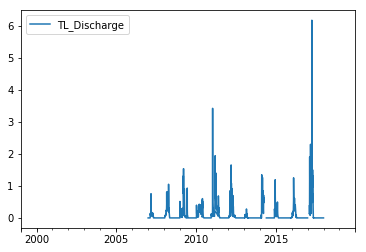

<Figure size 432x288 with 0 Axes>

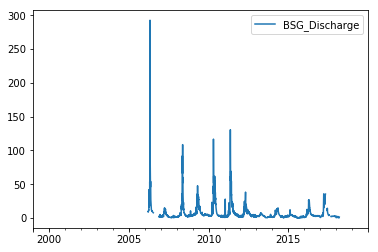

<Figure size 432x288 with 0 Axes>

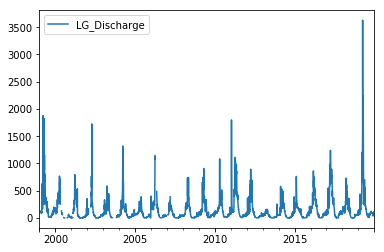

<Figure size 432x288 with 0 Axes>

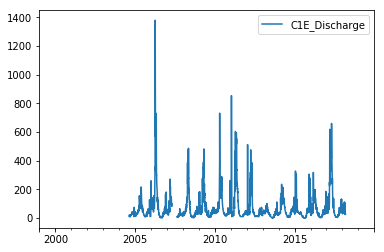

<Figure size 432x288 with 0 Axes>

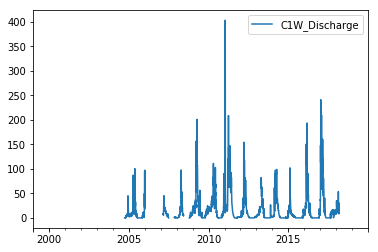

<Figure size 432x288 with 0 Axes>

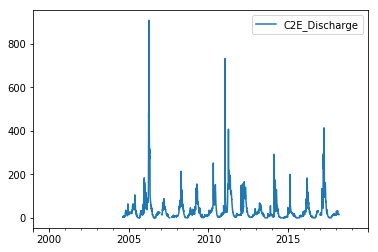

<Figure size 432x288 with 0 Axes>

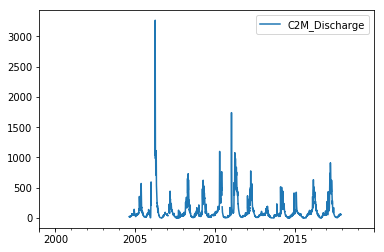

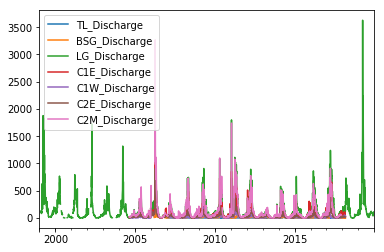

In [35]:
# create a new dataframe and put all the data into it, this is to avoid missing index since the new df has continuous idnex
# check the unit of variable here! Discharge unit should be L/s

indexUnique = pd.date_range(str(prep.index[0]), str(prep.index[-1]))  
ready_columns = pd.unique(prep.columns)  
siteList = ready_columns
nan_values = np.nan*np.ones([len(indexUnique),len(ready_columns)])
df = pd.DataFrame(nan_values, index=indexUnique, columns = ready_columns) 

plt.figure(figsize=(10,4))
for i in np.arange(len(ready_columns)):  
    print(siteList[i])            
    site = siteList[i]     
    tab = prep[site]
    for j in np.arange(len(prep)):  
        df.loc[tab.index[j]][ready_columns[i]] = tab[j]  # convert to the right unit
    plt.figure()
    df[[site]].plot()
    
df = threC(df,'Discharge') 
Discharge = copy.deepcopy(df)
Discharge.plot()

### 2. Precipitation

In [36]:
# extract variable data
BRW_ppt = BRW_met[['BRW_Precipitation']]
LDP_ppt = LDP_met[['LDP_Precipitation']]
SCR_ppt = SCR_met[['SCR_Precipitation']]
TL_ppt = TL_met[['TL_Precipitation']]
LW_ppt = LW_met[['LW_Precipitation']]

df_lst = [BRW_ppt, LDP_ppt, SCR_ppt, TL_ppt, LW_ppt]
for df in df_lst:     
    threC(df,'Precipitation') # modify the dataframe and set unphysical values to NAN
    df.index = pd.to_datetime(df.index,errors = 'coerce')
    display(df.head(2))
    print(df.shape)
    print(df.index[0],df.index[-1])

,BRW_Precipitation
DateTime,
2011-01-01 00:00:00,NaN
2011-01-01 01:00:00,NaN


(82045, 1)
2011-01-01 00:00:00 2020-05-11 12:00:00


,LDP_Precipitation
DateTime,
2007-01-01 00:00:00,NaN
2007-01-01 01:00:00,NaN


(113979, 1)
2007-01-01 00:00:00 2019-12-31 23:00:00


,SCR_Precipitation
DateTime,
2010-01-01 00:00:00,NaN
2010-01-01 01:00:00,NaN


(77876, 1)
2010-01-01 00:00:00 2018-10-15 13:00:00


,TL_Precipitation
DateTime,
1999-01-01 00:00:00,NaN
1999-01-01 01:00:00,NaN


(173623, 1)
1999-01-01 00:00:00 2018-10-15 12:00:00


,LW_Precipitation
DateTime,
1999-01-01 00:00:00,0.0
1999-01-01 01:00:00,0.0


(182343, 1)
1999-01-01 00:00:00 2018-10-15 13:00:00


In [37]:
# change accumulated ppt data to seperate ppt data
for df in df_lst:
    for col in df.columns:
        df[col][1:] = np.array(df[col])[1:] - np.array(df[col])[:-1] 
    # take the difference to calculate the ppt data within each shour
    df = threC(df,'Precipitation')

['BRW_Precipitation', datetime.date(2013, 1, 1)]
nan ratio is 0.041666666666666664 , groupby value is 9.6
['BRW_Precipitation', datetime.date(2014, 1, 1)]
nan ratio is 0.041666666666666664 , groupby value is 0.0
['BRW_Precipitation', datetime.date(2015, 1, 1)]
nan ratio is 0.041666666666666664 , groupby value is 0.20869565217391306
['BRW_Precipitation', datetime.date(2016, 1, 1)]
nan ratio is 0.041666666666666664 , groupby value is 0.4173913043478261
['BRW_Precipitation', datetime.date(2016, 9, 22)]
nan ratio is 0.041666666666666664 , groupby value is 9.391304347826086
['BRW_Precipitation', datetime.date(2017, 1, 1)]
nan ratio is 0.041666666666666664 , groupby value is 5.321739130434782
['BRW_Precipitation', datetime.date(2018, 3, 2)]
nan ratio is 0.041666666666666664 , groupby value is 3.5478260869564977
['BRW_Precipitation', datetime.date(2018, 3, 3)]
nan ratio is 0.041666666666666664 , groupby value is 3.0260869565217448
['BRW_Precipitation', datetime.date(2018, 3, 4)]
nan ratio is 

['BRW_Precipitation', datetime.date(2018, 8, 30)]
nan ratio is 0.041666666666666664 , groupby value is 0.2086956521739605
['BRW_Precipitation', datetime.date(2018, 9, 3)]
nan ratio is 0.041666666666666664 , groupby value is 0.20869565217390118
['BRW_Precipitation', datetime.date(2018, 9, 6)]
nan ratio is 0.041666666666666664 , groupby value is 0.3130434782608814
['BRW_Precipitation', datetime.date(2018, 9, 8)]
nan ratio is 0.08333333333333333 , groupby value is 0.2181818181818678
['BRW_Precipitation', datetime.date(2018, 9, 9)]
nan ratio is 0.08333333333333333 , groupby value is 0.2181818181818058
['BRW_Precipitation', datetime.date(2018, 9, 11)]
nan ratio is 0.041666666666666664 , groupby value is 0.10434782608698025
['BRW_Precipitation', datetime.date(2018, 9, 12)]
nan ratio is 0.041666666666666664 , groupby value is 0.10434782608698025
['BRW_Precipitation', datetime.date(2018, 9, 13)]
nan ratio is 0.08333333333333333 , groupby value is 0.3272727272727397
['BRW_Precipitation', dateti

['BRW_Precipitation', datetime.date(2019, 9, 24)]
nan ratio is 0.041666666666666664 , groupby value is 0.10434782608698025
['BRW_Precipitation', datetime.date(2019, 9, 26)]
nan ratio is 0.08333333333333333 , groupby value is 0.4363636363636736
['BRW_Precipitation', datetime.date(2019, 9, 27)]
nan ratio is 0.08333333333333333 , groupby value is 0.5454545454545455
['BRW_Precipitation', datetime.date(2019, 9, 28)]
nan ratio is 0.08333333333333333 , groupby value is 1.8545454545454731
['BRW_Precipitation', datetime.date(2019, 9, 29)]
nan ratio is 0.041666666666666664 , groupby value is 0.10434782608698025
['BRW_Precipitation', datetime.date(2019, 9, 30)]
nan ratio is 0.08333333333333333 , groupby value is 0.5454545454545455
['BRW_Precipitation', datetime.date(2019, 10, 1)]
nan ratio is 0.08333333333333333 , groupby value is 0.3272727272727087
['BRW_Precipitation', datetime.date(2019, 10, 3)]
nan ratio is 0.041666666666666664 , groupby value is 0.20869565217390118
['BRW_Precipitation', date

['LDP_Precipitation', datetime.date(2007, 10, 7)]
nan ratio is 0.08333333333333333 , groupby value is 0.0
['LDP_Precipitation', datetime.date(2008, 1, 1)]
nan ratio is 0.041666666666666664 , groupby value is 0.0
['LDP_Precipitation', datetime.date(2009, 1, 1)]
nan ratio is 0.041666666666666664 , groupby value is 7.304347826086956
['LDP_Precipitation', datetime.date(2010, 1, 1)]
nan ratio is 0.041666666666666664 , groupby value is 25.46086956521739
['LDP_Precipitation', datetime.date(2011, 1, 1)]
nan ratio is 0.041666666666666664 , groupby value is 3.756521739130435
['LDP_Precipitation', datetime.date(2012, 1, 1)]
nan ratio is 0.041666666666666664 , groupby value is 0.020869565217391303
['LDP_Precipitation', datetime.date(2013, 1, 1)]
nan ratio is 0.041666666666666664 , groupby value is 0.0
['LDP_Precipitation', datetime.date(2014, 1, 1)]
nan ratio is 0.041666666666666664 , groupby value is 0.0
['LDP_Precipitation', datetime.date(2015, 1, 1)]
nan ratio is 0.041666666666666664 , groupby 

['TL_Precipitation', datetime.date(2018, 4, 2)]
nan ratio is 0.08333333333333333 , groupby value is 3.927272727272721
['TL_Precipitation', datetime.date(2018, 4, 5)]
nan ratio is 0.08333333333333333 , groupby value is 4.58181818181817
['TL_Precipitation', datetime.date(2018, 4, 16)]
nan ratio is 0.08333333333333333 , groupby value is 12.0
['TL_Precipitation', datetime.date(2018, 6, 17)]
nan ratio is 0.041666666666666664 , groupby value is 5.21739130434784
['TL_Precipitation', datetime.date(2018, 6, 19)]
nan ratio is 0.08333333333333333 , groupby value is 2.290909090909085
['TL_Precipitation', datetime.date(2018, 7, 6)]
nan ratio is 0.08333333333333333 , groupby value is 0.43636363636362707
['TL_Precipitation', datetime.date(2018, 7, 20)]
nan ratio is 0.08333333333333333 , groupby value is 0.43636363636364256
['TL_Precipitation', datetime.date(2018, 7, 25)]
nan ratio is 0.08333333333333333 , groupby value is 0.43636363636364256
['TL_Precipitation', datetime.date(2018, 7, 26)]
nan ratio 

,BRW_Precipitation,LDP_Precipitation,SCR_Precipitation,TL_Precipitation,LW_Precipitation
1999-01-01,NaN,NaN,NaN,NaN,0.02
1999-01-02,NaN,NaN,NaN,NaN,0


,BRW_Precipitation,LDP_Precipitation,SCR_Precipitation,TL_Precipitation,LW_Precipitation
2020-05-10,0.218182,NaN,NaN,NaN,NaN
2020-05-11,0.108333,NaN,NaN,NaN,NaN


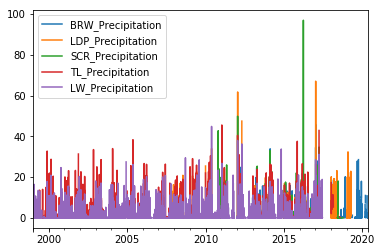

In [38]:
prep = aggre_and_comb_daily(df_lst, axis=1, func = "sum") 
prep.plot()

BRW_Precipitation
LDP_Precipitation
SCR_Precipitation
TL_Precipitation
LW_Precipitation


<Figure size 720x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

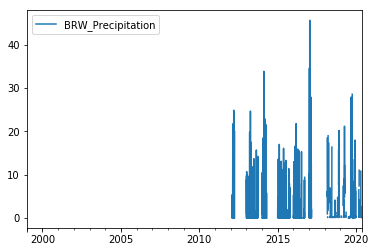

<Figure size 432x288 with 0 Axes>

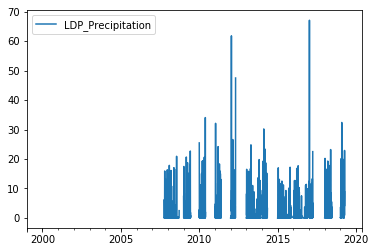

<Figure size 432x288 with 0 Axes>

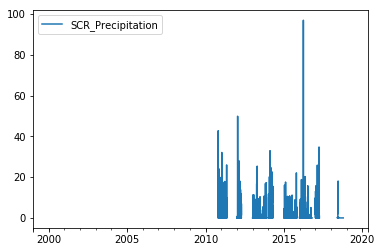

<Figure size 432x288 with 0 Axes>

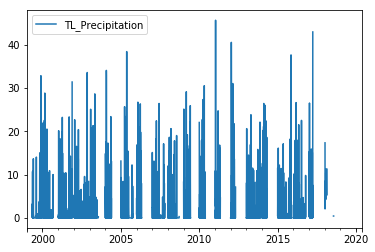

<Figure size 432x288 with 0 Axes>

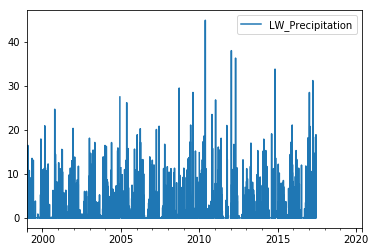

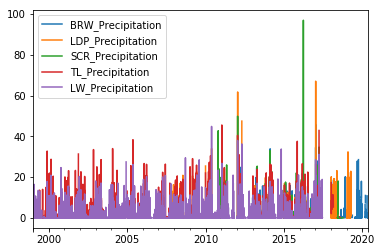

In [39]:
# create a new dataframe and put all the data into it, this is to avoid missing index since the new df has continuous idnex
# check the unit of variable here! Precipitation unit should be mm

indexUnique = pd.date_range(str(prep.index[0]), str(prep.index[-1]))  
ready_columns = pd.unique(prep.columns)  
siteList = ready_columns
nan_values = np.nan*np.ones([len(indexUnique),len(ready_columns)])
df = pd.DataFrame(nan_values, index=indexUnique, columns = ready_columns) 

plt.figure(figsize=(10,4))
for i in np.arange(len(ready_columns)):  
    print(siteList[i])            
    site = siteList[i]     
    tab = prep[site]
    for j in np.arange(len(prep)):  
        df.loc[tab.index[j]][ready_columns[i]] = tab[j]  # convert to the right unit
    plt.figure()
    df[[site]].plot()

df = threC(df,'Precipitation')     
Precipitation = copy.deepcopy(df)
Precipitation.plot()

### 3. AirTemperature

,BRW_AirTemperature
DateTime,
2011-01-01 00:00:00,NaN
2011-01-01 01:00:00,NaN


(82045, 1)
2011-01-01 00:00:00 2020-05-11 12:00:00


,LDP_AirTemperature
DateTime,
2007-01-01 00:00:00,NaN
2007-01-01 01:00:00,NaN


(113979, 1)
2007-01-01 00:00:00 2019-12-31 23:00:00


,SCR_AirTemperature
DateTime,
2010-01-01 00:00:00,NaN
2010-01-01 01:00:00,NaN


(77876, 1)
2010-01-01 00:00:00 2018-10-15 13:00:00


,TL_AirTemperature
DateTime,
1999-01-01 00:00:00,NaN
1999-01-01 01:00:00,NaN


(173623, 1)
1999-01-01 00:00:00 2018-10-15 12:00:00


,LW_AirTemperature
DateTime,
1999-01-01 00:00:00,2.27
1999-01-01 01:00:00,2.62


(182343, 1)
1999-01-01 00:00:00 2018-10-15 13:00:00
['BRW_AirTemperature', datetime.date(2012, 6, 2)]
nan ratio is 0.041666666666666664 , groupby value is 13.810217391304343
['BRW_AirTemperature', datetime.date(2012, 11, 7)]
nan ratio is 0.041666666666666664 , groupby value is 6.09408695652174
['BRW_AirTemperature', datetime.date(2013, 1, 22)]
nan ratio is 0.041666666666666664 , groupby value is 1.8391304347826083
['BRW_AirTemperature', datetime.date(2016, 4, 21)]
nan ratio is 0.08333333333333333 , groupby value is 13.227272727272725
['BRW_AirTemperature', datetime.date(2019, 6, 23)]
nan ratio is 0.041666666666666664 , groupby value is 10.369565217391305
['BRW_AirTemperature', datetime.date(2019, 7, 18)]
nan ratio is 0.08333333333333333 , groupby value is 14.368181818181814
['BRW_AirTemperature', datetime.date(2019, 7, 25)]
nan ratio is 0.041666666666666664 , groupby value is 18.66086956521739
['LDP_AirTemperature', datetime.date(2007, 7, 30)]
nan ratio is 0.041666666666666664 , groupb

['LW_AirTemperature', datetime.date(2009, 11, 24)]
nan ratio is 0.041666666666666664 , groupby value is 0.14347826086956522
['LW_AirTemperature', datetime.date(2011, 7, 21)]
nan ratio is 0.041666666666666664 , groupby value is 19.926086956521736
['LW_AirTemperature', datetime.date(2011, 8, 12)]
nan ratio is 0.041666666666666664 , groupby value is 22.547826086956523
['LW_AirTemperature', datetime.date(2011, 10, 14)]
nan ratio is 0.08333333333333333 , groupby value is 14.363636363636363
['LW_AirTemperature', datetime.date(2011, 10, 22)]
nan ratio is 0.08333333333333333 , groupby value is 11.318181818181818
['LW_AirTemperature', datetime.date(2014, 9, 19)]
nan ratio is 0.041666666666666664 , groupby value is 18.282608695652176
['LW_AirTemperature', datetime.date(2014, 9, 23)]
nan ratio is 0.041666666666666664 , groupby value is 21.630434782608695
['LW_AirTemperature', datetime.date(2015, 11, 5)]
nan ratio is 0.08333333333333333 , groupby value is 2.0363636363636366
['LW_AirTemperature', d

,BRW_AirTemperature,LDP_AirTemperature,SCR_AirTemperature,TL_AirTemperature,LW_AirTemperature
1999-01-01,NaN,NaN,NaN,NaN,1.3225
1999-01-02,NaN,NaN,NaN,NaN,-0.02


,BRW_AirTemperature,LDP_AirTemperature,SCR_AirTemperature,TL_AirTemperature,LW_AirTemperature
2020-05-10,14.0746,NaN,NaN,NaN,NaN
2020-05-11,13.1292,NaN,NaN,NaN,NaN


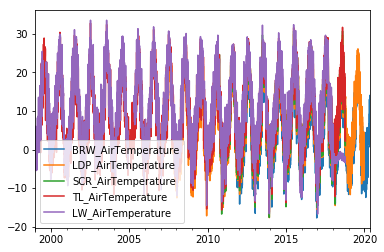

In [40]:
# extract variable data
BRW_AT = BRW_met[['BRW_AirTemperature']]
LDP_AT = LDP_met[['LDP_AirTemperature']]
SCR_AT = SCR_met[['SCR_AirTemperature']]
TL_AT = TL_met[['TL_AirTemperature']]
LW_AT = LW_met[['LW_AirTemperature']]

df_lst = [BRW_AT, LDP_AT, SCR_AT, TL_AT, LW_AT]
for df in df_lst:     
    threC(df,'AirTemperature') # modify the dataframe and set unphysical values to NAN
    df.index = pd.to_datetime(df.index,errors = 'coerce')
    display(df.head(2))
    print(df.shape)
    print(df.index[0],df.index[-1])
    
prep = aggre_and_comb_daily(df_lst, axis=1, func = "mean")  
prep.plot()

BRW_AirTemperature
LDP_AirTemperature
SCR_AirTemperature
TL_AirTemperature
LW_AirTemperature


<Figure size 720x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

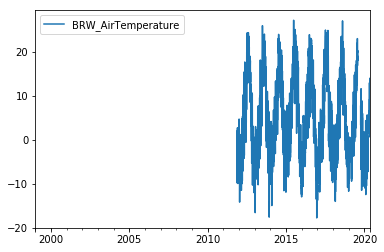

<Figure size 432x288 with 0 Axes>

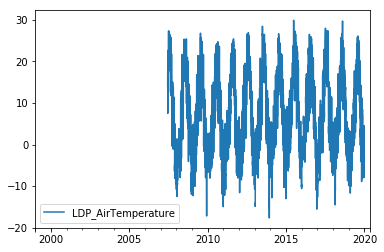

<Figure size 432x288 with 0 Axes>

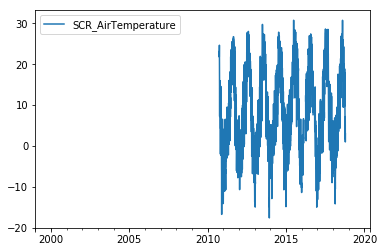

<Figure size 432x288 with 0 Axes>

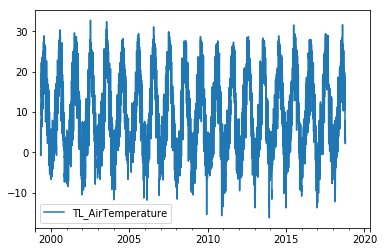

<Figure size 432x288 with 0 Axes>

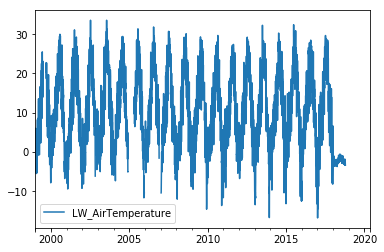

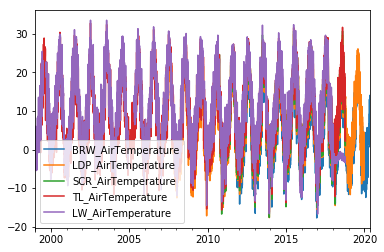

In [41]:
# create a new dataframe and put all the data into it, this is to avoid missing index since the new df has continuous idnex
# check the unit of variable here! Air Temperature unit should be Degree celsius

indexUnique = pd.date_range(str(prep.index[0]), str(prep.index[-1]))  
ready_columns = pd.unique(prep.columns)  
siteList = ready_columns
nan_values = np.nan*np.ones([len(indexUnique),len(ready_columns)])
df = pd.DataFrame(nan_values, index=indexUnique, columns = ready_columns) 

plt.figure(figsize=(10,4))
for i in np.arange(len(ready_columns)):  
    print(siteList[i])            
    site = siteList[i]     
    tab = prep[site]
    for j in np.arange(len(prep)):  
        df.loc[tab.index[j]][ready_columns[i]] = tab[j]  # convert to the right unit
    plt.figure()
    df[[site]].plot()

df = threC(df,'AirTemperature')   
AirTemperature = copy.deepcopy(df)
AirTemperature.plot()

### 4. SolarRadiation

,BRW_SolarRadiation_regular,BRW_SolarRadiation_net
DateTime,,
2011-01-01 00:00:00,NaN,NaN
2011-01-01 01:00:00,NaN,NaN


(82045, 2)
2011-01-01 00:00:00 2020-05-11 12:00:00


,LDP_SolarRadiation_regular,LDP_SolarRadiation_net
DateTime,,
2007-01-01 00:00:00,NaN,NaN
2007-01-01 01:00:00,NaN,NaN


(113979, 2)
2007-01-01 00:00:00 2019-12-31 23:00:00


,SCR_SolarRadiation_regular,SCR_SolarRadiation_net
DateTime,,
2010-01-01 00:00:00,NaN,NaN
2010-01-01 01:00:00,NaN,NaN


(77876, 2)
2010-01-01 00:00:00 2018-10-15 13:00:00


,TL_SolarRadiation_regular,TL_SolarRadiation_net
DateTime,,
1999-01-01 00:00:00,NaN,NaN
1999-01-01 01:00:00,NaN,NaN


(173623, 2)
1999-01-01 00:00:00 2018-10-15 12:00:00


,LW_SolarRadiation_regular,LW_SolarRadiation_net
DateTime,,
1999-01-01 00:00:00,NaN,NaN
1999-01-01 01:00:00,NaN,NaN


(182343, 2)
1999-01-01 00:00:00 2018-10-15 13:00:00
['BRW_SolarRadiation_regular', datetime.date(2012, 6, 2)]
nan ratio is 0.041666666666666664 , groupby value is 275.02886956521735
['BRW_SolarRadiation_regular', datetime.date(2012, 11, 7)]
nan ratio is 0.041666666666666664 , groupby value is 57.68869565217392
['BRW_SolarRadiation_regular', datetime.date(2013, 1, 22)]
nan ratio is 0.041666666666666664 , groupby value is 81.10652173913044
['BRW_SolarRadiation_regular', datetime.date(2016, 4, 21)]
nan ratio is 0.08333333333333333 , groupby value is 229.5272727272728
['BRW_SolarRadiation_net', datetime.date(2011, 11, 18)]
nan ratio is 0.08333333333333333 , groupby value is -3.301318181818182
['BRW_SolarRadiation_net', datetime.date(2011, 11, 22)]
nan ratio is 0.041666666666666664 , groupby value is -7.028347826086956
['BRW_SolarRadiation_net', datetime.date(2011, 11, 23)]
nan ratio is 0.08333333333333333 , groupby value is -35.51131818181818
['BRW_SolarRadiation_net', datetime.date(2011, 

['BRW_SolarRadiation_net', datetime.date(2015, 5, 13)]
nan ratio is 0.08333333333333333 , groupby value is 137.33772727272728
['BRW_SolarRadiation_net', datetime.date(2015, 5, 14)]
nan ratio is 0.041666666666666664 , groupby value is 159.85
['BRW_SolarRadiation_net', datetime.date(2015, 5, 16)]
nan ratio is 0.08333333333333333 , groupby value is 35.019999999999996
['BRW_SolarRadiation_net', datetime.date(2015, 5, 18)]
nan ratio is 0.08333333333333333 , groupby value is 142.6627272727273
['BRW_SolarRadiation_net', datetime.date(2015, 5, 21)]
nan ratio is 0.08333333333333333 , groupby value is 165.53272727272727
['BRW_SolarRadiation_net', datetime.date(2015, 11, 1)]
nan ratio is 0.08333333333333333 , groupby value is 3.86409090909091
['BRW_SolarRadiation_net', datetime.date(2015, 11, 2)]
nan ratio is 0.08333333333333333 , groupby value is 5.622272727272727
['BRW_SolarRadiation_net', datetime.date(2015, 11, 11)]
nan ratio is 0.08333333333333333 , groupby value is -4.853636363636365
['BRW_

['BRW_SolarRadiation_net', datetime.date(2018, 5, 20)]
nan ratio is 0.041666666666666664 , groupby value is 98.06608695652174
['BRW_SolarRadiation_net', datetime.date(2018, 6, 10)]
nan ratio is 0.041666666666666664 , groupby value is 236.3882608695652
['BRW_SolarRadiation_net', datetime.date(2018, 10, 26)]
nan ratio is 0.08333333333333333 , groupby value is 64.95681818181819
['BRW_SolarRadiation_net', datetime.date(2018, 11, 24)]
nan ratio is 0.08333333333333333 , groupby value is 2.6372727272727268
['BRW_SolarRadiation_net', datetime.date(2018, 11, 28)]
nan ratio is 0.041666666666666664 , groupby value is 0.2873913043478266
['BRW_SolarRadiation_net', datetime.date(2018, 12, 4)]
nan ratio is 0.08333333333333333 , groupby value is -17.680454545454545
['BRW_SolarRadiation_net', datetime.date(2018, 12, 8)]
nan ratio is 0.041666666666666664 , groupby value is -16.456956521739126
['BRW_SolarRadiation_net', datetime.date(2018, 12, 15)]
nan ratio is 0.08333333333333333 , groupby value is -22.

['LDP_SolarRadiation_net', datetime.date(2008, 4, 19)]
nan ratio is 0.08333333333333333 , groupby value is 49.00590909090908
['LDP_SolarRadiation_net', datetime.date(2008, 4, 23)]
nan ratio is 0.041666666666666664 , groupby value is 8.806521739130437
['LDP_SolarRadiation_net', datetime.date(2008, 5, 3)]
nan ratio is 0.041666666666666664 , groupby value is 67.02956521739131
['LDP_SolarRadiation_net', datetime.date(2008, 5, 6)]
nan ratio is 0.041666666666666664 , groupby value is 144.18304347826088
['LDP_SolarRadiation_net', datetime.date(2008, 5, 14)]
nan ratio is 0.041666666666666664 , groupby value is 118.47043478260875
['LDP_SolarRadiation_net', datetime.date(2008, 5, 23)]
nan ratio is 0.041666666666666664 , groupby value is 79.88478260869564
['LDP_SolarRadiation_net', datetime.date(2008, 5, 27)]
nan ratio is 0.041666666666666664 , groupby value is 58.87999999999999
['LDP_SolarRadiation_net', datetime.date(2008, 5, 28)]
nan ratio is 0.041666666666666664 , groupby value is 118.0869565

['LDP_SolarRadiation_net', datetime.date(2010, 3, 21)]
nan ratio is 0.08333333333333333 , groupby value is 3.013636363636364
['LDP_SolarRadiation_net', datetime.date(2010, 3, 25)]
nan ratio is 0.041666666666666664 , groupby value is -9.187826086956523
['LDP_SolarRadiation_net', datetime.date(2010, 3, 29)]
nan ratio is 0.041666666666666664 , groupby value is -2.1895652173913036
['LDP_SolarRadiation_net', datetime.date(2010, 3, 31)]
nan ratio is 0.08333333333333333 , groupby value is -10.785909090909088
['LDP_SolarRadiation_net', datetime.date(2010, 4, 4)]
nan ratio is 0.08333333333333333 , groupby value is -15.566363636363638
['LDP_SolarRadiation_net', datetime.date(2010, 4, 20)]
nan ratio is 0.041666666666666664 , groupby value is 77.99434782608695
['LDP_SolarRadiation_net', datetime.date(2010, 4, 21)]
nan ratio is 0.08333333333333333 , groupby value is 49.210909090909084
['LDP_SolarRadiation_net', datetime.date(2010, 4, 28)]
nan ratio is 0.08333333333333333 , groupby value is 60.74318

['LDP_SolarRadiation_net', datetime.date(2011, 11, 12)]
nan ratio is 0.08333333333333333 , groupby value is 25.530000000000005
['LDP_SolarRadiation_net', datetime.date(2011, 11, 14)]
nan ratio is 0.041666666666666664 , groupby value is 14.120434782608692
['LDP_SolarRadiation_net', datetime.date(2011, 11, 18)]
nan ratio is 0.08333333333333333 , groupby value is -7.3163636363636355
['LDP_SolarRadiation_net', datetime.date(2011, 12, 27)]
nan ratio is 0.041666666666666664 , groupby value is 19.953478260869566
['LDP_SolarRadiation_net', datetime.date(2011, 12, 28)]
nan ratio is 0.08333333333333333 , groupby value is -5.448181818181817
['LDP_SolarRadiation_net', datetime.date(2011, 12, 30)]
nan ratio is 0.041666666666666664 , groupby value is -4.5926086956521734
['LDP_SolarRadiation_net', datetime.date(2012, 1, 17)]
nan ratio is 0.08333333333333333 , groupby value is 1.919999999999999
['LDP_SolarRadiation_net', datetime.date(2012, 1, 20)]
nan ratio is 0.041666666666666664 , groupby value is 

['LDP_SolarRadiation_net', datetime.date(2014, 3, 29)]
nan ratio is 0.08333333333333333 , groupby value is 1.7545454545454546
['LDP_SolarRadiation_net', datetime.date(2014, 4, 4)]
nan ratio is 0.08333333333333333 , groupby value is 56.668636363636374
['LDP_SolarRadiation_net', datetime.date(2014, 4, 5)]
nan ratio is 0.08333333333333333 , groupby value is 102.39363636363638
['LDP_SolarRadiation_net', datetime.date(2014, 5, 9)]
nan ratio is 0.041666666666666664 , groupby value is 133.9491304347826
['LDP_SolarRadiation_net', datetime.date(2014, 5, 10)]
nan ratio is 0.08333333333333333 , groupby value is 90.60318181818184
['LDP_SolarRadiation_net', datetime.date(2014, 6, 27)]
nan ratio is 0.08333333333333333 , groupby value is 103.27681818181817
['LDP_SolarRadiation_net', datetime.date(2014, 8, 4)]
nan ratio is 0.041666666666666664 , groupby value is 133.3239130434782
['LDP_SolarRadiation_net', datetime.date(2014, 8, 6)]
nan ratio is 0.041666666666666664 , groupby value is 112.294347826086

['LDP_SolarRadiation_net', datetime.date(2017, 4, 5)]
nan ratio is 0.041666666666666664 , groupby value is 139.68391304347824
['LDP_SolarRadiation_net', datetime.date(2017, 4, 7)]
nan ratio is 0.041666666666666664 , groupby value is 36.97913043478261
['LDP_SolarRadiation_net', datetime.date(2017, 4, 8)]
nan ratio is 0.041666666666666664 , groupby value is 16.05217391304348
['LDP_SolarRadiation_net', datetime.date(2017, 4, 12)]
nan ratio is 0.041666666666666664 , groupby value is 192.9004347826087
['LDP_SolarRadiation_net', datetime.date(2017, 4, 23)]
nan ratio is 0.041666666666666664 , groupby value is 182.57434782608695
['LDP_SolarRadiation_net', datetime.date(2017, 4, 26)]
nan ratio is 0.041666666666666664 , groupby value is 42.600434782608694
['LDP_SolarRadiation_net', datetime.date(2017, 4, 30)]
nan ratio is 0.08333333333333333 , groupby value is 149.63636363636363
['LDP_SolarRadiation_net', datetime.date(2017, 5, 12)]
nan ratio is 0.08333333333333333 , groupby value is 36.88318181

['LDP_SolarRadiation_net', datetime.date(2019, 11, 27)]
nan ratio is 0.041666666666666664 , groupby value is 8.413478260869567
['LDP_SolarRadiation_net', datetime.date(2019, 12, 1)]
nan ratio is 0.08333333333333333 , groupby value is 6.751363636363636
['LDP_SolarRadiation_net', datetime.date(2019, 12, 5)]
nan ratio is 0.041666666666666664 , groupby value is 28.366086956521727
['LDP_SolarRadiation_net', datetime.date(2019, 12, 18)]
nan ratio is 0.041666666666666664 , groupby value is -8.302173913043479
['LDP_SolarRadiation_net', datetime.date(2019, 12, 27)]
nan ratio is 0.041666666666666664 , groupby value is -4.913043478260871
['SCR_SolarRadiation_regular', datetime.date(2010, 10, 14)]
nan ratio is 0.041666666666666664 , groupby value is 172.11826086956523
['SCR_SolarRadiation_regular', datetime.date(2012, 6, 2)]
nan ratio is 0.08333333333333333 , groupby value is 308.5590909090909
['SCR_SolarRadiation_regular', datetime.date(2012, 6, 9)]
nan ratio is 0.041666666666666664 , groupby val

['SCR_SolarRadiation_net', datetime.date(2013, 3, 20)]
nan ratio is 0.041666666666666664 , groupby value is 65.05608695652174
['SCR_SolarRadiation_net', datetime.date(2013, 4, 6)]
nan ratio is 0.08333333333333333 , groupby value is 82.44045454545454
['SCR_SolarRadiation_net', datetime.date(2013, 5, 28)]
nan ratio is 0.041666666666666664 , groupby value is 89.29130434782608
['SCR_SolarRadiation_net', datetime.date(2013, 6, 13)]
nan ratio is 0.08333333333333333 , groupby value is 164.07363636363633
['SCR_SolarRadiation_net', datetime.date(2013, 6, 19)]
nan ratio is 0.041666666666666664 , groupby value is 67.2995652173913
['SCR_SolarRadiation_net', datetime.date(2013, 7, 3)]
nan ratio is 0.041666666666666664 , groupby value is 116.04739130434783
['SCR_SolarRadiation_net', datetime.date(2013, 9, 12)]
nan ratio is 0.08333333333333333 , groupby value is 80.60000000000001
['SCR_SolarRadiation_net', datetime.date(2013, 9, 13)]
nan ratio is 0.08333333333333333 , groupby value is 103.54136363636

['SCR_SolarRadiation_net', datetime.date(2016, 4, 13)]
nan ratio is 0.041666666666666664 , groupby value is 153.7995652173913
['SCR_SolarRadiation_net', datetime.date(2016, 4, 14)]
nan ratio is 0.041666666666666664 , groupby value is 92.18739130434787
['SCR_SolarRadiation_net', datetime.date(2016, 4, 27)]
nan ratio is 0.041666666666666664 , groupby value is 105.8721739130435
['SCR_SolarRadiation_net', datetime.date(2016, 5, 7)]
nan ratio is 0.08333333333333333 , groupby value is 108.46636363636365
['SCR_SolarRadiation_net', datetime.date(2016, 5, 20)]
nan ratio is 0.08333333333333333 , groupby value is 56.19999999999998
['SCR_SolarRadiation_net', datetime.date(2016, 5, 22)]
nan ratio is 0.08333333333333333 , groupby value is 181.07136363636366
['SCR_SolarRadiation_net', datetime.date(2016, 9, 14)]
nan ratio is 0.08333333333333333 , groupby value is 34.42772727272727
['SCR_SolarRadiation_net', datetime.date(2016, 9, 22)]
nan ratio is 0.041666666666666664 , groupby value is 12.0026086956

['TL_SolarRadiation_regular', datetime.date(2011, 10, 30)]
nan ratio is 0.041666666666666664 , groupby value is 130.25608695652176
['TL_SolarRadiation_regular', datetime.date(2011, 11, 4)]
nan ratio is 0.041666666666666664 , groupby value is 41.27130434782609
['TL_SolarRadiation_regular', datetime.date(2011, 12, 19)]
nan ratio is 0.041666666666666664 , groupby value is 86.95217391304347
['TL_SolarRadiation_regular', datetime.date(2011, 12, 20)]
nan ratio is 0.08333333333333333 , groupby value is 59.36590909090909
['TL_SolarRadiation_regular', datetime.date(2013, 5, 30)]
nan ratio is 0.041666666666666664 , groupby value is 331.3878260869565
['TL_SolarRadiation_regular', datetime.date(2014, 9, 13)]
nan ratio is 0.08333333333333333 , groupby value is 202.16363636363639
['TL_SolarRadiation_regular', datetime.date(2014, 10, 19)]
nan ratio is 0.08333333333333333 , groupby value is 132.48636363636362
['TL_SolarRadiation_regular', datetime.date(2016, 6, 29)]
nan ratio is 0.041666666666666664 ,

['TL_SolarRadiation_net', datetime.date(2009, 4, 2)]
nan ratio is 0.08333333333333333 , groupby value is 6.059545454545455
['TL_SolarRadiation_net', datetime.date(2009, 4, 9)]
nan ratio is 0.041666666666666664 , groupby value is 97.05043478260869
['TL_SolarRadiation_net', datetime.date(2009, 4, 14)]
nan ratio is 0.041666666666666664 , groupby value is 104.74130434782606
['TL_SolarRadiation_net', datetime.date(2009, 5, 1)]
nan ratio is 0.08333333333333333 , groupby value is 74.43681818181818
['TL_SolarRadiation_net', datetime.date(2009, 5, 2)]
nan ratio is 0.041666666666666664 , groupby value is 86.21652173913044
['TL_SolarRadiation_net', datetime.date(2009, 5, 29)]
nan ratio is 0.08333333333333333 , groupby value is 152.14772727272725
['TL_SolarRadiation_net', datetime.date(2009, 5, 30)]
nan ratio is 0.041666666666666664 , groupby value is 165.62608695652173
['TL_SolarRadiation_net', datetime.date(2009, 6, 2)]
nan ratio is 0.041666666666666664 , groupby value is 20.222608695652177
['TL

['TL_SolarRadiation_net', datetime.date(2010, 10, 5)]
nan ratio is 0.041666666666666664 , groupby value is 60.18695652173915
['TL_SolarRadiation_net', datetime.date(2010, 10, 7)]
nan ratio is 0.041666666666666664 , groupby value is 69.5795652173913
['TL_SolarRadiation_net', datetime.date(2010, 10, 8)]
nan ratio is 0.041666666666666664 , groupby value is 7.41130434782609
['TL_SolarRadiation_net', datetime.date(2010, 10, 26)]
nan ratio is 0.08333333333333333 , groupby value is 17.76590909090909
['TL_SolarRadiation_net', datetime.date(2010, 10, 27)]
nan ratio is 0.041666666666666664 , groupby value is 27.745217391304344
['TL_SolarRadiation_net', datetime.date(2010, 10, 29)]
nan ratio is 0.08333333333333333 , groupby value is 20.28318181818182
['TL_SolarRadiation_net', datetime.date(2010, 10, 31)]
nan ratio is 0.08333333333333333 , groupby value is 12.366818181818184
['TL_SolarRadiation_net', datetime.date(2010, 11, 2)]
nan ratio is 0.08333333333333333 , groupby value is 32.46090909090909


['TL_SolarRadiation_net', datetime.date(2011, 7, 31)]
nan ratio is 0.041666666666666664 , groupby value is 147.55608695652174
['TL_SolarRadiation_net', datetime.date(2011, 8, 1)]
nan ratio is 0.08333333333333333 , groupby value is 159.98
['TL_SolarRadiation_net', datetime.date(2011, 9, 12)]
nan ratio is 0.08333333333333333 , groupby value is 94.30727272727272
['TL_SolarRadiation_net', datetime.date(2011, 10, 6)]
nan ratio is 0.041666666666666664 , groupby value is -13.008695652173914
['TL_SolarRadiation_net', datetime.date(2011, 10, 7)]
nan ratio is 0.041666666666666664 , groupby value is -3.083478260869566
['TL_SolarRadiation_net', datetime.date(2011, 10, 10)]
nan ratio is 0.08333333333333333 , groupby value is 2.136818181818183
['TL_SolarRadiation_net', datetime.date(2011, 10, 13)]
nan ratio is 0.08333333333333333 , groupby value is 66.73454545454545
['TL_SolarRadiation_net', datetime.date(2011, 10, 14)]
nan ratio is 0.041666666666666664 , groupby value is 69.33521739130433
['TL_Sola

['TL_SolarRadiation_net', datetime.date(2012, 6, 4)]
nan ratio is 0.041666666666666664 , groupby value is 153.58
['TL_SolarRadiation_net', datetime.date(2012, 6, 12)]
nan ratio is 0.041666666666666664 , groupby value is 135.80130434782606
['TL_SolarRadiation_net', datetime.date(2012, 6, 22)]
nan ratio is 0.08333333333333333 , groupby value is 153.41090909090912
['TL_SolarRadiation_net', datetime.date(2012, 7, 13)]
nan ratio is 0.041666666666666664 , groupby value is 61.73521739130434
['TL_SolarRadiation_net', datetime.date(2012, 8, 19)]
nan ratio is 0.08333333333333333 , groupby value is 59.12772727272728
['TL_SolarRadiation_net', datetime.date(2012, 9, 28)]
nan ratio is 0.08333333333333333 , groupby value is 53.84590909090909
['TL_SolarRadiation_net', datetime.date(2012, 10, 20)]
nan ratio is 0.041666666666666664 , groupby value is 31.561739130434784
['TL_SolarRadiation_net', datetime.date(2012, 10, 28)]
nan ratio is 0.041666666666666664 , groupby value is -9.80478260869565
['TL_Solar

['TL_SolarRadiation_net', datetime.date(2014, 6, 26)]
nan ratio is 0.08333333333333333 , groupby value is 166.3190909090909
['TL_SolarRadiation_net', datetime.date(2014, 6, 27)]
nan ratio is 0.08333333333333333 , groupby value is 162.21454545454543
['TL_SolarRadiation_net', datetime.date(2014, 8, 4)]
nan ratio is 0.041666666666666664 , groupby value is 164.34347826086952
['TL_SolarRadiation_net', datetime.date(2014, 8, 6)]
nan ratio is 0.041666666666666664 , groupby value is 156.31304347826085
['TL_SolarRadiation_net', datetime.date(2014, 8, 14)]
nan ratio is 0.08333333333333333 , groupby value is 191.27772727272725
['TL_SolarRadiation_net', datetime.date(2014, 10, 15)]
nan ratio is 0.041666666666666664 , groupby value is 18.36260869565217
['TL_SolarRadiation_net', datetime.date(2014, 10, 29)]
nan ratio is 0.041666666666666664 , groupby value is 40.875217391304346
['TL_SolarRadiation_net', datetime.date(2014, 11, 13)]
nan ratio is 0.08333333333333333 , groupby value is 9.01136363636363

['TL_SolarRadiation_net', datetime.date(2017, 3, 14)]
nan ratio is 0.041666666666666664 , groupby value is 70.60739130434783
['TL_SolarRadiation_net', datetime.date(2017, 3, 17)]
nan ratio is 0.041666666666666664 , groupby value is 142.21478260869563
['TL_SolarRadiation_net', datetime.date(2017, 3, 18)]
nan ratio is 0.041666666666666664 , groupby value is 8.428695652173912
['TL_SolarRadiation_net', datetime.date(2017, 3, 20)]
nan ratio is 0.08333333333333333 , groupby value is 59.69227272727273
['TL_SolarRadiation_net', datetime.date(2017, 3, 22)]
nan ratio is 0.041666666666666664 , groupby value is 110.52043478260873
['TL_SolarRadiation_net', datetime.date(2017, 4, 5)]
nan ratio is 0.08333333333333333 , groupby value is 148.215
['TL_SolarRadiation_net', datetime.date(2017, 4, 7)]
nan ratio is 0.041666666666666664 , groupby value is 30.55173913043478
['TL_SolarRadiation_net', datetime.date(2017, 4, 8)]
nan ratio is 0.08333333333333333 , groupby value is 37.92272727272726
['TL_SolarRadi

['LW_SolarRadiation_regular', datetime.date(2007, 2, 27)]
nan ratio is 0.041666666666666664 , groupby value is 115.67086956521739
['LW_SolarRadiation_regular', datetime.date(2008, 4, 14)]
nan ratio is 0.041666666666666664 , groupby value is 55.4991304347826
['LW_SolarRadiation_regular', datetime.date(2009, 1, 22)]
nan ratio is 0.041666666666666664 , groupby value is 25.188260869565216
['LW_SolarRadiation_regular', datetime.date(2009, 9, 25)]
nan ratio is 0.08333333333333333 , groupby value is 177.95000000000002
['LW_SolarRadiation_regular', datetime.date(2009, 11, 24)]
nan ratio is 0.041666666666666664 , groupby value is 74.21565217391304
['LW_SolarRadiation_regular', datetime.date(2011, 6, 17)]
nan ratio is 0.041666666666666664 , groupby value is 315.2956521739131
['LW_SolarRadiation_regular', datetime.date(2011, 7, 21)]
nan ratio is 0.08333333333333333 , groupby value is 283.8813636363637
['LW_SolarRadiation_regular', datetime.date(2011, 8, 12)]
nan ratio is 0.041666666666666664 , gr

['LW_SolarRadiation_net', datetime.date(2009, 4, 9)]
nan ratio is 0.08333333333333333 , groupby value is 93.38454545454543
['LW_SolarRadiation_net', datetime.date(2009, 4, 10)]
nan ratio is 0.041666666666666664 , groupby value is 31.041304347826088
['LW_SolarRadiation_net', datetime.date(2009, 4, 14)]
nan ratio is 0.08333333333333333 , groupby value is 101.75272727272727
['LW_SolarRadiation_net', datetime.date(2009, 4, 15)]
nan ratio is 0.08333333333333333 , groupby value is 65.52227272727274
['LW_SolarRadiation_net', datetime.date(2009, 4, 28)]
nan ratio is 0.041666666666666664 , groupby value is 32.3208695652174
['LW_SolarRadiation_net', datetime.date(2009, 5, 2)]
nan ratio is 0.041666666666666664 , groupby value is 72.29652173913044
['LW_SolarRadiation_net', datetime.date(2009, 5, 6)]
nan ratio is 0.041666666666666664 , groupby value is 46.89739130434783
['LW_SolarRadiation_net', datetime.date(2009, 5, 30)]
nan ratio is 0.08333333333333333 , groupby value is 179.04727272727274
['LW_

['LW_SolarRadiation_net', datetime.date(2010, 10, 4)]
nan ratio is 0.08333333333333333 , groupby value is 3.948636363636366
['LW_SolarRadiation_net', datetime.date(2010, 10, 5)]
nan ratio is 0.041666666666666664 , groupby value is 22.45391304347826
['LW_SolarRadiation_net', datetime.date(2010, 10, 8)]
nan ratio is 0.08333333333333333 , groupby value is 12.833181818181817
['LW_SolarRadiation_net', datetime.date(2010, 10, 10)]
nan ratio is 0.08333333333333333 , groupby value is 70.34545454545453
['LW_SolarRadiation_net', datetime.date(2010, 11, 1)]
nan ratio is 0.041666666666666664 , groupby value is 35.55
['LW_SolarRadiation_net', datetime.date(2010, 11, 2)]
nan ratio is 0.08333333333333333 , groupby value is 38.40363636363635
['LW_SolarRadiation_net', datetime.date(2010, 11, 3)]
nan ratio is 0.041666666666666664 , groupby value is 29.943913043478258
['LW_SolarRadiation_net', datetime.date(2010, 11, 5)]
nan ratio is 0.041666666666666664 , groupby value is 15.241304347826086
['LW_SolarRa

['LW_SolarRadiation_net', datetime.date(2012, 3, 20)]
nan ratio is 0.041666666666666664 , groupby value is -0.33478260869565285
['LW_SolarRadiation_net', datetime.date(2012, 3, 22)]
nan ratio is 0.041666666666666664 , groupby value is 111.92173913043477
['LW_SolarRadiation_net', datetime.date(2012, 3, 24)]
nan ratio is 0.08333333333333333 , groupby value is 67.91363636363634
['LW_SolarRadiation_net', datetime.date(2012, 3, 26)]
nan ratio is 0.041666666666666664 , groupby value is 11.830434782608696
['LW_SolarRadiation_net', datetime.date(2012, 4, 1)]
nan ratio is 0.08333333333333333 , groupby value is 124.89545454545451
['LW_SolarRadiation_net', datetime.date(2012, 4, 11)]
nan ratio is 0.08333333333333333 , groupby value is 18.695454545454552
['LW_SolarRadiation_net', datetime.date(2012, 4, 17)]
nan ratio is 0.08333333333333333 , groupby value is 109.38636363636364
['LW_SolarRadiation_net', datetime.date(2012, 4, 24)]
nan ratio is 0.08333333333333333 , groupby value is 119.2
['LW_Solar

['LW_SolarRadiation_net', datetime.date(2014, 4, 21)]
nan ratio is 0.08333333333333333 , groupby value is 125.09
['LW_SolarRadiation_net', datetime.date(2014, 4, 24)]
nan ratio is 0.041666666666666664 , groupby value is 59.77347826086957
['LW_SolarRadiation_net', datetime.date(2014, 4, 25)]
nan ratio is 0.041666666666666664 , groupby value is 7.671304347826089
['LW_SolarRadiation_net', datetime.date(2014, 5, 4)]
nan ratio is 0.08333333333333333 , groupby value is 129.8190909090909
['LW_SolarRadiation_net', datetime.date(2014, 7, 21)]
nan ratio is 0.08333333333333333 , groupby value is 70.85318181818182
['LW_SolarRadiation_net', datetime.date(2014, 10, 26)]
nan ratio is 0.041666666666666664 , groupby value is 44.33956521739129
['LW_SolarRadiation_net', datetime.date(2014, 10, 29)]
nan ratio is 0.08333333333333333 , groupby value is 17.331363636363633
['LW_SolarRadiation_net', datetime.date(2014, 11, 13)]
nan ratio is 0.08333333333333333 , groupby value is 5.210909090909089
['LW_SolarRad

['LW_SolarRadiation_net', datetime.date(2017, 3, 16)]
nan ratio is 0.041666666666666664 , groupby value is 104.50173913043476
['LW_SolarRadiation_net', datetime.date(2017, 3, 17)]
nan ratio is 0.041666666666666664 , groupby value is 114.39521739130436
['LW_SolarRadiation_net', datetime.date(2017, 3, 20)]
nan ratio is 0.08333333333333333 , groupby value is 54.39681818181817
['LW_SolarRadiation_net', datetime.date(2017, 4, 6)]
nan ratio is 0.08333333333333333 , groupby value is 22.21
['LW_SolarRadiation_net', datetime.date(2017, 4, 7)]
nan ratio is 0.041666666666666664 , groupby value is 28.384782608695648
['LW_SolarRadiation_net', datetime.date(2017, 4, 17)]
nan ratio is 0.041666666666666664 , groupby value is 125.31217391304347
['LW_SolarRadiation_net', datetime.date(2017, 4, 24)]
nan ratio is 0.08333333333333333 , groupby value is 78.52
['LW_SolarRadiation_net', datetime.date(2017, 4, 25)]
nan ratio is 0.08333333333333333 , groupby value is 167.34090909090907
['LW_SolarRadiation_net',

,BRW_SolarRadiation_regular,BRW_SolarRadiation_net,LDP_SolarRadiation_regular,LDP_SolarRadiation_net,SCR_SolarRadiation_regular,SCR_SolarRadiation_net,TL_SolarRadiation_regular,TL_SolarRadiation_net,LW_SolarRadiation_regular,LW_SolarRadiation_net
1999-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1999-01-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


,BRW_SolarRadiation_regular,BRW_SolarRadiation_net,LDP_SolarRadiation_regular,LDP_SolarRadiation_net,SCR_SolarRadiation_regular,SCR_SolarRadiation_net,TL_SolarRadiation_regular,TL_SolarRadiation_net,LW_SolarRadiation_regular,LW_SolarRadiation_net
2020-05-10,313.866,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-05-11,196.92,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


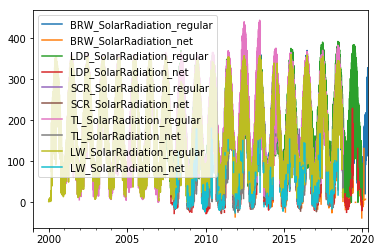

In [42]:
# extarct variable data
BRW_SR = BRW_met[['BRW_SolarRadiation_regular','BRW_SolarRadiation_net']]
LDP_SR = LDP_met[['LDP_SolarRadiation_regular','LDP_SolarRadiation_net']]
SCR_SR = SCR_met[['SCR_SolarRadiation_regular','SCR_SolarRadiation_net']]
TL_SR = TL_met[['TL_SolarRadiation_regular','TL_SolarRadiation_net']]
LW_SR = LW_met[['LW_SolarRadiation_regular','LW_SolarRadiation_net']]

df_lst = [BRW_SR, LDP_SR, SCR_SR, TL_SR, LW_SR]
for df in df_lst:     
    threC(df,'SolarRadiation') # modify the dataframe and set unphysical values to NAN
    df.index = pd.to_datetime(df.index,errors = 'coerce')
    display(df.head(2))
    print(df.shape)
    print(df.index[0],df.index[-1])
    
prep = aggre_and_comb_daily(df_lst, axis=1, func = "mean") 
prep.plot()

BRW_SolarRadiation_regular
BRW_SolarRadiation_net
LDP_SolarRadiation_regular
LDP_SolarRadiation_net
SCR_SolarRadiation_regular
SCR_SolarRadiation_net
TL_SolarRadiation_regular
TL_SolarRadiation_net
LW_SolarRadiation_regular
LW_SolarRadiation_net


<Figure size 720x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

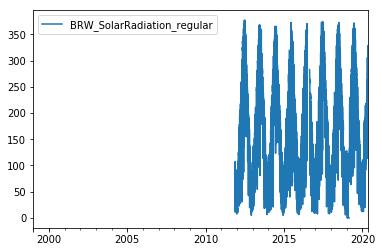

<Figure size 432x288 with 0 Axes>

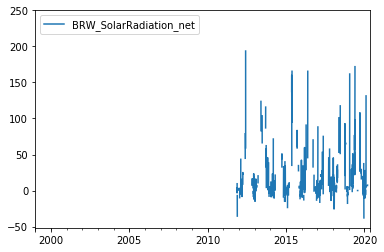

<Figure size 432x288 with 0 Axes>

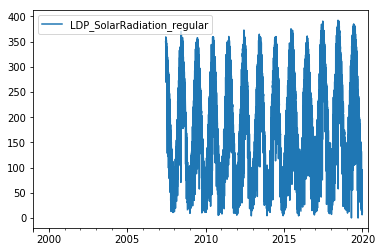

<Figure size 432x288 with 0 Axes>

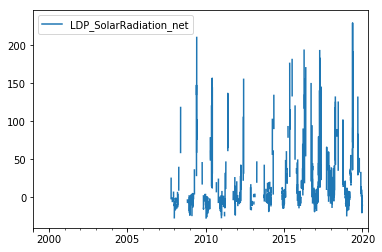

<Figure size 432x288 with 0 Axes>

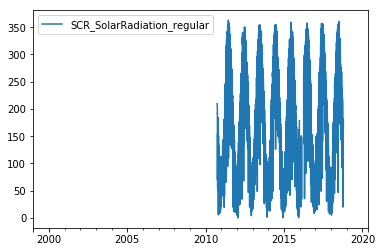

<Figure size 432x288 with 0 Axes>

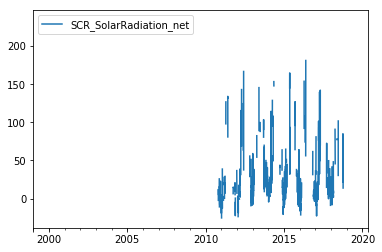

<Figure size 432x288 with 0 Axes>

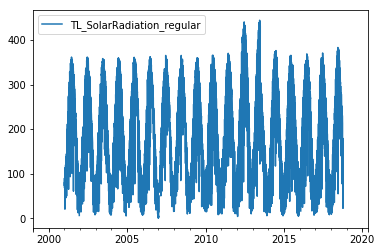

<Figure size 432x288 with 0 Axes>

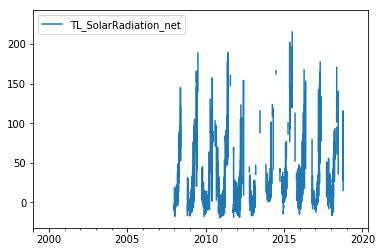

<Figure size 432x288 with 0 Axes>

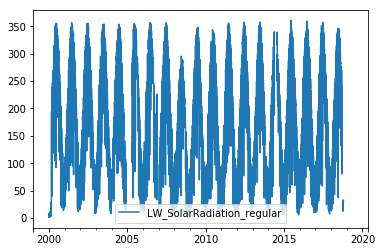

<Figure size 432x288 with 0 Axes>

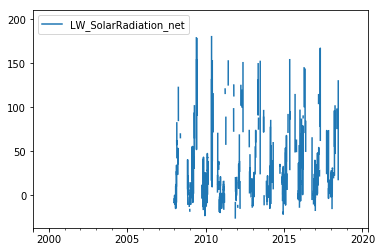

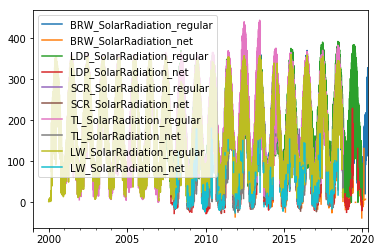

In [43]:
# create a new dataframe and put all the data into it, this is to avoid missing index since the new df has continuous idnex
# check the unit of variable here! SolarRadiation should be W/m2

indexUnique = pd.date_range(str(prep.index[0]), str(prep.index[-1]))  
ready_columns = pd.unique(prep.columns)  
siteList = ready_columns
nan_values = np.nan*np.ones([len(indexUnique),len(ready_columns)])
df = pd.DataFrame(nan_values, index=indexUnique, columns = ready_columns) 

plt.figure(figsize=(10,4))
for i in np.arange(len(ready_columns)):  
    print(siteList[i])            
    site = siteList[i]     
    tab = prep[site]
    for j in np.arange(len(prep)):  
        df.loc[tab.index[j]][ready_columns[i]] = tab[j]  # convert to the right unit
    plt.figure()
    df[[site]].plot()

df = threC(df,'SolarRadiation')  
SolarRadiation = copy.deepcopy(df)
SolarRadiation.plot()

### 5. Relative Humidity

,BRW_RelativeHumidity
DateTime,
2011-01-01 00:00:00,NaN
2011-01-01 01:00:00,NaN


(82045, 1)
2011-01-01 00:00:00 2020-05-11 12:00:00


,LDP_RelativeHumidity
DateTime,
2007-01-01 00:00:00,NaN
2007-01-01 01:00:00,NaN


(113979, 1)
2007-01-01 00:00:00 2019-12-31 23:00:00


,SCR_RelativeHumidity
DateTime,
2010-01-01 00:00:00,NaN
2010-01-01 01:00:00,NaN


(77876, 1)
2010-01-01 00:00:00 2018-10-15 13:00:00


,TL_RelativeHumidity
DateTime,
1999-01-01 00:00:00,NaN
1999-01-01 01:00:00,NaN


(173623, 1)
1999-01-01 00:00:00 2018-10-15 12:00:00


,LW_RelativeHumidity
DateTime,
1999-01-01 00:00:00,79.9
1999-01-01 01:00:00,75.1


(182343, 1)
1999-01-01 00:00:00 2018-10-15 13:00:00
['BRW_RelativeHumidity', datetime.date(2012, 6, 2)]
nan ratio is 0.041666666666666664 , groupby value is 58.502173913043464
['BRW_RelativeHumidity', datetime.date(2012, 11, 7)]
nan ratio is 0.041666666666666664 , groupby value is 63.76478260869565
['BRW_RelativeHumidity', datetime.date(2013, 1, 22)]
nan ratio is 0.041666666666666664 , groupby value is 24.987826086956527
['BRW_RelativeHumidity', datetime.date(2016, 4, 21)]
nan ratio is 0.08333333333333333 , groupby value is 31.522727272727273
['BRW_RelativeHumidity', datetime.date(2019, 6, 23)]
nan ratio is 0.041666666666666664 , groupby value is 46.88652173913043
['BRW_RelativeHumidity', datetime.date(2019, 7, 18)]
nan ratio is 0.08333333333333333 , groupby value is 52.87863636363635
['BRW_RelativeHumidity', datetime.date(2019, 7, 25)]
nan ratio is 0.041666666666666664 , groupby value is 20.061304347826084
['LDP_RelativeHumidity', datetime.date(2007, 7, 30)]
nan ratio is 0.04166666666

['TL_RelativeHumidity', datetime.date(2009, 10, 19)]
nan ratio is 0.041666666666666664 , groupby value is 87.41739130434783
['TL_RelativeHumidity', datetime.date(2009, 11, 14)]
nan ratio is 0.08333333333333333 , groupby value is 89.74999999999999
['TL_RelativeHumidity', datetime.date(2009, 11, 18)]
nan ratio is 0.041666666666666664 , groupby value is 78.22608695652173
['TL_RelativeHumidity', datetime.date(2009, 11, 28)]
nan ratio is 0.08333333333333333 , groupby value is 50.721363636363634
['TL_RelativeHumidity', datetime.date(2009, 12, 30)]
nan ratio is 0.08333333333333333 , groupby value is 98.38636363636364
['TL_RelativeHumidity', datetime.date(2009, 12, 31)]
nan ratio is 0.041666666666666664 , groupby value is 84.64521739130436
['TL_RelativeHumidity', datetime.date(2010, 1, 13)]
nan ratio is 0.041666666666666664 , groupby value is 87.4913043478261
['TL_RelativeHumidity', datetime.date(2010, 1, 28)]
nan ratio is 0.041666666666666664 , groupby value is 87.18260869565219
['TL_Relative

['TL_RelativeHumidity', datetime.date(2014, 4, 25)]
nan ratio is 0.08333333333333333 , groupby value is 91.13545454545455
['TL_RelativeHumidity', datetime.date(2014, 4, 27)]
nan ratio is 0.08333333333333333 , groupby value is 69.8009090909091
['TL_RelativeHumidity', datetime.date(2014, 5, 8)]
nan ratio is 0.041666666666666664 , groupby value is 46.88260869565217
['TL_RelativeHumidity', datetime.date(2014, 5, 10)]
nan ratio is 0.08333333333333333 , groupby value is 84.92863636363634
['TL_RelativeHumidity', datetime.date(2014, 9, 13)]
nan ratio is 0.08333333333333333 , groupby value is 15.05318181818182
['TL_RelativeHumidity', datetime.date(2014, 9, 30)]
nan ratio is 0.041666666666666664 , groupby value is 77.29478260869563
['TL_RelativeHumidity', datetime.date(2014, 10, 19)]
nan ratio is 0.08333333333333333 , groupby value is 31.533636363636365
['TL_RelativeHumidity', datetime.date(2014, 11, 20)]
nan ratio is 0.041666666666666664 , groupby value is 80.73913043478261
['TL_RelativeHumidit

['LW_RelativeHumidity', datetime.date(2011, 2, 19)]
nan ratio is 0.08333333333333333 , groupby value is 85.40727272727273
['LW_RelativeHumidity', datetime.date(2011, 3, 15)]
nan ratio is 0.041666666666666664 , groupby value is 68.14608695652173
['LW_RelativeHumidity', datetime.date(2011, 3, 16)]
nan ratio is 0.08333333333333333 , groupby value is 90.49545454545456
['LW_RelativeHumidity', datetime.date(2011, 3, 26)]
nan ratio is 0.08333333333333333 , groupby value is 83.03636363636366
['LW_RelativeHumidity', datetime.date(2011, 3, 27)]
nan ratio is 0.08333333333333333 , groupby value is 78.99000000000001
['LW_RelativeHumidity', datetime.date(2011, 4, 6)]
nan ratio is 0.041666666666666664 , groupby value is 66.33652173913046
['LW_RelativeHumidity', datetime.date(2011, 4, 16)]
nan ratio is 0.041666666666666664 , groupby value is 70.5991304347826
['LW_RelativeHumidity', datetime.date(2011, 4, 21)]
nan ratio is 0.041666666666666664 , groupby value is 69.26217391304348
['LW_RelativeHumidity'

,BRW_RelativeHumidity,LDP_RelativeHumidity,SCR_RelativeHumidity,TL_RelativeHumidity,LW_RelativeHumidity
1999-01-01,NaN,NaN,NaN,NaN,68.4771
1999-01-02,NaN,NaN,NaN,NaN,63.3087


,BRW_RelativeHumidity,LDP_RelativeHumidity,SCR_RelativeHumidity,TL_RelativeHumidity,LW_RelativeHumidity
2020-05-10,30.1392,NaN,NaN,NaN,NaN
2020-05-11,33.0331,NaN,NaN,NaN,NaN


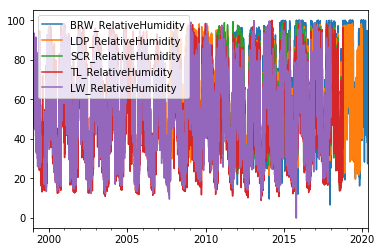

In [44]:
# extarct variable data
BRW_RH = BRW_met[['BRW_RelativeHumidity']]
LDP_RH = LDP_met[['LDP_RelativeHumidity']]
SCR_RH = SCR_met[['SCR_RelativeHumidity']]
TL_RH = TL_met[['TL_RelativeHumidity']]
LW_RH = LW_met[['LW_RelativeHumidity']]

df_lst = [BRW_RH, LDP_RH, SCR_RH, TL_RH, LW_RH]
for df in df_lst:     
    threC(df,'RelativeHumidity') # modify the dataframe and set unphysical values to NAN
    df.index = pd.to_datetime(df.index,errors = 'coerce')
    display(df.head(2))
    print(df.shape)
    print(df.index[0],df.index[-1])
    
prep = aggre_and_comb_daily(df_lst, axis=1, func = "mean") 
prep.plot()

BRW_RelativeHumidity
LDP_RelativeHumidity
SCR_RelativeHumidity
TL_RelativeHumidity
LW_RelativeHumidity


<Figure size 720x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

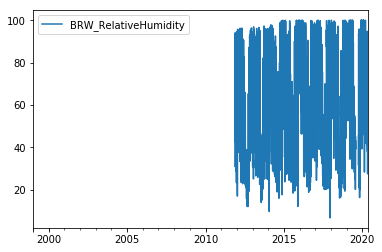

<Figure size 432x288 with 0 Axes>

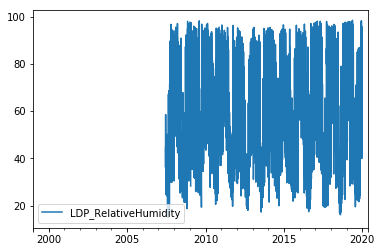

<Figure size 432x288 with 0 Axes>

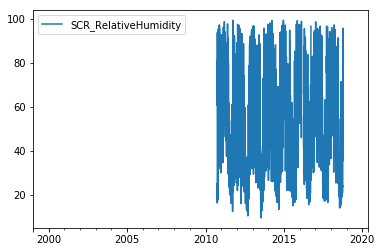

<Figure size 432x288 with 0 Axes>

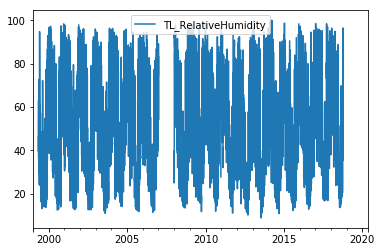

<Figure size 432x288 with 0 Axes>

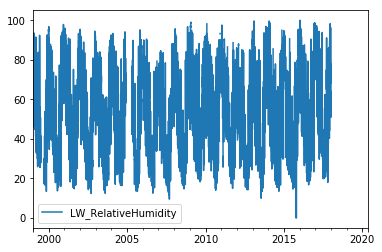

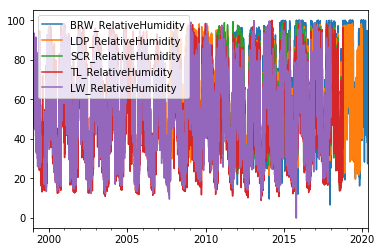

In [45]:
# create a new dataframe and put all the data into it, this is to avoid missing index since the new df has continuous idnex
# check the unit of variable here! RelativeHumidity unit should be %

indexUnique = pd.date_range(str(prep.index[0]), str(prep.index[-1]))  
ready_columns = pd.unique(prep.columns)  
siteList = ready_columns
nan_values = np.nan*np.ones([len(indexUnique),len(ready_columns)])
df = pd.DataFrame(nan_values, index=indexUnique, columns = ready_columns) 

plt.figure(figsize=(10,4))
for i in np.arange(len(ready_columns)):  
    print(siteList[i])            
    site = siteList[i]     
    tab = prep[site]
    for j in np.arange(len(prep)):  
        df.loc[tab.index[j]][ready_columns[i]] = tab[j]  # convert to the right unit
    plt.figure()
    df[[site]].plot()

df = threC(df,'RelativeHumidity')  
RelativeHumidity = copy.deepcopy(df)
RelativeHumidity.plot()

### 6. WindDirection

,BRW_WindDirection
DateTime,
2011-01-01 00:00:00,NaN
2011-01-01 01:00:00,NaN


(82045, 1)
2011-01-01 00:00:00 2020-05-11 12:00:00


,LDP_WindDirection
DateTime,
2007-01-01 00:00:00,NaN
2007-01-01 01:00:00,NaN


(113979, 1)
2007-01-01 00:00:00 2019-12-31 23:00:00


,SCR_WindDirection
DateTime,
2010-01-01 00:00:00,NaN
2010-01-01 01:00:00,NaN


(77876, 1)
2010-01-01 00:00:00 2018-10-15 13:00:00


,TL_WindDirection
DateTime,
1999-01-01 00:00:00,NaN
1999-01-01 01:00:00,NaN


(173623, 1)
1999-01-01 00:00:00 2018-10-15 12:00:00


,LW_WindDirection
DateTime,
1999-01-01 00:00:00,320.7
1999-01-01 01:00:00,318.4


(182343, 1)
1999-01-01 00:00:00 2018-10-15 13:00:00
['BRW_WindDirection', datetime.date(2012, 2, 11)]
nan ratio is 0.08333333333333333 , groupby value is 264.1136363636363
['BRW_WindDirection', datetime.date(2012, 3, 2)]
nan ratio is 0.08333333333333333 , groupby value is 187.5818181818182
['BRW_WindDirection', datetime.date(2012, 3, 3)]
nan ratio is 0.08333333333333333 , groupby value is 336.6045454545455
['BRW_WindDirection', datetime.date(2012, 3, 15)]
nan ratio is 0.08333333333333333 , groupby value is 165.3227272727273
['BRW_WindDirection', datetime.date(2012, 3, 30)]
nan ratio is 0.041666666666666664 , groupby value is 209.92608695652174
['BRW_WindDirection', datetime.date(2012, 4, 17)]
nan ratio is 0.08333333333333333 , groupby value is 277.70454545454544
['BRW_WindDirection', datetime.date(2012, 6, 2)]
nan ratio is 0.041666666666666664 , groupby value is 256.9956521739131
['BRW_WindDirection', datetime.date(2012, 10, 27)]
nan ratio is 0.041666666666666664 , groupby value is 329

['LDP_WindDirection', datetime.date(2008, 3, 5)]
nan ratio is 0.041666666666666664 , groupby value is 182.3695652173913
['LDP_WindDirection', datetime.date(2008, 3, 6)]
nan ratio is 0.041666666666666664 , groupby value is 213.7521739130435
['LDP_WindDirection', datetime.date(2008, 4, 10)]
nan ratio is 0.08333333333333333 , groupby value is 248.1363636363636
['LDP_WindDirection', datetime.date(2008, 4, 16)]
nan ratio is 0.041666666666666664 , groupby value is 242.0434782608696
['LDP_WindDirection', datetime.date(2008, 5, 8)]
nan ratio is 0.041666666666666664 , groupby value is 265.27826086956526
['LDP_WindDirection', datetime.date(2008, 5, 13)]
nan ratio is 0.041666666666666664 , groupby value is 245.72173913043477
['LDP_WindDirection', datetime.date(2008, 5, 14)]
nan ratio is 0.041666666666666664 , groupby value is 252.6913043478261
['LDP_WindDirection', datetime.date(2008, 5, 15)]
nan ratio is 0.041666666666666664 , groupby value is 189.02608695652177
['LDP_WindDirection', datetime.da

['LDP_WindDirection', datetime.date(2010, 4, 1)]
nan ratio is 0.041666666666666664 , groupby value is 253.3608695652173
['LDP_WindDirection', datetime.date(2010, 4, 7)]
nan ratio is 0.041666666666666664 , groupby value is 200.6869565217391
['LDP_WindDirection', datetime.date(2010, 4, 17)]
nan ratio is 0.041666666666666664 , groupby value is 181.98695652173916
['LDP_WindDirection', datetime.date(2010, 4, 24)]
nan ratio is 0.041666666666666664 , groupby value is 232.87826086956514
['LDP_WindDirection', datetime.date(2010, 4, 28)]
nan ratio is 0.041666666666666664 , groupby value is 275.6217391304348
['LDP_WindDirection', datetime.date(2010, 5, 7)]
nan ratio is 0.041666666666666664 , groupby value is 150.5086956521739
['LDP_WindDirection', datetime.date(2010, 5, 9)]
nan ratio is 0.08333333333333333 , groupby value is 194.67727272727276
['LDP_WindDirection', datetime.date(2010, 6, 24)]
nan ratio is 0.041666666666666664 , groupby value is 169.9695652173913
['LDP_WindDirection', datetime.dat

['LDP_WindDirection', datetime.date(2011, 11, 25)]
nan ratio is 0.041666666666666664 , groupby value is 214.53478260869565
['LDP_WindDirection', datetime.date(2011, 11, 28)]
nan ratio is 0.041666666666666664 , groupby value is 260.7217391304348
['LDP_WindDirection', datetime.date(2011, 12, 1)]
nan ratio is 0.041666666666666664 , groupby value is 163.42608695652171
['LDP_WindDirection', datetime.date(2011, 12, 4)]
nan ratio is 0.041666666666666664 , groupby value is 146.10434782608692
['LDP_WindDirection', datetime.date(2011, 12, 6)]
nan ratio is 0.041666666666666664 , groupby value is 210.13478260869567
['LDP_WindDirection', datetime.date(2011, 12, 20)]
nan ratio is 0.08333333333333333 , groupby value is 184.37727272727273
['LDP_WindDirection', datetime.date(2011, 12, 21)]
nan ratio is 0.041666666666666664 , groupby value is 110.01739130434783
['LDP_WindDirection', datetime.date(2011, 12, 22)]
nan ratio is 0.041666666666666664 , groupby value is 210.42608695652171
['LDP_WindDirection',

['LDP_WindDirection', datetime.date(2014, 8, 1)]
nan ratio is 0.041666666666666664 , groupby value is 158.18695652173915
['LDP_WindDirection', datetime.date(2014, 8, 10)]
nan ratio is 0.041666666666666664 , groupby value is 152.8173913043478
['LDP_WindDirection', datetime.date(2014, 8, 15)]
nan ratio is 0.041666666666666664 , groupby value is 237.43043478260873
['LDP_WindDirection', datetime.date(2014, 8, 23)]
nan ratio is 0.041666666666666664 , groupby value is 175.39130434782606
['LDP_WindDirection', datetime.date(2014, 8, 28)]
nan ratio is 0.041666666666666664 , groupby value is 189.6869565217391
['LDP_WindDirection', datetime.date(2014, 9, 2)]
nan ratio is 0.041666666666666664 , groupby value is 193.50000000000003
['LDP_WindDirection', datetime.date(2014, 9, 5)]
nan ratio is 0.041666666666666664 , groupby value is 149.3391304347826
['LDP_WindDirection', datetime.date(2014, 9, 11)]
nan ratio is 0.041666666666666664 , groupby value is 169.2826086956522
['LDP_WindDirection', datetime.

,BRW_WindDirection,LDP_WindDirection,SCR_WindDirection,TL_WindDirection,LW_WindDirection
1999-01-01,NaN,NaN,NaN,NaN,239.271
1999-01-02,NaN,NaN,NaN,NaN,169.618


,BRW_WindDirection,LDP_WindDirection,SCR_WindDirection,TL_WindDirection,LW_WindDirection
2020-05-10,1.16987,NaN,NaN,NaN,NaN
2020-05-11,1.65531,NaN,NaN,NaN,NaN


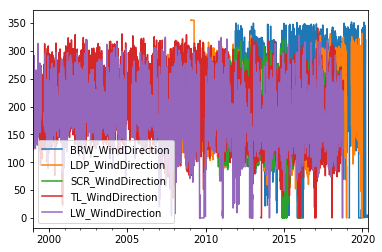

In [46]:
# extarct variable data
BRW_WD = BRW_met[['BRW_WindDirection']]
LDP_WD = LDP_met[['LDP_WindDirection']]
SCR_WD = SCR_met[['SCR_WindDirection']]
TL_WD = TL_met[['TL_WindDirection']]
LW_WD = LW_met[['LW_WindDirection']]

df_lst = [BRW_WD, LDP_WD, SCR_WD, TL_WD, LW_WD]
for df in df_lst:     
    threC(df,'WindDirection') # modify the dataframe and set unphysical values to NAN
    df.index = pd.to_datetime(df.index,errors = 'coerce')
    display(df.head(2))
    print(df.shape)
    print(df.index[0],df.index[-1])
    
prep = aggre_and_comb_daily(df_lst, axis=1, func = "mean") 
prep.plot()

BRW_WindDirection
LDP_WindDirection
SCR_WindDirection
TL_WindDirection
LW_WindDirection


<Figure size 720x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

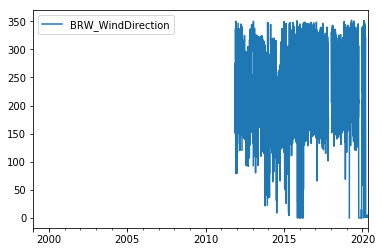

<Figure size 432x288 with 0 Axes>

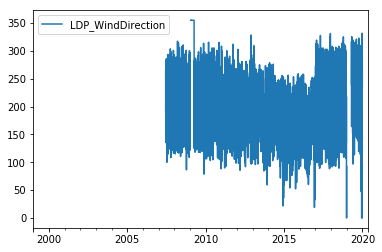

<Figure size 432x288 with 0 Axes>

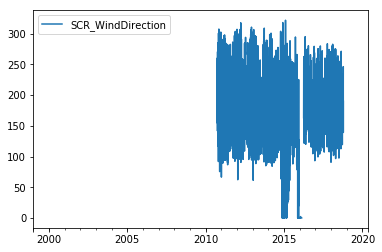

<Figure size 432x288 with 0 Axes>

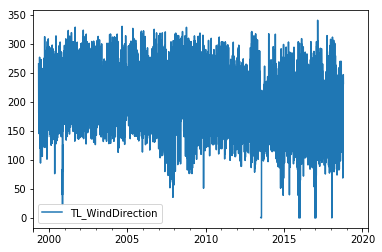

<Figure size 432x288 with 0 Axes>

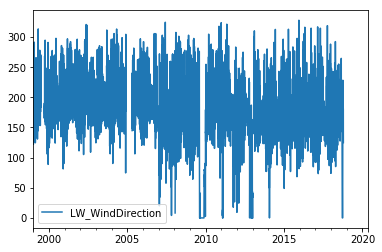

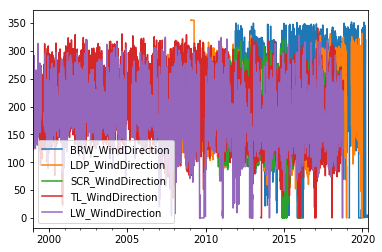

In [47]:
# create a new dataframe and put all the data into it, this is to avoid missing index since the new df has continuous idnex
# check the unit of variable here! WindDirection unit should be degree

indexUnique = pd.date_range(str(prep.index[0]), str(prep.index[-1]))  
ready_columns = pd.unique(prep.columns)  
siteList = ready_columns
nan_values = np.nan*np.ones([len(indexUnique),len(ready_columns)])
df = pd.DataFrame(nan_values, index=indexUnique, columns = ready_columns) 

plt.figure(figsize=(10,4))
for i in np.arange(len(ready_columns)):  
    print(siteList[i])            
    site = siteList[i]     
    tab = prep[site]
    for j in np.arange(len(prep)):  
        df.loc[tab.index[j]][ready_columns[i]] = tab[j]  # convert to the right unit
    plt.figure()
    df[[site]].plot()

df = threC(df,'WindDirection')  
WindDirection = copy.deepcopy(df)
WindDirection.plot()

### 7. WindSpeed

,BRW_WindSpeed
DateTime,
2011-01-01 00:00:00,NaN
2011-01-01 01:00:00,NaN


(82045, 1)
2011-01-01 00:00:00 2020-05-11 12:00:00


,LDP_WindSpeed
DateTime,
2007-01-01 00:00:00,NaN
2007-01-01 01:00:00,NaN


(113979, 1)
2007-01-01 00:00:00 2019-12-31 23:00:00


,SCR_WindSpeed
DateTime,
2010-01-01 00:00:00,NaN
2010-01-01 01:00:00,NaN


(77876, 1)
2010-01-01 00:00:00 2018-10-15 13:00:00


,TL_WindSpeed
DateTime,
1999-01-01 00:00:00,NaN
1999-01-01 01:00:00,NaN


(173623, 1)
1999-01-01 00:00:00 2018-10-15 12:00:00


,LW_WindSpeed
DateTime,
1999-01-01 00:00:00,3.33
1999-01-01 01:00:00,5.10


(182343, 1)
1999-01-01 00:00:00 2018-10-15 13:00:00
['BRW_WindSpeed', datetime.date(2012, 2, 11)]
nan ratio is 0.08333333333333333 , groupby value is 1.5472727272727271
['BRW_WindSpeed', datetime.date(2012, 3, 2)]
nan ratio is 0.08333333333333333 , groupby value is 3.210909090909091
['BRW_WindSpeed', datetime.date(2012, 3, 3)]
nan ratio is 0.08333333333333333 , groupby value is 3.1840909090909095
['BRW_WindSpeed', datetime.date(2012, 3, 15)]
nan ratio is 0.08333333333333333 , groupby value is 1.8300000000000003
['BRW_WindSpeed', datetime.date(2012, 3, 30)]
nan ratio is 0.041666666666666664 , groupby value is 2.4560869565217387
['BRW_WindSpeed', datetime.date(2012, 4, 17)]
nan ratio is 0.08333333333333333 , groupby value is 2.419545454545455
['BRW_WindSpeed', datetime.date(2012, 6, 2)]
nan ratio is 0.041666666666666664 , groupby value is 2.300869565217391
['BRW_WindSpeed', datetime.date(2012, 10, 27)]
nan ratio is 0.041666666666666664 , groupby value is 2.6273913043478263
['BRW_WindSpee

['LDP_WindSpeed', datetime.date(2014, 10, 2)]
nan ratio is 0.041666666666666664 , groupby value is 0.8504347826086956
['LDP_WindSpeed', datetime.date(2016, 9, 7)]
nan ratio is 0.041666666666666664 , groupby value is 4.263478260869566
['LDP_WindSpeed', datetime.date(2016, 9, 20)]
nan ratio is 0.041666666666666664 , groupby value is 2.7747826086956526
['LDP_WindSpeed', datetime.date(2016, 9, 29)]
nan ratio is 0.041666666666666664 , groupby value is 3.636956521739131
['LDP_WindSpeed', datetime.date(2017, 8, 24)]
nan ratio is 0.041666666666666664 , groupby value is 1.7826086956521743
['LDP_WindSpeed', datetime.date(2017, 12, 9)]
nan ratio is 0.041666666666666664 , groupby value is 0.9391304347826086
['LDP_WindSpeed', datetime.date(2019, 6, 23)]
nan ratio is 0.041666666666666664 , groupby value is 2.162608695652174
['SCR_WindSpeed', datetime.date(2010, 10, 14)]
nan ratio is 0.041666666666666664 , groupby value is 3.5260869565217394
['SCR_WindSpeed', datetime.date(2010, 10, 19)]
nan ratio is

,BRW_WindSpeed,LDP_WindSpeed,SCR_WindSpeed,TL_WindSpeed,LW_WindSpeed
1999-01-01,NaN,NaN,NaN,NaN,2.6075
1999-01-02,NaN,NaN,NaN,NaN,2.22125


,BRW_WindSpeed,LDP_WindSpeed,SCR_WindSpeed,TL_WindSpeed,LW_WindSpeed
2020-05-10,0,NaN,NaN,NaN,NaN
2020-05-11,0,NaN,NaN,NaN,NaN


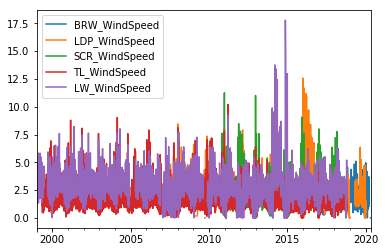

In [48]:
# extarct variable data
BRW_WS = BRW_met[['BRW_WindSpeed']]
LDP_WS = LDP_met[['LDP_WindSpeed']]
SCR_WS = SCR_met[['SCR_WindSpeed']]
TL_WS = TL_met[['TL_WindSpeed']]
LW_WS = LW_met[['LW_WindSpeed']]

df_lst = [BRW_WS, LDP_WS, SCR_WS, TL_WS, LW_WS]
for df in df_lst:     
    threC(df,'WindSpeed') # modify the dataframe and set unphysical values to NAN
    df.index = pd.to_datetime(df.index,errors = 'coerce')
    display(df.head(2))
    print(df.shape)
    print(df.index[0],df.index[-1])
    
prep = aggre_and_comb_daily(df_lst, axis=1, func = "mean") 
prep.plot()

BRW_WindSpeed
LDP_WindSpeed
SCR_WindSpeed
TL_WindSpeed
LW_WindSpeed


,BRW_WindSpeed,LDP_WindSpeed,SCR_WindSpeed,TL_WindSpeed,LW_WindSpeed
1999-01-01,NaN,NaN,NaN,NaN,2.60750
1999-01-02,NaN,NaN,NaN,NaN,2.22125


<Figure size 720x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

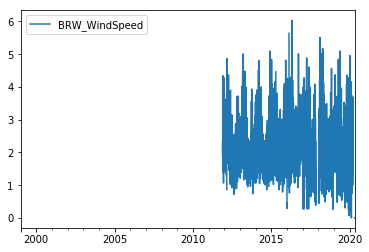

<Figure size 432x288 with 0 Axes>

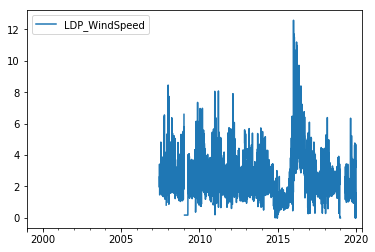

<Figure size 432x288 with 0 Axes>

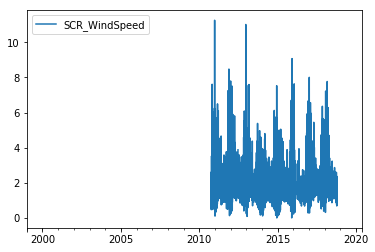

<Figure size 432x288 with 0 Axes>

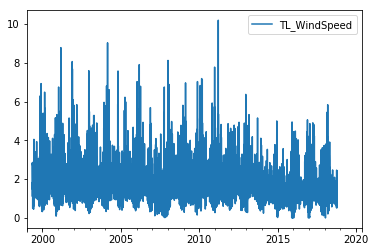

<Figure size 432x288 with 0 Axes>

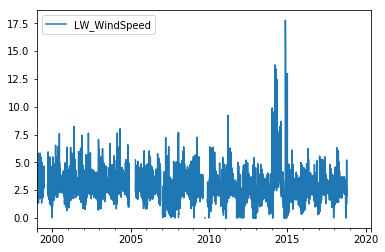

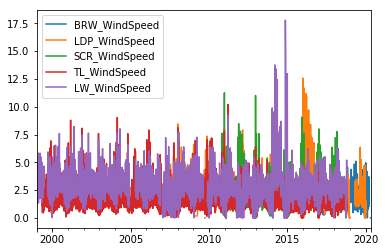

In [49]:
# create a new dataframe and put all the data into it, this is to avoid missing index since the new df has continuous idnex
# check the unit of variable here! WindSpeed unit should be m/s

indexUnique = pd.date_range(str(prep.index[0]), str(prep.index[-1]))  
ready_columns = pd.unique(prep.columns)  
siteList = ready_columns
nan_values = np.nan*np.ones([len(indexUnique),len(ready_columns)])
df = pd.DataFrame(nan_values, index=indexUnique, columns = ready_columns) 

plt.figure(figsize=(10,4))
for i in np.arange(len(ready_columns)):  
    print(siteList[i])            
    site = siteList[i]     
    tab = prep[site]
    for j in np.arange(len(prep)):  
        df.loc[tab.index[j]][ready_columns[i]] = tab[j]  # convert to the right unit
    plt.figure()
    df[[site]].plot()
    
df = threC(df,'WindSpeed')  
WindSpeed = copy.deepcopy(df)
WindSpeed.plot()
WindSpeed.head(2)

### 8. SWE

### 9. SnowDepth

,BRW_SnowDepth
DateTime,
2011-01-01 00:00:00,NaN
2011-01-01 01:00:00,NaN


(82045, 1)
2011-01-01 00:00:00 2020-05-11 12:00:00


,LDP_SnowDepth
DateTime,
2007-01-01 00:00:00,NaN
2007-01-01 01:00:00,NaN


(113979, 1)
2007-01-01 00:00:00 2019-12-31 23:00:00


,SCR_SnowDepth
DateTime,
2010-01-01 00:00:00,NaN
2010-01-01 01:00:00,NaN


(77876, 1)
2010-01-01 00:00:00 2018-10-15 13:00:00


,TL_SnowDepth
DateTime,
1999-01-01 00:00:00,NaN
1999-01-01 01:00:00,NaN


(173623, 1)
1999-01-01 00:00:00 2018-10-15 12:00:00


,LW_SnowDepth
DateTime,
1999-01-01 00:00:00,0.45
1999-01-01 01:00:00,0.52


(182343, 1)
1999-01-01 00:00:00 2018-10-15 13:00:00
['BRW_SnowDepth', datetime.date(2012, 5, 12)]
nan ratio is 0.08333333333333333 , groupby value is 7.828501414227275
['BRW_SnowDepth', datetime.date(2016, 2, 5)]
nan ratio is 0.041666666666666664 , groupby value is 140.06521739130432
['BRW_SnowDepth', datetime.date(2018, 5, 4)]
nan ratio is 0.041666666666666664 , groupby value is 0.09130434782608696
['LDP_SnowDepth', datetime.date(2010, 1, 16)]
nan ratio is 0.041666666666666664 , groupby value is 57.06478260869565
['LDP_SnowDepth', datetime.date(2010, 1, 18)]
nan ratio is 0.041666666666666664 , groupby value is 56.460434782608694
['LDP_SnowDepth', datetime.date(2010, 1, 26)]
nan ratio is 0.08333333333333333 , groupby value is 76.51818181818179
['LDP_SnowDepth', datetime.date(2010, 1, 30)]
nan ratio is 0.041666666666666664 , groupby value is 73.8086956521739
['LDP_SnowDepth', datetime.date(2010, 2, 5)]
nan ratio is 0.041666666666666664 , groupby value is 82.53043478260868
['LDP_SnowDept

['LDP_SnowDepth', datetime.date(2018, 10, 18)]
nan ratio is 0.041666666666666664 , groupby value is 1.9060869565217387
['LDP_SnowDepth', datetime.date(2018, 11, 15)]
nan ratio is 0.08333333333333333 , groupby value is 1.938636363636364
['LDP_SnowDepth', datetime.date(2018, 11, 18)]
nan ratio is 0.041666666666666664 , groupby value is 1.7278260869565218
['LDP_SnowDepth', datetime.date(2019, 6, 23)]
nan ratio is 0.041666666666666664 , groupby value is 215.5565217391304
['LDP_SnowDepth', datetime.date(2019, 10, 7)]
nan ratio is 0.041666666666666664 , groupby value is 1.2073913043478257
['LDP_SnowDepth', datetime.date(2019, 10, 13)]
nan ratio is 0.041666666666666664 , groupby value is 1.2826086956521738
['LDP_SnowDepth', datetime.date(2019, 10, 24)]
nan ratio is 0.041666666666666664 , groupby value is 1.2865217391304349
['LDP_SnowDepth', datetime.date(2019, 10, 25)]
nan ratio is 0.041666666666666664 , groupby value is 1.246086956521739
['LDP_SnowDepth', datetime.date(2019, 10, 30)]
nan rat

['SCR_SnowDepth', datetime.date(2018, 8, 1)]
nan ratio is 0.08333333333333333 , groupby value is 4.565909090909091
['SCR_SnowDepth', datetime.date(2018, 8, 3)]
nan ratio is 0.041666666666666664 , groupby value is 5.833043478260869
['SCR_SnowDepth', datetime.date(2018, 8, 4)]
nan ratio is 0.08333333333333333 , groupby value is 5.289545454545453
['SCR_SnowDepth', datetime.date(2018, 8, 5)]
nan ratio is 0.08333333333333333 , groupby value is 5.8104545454545455
['SCR_SnowDepth', datetime.date(2018, 8, 6)]
nan ratio is 0.041666666666666664 , groupby value is 6.207391304347826
['SCR_SnowDepth', datetime.date(2018, 8, 7)]
nan ratio is 0.041666666666666664 , groupby value is 5.454782608695652
['SCR_SnowDepth', datetime.date(2018, 8, 10)]
nan ratio is 0.041666666666666664 , groupby value is 4.741304347826087
['SCR_SnowDepth', datetime.date(2018, 8, 17)]
nan ratio is 0.041666666666666664 , groupby value is 5.95086956521739
['SCR_SnowDepth', datetime.date(2018, 8, 18)]
nan ratio is 0.041666666666

['TL_SnowDepth', datetime.date(2009, 3, 25)]
nan ratio is 0.041666666666666664 , groupby value is 26.84391304347826
['TL_SnowDepth', datetime.date(2010, 1, 1)]
nan ratio is 0.08333333333333333 , groupby value is 49.06318181818181
['TL_SnowDepth', datetime.date(2010, 1, 19)]
nan ratio is 0.08333333333333333 , groupby value is 36.273181818181804
['TL_SnowDepth', datetime.date(2010, 1, 24)]
nan ratio is 0.041666666666666664 , groupby value is 48.54869565217391
['TL_SnowDepth', datetime.date(2010, 3, 13)]
nan ratio is 0.08333333333333333 , groupby value is 54.302727272727275
['TL_SnowDepth', datetime.date(2010, 3, 26)]
nan ratio is 0.08333333333333333 , groupby value is 15.747272727272724
['TL_SnowDepth', datetime.date(2011, 2, 25)]
nan ratio is 0.08333333333333333 , groupby value is 41.063181818181825
['TL_SnowDepth', datetime.date(2011, 3, 7)]
nan ratio is 0.08333333333333333 , groupby value is 41.44318181818182
['TL_SnowDepth', datetime.date(2011, 3, 8)]
nan ratio is 0.08333333333333333

['LW_SnowDepth', datetime.date(2013, 2, 28)]
nan ratio is 0.041666666666666664 , groupby value is 7.30608695652174
['LW_SnowDepth', datetime.date(2014, 9, 19)]
nan ratio is 0.041666666666666664 , groupby value is 2.2265217391304346
['LW_SnowDepth', datetime.date(2014, 9, 23)]
nan ratio is 0.041666666666666664 , groupby value is 1.6408695652173915
['LW_SnowDepth', datetime.date(2015, 9, 18)]
nan ratio is 0.041666666666666664 , groupby value is 0.0
['LW_SnowDepth', datetime.date(2018, 1, 24)]
nan ratio is 0.08333333333333333 , groupby value is 0.8786363636363639
['LW_SnowDepth', datetime.date(2018, 2, 20)]
nan ratio is 0.041666666666666664 , groupby value is 0.767391304347826
['LW_SnowDepth', datetime.date(2018, 2, 22)]
nan ratio is 0.08333333333333333 , groupby value is 14.264545454545454
['LW_SnowDepth', datetime.date(2018, 5, 5)]
nan ratio is 0.041666666666666664 , groupby value is 0.9060869565217393
['LW_SnowDepth', datetime.date(2018, 5, 7)]
nan ratio is 0.041666666666666664 , group

,BRW_SnowDepth,LDP_SnowDepth,SCR_SnowDepth,TL_SnowDepth,LW_SnowDepth
1999-01-01,NaN,NaN,NaN,NaN,0.731667
1999-01-02,NaN,NaN,NaN,NaN,0.340833


,BRW_SnowDepth,LDP_SnowDepth,SCR_SnowDepth,TL_SnowDepth,LW_SnowDepth
2020-05-10,NaN,NaN,NaN,NaN,NaN
2020-05-11,NaN,NaN,NaN,NaN,NaN


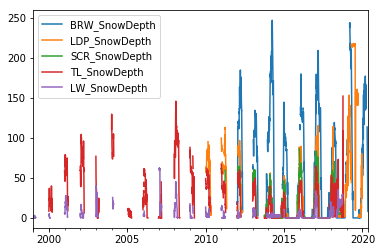

In [50]:
# extract variable data
BRW_SD = BRW_met[['BRW_SnowDepth']]
LDP_SD = LDP_met[['LDP_SnowDepth']]
SCR_SD = SCR_met[['SCR_SnowDepth']]
TL_SD = TL_met[['TL_SnowDepth']]
LW_SD = LW_met[['LW_SnowDepth']]

df_lst = [BRW_SD, LDP_SD, SCR_SD, TL_SD, LW_SD]
for df in df_lst:     
    threC(df,'SnowDepth') # modify the dataframe and set unphysical values to NAN
    df.index = pd.to_datetime(df.index,errors = 'coerce')
    display(df.head(2))
    print(df.shape)
    print(df.index[0],df.index[-1])
    
prep = aggre_and_comb_daily(df_lst, axis=1, func = "mean") 
prep.plot()

BRW_SnowDepth
LDP_SnowDepth
SCR_SnowDepth
TL_SnowDepth
LW_SnowDepth


<Figure size 720x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

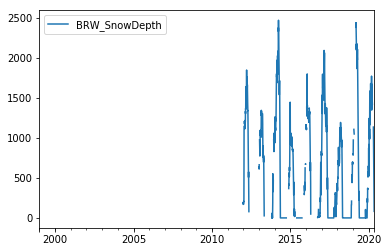

<Figure size 432x288 with 0 Axes>

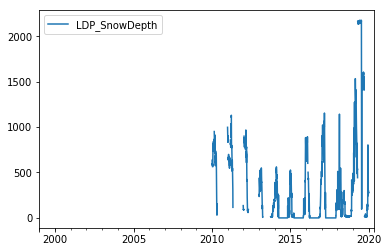

<Figure size 432x288 with 0 Axes>

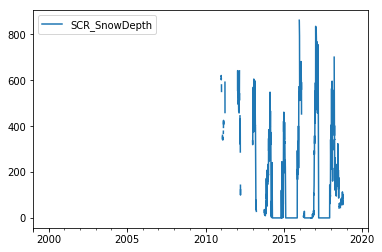

<Figure size 432x288 with 0 Axes>

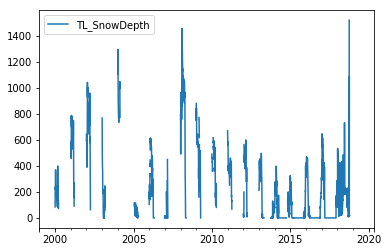

<Figure size 432x288 with 0 Axes>

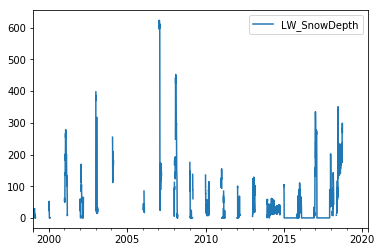

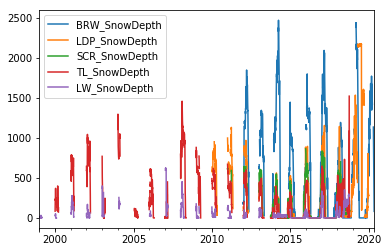

In [51]:
# create a new dataframe and put all the data into it, this is to avoid missing index since the new df has continuous idnex
# check the unit of variable here! Snowdepth unit should be mm

indexUnique = pd.date_range(str(prep.index[0]), str(prep.index[-1]))  
ready_columns = pd.unique(prep.columns)  
siteList = ready_columns
nan_values = np.nan*np.ones([len(indexUnique),len(ready_columns)])
df = pd.DataFrame(nan_values, index=indexUnique, columns = ready_columns) 

plt.figure(figsize=(10,4))
for i in np.arange(len(ready_columns)):  
    print(siteList[i])            
    site = siteList[i]     
    tab = prep[site]
    for j in np.arange(len(prep)):  
        df.loc[tab.index[j]][ready_columns[i]] = tab[j]*10  # convert to the right unit to mm
    plt.figure()
    df[[site]].plot()
    
df = threC(df,'SnowDepth')  
SnowDepth = copy.deepcopy(df)
SnowDepth.plot()

### 10. VaporPressure

### 11. SoilMoisture

In [52]:
BRW_SM = BRW_soil[[i for i in BRW_soil.columns if i.split('_')[1] == 'SoilMoisture']]
LDP_SM = LDP_soil[[i for i in LDP_soil.columns if i.split('_')[1] == 'SoilMoisture']]
SCR_SM = SCR_soil[[i for i in SCR_soil.columns if i.split('_')[1] == 'SoilMoisture']]
TL_SM = TL_soil[[i for i in TL_soil.columns if i.split('_')[1] == 'SoilMoisture']]
LW_SM = LW_soil[[i for i in LW_soil.columns if i.split('_')[1] == 'SoilMoisture']]
HN_SM = HN_soil[[i for i in HN_soil.columns if i.split('_')[1] == 'SoilMoisture']]
HS_SM = HS_soil[[i for i in HS_soil.columns if i.split('_')[1] == 'SoilMoisture']]
MHN_SM = MHN_soil[[i for i in MHN_soil.columns if i.split('_')[1] == 'SoilMoisture']]
MHS_SM = MHS_soil[[i for i in MHS_soil.columns if i.split('_')[1] == 'SoilMoisture']]
MLN_SM = MLN_soil[[i for i in MLN_soil.columns if i.split('_')[1] == 'SoilMoisture']]
MLS_SM = MLS_soil[[i for i in MLS_soil.columns if i.split('_')[1] == 'SoilMoisture']]
LN_SM = LN_soil[[i for i in LN_soil.columns if i.split('_')[1] == 'SoilMoisture']]
LS_SM = LS_soil[[i for i in LS_soil.columns if i.split('_')[1] == 'SoilMoisture']]

,BRW_SoilMoisture_L_5cm,BRW_SoilMoisture_L_15cm,BRW_SoilMoisture_L_30cm,BRW_SoilMoisture_L_81cm,BRW_SoilMoisture_U_5cm,BRW_SoilMoisture_U_15cm,BRW_SoilMoisture_U_30cm,BRW_SoilMoisture_U_55cm
DateTime,,,,,,,,
11/24/2012 10:00,0.184,0.204,0.19,0.083,0.086,0.156,0.208,0.109
11/24/2012 10:15,0.180,0.202,0.19,0.083,0.088,0.156,0.208,0.109


,BRW_SoilMoisture_L_5cm,BRW_SoilMoisture_L_15cm,BRW_SoilMoisture_L_30cm,BRW_SoilMoisture_L_81cm,BRW_SoilMoisture_U_5cm,BRW_SoilMoisture_U_15cm,BRW_SoilMoisture_U_30cm,BRW_SoilMoisture_U_55cm
DateTime,,,,,,,,
2012-11-24 10:00:00,0.184,0.204,0.19,0.083,0.086,0.156,0.208,0.109
2012-11-24 10:15:00,0.180,0.202,0.19,0.083,0.088,0.156,0.208,0.109


(44461, 8)
2012-11-24 10:00:00 2018-01-05 12:00:00


,LDP_SoilMoisture_W_8cm,LDP_SoilMoisture_E_8cm
DateTime,,
1/1/2007 0:00,-6999.0,-6999.0
1/1/2007 1:00,-6999.0,-6999.0


,LDP_SoilMoisture_W_8cm,LDP_SoilMoisture_E_8cm
DateTime,,
2007-01-01 00:00:00,NaN,NaN
2007-01-01 01:00:00,NaN,NaN


(96432, 2)
2007-01-01 00:00:00 2017-12-31 23:00:00


,SCR_SoilMoisture_5cm
DateTime,
1/1/2012 0:00,-6999.0
1/1/2012 1:00,-6999.0


,SCR_SoilMoisture_5cm
DateTime,
2012-01-01 00:00:00,NaN
2012-01-01 01:00:00,NaN


(55978, 1)
2012-01-01 00:00:00 2018-05-21 09:00:00


,TL_SoilMoisture_P3_5cm,TL_SoilMoisture_P3_15cm,TL_SoilMoisture_P3_30cm,TL_SoilMoisture_P3_60cm,TL_SoilMoisture_P3_100cm,TL_SoilMoisture_P4_5cm,TL_SoilMoisture_P4_15cm,TL_SoilMoisture_P4_30cm,TL_SoilMoisture_P4_45cm,TL_SoilMoisture_P4_65cm
1/1/1999 0:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0
1/1/1999 1:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0


,TL_SoilMoisture_P3_5cm,TL_SoilMoisture_P3_15cm,TL_SoilMoisture_P3_30cm,TL_SoilMoisture_P3_60cm,TL_SoilMoisture_P3_100cm,TL_SoilMoisture_P4_5cm,TL_SoilMoisture_P4_15cm,TL_SoilMoisture_P4_30cm,TL_SoilMoisture_P4_45cm,TL_SoilMoisture_P4_65cm
1999-01-01 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1999-01-01 01:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


(166814, 10)
1999-01-01 00:00:00 2017-12-31 23:00:00


,LW_SoilMoisture_P1_5cm,LW_SoilMoisture_P1_15cm,LW_SoilMoisture_P1_30cm,LW_SoilMoisture_P1_50cm,LW_SoilMoisture_P1_100cm,LW_SoilMoisture_P2_5cm,LW_SoilMoisture_P2_15cm,LW_SoilMoisture_P2_30cm,LW_SoilMoisture_P2_60cm,LW_SoilMoisture_P2_100cm
DateTime,,,,,,,,,,
01/01/1999 00:00,0.239,0.259,0.238,0.039,0.076,0.289,0.280,0.157,0.01,0.057
01/01/1999 01:00,0.239,0.259,0.238,0.039,0.076,0.285,0.279,0.158,0.01,0.057


,LW_SoilMoisture_P1_5cm,LW_SoilMoisture_P1_15cm,LW_SoilMoisture_P1_30cm,LW_SoilMoisture_P1_50cm,LW_SoilMoisture_P1_100cm,LW_SoilMoisture_P2_5cm,LW_SoilMoisture_P2_15cm,LW_SoilMoisture_P2_30cm,LW_SoilMoisture_P2_60cm,LW_SoilMoisture_P2_100cm
DateTime,,,,,,,,,,
1999-01-01 00:00:00,0.239,0.259,0.238,0.039,0.076,0.289,0.280,0.157,0.01,0.057
1999-01-01 01:00:00,0.239,0.259,0.238,0.039,0.076,0.285,0.279,0.158,0.01,0.057


(175591, 10)
1999-01-01 00:00:00 2017-12-31 23:00:00


,HN_SoilMoisture_Pit1_2cm,HN_SoilMoisture_Pit1_15cm,HN_SoilMoisture_Pit1_30cm,HN_SoilMoisture_Pit1_37cmBdrk,HN_SoilMoisture_Pit2_2cm,HN_SoilMoisture_Pit2_15cm,HN_SoilMoisture_Pit2_30cm,HN_SoilMoisture_Pit2_42cmBdrk,HN_SoilMoisture_Pit3_2cm,HN_SoilMoisture_Pit3_15cm,HN_SoilMoisture_Pit3_30cm,HN_SoilMoisture_Pit3_54cmBdrk,HN_SoilMoisture_Pit4_2cm,HN_SoilMoisture_Pit4_15cm,HN_SoilMoisture_Pit4_30cm,HN_SoilMoisture_Pit4_45cmBdrk
DateTime,,,,,,,,,,,,,,,,
01/01/2008 00:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0
01/01/2008 01:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0


,HN_SoilMoisture_Pit1_2cm,HN_SoilMoisture_Pit1_15cm,HN_SoilMoisture_Pit1_30cm,HN_SoilMoisture_Pit1_37cmBdrk,HN_SoilMoisture_Pit2_2cm,HN_SoilMoisture_Pit2_15cm,HN_SoilMoisture_Pit2_30cm,HN_SoilMoisture_Pit2_42cmBdrk,HN_SoilMoisture_Pit3_2cm,HN_SoilMoisture_Pit3_15cm,HN_SoilMoisture_Pit3_30cm,HN_SoilMoisture_Pit3_54cmBdrk,HN_SoilMoisture_Pit4_2cm,HN_SoilMoisture_Pit4_15cm,HN_SoilMoisture_Pit4_30cm,HN_SoilMoisture_Pit4_45cmBdrk
DateTime,,,,,,,,,,,,,,,,
2008-01-01 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2008-01-01 01:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


(87754, 16)
2008-01-01 00:00:00 2017-12-31 23:00:00


,HS_SoilMoisture_Pit1_2cm,HS_SoilMoisture_Pit1_15cm,HS_SoilMoisture_Pit1_30cm,HS_SoilMoisture_Pit1_65cmBdrk,HS_SoilMoisture_Pit2_2cm,HS_SoilMoisture_Pit2_15cm,HS_SoilMoisture_Pit2_30cm,HS_SoilMoisture_Pit2_70cmBdrk,HS_SoilMoisture_Pit3_2cm,HS_SoilMoisture_Pit3_15cm,HS_SoilMoisture_Pit3_30cm,HS_SoilMoisture_Pit3_80cmBdrk,HS_SoilMoisture_Pit4_2cm,HS_SoilMoisture_Pit4_15cm,HS_SoilMoisture_Pit4_30cm,HS_SoilMoisture_Pit4_77cmBdrk
DateTime,,,,,,,,,,,,,,,,
1/1/2008 0:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0
1/1/2008 1:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0


,HS_SoilMoisture_Pit1_2cm,HS_SoilMoisture_Pit1_15cm,HS_SoilMoisture_Pit1_30cm,HS_SoilMoisture_Pit1_65cmBdrk,HS_SoilMoisture_Pit2_2cm,HS_SoilMoisture_Pit2_15cm,HS_SoilMoisture_Pit2_30cm,HS_SoilMoisture_Pit2_70cmBdrk,HS_SoilMoisture_Pit3_2cm,HS_SoilMoisture_Pit3_15cm,HS_SoilMoisture_Pit3_30cm,HS_SoilMoisture_Pit3_80cmBdrk,HS_SoilMoisture_Pit4_2cm,HS_SoilMoisture_Pit4_15cm,HS_SoilMoisture_Pit4_30cm,HS_SoilMoisture_Pit4_77cmBdrk
DateTime,,,,,,,,,,,,,,,,
2008-01-01 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2008-01-01 01:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


(87648, 16)
2008-01-01 00:00:00 2017-12-31 23:00:00


,MHN_SoilMoisture_Pit1_2cm,MHN_SoilMoisture_Pit1_15cm,MHN_SoilMoisture_Pit1_30cm,MHN_SoilMoisture_Pit1_71cmBdrk,MHN_SoilMoisture_Pit2_2cm,MHN_SoilMoisture_Pit2_15cm,MHN_SoilMoisture_Pit2_30cm,MHN_SoilMoisture_Pit2_97cmBdrk,MHN_SoilMoisture_Pit3_2cm,MHN_SoilMoisture_Pit3_15cm,MHN_SoilMoisture_Pit3_30cm,MHN_SoilMoisture_Pit3_52cmBdrk,MHN_SoilMoisture_Pit4_2cm,MHN_SoilMoisture_Pit4_15cm,MHN_SoilMoisture_Pit4_30cm,MHN_SoilMoisture_Pit4_74cmBdrk
DateTime,,,,,,,,,,,,,,,,
01/01/2008 00:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0
01/01/2008 01:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0


,MHN_SoilMoisture_Pit1_2cm,MHN_SoilMoisture_Pit1_15cm,MHN_SoilMoisture_Pit1_30cm,MHN_SoilMoisture_Pit1_71cmBdrk,MHN_SoilMoisture_Pit2_2cm,MHN_SoilMoisture_Pit2_15cm,MHN_SoilMoisture_Pit2_30cm,MHN_SoilMoisture_Pit2_97cmBdrk,MHN_SoilMoisture_Pit3_2cm,MHN_SoilMoisture_Pit3_15cm,MHN_SoilMoisture_Pit3_30cm,MHN_SoilMoisture_Pit3_52cmBdrk,MHN_SoilMoisture_Pit4_2cm,MHN_SoilMoisture_Pit4_15cm,MHN_SoilMoisture_Pit4_30cm,MHN_SoilMoisture_Pit4_74cmBdrk
DateTime,,,,,,,,,,,,,,,,
2008-01-01 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2008-01-01 01:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


(87754, 16)
2008-01-01 00:00:00 2017-12-31 23:00:00


,MHS_SoilMoisture_Pit1_2cm,MHS_SoilMoisture_Pit1_15cm,MHS_SoilMoisture_Pit1_30cm,MHS_SoilMoisture_Pit1_70cmBdrk,MHS_SoilMoisture_Pit2_2cm,MHS_SoilMoisture_Pit2_15cm,MHS_SoilMoisture_Pit2_30cm,MHS_SoilMoisture_Pit2_59cmBdrk,MHS_SoilMoisture_Pit3_2cm,MHS_SoilMoisture_Pit3_15cm,MHS_SoilMoisture_Pit3_30cm,MHS_SoilMoisture_Pit3_60cmBdrk,MHS_SoilMoisture_Pit4_2cm,MHS_SoilMoisture_Pit4_15cm,MHS_SoilMoisture_Pit4_30cm,MHS_SoilMoisture_Pit4_50cmBdrk
DateTime,,,,,,,,,,,,,,,,
01/01/2008 00:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0
01/01/2008 01:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0


,MHS_SoilMoisture_Pit1_2cm,MHS_SoilMoisture_Pit1_15cm,MHS_SoilMoisture_Pit1_30cm,MHS_SoilMoisture_Pit1_70cmBdrk,MHS_SoilMoisture_Pit2_2cm,MHS_SoilMoisture_Pit2_15cm,MHS_SoilMoisture_Pit2_30cm,MHS_SoilMoisture_Pit2_59cmBdrk,MHS_SoilMoisture_Pit3_2cm,MHS_SoilMoisture_Pit3_15cm,MHS_SoilMoisture_Pit3_30cm,MHS_SoilMoisture_Pit3_60cmBdrk,MHS_SoilMoisture_Pit4_2cm,MHS_SoilMoisture_Pit4_15cm,MHS_SoilMoisture_Pit4_30cm,MHS_SoilMoisture_Pit4_50cmBdrk
DateTime,,,,,,,,,,,,,,,,
2008-01-01 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2008-01-01 01:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


(83182, 16)
2008-01-01 00:00:00 2017-06-23 17:00:00


,MLN_SoilMoisture_Pit1_2cm,MLN_SoilMoisture_Pit1_15cm,MLN_SoilMoisture_Pit1_30cm,MLN_SoilMoisture_Pit1_84cmBdrk,MLN_SoilMoisture_Pit2_2cm,MLN_SoilMoisture_Pit2_15cm,MLN_SoilMoisture_Pit2_30cm,MLN_SoilMoisture_Pit2_89cmBdrk,MLN_SoilMoisture_Pit3_2cm,MLN_SoilMoisture_Pit3_15cm,MLN_SoilMoisture_Pit3_30cm,MLN_SoilMoisture_Pit3_61cmBdrk,MLN_SoilMoisture_Pit4_2cm,MLN_SoilMoisture_Pit4_15cm,MLN_SoilMoisture_Pit4_30cm,MLN_SoilMoisture_Pit4_71cmBdrk
DateTime,,,,,,,,,,,,,,,,
01/01/2008 00:00,-6999.0,-6999,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0
01/01/2008 01:00,-6999.0,-6999,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0


,MLN_SoilMoisture_Pit1_2cm,MLN_SoilMoisture_Pit1_15cm,MLN_SoilMoisture_Pit1_30cm,MLN_SoilMoisture_Pit1_84cmBdrk,MLN_SoilMoisture_Pit2_2cm,MLN_SoilMoisture_Pit2_15cm,MLN_SoilMoisture_Pit2_30cm,MLN_SoilMoisture_Pit2_89cmBdrk,MLN_SoilMoisture_Pit3_2cm,MLN_SoilMoisture_Pit3_15cm,MLN_SoilMoisture_Pit3_30cm,MLN_SoilMoisture_Pit3_61cmBdrk,MLN_SoilMoisture_Pit4_2cm,MLN_SoilMoisture_Pit4_15cm,MLN_SoilMoisture_Pit4_30cm,MLN_SoilMoisture_Pit4_71cmBdrk
DateTime,,,,,,,,,,,,,,,,
2008-01-01 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2008-01-01 01:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


(79004, 16)
2008-01-01 00:00:00 2016-12-31 23:00:00


,MLS_SoilMoisture_Pit1_2cm,MLS_SoilMoisture_Pit1_15cm,MLS_SoilMoisture_Pit1_30cm,MLS_SoilMoisture_Pit2_2cm,MLS_SoilMoisture_Pit2_15cm,MLS_SoilMoisture_Pit2_30cm,MLS_SoilMoisture_Pit3_2cm,MLS_SoilMoisture_Pit3_15cm,MLS_SoilMoisture_Pit3_30cm,MLS_SoilMoisture_Pit3_52cmBdrk,MLS_SoilMoisture_Pit4_2cm,MLS_SoilMoisture_Pit4_15cm,MLS_SoilMoisture_Pit4_30cm
DateTime,,,,,,,,,,,,,
01/01/08 00:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0
01/01/08 01:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0


,MLS_SoilMoisture_Pit1_2cm,MLS_SoilMoisture_Pit1_15cm,MLS_SoilMoisture_Pit1_30cm,MLS_SoilMoisture_Pit2_2cm,MLS_SoilMoisture_Pit2_15cm,MLS_SoilMoisture_Pit2_30cm,MLS_SoilMoisture_Pit3_2cm,MLS_SoilMoisture_Pit3_15cm,MLS_SoilMoisture_Pit3_30cm,MLS_SoilMoisture_Pit3_52cmBdrk,MLS_SoilMoisture_Pit4_2cm,MLS_SoilMoisture_Pit4_15cm,MLS_SoilMoisture_Pit4_30cm
DateTime,,,,,,,,,,,,,
2008-01-01 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2008-01-01 01:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


(87754, 13)
2008-01-01 00:00:00 2017-12-31 23:00:00


,LN_SoilMoisture_Pit1_2cm,LN_SoilMoisture_Pit1_15cm,LN_SoilMoisture_Pit1_30cm,LN_SoilMoisture_Pit1_62cmBdrk,LN_SoilMoisture_Pit2_2cm,LN_SoilMoisture_Pit2_15cm,LN_SoilMoisture_Pit2_30cm,LN_SoilMoisture_Pit2_62cmBdrk,LN_SoilMoisture_Pit3_2cm,LN_SoilMoisture_Pit3_15cm,LN_SoilMoisture_Pit3_30cm,LN_SoilMoisture_Pit3_62cmBdrk,LN_SoilMoisture_Pit4_2cm,LN_SoilMoisture_Pit4_15cm,LN_SoilMoisture_Pit4_30cm,LN_SoilMoisture_Pit4_56cmBdrk
DateTime,,,,,,,,,,,,,,,,
01/01/2008 00:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0
01/01/2008 01:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0


,LN_SoilMoisture_Pit1_2cm,LN_SoilMoisture_Pit1_15cm,LN_SoilMoisture_Pit1_30cm,LN_SoilMoisture_Pit1_62cmBdrk,LN_SoilMoisture_Pit2_2cm,LN_SoilMoisture_Pit2_15cm,LN_SoilMoisture_Pit2_30cm,LN_SoilMoisture_Pit2_62cmBdrk,LN_SoilMoisture_Pit3_2cm,LN_SoilMoisture_Pit3_15cm,LN_SoilMoisture_Pit3_30cm,LN_SoilMoisture_Pit3_62cmBdrk,LN_SoilMoisture_Pit4_2cm,LN_SoilMoisture_Pit4_15cm,LN_SoilMoisture_Pit4_30cm,LN_SoilMoisture_Pit4_56cmBdrk
DateTime,,,,,,,,,,,,,,,,
2008-01-01 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2008-01-01 01:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


(87752, 16)
2008-01-01 00:00:00 2017-12-31 23:00:00


,LS_SoilMoisture_Pit1_2cm,LS_SoilMoisture_Pit1_15cm,LS_SoilMoisture_Pit1_30cm,LS_SoilMoisture_Pit2_2cm,LS_SoilMoisture_Pit2_15cm,LS_SoilMoisture_Pit2_30cm,LS_SoilMoisture_Pit3_2cm,LS_SoilMoisture_Pit3_15cm,LS_SoilMoisture_Pit3_30cm,LS_SoilMoisture_Pit4_2cm,LS_SoilMoisture_Pit4_15cm,LS_SoilMoisture_Pit4_30cm
DateTime,,,,,,,,,,,,
1/1/2008 0:00,-6999.0,-6999.0,-6999,-6999.0,-6999.0,-6999.0,-6999.0,-6999,-6999.0,-6999,-6999.0,-6999.0
1/1/2008 1:00,-6999.0,-6999.0,-6999,-6999.0,-6999.0,-6999.0,-6999.0,-6999,-6999.0,-6999,-6999.0,-6999.0


,LS_SoilMoisture_Pit1_2cm,LS_SoilMoisture_Pit1_15cm,LS_SoilMoisture_Pit1_30cm,LS_SoilMoisture_Pit2_2cm,LS_SoilMoisture_Pit2_15cm,LS_SoilMoisture_Pit2_30cm,LS_SoilMoisture_Pit3_2cm,LS_SoilMoisture_Pit3_15cm,LS_SoilMoisture_Pit3_30cm,LS_SoilMoisture_Pit4_2cm,LS_SoilMoisture_Pit4_15cm,LS_SoilMoisture_Pit4_30cm
DateTime,,,,,,,,,,,,
2008-01-01 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2008-01-01 01:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


(92993, 12)
2008-01-01 00:00:00 2017-12-31 23:00:00
['BRW_SoilMoisture_L_5cm', datetime.date(2013, 3, 11)]
nan ratio is 0.052083333333333336 , groupby value is 0.18606593406593408
['BRW_SoilMoisture_L_15cm', datetime.date(2013, 3, 11)]
nan ratio is 0.052083333333333336 , groupby value is 0.21479120879120878
['BRW_SoilMoisture_L_15cm', datetime.date(2017, 5, 21)]
nan ratio is 0.08333333333333333 , groupby value is 0.13722727272727275
['BRW_SoilMoisture_L_15cm', datetime.date(2017, 5, 22)]
nan ratio is 0.041666666666666664 , groupby value is 0.13821739130434785
['BRW_SoilMoisture_L_15cm', datetime.date(2017, 5, 23)]
nan ratio is 0.08333333333333333 , groupby value is 0.13886363636363638
['BRW_SoilMoisture_L_15cm', datetime.date(2017, 5, 26)]
nan ratio is 0.041666666666666664 , groupby value is 0.13499999999999998
['BRW_SoilMoisture_L_15cm', datetime.date(2017, 5, 27)]
nan ratio is 0.041666666666666664 , groupby value is 0.1359130434782609
['BRW_SoilMoisture_L_15cm', datetime.date(2017, 6

['BRW_SoilMoisture_U_15cm', datetime.date(2013, 3, 11)]
nan ratio is 0.052083333333333336 , groupby value is 0.18873626373626406
['BRW_SoilMoisture_U_15cm', datetime.date(2017, 4, 24)]
nan ratio is 0.05555555555555555 , groupby value is 0.12558823529411764
['BRW_SoilMoisture_U_15cm', datetime.date(2017, 5, 21)]
nan ratio is 0.08333333333333333 , groupby value is 0.12709090909090912
['BRW_SoilMoisture_U_15cm', datetime.date(2017, 5, 22)]
nan ratio is 0.041666666666666664 , groupby value is 0.12634782608695652
['BRW_SoilMoisture_U_15cm', datetime.date(2017, 5, 23)]
nan ratio is 0.08333333333333333 , groupby value is 0.12431818181818183
['BRW_SoilMoisture_U_15cm', datetime.date(2017, 5, 26)]
nan ratio is 0.041666666666666664 , groupby value is 0.1161304347826087
['BRW_SoilMoisture_U_15cm', datetime.date(2017, 6, 2)]
nan ratio is 0.041666666666666664 , groupby value is 0.08826086956521738
['BRW_SoilMoisture_U_15cm', datetime.date(2017, 6, 7)]
nan ratio is 0.08333333333333333 , groupby valu

['LDP_SoilMoisture_W_8cm', datetime.date(2014, 10, 2)]
nan ratio is 0.041666666666666664 , groupby value is 0.10552173913043482
['LDP_SoilMoisture_W_8cm', datetime.date(2016, 9, 7)]
nan ratio is 0.041666666666666664 , groupby value is 0.03473913043478263
['LDP_SoilMoisture_W_8cm', datetime.date(2016, 9, 20)]
nan ratio is 0.041666666666666664 , groupby value is 0.03547826086956524
['LDP_SoilMoisture_W_8cm', datetime.date(2016, 9, 29)]
nan ratio is 0.041666666666666664 , groupby value is 0.0523913043478261
['LDP_SoilMoisture_W_8cm', datetime.date(2016, 10, 11)]
nan ratio is 0.041666666666666664 , groupby value is 0.04134782608695653
['LDP_SoilMoisture_W_8cm', datetime.date(2017, 8, 24)]
nan ratio is 0.041666666666666664 , groupby value is 0.03300000000000002
['LDP_SoilMoisture_E_8cm', datetime.date(2007, 9, 26)]
nan ratio is 0.08333333333333333 , groupby value is 0.052090909090909104
['LDP_SoilMoisture_E_8cm', datetime.date(2007, 11, 17)]
nan ratio is 0.08333333333333333 , groupby value 

['TL_SoilMoisture_P3_60cm', datetime.date(2004, 1, 22)]
nan ratio is 0.08333333333333333 , groupby value is 0.2520454545454546
['TL_SoilMoisture_P3_60cm', datetime.date(2007, 2, 21)]
nan ratio is 0.08333333333333333 , groupby value is 0.2080000000000001
['TL_SoilMoisture_P3_60cm', datetime.date(2009, 11, 21)]
nan ratio is 0.041666666666666664 , groupby value is 0.1504782608695652
['TL_SoilMoisture_P3_60cm', datetime.date(2011, 12, 20)]
nan ratio is 0.041666666666666664 , groupby value is 0.1440000000000001
['TL_SoilMoisture_P3_60cm', datetime.date(2014, 9, 13)]
nan ratio is 0.08333333333333333 , groupby value is 0.0715
['TL_SoilMoisture_P3_60cm', datetime.date(2014, 10, 19)]
nan ratio is 0.08333333333333333 , groupby value is 0.07200000000000005
['TL_SoilMoisture_P3_60cm', datetime.date(2014, 11, 4)]
nan ratio is 0.041666666666666664 , groupby value is 0.07530434782608693
['TL_SoilMoisture_P3_60cm', datetime.date(2016, 6, 29)]
nan ratio is 0.041666666666666664 , groupby value is 0.0865

['TL_SoilMoisture_P4_5cm', datetime.date(2016, 6, 29)]
nan ratio is 0.041666666666666664 , groupby value is 0.04169565217391306
['TL_SoilMoisture_P4_5cm', datetime.date(2017, 7, 7)]
nan ratio is 0.041666666666666664 , groupby value is 0.05086956521739133
['TL_SoilMoisture_P4_5cm', datetime.date(2017, 9, 1)]
nan ratio is 0.041666666666666664 , groupby value is 0.06143478260869567
['TL_SoilMoisture_P4_5cm', datetime.date(2017, 9, 6)]
nan ratio is 0.041666666666666664 , groupby value is 0.07517391304347824
['TL_SoilMoisture_P4_5cm', datetime.date(2017, 9, 7)]
nan ratio is 0.08333333333333333 , groupby value is 0.103
['TL_SoilMoisture_P4_5cm', datetime.date(2017, 9, 8)]
nan ratio is 0.041666666666666664 , groupby value is 0.1042173913043478
['TL_SoilMoisture_P4_5cm', datetime.date(2017, 9, 9)]
nan ratio is 0.041666666666666664 , groupby value is 0.06152173913043477
['TL_SoilMoisture_P4_5cm', datetime.date(2017, 9, 10)]
nan ratio is 0.08333333333333333 , groupby value is 0.06045454545454545

['TL_SoilMoisture_P4_30cm', datetime.date(2007, 2, 21)]
nan ratio is 0.08333333333333333 , groupby value is 0.2131818181818182
['TL_SoilMoisture_P4_30cm', datetime.date(2007, 5, 30)]
nan ratio is 0.041666666666666664 , groupby value is 0.09930434782608695
['TL_SoilMoisture_P4_30cm', datetime.date(2007, 7, 6)]
nan ratio is 0.041666666666666664 , groupby value is 0.07299999999999997
['TL_SoilMoisture_P4_30cm', datetime.date(2007, 11, 10)]
nan ratio is 0.041666666666666664 , groupby value is 0.133
['TL_SoilMoisture_P4_30cm', datetime.date(2009, 11, 21)]
nan ratio is 0.041666666666666664 , groupby value is 0.1480000000000001
['TL_SoilMoisture_P4_30cm', datetime.date(2010, 2, 24)]
nan ratio is 0.041666666666666664 , groupby value is 0.1995652173913043
['TL_SoilMoisture_P4_30cm', datetime.date(2011, 12, 20)]
nan ratio is 0.041666666666666664 , groupby value is 0.11713043478260869
['TL_SoilMoisture_P4_30cm', datetime.date(2014, 9, 13)]
nan ratio is 0.08333333333333333 , groupby value is 0.060

['TL_SoilMoisture_P4_65cm', datetime.date(2007, 5, 30)]
nan ratio is 0.041666666666666664 , groupby value is 0.14330434782608698
['TL_SoilMoisture_P4_65cm', datetime.date(2007, 7, 6)]
nan ratio is 0.041666666666666664 , groupby value is 0.06926086956521736
['TL_SoilMoisture_P4_65cm', datetime.date(2007, 11, 10)]
nan ratio is 0.041666666666666664 , groupby value is 0.054826086956521754
['TL_SoilMoisture_P4_65cm', datetime.date(2009, 11, 21)]
nan ratio is 0.041666666666666664 , groupby value is 0.05600000000000003
['TL_SoilMoisture_P4_65cm', datetime.date(2010, 2, 24)]
nan ratio is 0.041666666666666664 , groupby value is 0.19600000000000004
['TL_SoilMoisture_P4_65cm', datetime.date(2011, 12, 20)]
nan ratio is 0.041666666666666664 , groupby value is 0.05500000000000001
['TL_SoilMoisture_P4_65cm', datetime.date(2014, 8, 14)]
nan ratio is 0.041666666666666664 , groupby value is 0.05600000000000003
['TL_SoilMoisture_P4_65cm', datetime.date(2014, 9, 13)]
nan ratio is 0.08333333333333333 , gro

['LW_SoilMoisture_P1_15cm', datetime.date(2014, 11, 20)]
nan ratio is 0.041666666666666664 , groupby value is 0.17399999999999996
['LW_SoilMoisture_P1_15cm', datetime.date(2015, 9, 10)]
nan ratio is 0.08333333333333333 , groupby value is 0.10127272727272728
['LW_SoilMoisture_P1_15cm', datetime.date(2015, 9, 11)]
nan ratio is 0.08333333333333333 , groupby value is 0.09736363636363636
['LW_SoilMoisture_P1_15cm', datetime.date(2015, 9, 15)]
nan ratio is 0.041666666666666664 , groupby value is 0.10195652173913049
['LW_SoilMoisture_P1_15cm', datetime.date(2015, 11, 5)]
nan ratio is 0.08333333333333333 , groupby value is 0.1384545454545454
['LW_SoilMoisture_P1_15cm', datetime.date(2016, 6, 29)]
nan ratio is 0.041666666666666664 , groupby value is 0.05782608695652177
['LW_SoilMoisture_P1_15cm', datetime.date(2017, 8, 4)]
nan ratio is 0.041666666666666664 , groupby value is 0.05030434782608694
['LW_SoilMoisture_P1_30cm', datetime.date(1999, 3, 25)]
nan ratio is 0.041666666666666664 , groupby v

['LW_SoilMoisture_P1_100cm', datetime.date(2013, 1, 29)]
nan ratio is 0.08333333333333333 , groupby value is 0.1593181818181818
['LW_SoilMoisture_P1_100cm', datetime.date(2013, 1, 31)]
nan ratio is 0.08333333333333333 , groupby value is 0.1668181818181818
['LW_SoilMoisture_P1_100cm', datetime.date(2013, 2, 7)]
nan ratio is 0.08333333333333333 , groupby value is 0.12418181818181813
['LW_SoilMoisture_P1_100cm', datetime.date(2013, 2, 13)]
nan ratio is 0.08333333333333333 , groupby value is 0.08659090909090908
['LW_SoilMoisture_P1_100cm', datetime.date(2013, 2, 27)]
nan ratio is 0.041666666666666664 , groupby value is 0.07278260869565217
['LW_SoilMoisture_P1_100cm', datetime.date(2013, 3, 2)]
nan ratio is 0.041666666666666664 , groupby value is 0.08417391304347827
['LW_SoilMoisture_P1_100cm', datetime.date(2013, 4, 20)]
nan ratio is 0.041666666666666664 , groupby value is 0.12760869565217392
['LW_SoilMoisture_P1_100cm', datetime.date(2013, 5, 18)]
nan ratio is 0.041666666666666664 , group

['LW_SoilMoisture_P2_5cm', datetime.date(2009, 9, 25)]
nan ratio is 0.041666666666666664 , groupby value is 0.046260869565217404
['LW_SoilMoisture_P2_5cm', datetime.date(2009, 11, 24)]
nan ratio is 0.041666666666666664 , groupby value is 0.1763043478260869
['LW_SoilMoisture_P2_5cm', datetime.date(2010, 10, 4)]
nan ratio is 0.041666666666666664 , groupby value is 0.03200000000000002
['LW_SoilMoisture_P2_5cm', datetime.date(2010, 10, 26)]
nan ratio is 0.041666666666666664 , groupby value is 0.07321739130434782
['LW_SoilMoisture_P2_5cm', datetime.date(2010, 11, 22)]
nan ratio is 0.08333333333333333 , groupby value is 0.1734090909090909
['LW_SoilMoisture_P2_5cm', datetime.date(2011, 8, 12)]
nan ratio is 0.041666666666666664 , groupby value is 0.037304347826086964
['LW_SoilMoisture_P2_5cm', datetime.date(2014, 11, 20)]
nan ratio is 0.041666666666666664 , groupby value is 0.15582608695652178
['LW_SoilMoisture_P2_5cm', datetime.date(2015, 8, 29)]
nan ratio is 0.08333333333333333 , groupby val

['LW_SoilMoisture_P2_60cm', datetime.date(2011, 10, 8)]
nan ratio is 0.08333333333333333 , groupby value is 0.09145454545454546
['LW_SoilMoisture_P2_60cm', datetime.date(2011, 10, 9)]
nan ratio is 0.08333333333333333 , groupby value is 0.06104545454545454
['LW_SoilMoisture_P2_60cm', datetime.date(2011, 10, 10)]
nan ratio is 0.041666666666666664 , groupby value is 0.0883478260869565
['LW_SoilMoisture_P2_60cm', datetime.date(2011, 10, 12)]
nan ratio is 0.041666666666666664 , groupby value is 0.09
['LW_SoilMoisture_P2_60cm', datetime.date(2011, 10, 14)]
nan ratio is 0.08333333333333333 , groupby value is 0.10404545454545454
['LW_SoilMoisture_P2_60cm', datetime.date(2011, 10, 19)]
nan ratio is 0.041666666666666664 , groupby value is 0.07947826086956519
['LW_SoilMoisture_P2_60cm', datetime.date(2014, 11, 20)]
nan ratio is 0.041666666666666664 , groupby value is 0.025043478260869573
['LW_SoilMoisture_P2_60cm', datetime.date(2015, 8, 25)]
nan ratio is 0.041666666666666664 , groupby value is 0

['LW_SoilMoisture_P2_100cm', datetime.date(2016, 11, 24)]
nan ratio is 0.041666666666666664 , groupby value is 0.09847826086956518
['LW_SoilMoisture_P2_100cm', datetime.date(2016, 12, 29)]
nan ratio is 0.08333333333333333 , groupby value is 0.2553636363636364
['LW_SoilMoisture_P2_100cm', datetime.date(2017, 3, 9)]
nan ratio is 0.041666666666666664 , groupby value is 0.4875652173913044
['LW_SoilMoisture_P2_100cm', datetime.date(2017, 3, 10)]
nan ratio is 0.08333333333333333 , groupby value is 0.4870454545454547
['LW_SoilMoisture_P2_100cm', datetime.date(2017, 3, 13)]
nan ratio is 0.08333333333333333 , groupby value is 0.3356818181818182
['LW_SoilMoisture_P2_100cm', datetime.date(2017, 3, 14)]
nan ratio is 0.041666666666666664 , groupby value is 0.2621739130434782
['LW_SoilMoisture_P2_100cm', datetime.date(2017, 3, 17)]
nan ratio is 0.08333333333333333 , groupby value is 0.19636363636363638
['LW_SoilMoisture_P2_100cm', datetime.date(2017, 3, 20)]
nan ratio is 0.08333333333333333 , groupb

['HN_SoilMoisture_Pit1_37cmBdrk', datetime.date(2011, 6, 5)]
nan ratio is 0.08333333333333333 , groupby value is 0.2618636363636364
['HN_SoilMoisture_Pit1_37cmBdrk', datetime.date(2011, 6, 6)]
nan ratio is 0.041666666666666664 , groupby value is 0.2580869565217391
['HN_SoilMoisture_Pit1_37cmBdrk', datetime.date(2011, 6, 18)]
nan ratio is 0.041666666666666664 , groupby value is 0.2386956521739131
['HN_SoilMoisture_Pit1_37cmBdrk', datetime.date(2011, 6, 21)]
nan ratio is 0.041666666666666664 , groupby value is 0.2357391304347826
['HN_SoilMoisture_Pit1_37cmBdrk', datetime.date(2011, 6, 25)]
nan ratio is 0.041666666666666664 , groupby value is 0.2174782608695652
['HN_SoilMoisture_Pit1_37cmBdrk', datetime.date(2011, 6, 26)]
nan ratio is 0.041666666666666664 , groupby value is 0.21013043478260868
['HN_SoilMoisture_Pit1_37cmBdrk', datetime.date(2011, 6, 30)]
nan ratio is 0.041666666666666664 , groupby value is 0.1936521739130435
['HN_SoilMoisture_Pit1_37cmBdrk', datetime.date(2011, 7, 1)]
nan

['HN_SoilMoisture_Pit1_37cmBdrk', datetime.date(2014, 4, 16)]
nan ratio is 0.041666666666666664 , groupby value is 0.25947826086956527
['HN_SoilMoisture_Pit1_37cmBdrk', datetime.date(2014, 4, 17)]
nan ratio is 0.08333333333333333 , groupby value is 0.25231818181818183
['HN_SoilMoisture_Pit1_37cmBdrk', datetime.date(2014, 4, 20)]
nan ratio is 0.08333333333333333 , groupby value is 0.25472727272727275
['HN_SoilMoisture_Pit1_37cmBdrk', datetime.date(2014, 4, 23)]
nan ratio is 0.041666666666666664 , groupby value is 0.2536521739130435
['HN_SoilMoisture_Pit1_37cmBdrk', datetime.date(2014, 4, 24)]
nan ratio is 0.041666666666666664 , groupby value is 0.2583478260869565
['HN_SoilMoisture_Pit1_37cmBdrk', datetime.date(2014, 4, 26)]
nan ratio is 0.041666666666666664 , groupby value is 0.27004347826086955
['HN_SoilMoisture_Pit1_37cmBdrk', datetime.date(2014, 4, 30)]
nan ratio is 0.041666666666666664 , groupby value is 0.2542608695652175
['HN_SoilMoisture_Pit1_37cmBdrk', datetime.date(2014, 5, 7)]

['HN_SoilMoisture_Pit2_2cm', datetime.date(2009, 4, 24)]
nan ratio is 0.041666666666666664 , groupby value is 0.3149130434782609
['HN_SoilMoisture_Pit2_2cm', datetime.date(2010, 2, 2)]
nan ratio is 0.08333333333333333 , groupby value is 0.1607727272727273
['HN_SoilMoisture_Pit2_2cm', datetime.date(2011, 7, 22)]
nan ratio is 0.041666666666666664 , groupby value is 0.11269565217391304
['HN_SoilMoisture_Pit2_2cm', datetime.date(2012, 1, 24)]
nan ratio is 0.041666666666666664 , groupby value is 0.19765217391304346
['HN_SoilMoisture_Pit2_2cm', datetime.date(2012, 12, 24)]
nan ratio is 0.041666666666666664 , groupby value is 0.19356521739130433
['HN_SoilMoisture_Pit2_2cm', datetime.date(2013, 8, 10)]
nan ratio is 0.08333333333333333 , groupby value is 0.0015909090909090914
['HN_SoilMoisture_Pit2_2cm', datetime.date(2013, 12, 26)]
nan ratio is 0.08333333333333333 , groupby value is 0.09077272727272727
['HN_SoilMoisture_Pit2_2cm', datetime.date(2014, 8, 14)]
nan ratio is 0.041666666666666664 ,

['HN_SoilMoisture_Pit2_42cmBdrk', datetime.date(2017, 6, 2)]
nan ratio is 0.041666666666666664 , groupby value is 0.2658695652173913
['HN_SoilMoisture_Pit2_42cmBdrk', datetime.date(2017, 6, 11)]
nan ratio is 0.041666666666666664 , groupby value is 0.24895652173913044
['HN_SoilMoisture_Pit2_42cmBdrk', datetime.date(2017, 6, 21)]
nan ratio is 0.041666666666666664 , groupby value is 0.2690869565217392
['HN_SoilMoisture_Pit2_42cmBdrk', datetime.date(2017, 7, 9)]
nan ratio is 0.08333333333333333 , groupby value is 0.20322727272727273
['HN_SoilMoisture_Pit2_42cmBdrk', datetime.date(2017, 7, 11)]
nan ratio is 0.041666666666666664 , groupby value is 0.19569565217391305
['HN_SoilMoisture_Pit2_42cmBdrk', datetime.date(2017, 7, 12)]
nan ratio is 0.041666666666666664 , groupby value is 0.191
['HN_SoilMoisture_Pit2_42cmBdrk', datetime.date(2017, 7, 23)]
nan ratio is 0.08333333333333333 , groupby value is 0.12518181818181817
['HN_SoilMoisture_Pit2_42cmBdrk', datetime.date(2017, 7, 25)]
nan ratio is 

['HN_SoilMoisture_Pit3_54cmBdrk', datetime.date(2014, 10, 21)]
nan ratio is 0.041666666666666664 , groupby value is 0.04508695652173915
['HN_SoilMoisture_Pit3_54cmBdrk', datetime.date(2015, 1, 22)]
nan ratio is 0.041666666666666664 , groupby value is 0.22086956521739134
['HN_SoilMoisture_Pit3_54cmBdrk', datetime.date(2015, 4, 7)]
nan ratio is 0.08333333333333333 , groupby value is 0.20181818181818179
['HN_SoilMoisture_Pit4_2cm', datetime.date(2008, 11, 16)]
nan ratio is 0.041666666666666664 , groupby value is 0.269304347826087
['HN_SoilMoisture_Pit4_2cm', datetime.date(2009, 4, 24)]
nan ratio is 0.041666666666666664 , groupby value is 0.3133478260869566
['HN_SoilMoisture_Pit4_2cm', datetime.date(2010, 2, 2)]
nan ratio is 0.08333333333333333 , groupby value is 0.22336363636363643
['HN_SoilMoisture_Pit4_2cm', datetime.date(2011, 7, 22)]
nan ratio is 0.041666666666666664 , groupby value is 0.049608695652173934
['HN_SoilMoisture_Pit4_2cm', datetime.date(2011, 8, 5)]
nan ratio is 0.04166666

['HN_SoilMoisture_Pit4_30cm', datetime.date(2015, 11, 28)]
nan ratio is 0.041666666666666664 , groupby value is 0.13113043478260872
['HN_SoilMoisture_Pit4_30cm', datetime.date(2016, 1, 22)]
nan ratio is 0.041666666666666664 , groupby value is 0.19726086956521735
['HN_SoilMoisture_Pit4_30cm', datetime.date(2016, 1, 24)]
nan ratio is 0.08333333333333333 , groupby value is 0.20231818181818184
['HN_SoilMoisture_Pit4_30cm', datetime.date(2016, 1, 29)]
nan ratio is 0.041666666666666664 , groupby value is 0.20178260869565218
['HN_SoilMoisture_Pit4_30cm', datetime.date(2016, 1, 30)]
nan ratio is 0.041666666666666664 , groupby value is 0.18565217391304345
['HN_SoilMoisture_Pit4_30cm', datetime.date(2016, 2, 2)]
nan ratio is 0.08333333333333333 , groupby value is 0.1995
['HN_SoilMoisture_Pit4_30cm', datetime.date(2016, 2, 9)]
nan ratio is 0.08333333333333333 , groupby value is 0.19245454545454546
['HN_SoilMoisture_Pit4_30cm', datetime.date(2016, 2, 11)]
nan ratio is 0.08333333333333333 , groupby

['HN_SoilMoisture_Pit4_45cmBdrk', datetime.date(2010, 4, 17)]
nan ratio is 0.041666666666666664 , groupby value is 0.26126086956521744
['HN_SoilMoisture_Pit4_45cmBdrk', datetime.date(2010, 5, 5)]
nan ratio is 0.041666666666666664 , groupby value is 0.23369565217391308
['HN_SoilMoisture_Pit4_45cmBdrk', datetime.date(2010, 5, 18)]
nan ratio is 0.041666666666666664 , groupby value is 0.25234782608695655
['HN_SoilMoisture_Pit4_45cmBdrk', datetime.date(2010, 5, 19)]
nan ratio is 0.08333333333333333 , groupby value is 0.25159090909090914
['HN_SoilMoisture_Pit4_45cmBdrk', datetime.date(2010, 5, 23)]
nan ratio is 0.08333333333333333 , groupby value is 0.24195454545454548
['HN_SoilMoisture_Pit4_45cmBdrk', datetime.date(2010, 5, 24)]
nan ratio is 0.041666666666666664 , groupby value is 0.2577391304347826
['HN_SoilMoisture_Pit4_45cmBdrk', datetime.date(2010, 5, 26)]
nan ratio is 0.041666666666666664 , groupby value is 0.2665217391304349
['HN_SoilMoisture_Pit4_45cmBdrk', datetime.date(2010, 10, 24

['HN_SoilMoisture_Pit4_45cmBdrk', datetime.date(2012, 6, 1)]
nan ratio is 0.08333333333333333 , groupby value is 0.1755909090909091
['HN_SoilMoisture_Pit4_45cmBdrk', datetime.date(2012, 6, 9)]
nan ratio is 0.08333333333333333 , groupby value is 0.15259090909090908
['HN_SoilMoisture_Pit4_45cmBdrk', datetime.date(2012, 6, 11)]
nan ratio is 0.041666666666666664 , groupby value is 0.17369565217391306
['HN_SoilMoisture_Pit4_45cmBdrk', datetime.date(2012, 6, 13)]
nan ratio is 0.08333333333333333 , groupby value is 0.1562272727272727
['HN_SoilMoisture_Pit4_45cmBdrk', datetime.date(2012, 6, 14)]
nan ratio is 0.041666666666666664 , groupby value is 0.15247826086956526
['HN_SoilMoisture_Pit4_45cmBdrk', datetime.date(2012, 6, 22)]
nan ratio is 0.08333333333333333 , groupby value is 0.1358181818181818
['HN_SoilMoisture_Pit4_45cmBdrk', datetime.date(2012, 6, 23)]
nan ratio is 0.041666666666666664 , groupby value is 0.13456521739130436
['HN_SoilMoisture_Pit4_45cmBdrk', datetime.date(2012, 7, 7)]
nan

['HN_SoilMoisture_Pit4_45cmBdrk', datetime.date(2013, 4, 28)]
nan ratio is 0.041666666666666664 , groupby value is 0.2313913043478261
['HN_SoilMoisture_Pit4_45cmBdrk', datetime.date(2013, 4, 29)]
nan ratio is 0.08333333333333333 , groupby value is 0.24159090909090916
['HN_SoilMoisture_Pit4_45cmBdrk', datetime.date(2013, 4, 30)]
nan ratio is 0.041666666666666664 , groupby value is 0.21886956521739123
['HN_SoilMoisture_Pit4_45cmBdrk', datetime.date(2013, 5, 1)]
nan ratio is 0.041666666666666664 , groupby value is 0.224304347826087
['HN_SoilMoisture_Pit4_45cmBdrk', datetime.date(2013, 5, 2)]
nan ratio is 0.08333333333333333 , groupby value is 0.21695454545454548
['HN_SoilMoisture_Pit4_45cmBdrk', datetime.date(2013, 5, 11)]
nan ratio is 0.041666666666666664 , groupby value is 0.2196521739130435
['HN_SoilMoisture_Pit4_45cmBdrk', datetime.date(2013, 5, 14)]
nan ratio is 0.08333333333333333 , groupby value is 0.20163636363636359
['HN_SoilMoisture_Pit4_45cmBdrk', datetime.date(2013, 5, 20)]
na

['HN_SoilMoisture_Pit4_45cmBdrk', datetime.date(2014, 8, 4)]
nan ratio is 0.041666666666666664 , groupby value is 0.060260869565217395
['HN_SoilMoisture_Pit4_45cmBdrk', datetime.date(2014, 8, 11)]
nan ratio is 0.041666666666666664 , groupby value is 0.05943478260869566
['HN_SoilMoisture_Pit4_45cmBdrk', datetime.date(2014, 9, 1)]
nan ratio is 0.08333333333333333 , groupby value is 0.05313636363636364
['HN_SoilMoisture_Pit4_45cmBdrk', datetime.date(2014, 9, 19)]
nan ratio is 0.041666666666666664 , groupby value is 0.047043478260869576
['HN_SoilMoisture_Pit4_45cmBdrk', datetime.date(2014, 10, 2)]
nan ratio is 0.041666666666666664 , groupby value is 0.04782608695652174
['HN_SoilMoisture_Pit4_45cmBdrk', datetime.date(2014, 10, 21)]
nan ratio is 0.041666666666666664 , groupby value is 0.047869565217391316
['HN_SoilMoisture_Pit4_45cmBdrk', datetime.date(2015, 1, 10)]
nan ratio is 0.041666666666666664 , groupby value is 0.24569565217391304
['HN_SoilMoisture_Pit4_45cmBdrk', datetime.date(2015, 

['HN_SoilMoisture_Pit4_45cmBdrk', datetime.date(2017, 3, 20)]
nan ratio is 0.041666666666666664 , groupby value is 0.26360869565217404
['HN_SoilMoisture_Pit4_45cmBdrk', datetime.date(2017, 3, 22)]
nan ratio is 0.041666666666666664 , groupby value is 0.25639130434782603
['HN_SoilMoisture_Pit4_45cmBdrk', datetime.date(2017, 3, 26)]
nan ratio is 0.041666666666666664 , groupby value is 0.26039130434782604
['HN_SoilMoisture_Pit4_45cmBdrk', datetime.date(2017, 3, 27)]
nan ratio is 0.041666666666666664 , groupby value is 0.2525217391304348
['HN_SoilMoisture_Pit4_45cmBdrk', datetime.date(2017, 3, 28)]
nan ratio is 0.08333333333333333 , groupby value is 0.2533181818181819
['HN_SoilMoisture_Pit4_45cmBdrk', datetime.date(2017, 3, 29)]
nan ratio is 0.041666666666666664 , groupby value is 0.2399565217391305
['HN_SoilMoisture_Pit4_45cmBdrk', datetime.date(2017, 4, 17)]
nan ratio is 0.041666666666666664 , groupby value is 0.239695652173913
['HN_SoilMoisture_Pit4_45cmBdrk', datetime.date(2017, 4, 18)]

['HS_SoilMoisture_Pit1_15cm', datetime.date(2010, 3, 26)]
nan ratio is 0.041666666666666664 , groupby value is 0.2592173913043479
['HS_SoilMoisture_Pit1_15cm', datetime.date(2010, 3, 30)]
nan ratio is 0.041666666666666664 , groupby value is 0.293695652173913
['HS_SoilMoisture_Pit1_15cm', datetime.date(2010, 4, 8)]
nan ratio is 0.08333333333333333 , groupby value is 0.25549999999999995
['HS_SoilMoisture_Pit1_15cm', datetime.date(2010, 4, 27)]
nan ratio is 0.041666666666666664 , groupby value is 0.2589565217391305
['HS_SoilMoisture_Pit1_15cm', datetime.date(2011, 1, 23)]
nan ratio is 0.041666666666666664 , groupby value is 0.0
['HS_SoilMoisture_Pit1_15cm', datetime.date(2011, 3, 7)]
nan ratio is 0.08333333333333333 , groupby value is 0.0
['HS_SoilMoisture_Pit1_15cm', datetime.date(2011, 3, 21)]
nan ratio is 0.041666666666666664 , groupby value is 0.0
['HS_SoilMoisture_Pit1_15cm', datetime.date(2011, 9, 29)]
nan ratio is 0.041666666666666664 , groupby value is 0.0
['HS_SoilMoisture_Pit1_1

['HS_SoilMoisture_Pit2_2cm', datetime.date(2012, 6, 8)]
nan ratio is 0.08333333333333333 , groupby value is 0.15768181818181815
['HS_SoilMoisture_Pit2_2cm', datetime.date(2012, 6, 21)]
nan ratio is 0.041666666666666664 , groupby value is 0.10169565217391302
['HS_SoilMoisture_Pit2_15cm', datetime.date(2008, 8, 24)]
nan ratio is 0.041666666666666664 , groupby value is 0.01691304347826088
['HS_SoilMoisture_Pit2_15cm', datetime.date(2008, 11, 16)]
nan ratio is 0.041666666666666664 , groupby value is 0.2346086956521739
['HS_SoilMoisture_Pit2_15cm', datetime.date(2009, 4, 24)]
nan ratio is 0.041666666666666664 , groupby value is 0.2533913043478261
['HS_SoilMoisture_Pit2_15cm', datetime.date(2009, 7, 25)]
nan ratio is 0.041666666666666664 , groupby value is 0.08160869565217392
['HS_SoilMoisture_Pit2_15cm', datetime.date(2010, 2, 3)]
nan ratio is 0.041666666666666664 , groupby value is 0.15939130434782608
['HS_SoilMoisture_Pit2_15cm', datetime.date(2010, 6, 1)]
nan ratio is 0.04166666666666666

['HS_SoilMoisture_Pit2_70cmBdrk', datetime.date(2017, 3, 13)]
nan ratio is 0.041666666666666664 , groupby value is 0.23604347826086958
['HS_SoilMoisture_Pit3_2cm', datetime.date(2008, 6, 3)]
nan ratio is 0.041666666666666664 , groupby value is 0.20247826086956525
['HS_SoilMoisture_Pit3_2cm', datetime.date(2008, 7, 30)]
nan ratio is 0.08333333333333333 , groupby value is 0.0009545454545454548
['HS_SoilMoisture_Pit3_2cm', datetime.date(2008, 8, 24)]
nan ratio is 0.041666666666666664 , groupby value is 0.013652173913043486
['HS_SoilMoisture_Pit3_2cm', datetime.date(2008, 9, 13)]
nan ratio is 0.041666666666666664 , groupby value is 0.001130434782608696
['HS_SoilMoisture_Pit3_2cm', datetime.date(2008, 9, 14)]
nan ratio is 0.08333333333333333 , groupby value is 0.000590909090909091
['HS_SoilMoisture_Pit3_2cm', datetime.date(2008, 11, 16)]
nan ratio is 0.041666666666666664 , groupby value is 0.19695652173913047
['HS_SoilMoisture_Pit3_2cm', datetime.date(2009, 4, 24)]
nan ratio is 0.0416666666

['HS_SoilMoisture_Pit3_15cm', datetime.date(2011, 9, 16)]
nan ratio is 0.041666666666666664 , groupby value is 0.010565217391304352
['HS_SoilMoisture_Pit3_15cm', datetime.date(2011, 9, 17)]
nan ratio is 0.08333333333333333 , groupby value is 0.013863636363636363
['HS_SoilMoisture_Pit3_15cm', datetime.date(2011, 9, 20)]
nan ratio is 0.08333333333333333 , groupby value is 0.013454545454545457
['HS_SoilMoisture_Pit3_15cm', datetime.date(2011, 9, 29)]
nan ratio is 0.041666666666666664 , groupby value is 0.0151304347826087
['HS_SoilMoisture_Pit3_15cm', datetime.date(2011, 10, 20)]
nan ratio is 0.041666666666666664 , groupby value is 0.16326086956521738
['HS_SoilMoisture_Pit3_15cm', datetime.date(2012, 1, 24)]
nan ratio is 0.041666666666666664 , groupby value is 0.14095652173913045
['HS_SoilMoisture_Pit3_15cm', datetime.date(2012, 8, 1)]
nan ratio is 0.08333333333333333 , groupby value is 0.011181818181818187
['HS_SoilMoisture_Pit3_15cm', datetime.date(2012, 8, 2)]
nan ratio is 0.08333333333

['HS_SoilMoisture_Pit3_15cm', datetime.date(2016, 4, 16)]
nan ratio is 0.041666666666666664 , groupby value is 0.23034782608695656
['HS_SoilMoisture_Pit3_15cm', datetime.date(2016, 4, 25)]
nan ratio is 0.041666666666666664 , groupby value is 0.217304347826087
['HS_SoilMoisture_Pit3_15cm', datetime.date(2016, 4, 26)]
nan ratio is 0.041666666666666664 , groupby value is 0.21434782608695652
['HS_SoilMoisture_Pit3_15cm', datetime.date(2016, 7, 21)]
nan ratio is 0.041666666666666664 , groupby value is 0.04708695652173914
['HS_SoilMoisture_Pit3_15cm', datetime.date(2016, 10, 11)]
nan ratio is 0.08333333333333333 , groupby value is 0.009772727272727277
['HS_SoilMoisture_Pit3_15cm', datetime.date(2016, 10, 12)]
nan ratio is 0.08333333333333333 , groupby value is 0.007954545454545457
['HS_SoilMoisture_Pit3_15cm', datetime.date(2016, 10, 14)]
nan ratio is 0.041666666666666664 , groupby value is 0.07621739130434783
['HS_SoilMoisture_Pit3_15cm', datetime.date(2016, 10, 17)]
nan ratio is 0.04166666

['HS_SoilMoisture_Pit3_80cmBdrk', datetime.date(2013, 12, 8)]
nan ratio is 0.041666666666666664 , groupby value is 0.20817391304347826
['HS_SoilMoisture_Pit3_80cmBdrk', datetime.date(2015, 12, 7)]
nan ratio is 0.041666666666666664 , groupby value is 0.04073913043478262
['HS_SoilMoisture_Pit3_80cmBdrk', datetime.date(2016, 7, 21)]
nan ratio is 0.041666666666666664 , groupby value is 0.06517391304347826
['HS_SoilMoisture_Pit3_80cmBdrk', datetime.date(2016, 12, 26)]
nan ratio is 0.041666666666666664 , groupby value is 0.04143478260869567
['HS_SoilMoisture_Pit3_80cmBdrk', datetime.date(2016, 12, 27)]
nan ratio is 0.041666666666666664 , groupby value is 0.04160869565217393
['HS_SoilMoisture_Pit3_80cmBdrk', datetime.date(2016, 12, 29)]
nan ratio is 0.08333333333333333 , groupby value is 0.04172727272727274
['HS_SoilMoisture_Pit4_2cm', datetime.date(2008, 6, 3)]
nan ratio is 0.041666666666666664 , groupby value is 0.11795652173913043
['HS_SoilMoisture_Pit4_2cm', datetime.date(2008, 7, 31)]
na

['HS_SoilMoisture_Pit4_77cmBdrk', datetime.date(2010, 11, 5)]
nan ratio is 0.08333333333333333 , groupby value is 0.0
['HS_SoilMoisture_Pit4_77cmBdrk', datetime.date(2011, 10, 20)]
nan ratio is 0.041666666666666664 , groupby value is 0.0
['HS_SoilMoisture_Pit4_77cmBdrk', datetime.date(2012, 1, 24)]
nan ratio is 0.041666666666666664 , groupby value is 0.0
['HS_SoilMoisture_Pit4_77cmBdrk', datetime.date(2012, 10, 5)]
nan ratio is 0.041666666666666664 , groupby value is 0.0
['MHN_SoilMoisture_Pit1_2cm', datetime.date(2008, 7, 31)]
nan ratio is 0.041666666666666664 , groupby value is 0.06030434782608696
['MHN_SoilMoisture_Pit1_2cm', datetime.date(2008, 8, 3)]
nan ratio is 0.041666666666666664 , groupby value is 0.0333913043478261
['MHN_SoilMoisture_Pit1_2cm', datetime.date(2008, 8, 4)]
nan ratio is 0.08333333333333333 , groupby value is 0.03250000000000001
['MHN_SoilMoisture_Pit1_2cm', datetime.date(2008, 8, 5)]
nan ratio is 0.041666666666666664 , groupby value is 0.020304347826086963
['MH

['MHN_SoilMoisture_Pit1_2cm', datetime.date(2011, 2, 14)]
nan ratio is 0.041666666666666664 , groupby value is 0.029739130434782622
['MHN_SoilMoisture_Pit1_2cm', datetime.date(2011, 2, 23)]
nan ratio is 0.041666666666666664 , groupby value is 0.05565217391304349
['MHN_SoilMoisture_Pit1_2cm', datetime.date(2011, 2, 24)]
nan ratio is 0.08333333333333333 , groupby value is 0.04004545454545456
['MHN_SoilMoisture_Pit1_2cm', datetime.date(2011, 2, 26)]
nan ratio is 0.041666666666666664 , groupby value is 0.030956521739130452
['MHN_SoilMoisture_Pit1_2cm', datetime.date(2011, 3, 3)]
nan ratio is 0.08333333333333333 , groupby value is 0.032045454545454564
['MHN_SoilMoisture_Pit1_2cm', datetime.date(2011, 3, 4)]
nan ratio is 0.08333333333333333 , groupby value is 0.03195454545454547
['MHN_SoilMoisture_Pit1_2cm', datetime.date(2011, 3, 16)]
nan ratio is 0.08333333333333333 , groupby value is 0.09072727272727273
['MHN_SoilMoisture_Pit1_2cm', datetime.date(2011, 3, 23)]
nan ratio is 0.0416666666666

['MHN_SoilMoisture_Pit1_2cm', datetime.date(2012, 5, 5)]
nan ratio is 0.08333333333333333 , groupby value is 0.2200909090909091
['MHN_SoilMoisture_Pit1_2cm', datetime.date(2012, 5, 9)]
nan ratio is 0.08333333333333333 , groupby value is 0.20859090909090916
['MHN_SoilMoisture_Pit1_2cm', datetime.date(2012, 5, 13)]
nan ratio is 0.08333333333333333 , groupby value is 0.1996363636363636
['MHN_SoilMoisture_Pit1_2cm', datetime.date(2012, 5, 19)]
nan ratio is 0.08333333333333333 , groupby value is 0.18477272727272728
['MHN_SoilMoisture_Pit1_2cm', datetime.date(2012, 5, 21)]
nan ratio is 0.041666666666666664 , groupby value is 0.18060869565217394
['MHN_SoilMoisture_Pit1_2cm', datetime.date(2012, 5, 23)]
nan ratio is 0.08333333333333333 , groupby value is 0.17668181818181813
['MHN_SoilMoisture_Pit1_2cm', datetime.date(2012, 5, 25)]
nan ratio is 0.08333333333333333 , groupby value is 0.1714545454545455
['MHN_SoilMoisture_Pit1_2cm', datetime.date(2012, 5, 29)]
nan ratio is 0.041666666666666664 , 

['MHN_SoilMoisture_Pit1_2cm', datetime.date(2013, 5, 24)]
nan ratio is 0.08333333333333333 , groupby value is 0.0866818181818182
['MHN_SoilMoisture_Pit1_2cm', datetime.date(2013, 5, 26)]
nan ratio is 0.041666666666666664 , groupby value is 0.08191304347826088
['MHN_SoilMoisture_Pit1_2cm', datetime.date(2013, 5, 27)]
nan ratio is 0.041666666666666664 , groupby value is 0.0803913043478261
['MHN_SoilMoisture_Pit1_2cm', datetime.date(2013, 5, 29)]
nan ratio is 0.08333333333333333 , groupby value is 0.15940909090909086
['MHN_SoilMoisture_Pit1_2cm', datetime.date(2013, 5, 30)]
nan ratio is 0.041666666666666664 , groupby value is 0.14791304347826087
['MHN_SoilMoisture_Pit1_2cm', datetime.date(2013, 6, 1)]
nan ratio is 0.041666666666666664 , groupby value is 0.12660869565217395
['MHN_SoilMoisture_Pit1_2cm', datetime.date(2013, 6, 3)]
nan ratio is 0.041666666666666664 , groupby value is 0.11313043478260873
['MHN_SoilMoisture_Pit1_2cm', datetime.date(2013, 6, 7)]
nan ratio is 0.08333333333333333

['MHN_SoilMoisture_Pit1_2cm', datetime.date(2013, 12, 23)]
nan ratio is 0.041666666666666664 , groupby value is 0.032173913043478275
['MHN_SoilMoisture_Pit1_2cm', datetime.date(2013, 12, 27)]
nan ratio is 0.041666666666666664 , groupby value is 0.038434782608695664
['MHN_SoilMoisture_Pit1_2cm', datetime.date(2013, 12, 30)]
nan ratio is 0.08333333333333333 , groupby value is 0.009636363636363643
['MHN_SoilMoisture_Pit1_2cm', datetime.date(2013, 12, 31)]
nan ratio is 0.041666666666666664 , groupby value is 0.018478260869565225
['MHN_SoilMoisture_Pit1_2cm', datetime.date(2014, 1, 2)]
nan ratio is 0.041666666666666664 , groupby value is 0.035217391304347846
['MHN_SoilMoisture_Pit1_2cm', datetime.date(2014, 1, 3)]
nan ratio is 0.041666666666666664 , groupby value is 0.03969565217391306
['MHN_SoilMoisture_Pit1_2cm', datetime.date(2014, 1, 4)]
nan ratio is 0.041666666666666664 , groupby value is 0.025
['MHN_SoilMoisture_Pit1_2cm', datetime.date(2014, 1, 10)]
nan ratio is 0.041666666666666664 

['MHN_SoilMoisture_Pit1_2cm', datetime.date(2014, 6, 12)]
nan ratio is 0.08333333333333333 , groupby value is 0.04304545454545456
['MHN_SoilMoisture_Pit1_2cm', datetime.date(2014, 6, 15)]
nan ratio is 0.041666666666666664 , groupby value is 0.03130434782608697
['MHN_SoilMoisture_Pit1_2cm', datetime.date(2014, 6, 19)]
nan ratio is 0.041666666666666664 , groupby value is 0.02304347826086957
['MHN_SoilMoisture_Pit1_2cm', datetime.date(2014, 6, 22)]
nan ratio is 0.041666666666666664 , groupby value is 0.015217391304347835
['MHN_SoilMoisture_Pit1_2cm', datetime.date(2014, 6, 23)]
nan ratio is 0.08333333333333333 , groupby value is 0.012545454545454552
['MHN_SoilMoisture_Pit1_2cm', datetime.date(2014, 11, 2)]
nan ratio is 0.041666666666666664 , groupby value is 0.028478260869565234
['MHN_SoilMoisture_Pit1_2cm', datetime.date(2014, 11, 3)]
nan ratio is 0.08333333333333333 , groupby value is 0.03590909090909093
['MHN_SoilMoisture_Pit1_2cm', datetime.date(2014, 11, 4)]
nan ratio is 0.0416666666

['MHN_SoilMoisture_Pit1_2cm', datetime.date(2015, 4, 16)]
nan ratio is 0.041666666666666664 , groupby value is 0.08721739130434783
['MHN_SoilMoisture_Pit1_2cm', datetime.date(2015, 4, 18)]
nan ratio is 0.08333333333333333 , groupby value is 0.08672727272727274
['MHN_SoilMoisture_Pit1_2cm', datetime.date(2015, 4, 23)]
nan ratio is 0.08333333333333333 , groupby value is 0.07895454545454547
['MHN_SoilMoisture_Pit1_2cm', datetime.date(2015, 5, 2)]
nan ratio is 0.041666666666666664 , groupby value is 0.06178260869565216
['MHN_SoilMoisture_Pit1_2cm', datetime.date(2015, 5, 4)]
nan ratio is 0.041666666666666664 , groupby value is 0.05360869565217391
['MHN_SoilMoisture_Pit1_2cm', datetime.date(2015, 5, 6)]
nan ratio is 0.041666666666666664 , groupby value is 0.04400000000000001
['MHN_SoilMoisture_Pit1_2cm', datetime.date(2015, 5, 8)]
nan ratio is 0.041666666666666664 , groupby value is 0.04408695652173914
['MHN_SoilMoisture_Pit1_2cm', datetime.date(2015, 5, 9)]
nan ratio is 0.04166666666666666

['MHN_SoilMoisture_Pit1_2cm', datetime.date(2016, 4, 4)]
nan ratio is 0.041666666666666664 , groupby value is 0.10465217391304348
['MHN_SoilMoisture_Pit1_2cm', datetime.date(2016, 4, 7)]
nan ratio is 0.041666666666666664 , groupby value is 0.10156521739130436
['MHN_SoilMoisture_Pit1_2cm', datetime.date(2016, 4, 8)]
nan ratio is 0.041666666666666664 , groupby value is 0.1011304347826087
['MHN_SoilMoisture_Pit1_2cm', datetime.date(2016, 4, 9)]
nan ratio is 0.041666666666666664 , groupby value is 0.10039130434782612
['MHN_SoilMoisture_Pit1_2cm', datetime.date(2016, 4, 10)]
nan ratio is 0.041666666666666664 , groupby value is 0.09913043478260873
['MHN_SoilMoisture_Pit1_2cm', datetime.date(2016, 4, 11)]
nan ratio is 0.041666666666666664 , groupby value is 0.09808695652173914
['MHN_SoilMoisture_Pit1_2cm', datetime.date(2016, 4, 12)]
nan ratio is 0.08333333333333333 , groupby value is 0.09699999999999999
['MHN_SoilMoisture_Pit1_2cm', datetime.date(2016, 4, 13)]
nan ratio is 0.0416666666666666

['MHN_SoilMoisture_Pit1_2cm', datetime.date(2017, 1, 17)]
nan ratio is 0.041666666666666664 , groupby value is 0.08782608695652173
['MHN_SoilMoisture_Pit1_2cm', datetime.date(2017, 1, 18)]
nan ratio is 0.08333333333333333 , groupby value is 0.08586363636363638
['MHN_SoilMoisture_Pit1_2cm', datetime.date(2017, 1, 23)]
nan ratio is 0.041666666666666664 , groupby value is 0.09578260869565221
['MHN_SoilMoisture_Pit1_2cm', datetime.date(2017, 1, 27)]
nan ratio is 0.041666666666666664 , groupby value is 0.09056521739130435
['MHN_SoilMoisture_Pit1_2cm', datetime.date(2017, 1, 28)]
nan ratio is 0.041666666666666664 , groupby value is 0.09369565217391304
['MHN_SoilMoisture_Pit1_2cm', datetime.date(2017, 1, 30)]
nan ratio is 0.041666666666666664 , groupby value is 0.08634782608695656
['MHN_SoilMoisture_Pit1_2cm', datetime.date(2017, 1, 31)]
nan ratio is 0.041666666666666664 , groupby value is 0.08569565217391305
['MHN_SoilMoisture_Pit1_2cm', datetime.date(2017, 2, 1)]
nan ratio is 0.083333333333

['MHN_SoilMoisture_Pit1_2cm', datetime.date(2017, 10, 21)]
nan ratio is 0.041666666666666664 , groupby value is 0.06795652173913046
['MHN_SoilMoisture_Pit1_2cm', datetime.date(2017, 10, 25)]
nan ratio is 0.041666666666666664 , groupby value is 0.05856521739130437
['MHN_SoilMoisture_Pit1_2cm', datetime.date(2017, 10, 26)]
nan ratio is 0.08333333333333333 , groupby value is 0.0561818181818182
['MHN_SoilMoisture_Pit1_2cm', datetime.date(2017, 10, 28)]
nan ratio is 0.041666666666666664 , groupby value is 0.05208695652173915
['MHN_SoilMoisture_Pit1_2cm', datetime.date(2017, 11, 1)]
nan ratio is 0.041666666666666664 , groupby value is 0.04300000000000002
['MHN_SoilMoisture_Pit1_2cm', datetime.date(2017, 11, 2)]
nan ratio is 0.08333333333333333 , groupby value is 0.041681818181818195
['MHN_SoilMoisture_Pit1_2cm', datetime.date(2017, 11, 9)]
nan ratio is 0.08333333333333333 , groupby value is 0.04681818181818183
['MHN_SoilMoisture_Pit1_2cm', datetime.date(2017, 11, 13)]
nan ratio is 0.04166666

['MHN_SoilMoisture_Pit1_30cm', datetime.date(2010, 5, 17)]
nan ratio is 0.041666666666666664 , groupby value is 0.13408695652173916
['MHN_SoilMoisture_Pit1_30cm', datetime.date(2010, 6, 14)]
nan ratio is 0.08333333333333333 , groupby value is 0.22199999999999998
['MHN_SoilMoisture_Pit1_30cm', datetime.date(2010, 6, 15)]
nan ratio is 0.041666666666666664 , groupby value is 0.21282608695652175
['MHN_SoilMoisture_Pit1_30cm', datetime.date(2010, 6, 23)]
nan ratio is 0.041666666666666664 , groupby value is 0.1962608695652174
['MHN_SoilMoisture_Pit1_30cm', datetime.date(2010, 7, 19)]
nan ratio is 0.041666666666666664 , groupby value is 0.11226086956521743
['MHN_SoilMoisture_Pit1_30cm', datetime.date(2010, 7, 25)]
nan ratio is 0.08333333333333333 , groupby value is 0.08836363636363637
['MHN_SoilMoisture_Pit1_30cm', datetime.date(2010, 7, 27)]
nan ratio is 0.08333333333333333 , groupby value is 0.09336363636363637
['MHN_SoilMoisture_Pit1_30cm', datetime.date(2010, 8, 12)]
nan ratio is 0.041666

['MHN_SoilMoisture_Pit2_15cm', datetime.date(2013, 4, 20)]
nan ratio is 0.041666666666666664 , groupby value is 0.27830434782608704
['MHN_SoilMoisture_Pit2_15cm', datetime.date(2013, 4, 21)]
nan ratio is 0.041666666666666664 , groupby value is 0.2559565217391304
['MHN_SoilMoisture_Pit2_15cm', datetime.date(2013, 4, 25)]
nan ratio is 0.041666666666666664 , groupby value is 0.23543478260869566
['MHN_SoilMoisture_Pit2_15cm', datetime.date(2013, 4, 30)]
nan ratio is 0.08333333333333333 , groupby value is 0.21881818181818186
['MHN_SoilMoisture_Pit2_15cm', datetime.date(2013, 5, 15)]
nan ratio is 0.041666666666666664 , groupby value is 0.17178260869565218
['MHN_SoilMoisture_Pit2_15cm', datetime.date(2013, 5, 16)]
nan ratio is 0.041666666666666664 , groupby value is 0.15573913043478263
['MHN_SoilMoisture_Pit2_15cm', datetime.date(2013, 7, 7)]
nan ratio is 0.041666666666666664 , groupby value is 0.08534782608695653
['MHN_SoilMoisture_Pit2_15cm', datetime.date(2013, 8, 28)]
nan ratio is 0.04166

['MHN_SoilMoisture_Pit2_15cm', datetime.date(2015, 11, 29)]
nan ratio is 0.041666666666666664 , groupby value is 0.2009130434782609
['MHN_SoilMoisture_Pit2_15cm', datetime.date(2015, 12, 1)]
nan ratio is 0.041666666666666664 , groupby value is 0.1893478260869565
['MHN_SoilMoisture_Pit2_15cm', datetime.date(2016, 1, 19)]
nan ratio is 0.041666666666666664 , groupby value is 0.28982608695652173
['MHN_SoilMoisture_Pit2_15cm', datetime.date(2016, 1, 23)]
nan ratio is 0.041666666666666664 , groupby value is 0.2843478260869565
['MHN_SoilMoisture_Pit2_15cm', datetime.date(2016, 2, 10)]
nan ratio is 0.041666666666666664 , groupby value is 0.2716086956521739
['MHN_SoilMoisture_Pit2_15cm', datetime.date(2016, 5, 29)]
nan ratio is 0.041666666666666664 , groupby value is 0.2374782608695652
['MHN_SoilMoisture_Pit2_15cm', datetime.date(2016, 6, 17)]
nan ratio is 0.041666666666666664 , groupby value is 0.11652173913043479
['MHN_SoilMoisture_Pit2_15cm', datetime.date(2016, 6, 28)]
nan ratio is 0.041666

['MHN_SoilMoisture_Pit2_15cm', datetime.date(2017, 12, 7)]
nan ratio is 0.041666666666666664 , groupby value is 0.17421739130434782
['MHN_SoilMoisture_Pit2_15cm', datetime.date(2017, 12, 11)]
nan ratio is 0.08333333333333333 , groupby value is 0.21481818181818177
['MHN_SoilMoisture_Pit2_15cm', datetime.date(2017, 12, 13)]
nan ratio is 0.08333333333333333 , groupby value is 0.19986363636363633
['MHN_SoilMoisture_Pit2_15cm', datetime.date(2017, 12, 14)]
nan ratio is 0.041666666666666664 , groupby value is 0.20886956521739125
['MHN_SoilMoisture_Pit2_15cm', datetime.date(2017, 12, 15)]
nan ratio is 0.08333333333333333 , groupby value is 0.1865
['MHN_SoilMoisture_Pit2_15cm', datetime.date(2017, 12, 16)]
nan ratio is 0.041666666666666664 , groupby value is 0.1713478260869565
['MHN_SoilMoisture_Pit2_15cm', datetime.date(2017, 12, 20)]
nan ratio is 0.041666666666666664 , groupby value is 0.17491304347826087
['MHN_SoilMoisture_Pit2_15cm', datetime.date(2017, 12, 21)]
nan ratio is 0.041666666666

['MHN_SoilMoisture_Pit2_97cmBdrk', datetime.date(2012, 3, 23)]
nan ratio is 0.08333333333333333 , groupby value is 0.18545454545454546
['MHN_SoilMoisture_Pit2_97cmBdrk', datetime.date(2012, 3, 27)]
nan ratio is 0.041666666666666664 , groupby value is 0.18739130434782608
['MHN_SoilMoisture_Pit2_97cmBdrk', datetime.date(2012, 3, 28)]
nan ratio is 0.041666666666666664 , groupby value is 0.19669565217391305
['MHN_SoilMoisture_Pit2_97cmBdrk', datetime.date(2012, 4, 28)]
nan ratio is 0.08333333333333333 , groupby value is 0.19254545454545455
['MHN_SoilMoisture_Pit2_97cmBdrk', datetime.date(2012, 9, 6)]
nan ratio is 0.08333333333333333 , groupby value is 0.030000000000000013
['MHN_SoilMoisture_Pit2_97cmBdrk', datetime.date(2012, 9, 20)]
nan ratio is 0.08333333333333333 , groupby value is 0.01940909090909091
['MHN_SoilMoisture_Pit2_97cmBdrk', datetime.date(2012, 9, 24)]
nan ratio is 0.041666666666666664 , groupby value is 0.02834782608695653
['MHN_SoilMoisture_Pit2_97cmBdrk', datetime.date(201

['MHN_SoilMoisture_Pit2_97cmBdrk', datetime.date(2014, 2, 17)]
nan ratio is 0.08333333333333333 , groupby value is 0.0825909090909091
['MHN_SoilMoisture_Pit2_97cmBdrk', datetime.date(2014, 2, 18)]
nan ratio is 0.08333333333333333 , groupby value is 0.09754545454545456
['MHN_SoilMoisture_Pit2_97cmBdrk', datetime.date(2014, 2, 19)]
nan ratio is 0.08333333333333333 , groupby value is 0.10245454545454545
['MHN_SoilMoisture_Pit2_97cmBdrk', datetime.date(2014, 2, 20)]
nan ratio is 0.08333333333333333 , groupby value is 0.09704545454545456
['MHN_SoilMoisture_Pit2_97cmBdrk', datetime.date(2014, 2, 21)]
nan ratio is 0.08333333333333333 , groupby value is 0.09759090909090908
['MHN_SoilMoisture_Pit2_97cmBdrk', datetime.date(2014, 2, 22)]
nan ratio is 0.041666666666666664 , groupby value is 0.12421739130434784
['MHN_SoilMoisture_Pit2_97cmBdrk', datetime.date(2014, 3, 11)]
nan ratio is 0.041666666666666664 , groupby value is 0.1716521739130435
['MHN_SoilMoisture_Pit2_97cmBdrk', datetime.date(2014, 

['MHN_SoilMoisture_Pit2_97cmBdrk', datetime.date(2015, 10, 6)]
nan ratio is 0.041666666666666664 , groupby value is 0.021217391304347827
['MHN_SoilMoisture_Pit2_97cmBdrk', datetime.date(2015, 10, 7)]
nan ratio is 0.08333333333333333 , groupby value is 0.019863636363636365
['MHN_SoilMoisture_Pit2_97cmBdrk', datetime.date(2015, 10, 8)]
nan ratio is 0.08333333333333333 , groupby value is 0.019272727272727275
['MHN_SoilMoisture_Pit2_97cmBdrk', datetime.date(2015, 10, 10)]
nan ratio is 0.041666666666666664 , groupby value is 0.015086956521739135
['MHN_SoilMoisture_Pit2_97cmBdrk', datetime.date(2015, 10, 11)]
nan ratio is 0.041666666666666664 , groupby value is 0.021173913043478265
['MHN_SoilMoisture_Pit2_97cmBdrk', datetime.date(2015, 10, 17)]
nan ratio is 0.08333333333333333 , groupby value is 0.019090909090909096
['MHN_SoilMoisture_Pit2_97cmBdrk', datetime.date(2015, 10, 19)]
nan ratio is 0.041666666666666664 , groupby value is 0.02121739130434783
['MHN_SoilMoisture_Pit2_97cmBdrk', dateti

['MHN_SoilMoisture_Pit2_97cmBdrk', datetime.date(2017, 6, 14)]
nan ratio is 0.08333333333333333 , groupby value is 0.1235454545454545
['MHN_SoilMoisture_Pit2_97cmBdrk', datetime.date(2017, 6, 21)]
nan ratio is 0.041666666666666664 , groupby value is 0.1278695652173913
['MHN_SoilMoisture_Pit2_97cmBdrk', datetime.date(2017, 7, 3)]
nan ratio is 0.041666666666666664 , groupby value is 0.09769565217391306
['MHN_SoilMoisture_Pit2_97cmBdrk', datetime.date(2017, 7, 9)]
nan ratio is 0.041666666666666664 , groupby value is 0.08082608695652174
['MHN_SoilMoisture_Pit2_97cmBdrk', datetime.date(2017, 7, 10)]
nan ratio is 0.041666666666666664 , groupby value is 0.0808695652173913
['MHN_SoilMoisture_Pit2_97cmBdrk', datetime.date(2017, 7, 11)]
nan ratio is 0.041666666666666664 , groupby value is 0.088
['MHN_SoilMoisture_Pit2_97cmBdrk', datetime.date(2017, 7, 14)]
nan ratio is 0.041666666666666664 , groupby value is 0.07417391304347826
['MHN_SoilMoisture_Pit2_97cmBdrk', datetime.date(2017, 7, 15)]
nan r

['MHN_SoilMoisture_Pit3_2cm', datetime.date(2008, 7, 18)]
nan ratio is 0.041666666666666664 , groupby value is 0.03682608695652175
['MHN_SoilMoisture_Pit3_2cm', datetime.date(2008, 7, 19)]
nan ratio is 0.041666666666666664 , groupby value is 0.03665217391304349
['MHN_SoilMoisture_Pit3_2cm', datetime.date(2008, 7, 27)]
nan ratio is 0.041666666666666664 , groupby value is 0.033347826086956536
['MHN_SoilMoisture_Pit3_2cm', datetime.date(2008, 7, 30)]
nan ratio is 0.08333333333333333 , groupby value is 0.03431818181818183
['MHN_SoilMoisture_Pit3_2cm', datetime.date(2008, 8, 5)]
nan ratio is 0.041666666666666664 , groupby value is 0.014695652173913047
['MHN_SoilMoisture_Pit3_2cm', datetime.date(2009, 4, 22)]
nan ratio is 0.041666666666666664 , groupby value is 0.1617391304347826
['MHN_SoilMoisture_Pit3_2cm', datetime.date(2009, 7, 17)]
nan ratio is 0.041666666666666664 , groupby value is 0.04082608695652175
['MHN_SoilMoisture_Pit3_2cm', datetime.date(2009, 7, 23)]
nan ratio is 0.04166666666

['MHN_SoilMoisture_Pit3_2cm', datetime.date(2017, 4, 14)]
nan ratio is 0.08333333333333333 , groupby value is 0.6340454545454545
['MHN_SoilMoisture_Pit3_15cm', datetime.date(2008, 5, 19)]
nan ratio is 0.041666666666666664 , groupby value is 0.2200434782608696
['MHN_SoilMoisture_Pit3_15cm', datetime.date(2008, 8, 23)]
nan ratio is 0.041666666666666664 , groupby value is 0.06508695652173914
['MHN_SoilMoisture_Pit3_15cm', datetime.date(2008, 9, 13)]
nan ratio is 0.041666666666666664 , groupby value is 0.05573913043478263
['MHN_SoilMoisture_Pit3_15cm', datetime.date(2008, 9, 28)]
nan ratio is 0.041666666666666664 , groupby value is 0.05247826086956524
['MHN_SoilMoisture_Pit3_15cm', datetime.date(2008, 10, 10)]
nan ratio is 0.041666666666666664 , groupby value is 0.048347826086956536
['MHN_SoilMoisture_Pit3_15cm', datetime.date(2008, 10, 26)]
nan ratio is 0.041666666666666664 , groupby value is 0.04560869565217393
['MHN_SoilMoisture_Pit3_15cm', datetime.date(2009, 4, 22)]
nan ratio is 0.041

['MHN_SoilMoisture_Pit4_15cm', datetime.date(2012, 4, 25)]
nan ratio is 0.041666666666666664 , groupby value is 0.19199999999999998
['MHN_SoilMoisture_Pit4_15cm', datetime.date(2012, 4, 28)]
nan ratio is 0.08333333333333333 , groupby value is 0.21850000000000003
['MHN_SoilMoisture_Pit4_15cm', datetime.date(2012, 4, 30)]
nan ratio is 0.08333333333333333 , groupby value is 0.1674545454545454
['MHN_SoilMoisture_Pit4_15cm', datetime.date(2012, 5, 2)]
nan ratio is 0.041666666666666664 , groupby value is 0.16443478260869565
['MHN_SoilMoisture_Pit4_15cm', datetime.date(2012, 8, 21)]
nan ratio is 0.041666666666666664 , groupby value is 0.03286956521739132
['MHN_SoilMoisture_Pit4_15cm', datetime.date(2012, 8, 25)]
nan ratio is 0.08333333333333333 , groupby value is 0.01868181818181819
['MHN_SoilMoisture_Pit4_15cm', datetime.date(2012, 8, 26)]
nan ratio is 0.08333333333333333 , groupby value is 0.013409090909090914
['MHN_SoilMoisture_Pit4_15cm', datetime.date(2012, 9, 4)]
nan ratio is 0.08333333

['MHN_SoilMoisture_Pit4_15cm', datetime.date(2014, 5, 12)]
nan ratio is 0.041666666666666664 , groupby value is 0.16504347826086957
['MHN_SoilMoisture_Pit4_15cm', datetime.date(2014, 5, 15)]
nan ratio is 0.08333333333333333 , groupby value is 0.15554545454545454
['MHN_SoilMoisture_Pit4_15cm', datetime.date(2014, 5, 18)]
nan ratio is 0.08333333333333333 , groupby value is 0.1469090909090909
['MHN_SoilMoisture_Pit4_15cm', datetime.date(2014, 5, 23)]
nan ratio is 0.041666666666666664 , groupby value is 0.14782608695652175
['MHN_SoilMoisture_Pit4_15cm', datetime.date(2014, 5, 24)]
nan ratio is 0.08333333333333333 , groupby value is 0.1287727272727273
['MHN_SoilMoisture_Pit4_15cm', datetime.date(2014, 5, 25)]
nan ratio is 0.08333333333333333 , groupby value is 0.13318181818181818
['MHN_SoilMoisture_Pit4_15cm', datetime.date(2014, 5, 27)]
nan ratio is 0.041666666666666664 , groupby value is 0.1281304347826087
['MHN_SoilMoisture_Pit4_15cm', datetime.date(2014, 5, 28)]
nan ratio is 0.041666666

['MHN_SoilMoisture_Pit4_15cm', datetime.date(2017, 7, 23)]
nan ratio is 0.08333333333333333 , groupby value is 0.08690909090909092
['MHN_SoilMoisture_Pit4_15cm', datetime.date(2017, 7, 26)]
nan ratio is 0.041666666666666664 , groupby value is 0.07991304347826088
['MHN_SoilMoisture_Pit4_15cm', datetime.date(2017, 7, 29)]
nan ratio is 0.08333333333333333 , groupby value is 0.06754545454545455
['MHN_SoilMoisture_Pit4_15cm', datetime.date(2017, 8, 2)]
nan ratio is 0.041666666666666664 , groupby value is 0.0625217391304348
['MHN_SoilMoisture_Pit4_15cm', datetime.date(2017, 8, 3)]
nan ratio is 0.041666666666666664 , groupby value is 0.08769565217391306
['MHN_SoilMoisture_Pit4_15cm', datetime.date(2017, 8, 5)]
nan ratio is 0.041666666666666664 , groupby value is 0.08791304347826086
['MHN_SoilMoisture_Pit4_15cm', datetime.date(2017, 8, 6)]
nan ratio is 0.041666666666666664 , groupby value is 0.0802608695652174
['MHN_SoilMoisture_Pit4_15cm', datetime.date(2017, 8, 7)]
nan ratio is 0.04166666666

['MHN_SoilMoisture_Pit4_30cm', datetime.date(2010, 4, 30)]
nan ratio is 0.08333333333333333 , groupby value is 0.13477272727272727
['MHN_SoilMoisture_Pit4_30cm', datetime.date(2010, 5, 7)]
nan ratio is 0.08333333333333333 , groupby value is 0.1534090909090909
['MHN_SoilMoisture_Pit4_30cm', datetime.date(2010, 5, 9)]
nan ratio is 0.041666666666666664 , groupby value is 0.14139130434782607
['MHN_SoilMoisture_Pit4_30cm', datetime.date(2010, 5, 11)]
nan ratio is 0.041666666666666664 , groupby value is 0.1379130434782608
['MHN_SoilMoisture_Pit4_30cm', datetime.date(2010, 5, 12)]
nan ratio is 0.041666666666666664 , groupby value is 0.13973913043478262
['MHN_SoilMoisture_Pit4_30cm', datetime.date(2010, 5, 14)]
nan ratio is 0.041666666666666664 , groupby value is 0.14130434782608695
['MHN_SoilMoisture_Pit4_30cm', datetime.date(2010, 5, 15)]
nan ratio is 0.041666666666666664 , groupby value is 0.1323913043478261
['MHN_SoilMoisture_Pit4_30cm', datetime.date(2010, 8, 7)]
nan ratio is 0.0416666666

['MHN_SoilMoisture_Pit4_30cm', datetime.date(2014, 4, 8)]
nan ratio is 0.041666666666666664 , groupby value is 0.21826086956521748
['MHN_SoilMoisture_Pit4_30cm', datetime.date(2014, 4, 28)]
nan ratio is 0.08333333333333333 , groupby value is 0.2152272727272727
['MHN_SoilMoisture_Pit4_30cm', datetime.date(2014, 5, 21)]
nan ratio is 0.08333333333333333 , groupby value is 0.17745454545454548
['MHN_SoilMoisture_Pit4_30cm', datetime.date(2014, 5, 24)]
nan ratio is 0.041666666666666664 , groupby value is 0.17026086956521738
['MHN_SoilMoisture_Pit4_30cm', datetime.date(2014, 5, 26)]
nan ratio is 0.08333333333333333 , groupby value is 0.16540909090909087
['MHN_SoilMoisture_Pit4_30cm', datetime.date(2014, 5, 28)]
nan ratio is 0.041666666666666664 , groupby value is 0.1605652173913043
['MHN_SoilMoisture_Pit4_30cm', datetime.date(2014, 5, 29)]
nan ratio is 0.041666666666666664 , groupby value is 0.1565652173913043
['MHN_SoilMoisture_Pit4_30cm', datetime.date(2014, 5, 30)]
nan ratio is 0.041666666

['MHN_SoilMoisture_Pit4_30cm', datetime.date(2015, 11, 11)]
nan ratio is 0.041666666666666664 , groupby value is 0.02543478260869566
['MHN_SoilMoisture_Pit4_30cm', datetime.date(2016, 2, 13)]
nan ratio is 0.041666666666666664 , groupby value is 0.20817391304347832
['MHN_SoilMoisture_Pit4_30cm', datetime.date(2016, 7, 3)]
nan ratio is 0.08333333333333333 , groupby value is 0.07245454545454545
['MHN_SoilMoisture_Pit4_30cm', datetime.date(2016, 7, 13)]
nan ratio is 0.041666666666666664 , groupby value is 0.06073913043478261
['MHN_SoilMoisture_Pit4_30cm', datetime.date(2016, 7, 14)]
nan ratio is 0.041666666666666664 , groupby value is 0.06026086956521741
['MHN_SoilMoisture_Pit4_30cm', datetime.date(2016, 7, 16)]
nan ratio is 0.041666666666666664 , groupby value is 0.060086956521739135
['MHN_SoilMoisture_Pit4_30cm', datetime.date(2016, 7, 19)]
nan ratio is 0.08333333333333333 , groupby value is 0.05522727272727273
['MHN_SoilMoisture_Pit4_30cm', datetime.date(2016, 7, 20)]
nan ratio is 0.083

['MHN_SoilMoisture_Pit4_74cmBdrk', datetime.date(2010, 8, 6)]
nan ratio is 0.041666666666666664 , groupby value is 0.061391304347826074
['MHN_SoilMoisture_Pit4_74cmBdrk', datetime.date(2010, 8, 7)]
nan ratio is 0.041666666666666664 , groupby value is 0.06056521739130433
['MHN_SoilMoisture_Pit4_74cmBdrk', datetime.date(2011, 7, 15)]
nan ratio is 0.041666666666666664 , groupby value is 0.1349565217391305
['MHN_SoilMoisture_Pit4_74cmBdrk', datetime.date(2012, 6, 13)]
nan ratio is 0.041666666666666664 , groupby value is 0.11839130434782612
['MHS_SoilMoisture_Pit1_2cm', datetime.date(2008, 5, 18)]
nan ratio is 0.041666666666666664 , groupby value is 0.011956521739130435
['MHS_SoilMoisture_Pit1_2cm', datetime.date(2008, 6, 22)]
nan ratio is 0.08333333333333333 , groupby value is 0.010409090909090908
['MHS_SoilMoisture_Pit1_2cm', datetime.date(2008, 10, 26)]
nan ratio is 0.041666666666666664 , groupby value is 0.03978260869565219
['MHS_SoilMoisture_Pit1_2cm', datetime.date(2009, 4, 22)]
nan r

['MHS_SoilMoisture_Pit1_30cm', datetime.date(2011, 6, 26)]
nan ratio is 0.041666666666666664 , groupby value is 0.10256521739130435
['MHS_SoilMoisture_Pit1_30cm', datetime.date(2011, 8, 24)]
nan ratio is 0.041666666666666664 , groupby value is 0.03256521739130436
['MHS_SoilMoisture_Pit1_30cm', datetime.date(2011, 9, 5)]
nan ratio is 0.08333333333333333 , groupby value is 0.02600000000000001
['MHS_SoilMoisture_Pit1_30cm', datetime.date(2012, 3, 24)]
nan ratio is 0.041666666666666664 , groupby value is 0.1514782608695652
['MHS_SoilMoisture_Pit1_30cm', datetime.date(2012, 3, 25)]
nan ratio is 0.08333333333333333 , groupby value is 0.14845454545454542
['MHS_SoilMoisture_Pit1_30cm', datetime.date(2012, 4, 6)]
nan ratio is 0.041666666666666664 , groupby value is 0.14704347826086958
['MHS_SoilMoisture_Pit1_30cm', datetime.date(2012, 4, 7)]
nan ratio is 0.041666666666666664 , groupby value is 0.1451739130434783
['MHS_SoilMoisture_Pit1_30cm', datetime.date(2012, 4, 9)]
nan ratio is 0.0416666666

['MHS_SoilMoisture_Pit1_30cm', datetime.date(2013, 4, 20)]
nan ratio is 0.08333333333333333 , groupby value is 0.10454545454545454
['MHS_SoilMoisture_Pit1_30cm', datetime.date(2013, 4, 21)]
nan ratio is 0.041666666666666664 , groupby value is 0.122
['MHS_SoilMoisture_Pit1_30cm', datetime.date(2013, 5, 8)]
nan ratio is 0.041666666666666664 , groupby value is 0.07917391304347828
['MHS_SoilMoisture_Pit1_30cm', datetime.date(2013, 5, 9)]
nan ratio is 0.041666666666666664 , groupby value is 0.07421739130434782
['MHS_SoilMoisture_Pit1_30cm', datetime.date(2013, 5, 13)]
nan ratio is 0.041666666666666664 , groupby value is 0.06078260869565217
['MHS_SoilMoisture_Pit1_30cm', datetime.date(2013, 5, 17)]
nan ratio is 0.041666666666666664 , groupby value is 0.06434782608695654
['MHS_SoilMoisture_Pit1_30cm', datetime.date(2013, 5, 23)]
nan ratio is 0.041666666666666664 , groupby value is 0.0641304347826087
['MHS_SoilMoisture_Pit1_30cm', datetime.date(2013, 8, 8)]
nan ratio is 0.08333333333333333 , g

['MHS_SoilMoisture_Pit2_15cm', datetime.date(2010, 7, 16)]
nan ratio is 0.041666666666666664 , groupby value is 0.014521739130434788
['MHS_SoilMoisture_Pit2_15cm', datetime.date(2011, 7, 20)]
nan ratio is 0.041666666666666664 , groupby value is 0.005173913043478262
['MHS_SoilMoisture_Pit2_15cm', datetime.date(2012, 6, 13)]
nan ratio is 0.08333333333333333 , groupby value is 0.05513636363636363
['MHS_SoilMoisture_Pit2_15cm', datetime.date(2012, 6, 20)]
nan ratio is 0.041666666666666664 , groupby value is 0.04917391304347827
['MHS_SoilMoisture_Pit2_15cm', datetime.date(2013, 7, 22)]
nan ratio is 0.041666666666666664 , groupby value is 0.005652173913043478
['MHS_SoilMoisture_Pit2_15cm', datetime.date(2013, 7, 23)]
nan ratio is 0.041666666666666664 , groupby value is 0.005173913043478262
['MHS_SoilMoisture_Pit2_15cm', datetime.date(2013, 7, 24)]
nan ratio is 0.08333333333333333 , groupby value is 0.003727272727272728
['MHS_SoilMoisture_Pit2_15cm', datetime.date(2014, 2, 20)]
nan ratio is 0

['MHS_SoilMoisture_Pit2_30cm', datetime.date(2013, 7, 23)]
nan ratio is 0.041666666666666664 , groupby value is 0.06695652173913044
['MHS_SoilMoisture_Pit2_30cm', datetime.date(2013, 8, 10)]
nan ratio is 0.08333333333333333 , groupby value is 0.06036363636363637
['MHS_SoilMoisture_Pit2_30cm', datetime.date(2013, 8, 12)]
nan ratio is 0.041666666666666664 , groupby value is 0.06008695652173911
['MHS_SoilMoisture_Pit2_30cm', datetime.date(2013, 8, 13)]
nan ratio is 0.08333333333333333 , groupby value is 0.058499999999999996
['MHS_SoilMoisture_Pit2_30cm', datetime.date(2013, 11, 1)]
nan ratio is 0.041666666666666664 , groupby value is 0.0473913043478261
['MHS_SoilMoisture_Pit2_30cm', datetime.date(2013, 11, 10)]
nan ratio is 0.08333333333333333 , groupby value is 0.043136363636363646
['MHS_SoilMoisture_Pit2_30cm', datetime.date(2014, 2, 20)]
nan ratio is 0.08333333333333333 , groupby value is 0.17981818181818177
['MHS_SoilMoisture_Pit2_30cm', datetime.date(2014, 5, 29)]
nan ratio is 0.0416

['MHS_SoilMoisture_Pit2_30cm', datetime.date(2016, 1, 16)]
nan ratio is 0.041666666666666664 , groupby value is 0.16469565217391305
['MHS_SoilMoisture_Pit2_30cm', datetime.date(2016, 4, 8)]
nan ratio is 0.041666666666666664 , groupby value is 0.13973913043478262
['MHS_SoilMoisture_Pit2_30cm', datetime.date(2016, 11, 13)]
nan ratio is 0.041666666666666664 , groupby value is 0.07173913043478261
['MHS_SoilMoisture_Pit2_30cm', datetime.date(2017, 3, 3)]
nan ratio is 0.041666666666666664 , groupby value is 0.1953478260869565
['MHS_SoilMoisture_Pit2_30cm', datetime.date(2017, 3, 10)]
nan ratio is 0.041666666666666664 , groupby value is 0.20130434782608694
['MHS_SoilMoisture_Pit2_30cm', datetime.date(2017, 3, 11)]
nan ratio is 0.041666666666666664 , groupby value is 0.20056521739130437
['MHS_SoilMoisture_Pit2_30cm', datetime.date(2017, 3, 12)]
nan ratio is 0.041666666666666664 , groupby value is 0.20530434782608697
['MHS_SoilMoisture_Pit2_30cm', datetime.date(2017, 3, 13)]
nan ratio is 0.0416

['MHS_SoilMoisture_Pit3_2cm', datetime.date(2010, 6, 25)]
nan ratio is 0.041666666666666664 , groupby value is 0.004043478260869566
['MHS_SoilMoisture_Pit3_2cm', datetime.date(2011, 2, 9)]
nan ratio is 0.041666666666666664 , groupby value is 0.04556521739130436
['MHS_SoilMoisture_Pit3_2cm', datetime.date(2011, 6, 28)]
nan ratio is 0.041666666666666664 , groupby value is 0.019217391304347832
['MHS_SoilMoisture_Pit3_2cm', datetime.date(2012, 5, 16)]
nan ratio is 0.08333333333333333 , groupby value is 0.011363636363636364
['MHS_SoilMoisture_Pit3_2cm', datetime.date(2012, 5, 25)]
nan ratio is 0.041666666666666664 , groupby value is 0.012260869565217393
['MHS_SoilMoisture_Pit3_2cm', datetime.date(2012, 6, 13)]
nan ratio is 0.08333333333333333 , groupby value is 0.08377272727272728
['MHS_SoilMoisture_Pit3_2cm', datetime.date(2012, 6, 20)]
nan ratio is 0.041666666666666664 , groupby value is 0.06600000000000002
['MHS_SoilMoisture_Pit3_2cm', datetime.date(2013, 9, 11)]
nan ratio is 0.041666666

['MHS_SoilMoisture_Pit3_30cm', datetime.date(2012, 6, 13)]
nan ratio is 0.08333333333333333 , groupby value is 0.10740909090909093
['MHS_SoilMoisture_Pit3_30cm', datetime.date(2012, 6, 20)]
nan ratio is 0.041666666666666664 , groupby value is 0.10930434782608699
['MHS_SoilMoisture_Pit3_30cm', datetime.date(2014, 2, 20)]
nan ratio is 0.08333333333333333 , groupby value is 0.19127272727272723
['MHS_SoilMoisture_Pit3_60cmBdrk', datetime.date(2009, 4, 22)]
nan ratio is 0.041666666666666664 , groupby value is 0.2326086956521739
['MHS_SoilMoisture_Pit3_60cmBdrk', datetime.date(2009, 6, 27)]
nan ratio is 0.041666666666666664 , groupby value is 0.19869565217391305
['MHS_SoilMoisture_Pit3_60cmBdrk', datetime.date(2011, 8, 24)]
nan ratio is 0.041666666666666664 , groupby value is 0.07195652173913046
['MHS_SoilMoisture_Pit3_60cmBdrk', datetime.date(2012, 6, 13)]
nan ratio is 0.08333333333333333 , groupby value is 0.13454545454545458
['MHS_SoilMoisture_Pit3_60cmBdrk', datetime.date(2012, 6, 20)]
n

['MHS_SoilMoisture_Pit4_15cm', datetime.date(2015, 5, 29)]
nan ratio is 0.041666666666666664 , groupby value is 0.15673913043478263
['MHS_SoilMoisture_Pit4_15cm', datetime.date(2015, 9, 15)]
nan ratio is 0.041666666666666664 , groupby value is 0.0012608695652173917
['MHS_SoilMoisture_Pit4_15cm', datetime.date(2016, 1, 16)]
nan ratio is 0.041666666666666664 , groupby value is 0.15804347826086954
['MHS_SoilMoisture_Pit4_15cm', datetime.date(2016, 4, 5)]
nan ratio is 0.041666666666666664 , groupby value is 0.0902608695652174
['MHS_SoilMoisture_Pit4_15cm', datetime.date(2016, 4, 7)]
nan ratio is 0.08333333333333333 , groupby value is 0.06813636363636365
['MHS_SoilMoisture_Pit4_15cm', datetime.date(2016, 4, 8)]
nan ratio is 0.041666666666666664 , groupby value is 0.05578260869565219
['MHS_SoilMoisture_Pit4_15cm', datetime.date(2016, 4, 9)]
nan ratio is 0.041666666666666664 , groupby value is 0.041173913043478276
['MHS_SoilMoisture_Pit4_15cm', datetime.date(2016, 4, 10)]
nan ratio is 0.08333

['MHS_SoilMoisture_Pit4_30cm', datetime.date(2010, 12, 13)]
nan ratio is 0.08333333333333333 , groupby value is 0.13722727272727273
['MHS_SoilMoisture_Pit4_30cm', datetime.date(2010, 12, 16)]
nan ratio is 0.08333333333333333 , groupby value is 0.14386363636363633
['MHS_SoilMoisture_Pit4_30cm', datetime.date(2010, 12, 17)]
nan ratio is 0.08333333333333333 , groupby value is 0.12886363636363637
['MHS_SoilMoisture_Pit4_30cm', datetime.date(2010, 12, 18)]
nan ratio is 0.08333333333333333 , groupby value is 0.12781818181818183
['MHS_SoilMoisture_Pit4_30cm', datetime.date(2010, 12, 19)]
nan ratio is 0.041666666666666664 , groupby value is 0.12643478260869562
['MHS_SoilMoisture_Pit4_30cm', datetime.date(2010, 12, 20)]
nan ratio is 0.08333333333333333 , groupby value is 0.1263181818181818
['MHS_SoilMoisture_Pit4_30cm', datetime.date(2010, 12, 21)]
nan ratio is 0.041666666666666664 , groupby value is 0.12773913043478263
['MHS_SoilMoisture_Pit4_30cm', datetime.date(2010, 12, 22)]
nan ratio is 0.

['MHS_SoilMoisture_Pit4_30cm', datetime.date(2012, 11, 2)]
nan ratio is 0.041666666666666664 , groupby value is 0.0073043478260869585
['MHS_SoilMoisture_Pit4_30cm', datetime.date(2013, 4, 16)]
nan ratio is 0.041666666666666664 , groupby value is 0.09117391304347826
['MHS_SoilMoisture_Pit4_30cm', datetime.date(2013, 4, 24)]
nan ratio is 0.041666666666666664 , groupby value is 0.13865217391304346
['MHS_SoilMoisture_Pit4_30cm', datetime.date(2013, 5, 14)]
nan ratio is 0.08333333333333333 , groupby value is 0.05095454545454547
['MHS_SoilMoisture_Pit4_30cm', datetime.date(2013, 5, 18)]
nan ratio is 0.041666666666666664 , groupby value is 0.03800000000000001
['MHS_SoilMoisture_Pit4_30cm', datetime.date(2013, 5, 19)]
nan ratio is 0.08333333333333333 , groupby value is 0.04150000000000001
['MHS_SoilMoisture_Pit4_30cm', datetime.date(2013, 6, 5)]
nan ratio is 0.08333333333333333 , groupby value is 0.02936363636363637
['MHS_SoilMoisture_Pit4_30cm', datetime.date(2013, 6, 6)]
nan ratio is 0.08333

['MHS_SoilMoisture_Pit4_30cm', datetime.date(2015, 4, 19)]
nan ratio is 0.08333333333333333 , groupby value is 0.07318181818181818
['MHS_SoilMoisture_Pit4_30cm', datetime.date(2015, 4, 21)]
nan ratio is 0.041666666666666664 , groupby value is 0.06391304347826086
['MHS_SoilMoisture_Pit4_30cm', datetime.date(2015, 4, 27)]
nan ratio is 0.08333333333333333 , groupby value is 0.050090909090909096
['MHS_SoilMoisture_Pit4_30cm', datetime.date(2015, 5, 24)]
nan ratio is 0.041666666666666664 , groupby value is 0.06999999999999998
['MHS_SoilMoisture_Pit4_50cmBdrk', datetime.date(2009, 2, 12)]
nan ratio is 0.041666666666666664 , groupby value is 0.08756521739130434
['MHS_SoilMoisture_Pit4_50cmBdrk', datetime.date(2009, 4, 22)]
nan ratio is 0.041666666666666664 , groupby value is 0.08908695652173915
['MHS_SoilMoisture_Pit4_50cmBdrk', datetime.date(2010, 6, 23)]
nan ratio is 0.041666666666666664 , groupby value is 0.0691304347826087
['MHS_SoilMoisture_Pit4_50cmBdrk', datetime.date(2010, 6, 24)]
nan

['MHS_SoilMoisture_Pit4_50cmBdrk', datetime.date(2011, 11, 4)]
nan ratio is 0.041666666666666664 , groupby value is 0.06613043478260872
['MHS_SoilMoisture_Pit4_50cmBdrk', datetime.date(2011, 11, 14)]
nan ratio is 0.041666666666666664 , groupby value is 0.060521739130434786
['MHS_SoilMoisture_Pit4_50cmBdrk', datetime.date(2011, 11, 15)]
nan ratio is 0.08333333333333333 , groupby value is 0.05913636363636365
['MHS_SoilMoisture_Pit4_50cmBdrk', datetime.date(2011, 12, 3)]
nan ratio is 0.041666666666666664 , groupby value is 0.051913043478260874
['MHS_SoilMoisture_Pit4_50cmBdrk', datetime.date(2011, 12, 4)]
nan ratio is 0.041666666666666664 , groupby value is 0.05499999999999999
['MHS_SoilMoisture_Pit4_50cmBdrk', datetime.date(2011, 12, 5)]
nan ratio is 0.041666666666666664 , groupby value is 0.051869565217391306
['MHS_SoilMoisture_Pit4_50cmBdrk', datetime.date(2011, 12, 7)]
nan ratio is 0.041666666666666664 , groupby value is 0.05130434782608697
['MHS_SoilMoisture_Pit4_50cmBdrk', datetime.

['MHS_SoilMoisture_Pit4_50cmBdrk', datetime.date(2014, 2, 20)]
nan ratio is 0.08333333333333333 , groupby value is 0.1739090909090909
['MHS_SoilMoisture_Pit4_50cmBdrk', datetime.date(2014, 3, 8)]
nan ratio is 0.041666666666666664 , groupby value is 0.18613043478260868
['MHS_SoilMoisture_Pit4_50cmBdrk', datetime.date(2014, 3, 9)]
nan ratio is 0.08333333333333333 , groupby value is 0.18195454545454542
['MHS_SoilMoisture_Pit4_50cmBdrk', datetime.date(2014, 3, 14)]
nan ratio is 0.041666666666666664 , groupby value is 0.1858695652173913
['MHS_SoilMoisture_Pit4_50cmBdrk', datetime.date(2014, 3, 28)]
nan ratio is 0.041666666666666664 , groupby value is 0.1713043478260869
['MHS_SoilMoisture_Pit4_50cmBdrk', datetime.date(2014, 4, 1)]
nan ratio is 0.08333333333333333 , groupby value is 0.21450000000000002
['MHS_SoilMoisture_Pit4_50cmBdrk', datetime.date(2014, 4, 4)]
nan ratio is 0.041666666666666664 , groupby value is 0.20269565217391303
['MHS_SoilMoisture_Pit4_50cmBdrk', datetime.date(2014, 4, 

['MLN_SoilMoisture_Pit2_2cm', datetime.date(2011, 6, 7)]
nan ratio is 0.041666666666666664 , groupby value is 0.28752173913043483
['MLN_SoilMoisture_Pit2_2cm', datetime.date(2011, 9, 17)]
nan ratio is 0.041666666666666664 , groupby value is 0.05704347826086958
['MLN_SoilMoisture_Pit2_2cm', datetime.date(2011, 12, 6)]
nan ratio is 0.041666666666666664 , groupby value is 0.04021739130434784
['MLN_SoilMoisture_Pit2_2cm', datetime.date(2013, 4, 8)]
nan ratio is 0.041666666666666664 , groupby value is 0.2444347826086956
['MLN_SoilMoisture_Pit2_2cm', datetime.date(2014, 7, 4)]
nan ratio is 0.041666666666666664 , groupby value is 0.017260869565217402
['MLN_SoilMoisture_Pit2_2cm', datetime.date(2014, 9, 29)]
nan ratio is 0.041666666666666664 , groupby value is 0.1022608695652174
['MLN_SoilMoisture_Pit2_2cm', datetime.date(2015, 7, 14)]
nan ratio is 0.041666666666666664 , groupby value is 0.003304347826086957
['MLN_SoilMoisture_Pit2_2cm', datetime.date(2015, 7, 20)]
nan ratio is 0.0416666666666

['MLN_SoilMoisture_Pit2_89cmBdrk', datetime.date(2015, 6, 21)]
nan ratio is 0.08333333333333333 , groupby value is 0.08290909090909092
['MLN_SoilMoisture_Pit2_89cmBdrk', datetime.date(2015, 6, 22)]
nan ratio is 0.041666666666666664 , groupby value is 0.07865217391304348
['MLN_SoilMoisture_Pit2_89cmBdrk', datetime.date(2015, 6, 28)]
nan ratio is 0.041666666666666664 , groupby value is 0.05252173913043479
['MLN_SoilMoisture_Pit2_89cmBdrk', datetime.date(2015, 6, 29)]
nan ratio is 0.08333333333333333 , groupby value is 0.04868181818181819
['MLN_SoilMoisture_Pit2_89cmBdrk', datetime.date(2015, 6, 30)]
nan ratio is 0.041666666666666664 , groupby value is 0.04404347826086958
['MLN_SoilMoisture_Pit2_89cmBdrk', datetime.date(2015, 7, 3)]
nan ratio is 0.041666666666666664 , groupby value is 0.03069565217391306
['MLN_SoilMoisture_Pit2_89cmBdrk', datetime.date(2015, 7, 9)]
nan ratio is 0.08333333333333333 , groupby value is 0.02018181818181819
['MLN_SoilMoisture_Pit2_89cmBdrk', datetime.date(2015

['MLN_SoilMoisture_Pit3_30cm', datetime.date(2009, 4, 25)]
nan ratio is 0.041666666666666664 , groupby value is 0.24204347826086953
['MLN_SoilMoisture_Pit3_30cm', datetime.date(2009, 7, 12)]
nan ratio is 0.041666666666666664 , groupby value is 0.09521739130434782
['MLN_SoilMoisture_Pit3_30cm', datetime.date(2010, 11, 23)]
nan ratio is 0.041666666666666664 , groupby value is 0.17417391304347823
['MLN_SoilMoisture_Pit3_30cm', datetime.date(2011, 2, 3)]
nan ratio is 0.041666666666666664 , groupby value is 0.21878260869565214
['MLN_SoilMoisture_Pit3_30cm', datetime.date(2011, 7, 11)]
nan ratio is 0.041666666666666664 , groupby value is 0.11221739130434784
['MLN_SoilMoisture_Pit3_30cm', datetime.date(2011, 8, 19)]
nan ratio is 0.041666666666666664 , groupby value is 0.06586956521739133
['MLN_SoilMoisture_Pit3_30cm', datetime.date(2011, 12, 6)]
nan ratio is 0.041666666666666664 , groupby value is 0.0
['MLN_SoilMoisture_Pit3_30cm', datetime.date(2013, 4, 8)]
nan ratio is 0.041666666666666664 

['MLN_SoilMoisture_Pit4_30cm', datetime.date(2016, 11, 15)]
nan ratio is 0.08333333333333333 , groupby value is 0.133
['MLN_SoilMoisture_Pit4_30cm', datetime.date(2016, 11, 19)]
nan ratio is 0.08333333333333333 , groupby value is 0.13090909090909095
['MLN_SoilMoisture_Pit4_71cmBdrk', datetime.date(2009, 4, 25)]
nan ratio is 0.041666666666666664 , groupby value is 0.1803478260869566
['MLN_SoilMoisture_Pit4_71cmBdrk', datetime.date(2009, 7, 12)]
nan ratio is 0.041666666666666664 , groupby value is 0.11343478260869565
['MLN_SoilMoisture_Pit4_71cmBdrk', datetime.date(2010, 11, 23)]
nan ratio is 0.041666666666666664 , groupby value is 0.05113043478260872
['MLN_SoilMoisture_Pit4_71cmBdrk', datetime.date(2011, 2, 3)]
nan ratio is 0.041666666666666664 , groupby value is 0.17813043478260868
['MLN_SoilMoisture_Pit4_71cmBdrk', datetime.date(2011, 9, 17)]
nan ratio is 0.041666666666666664 , groupby value is 0.050000000000000024
['MLN_SoilMoisture_Pit4_71cmBdrk', datetime.date(2011, 12, 6)]
nan rat

['MLS_SoilMoisture_Pit1_30cm', datetime.date(2010, 11, 17)]
nan ratio is 0.041666666666666664 , groupby value is 0.06417391304347826
['MLS_SoilMoisture_Pit1_30cm', datetime.date(2010, 12, 9)]
nan ratio is 0.041666666666666664 , groupby value is 0.1717391304347826
['MLS_SoilMoisture_Pit1_30cm', datetime.date(2010, 12, 31)]
nan ratio is 0.041666666666666664 , groupby value is 0.1718260869565217
['MLS_SoilMoisture_Pit1_30cm', datetime.date(2011, 2, 11)]
nan ratio is 0.041666666666666664 , groupby value is 0.15530434782608693
['MLS_SoilMoisture_Pit1_30cm', datetime.date(2011, 3, 2)]
nan ratio is 0.041666666666666664 , groupby value is 0.1581739130434782
['MLS_SoilMoisture_Pit1_30cm', datetime.date(2011, 3, 17)]
nan ratio is 0.041666666666666664 , groupby value is 0.20378260869565218
['MLS_SoilMoisture_Pit1_30cm', datetime.date(2011, 3, 18)]
nan ratio is 0.08333333333333333 , groupby value is 0.1965
['MLS_SoilMoisture_Pit1_30cm', datetime.date(2011, 3, 23)]
nan ratio is 0.041666666666666664

['MLS_SoilMoisture_Pit2_30cm', datetime.date(2008, 8, 25)]
nan ratio is 0.041666666666666664 , groupby value is 0.05352173913043479
['MLS_SoilMoisture_Pit2_30cm', datetime.date(2008, 9, 16)]
nan ratio is 0.041666666666666664 , groupby value is 0.02795652173913045
['MLS_SoilMoisture_Pit2_30cm', datetime.date(2009, 5, 30)]
nan ratio is 0.041666666666666664 , groupby value is 0.05939130434782609
['MLS_SoilMoisture_Pit2_30cm', datetime.date(2009, 9, 15)]
nan ratio is 0.041666666666666664 , groupby value is 0.058565217391304346
['MLS_SoilMoisture_Pit2_30cm', datetime.date(2010, 10, 22)]
nan ratio is 0.041666666666666664 , groupby value is 0.0483913043478261
['MLS_SoilMoisture_Pit2_30cm', datetime.date(2013, 1, 3)]
nan ratio is 0.08333333333333333 , groupby value is 0.10681818181818187
['MLS_SoilMoisture_Pit2_30cm', datetime.date(2013, 4, 2)]
nan ratio is 0.041666666666666664 , groupby value is 0.04547826086956523
['MLS_SoilMoisture_Pit2_30cm', datetime.date(2013, 4, 4)]
nan ratio is 0.04166

['MLS_SoilMoisture_Pit3_2cm', datetime.date(2008, 7, 27)]
nan ratio is 0.08333333333333333 , groupby value is 0.029681818181818195
['MLS_SoilMoisture_Pit3_2cm', datetime.date(2009, 6, 30)]
nan ratio is 0.08333333333333333 , groupby value is 0.029227272727272727
['MLS_SoilMoisture_Pit3_2cm', datetime.date(2009, 8, 19)]
nan ratio is 0.041666666666666664 , groupby value is 0.016086956521739134
['MLS_SoilMoisture_Pit3_2cm', datetime.date(2009, 10, 4)]
nan ratio is 0.08333333333333333 , groupby value is 0.1536363636363636
['MLS_SoilMoisture_Pit3_2cm', datetime.date(2009, 11, 30)]
nan ratio is 0.041666666666666664 , groupby value is 0.06691304347826088
['MLS_SoilMoisture_Pit3_2cm', datetime.date(2009, 12, 29)]
nan ratio is 0.041666666666666664 , groupby value is 0.022652173913043482
['MLS_SoilMoisture_Pit3_2cm', datetime.date(2010, 4, 18)]
nan ratio is 0.08333333333333333 , groupby value is 0.06081818181818182
['MLS_SoilMoisture_Pit3_2cm', datetime.date(2010, 4, 24)]
nan ratio is 0.041666666

['MLS_SoilMoisture_Pit3_2cm', datetime.date(2015, 9, 20)]
nan ratio is 0.08333333333333333 , groupby value is 0.03486363636363638
['MLS_SoilMoisture_Pit3_2cm', datetime.date(2015, 10, 30)]
nan ratio is 0.041666666666666664 , groupby value is 0.09952173913043477
['MLS_SoilMoisture_Pit3_2cm', datetime.date(2015, 11, 13)]
nan ratio is 0.08333333333333333 , groupby value is 0.13090909090909095
['MLS_SoilMoisture_Pit3_2cm', datetime.date(2015, 11, 15)]
nan ratio is 0.08333333333333333 , groupby value is 0.08990909090909092
['MLS_SoilMoisture_Pit3_2cm', datetime.date(2015, 12, 4)]
nan ratio is 0.041666666666666664 , groupby value is 0.16752173913043478
['MLS_SoilMoisture_Pit3_2cm', datetime.date(2015, 12, 6)]
nan ratio is 0.041666666666666664 , groupby value is 0.1654347826086956
['MLS_SoilMoisture_Pit3_2cm', datetime.date(2015, 12, 9)]
nan ratio is 0.041666666666666664 , groupby value is 0.17426086956521739
['MLS_SoilMoisture_Pit3_2cm', datetime.date(2016, 1, 6)]
nan ratio is 0.083333333333

['MLS_SoilMoisture_Pit3_15cm', datetime.date(2010, 7, 3)]
nan ratio is 0.041666666666666664 , groupby value is 0.09939130434782609
['MLS_SoilMoisture_Pit3_15cm', datetime.date(2010, 7, 12)]
nan ratio is 0.041666666666666664 , groupby value is 0.08530434782608697
['MLS_SoilMoisture_Pit3_15cm', datetime.date(2010, 7, 18)]
nan ratio is 0.041666666666666664 , groupby value is 0.08134782608695654
['MLS_SoilMoisture_Pit3_15cm', datetime.date(2010, 7, 21)]
nan ratio is 0.08333333333333333 , groupby value is 0.07772727272727273
['MLS_SoilMoisture_Pit3_15cm', datetime.date(2010, 7, 25)]
nan ratio is 0.041666666666666664 , groupby value is 0.07469565217391304
['MLS_SoilMoisture_Pit3_15cm', datetime.date(2010, 7, 27)]
nan ratio is 0.041666666666666664 , groupby value is 0.0695217391304348
['MLS_SoilMoisture_Pit3_15cm', datetime.date(2010, 8, 10)]
nan ratio is 0.041666666666666664 , groupby value is 0.05565217391304349
['MLS_SoilMoisture_Pit3_15cm', datetime.date(2010, 8, 15)]
nan ratio is 0.04166

['MLS_SoilMoisture_Pit3_15cm', datetime.date(2013, 6, 20)]
nan ratio is 0.08333333333333333 , groupby value is 0.05659090909090911
['MLS_SoilMoisture_Pit3_15cm', datetime.date(2013, 7, 7)]
nan ratio is 0.08333333333333333 , groupby value is 0.06936363636363636
['MLS_SoilMoisture_Pit3_15cm', datetime.date(2013, 7, 8)]
nan ratio is 0.041666666666666664 , groupby value is 0.0712608695652174
['MLS_SoilMoisture_Pit3_15cm', datetime.date(2013, 7, 9)]
nan ratio is 0.041666666666666664 , groupby value is 0.0719130434782609
['MLS_SoilMoisture_Pit3_15cm', datetime.date(2013, 7, 11)]
nan ratio is 0.08333333333333333 , groupby value is 0.06704545454545457
['MLS_SoilMoisture_Pit3_15cm', datetime.date(2013, 7, 13)]
nan ratio is 0.041666666666666664 , groupby value is 0.0633913043478261
['MLS_SoilMoisture_Pit3_15cm', datetime.date(2013, 7, 16)]
nan ratio is 0.041666666666666664 , groupby value is 0.0625217391304348
['MLS_SoilMoisture_Pit3_15cm', datetime.date(2013, 7, 24)]
nan ratio is 0.041666666666

['MLS_SoilMoisture_Pit3_30cm', datetime.date(2011, 4, 3)]
nan ratio is 0.041666666666666664 , groupby value is 0.17121739130434782
['MLS_SoilMoisture_Pit3_30cm', datetime.date(2011, 4, 21)]
nan ratio is 0.041666666666666664 , groupby value is 0.17886956521739134
['MLS_SoilMoisture_Pit3_30cm', datetime.date(2011, 4, 23)]
nan ratio is 0.08333333333333333 , groupby value is 0.1793636363636363
['MLS_SoilMoisture_Pit3_30cm', datetime.date(2011, 4, 24)]
nan ratio is 0.08333333333333333 , groupby value is 0.1915909090909091
['MLS_SoilMoisture_Pit3_30cm', datetime.date(2011, 5, 5)]
nan ratio is 0.041666666666666664 , groupby value is 0.16278260869565217
['MLS_SoilMoisture_Pit3_30cm', datetime.date(2011, 5, 13)]
nan ratio is 0.08333333333333333 , groupby value is 0.17127272727272727
['MLS_SoilMoisture_Pit3_30cm', datetime.date(2011, 5, 22)]
nan ratio is 0.041666666666666664 , groupby value is 0.1420869565217391
['MLS_SoilMoisture_Pit3_30cm', datetime.date(2011, 5, 29)]
nan ratio is 0.0416666666

['MLS_SoilMoisture_Pit3_30cm', datetime.date(2014, 1, 11)]
nan ratio is 0.041666666666666664 , groupby value is 0.1778695652173913
['MLS_SoilMoisture_Pit3_30cm', datetime.date(2014, 1, 24)]
nan ratio is 0.041666666666666664 , groupby value is 0.07965217391304347
['MLS_SoilMoisture_Pit3_30cm', datetime.date(2014, 4, 9)]
nan ratio is 0.08333333333333333 , groupby value is 0.10595454545454547
['MLS_SoilMoisture_Pit3_30cm', datetime.date(2014, 4, 10)]
nan ratio is 0.08333333333333333 , groupby value is 0.08304545454545455
['MLS_SoilMoisture_Pit3_30cm', datetime.date(2014, 4, 11)]
nan ratio is 0.08333333333333333 , groupby value is 0.06581818181818183
['MLS_SoilMoisture_Pit3_30cm', datetime.date(2014, 4, 12)]
nan ratio is 0.041666666666666664 , groupby value is 0.05060869565217393
['MLS_SoilMoisture_Pit3_30cm', datetime.date(2014, 4, 17)]
nan ratio is 0.041666666666666664 , groupby value is 0.014956521739130436
['MLS_SoilMoisture_Pit3_30cm', datetime.date(2014, 4, 18)]
nan ratio is 0.041666

['MLS_SoilMoisture_Pit3_30cm', datetime.date(2016, 6, 9)]
nan ratio is 0.041666666666666664 , groupby value is 0.09291304347826088
['MLS_SoilMoisture_Pit3_30cm', datetime.date(2016, 6, 16)]
nan ratio is 0.041666666666666664 , groupby value is 0.0606521739130435
['MLS_SoilMoisture_Pit3_30cm', datetime.date(2016, 6, 18)]
nan ratio is 0.08333333333333333 , groupby value is 0.08786363636363635
['MLS_SoilMoisture_Pit3_30cm', datetime.date(2016, 6, 20)]
nan ratio is 0.041666666666666664 , groupby value is 0.09486956521739132
['MLS_SoilMoisture_Pit3_30cm', datetime.date(2016, 6, 26)]
nan ratio is 0.041666666666666664 , groupby value is 0.07747826086956522
['MLS_SoilMoisture_Pit3_30cm', datetime.date(2016, 6, 27)]
nan ratio is 0.041666666666666664 , groupby value is 0.0886086956521739
['MLS_SoilMoisture_Pit3_30cm', datetime.date(2016, 6, 30)]
nan ratio is 0.041666666666666664 , groupby value is 0.12034782608695653
['MLS_SoilMoisture_Pit3_30cm', datetime.date(2016, 7, 1)]
nan ratio is 0.0833333

['MLS_SoilMoisture_Pit4_15cm', datetime.date(2010, 5, 12)]
nan ratio is 0.041666666666666664 , groupby value is 0.17430434782608692
['MLS_SoilMoisture_Pit4_15cm', datetime.date(2010, 10, 22)]
nan ratio is 0.041666666666666664 , groupby value is 0.09060869565217393
['MLS_SoilMoisture_Pit4_15cm', datetime.date(2011, 7, 31)]
nan ratio is 0.041666666666666664 , groupby value is 0.12491304347826088
['MLS_SoilMoisture_Pit4_15cm', datetime.date(2011, 8, 3)]
nan ratio is 0.08333333333333333 , groupby value is 0.12390909090909093
['MLS_SoilMoisture_Pit4_15cm', datetime.date(2011, 8, 8)]
nan ratio is 0.08333333333333333 , groupby value is 0.11899999999999998
['MLS_SoilMoisture_Pit4_15cm', datetime.date(2013, 1, 3)]
nan ratio is 0.08333333333333333 , groupby value is 0.2083636363636364
['MLS_SoilMoisture_Pit4_15cm', datetime.date(2013, 6, 27)]
nan ratio is 0.041666666666666664 , groupby value is 0.142304347826087
['MLS_SoilMoisture_Pit4_15cm', datetime.date(2015, 1, 6)]
nan ratio is 0.08333333333

['MLS_SoilMoisture_Pit4_15cm', datetime.date(2016, 5, 9)]
nan ratio is 0.041666666666666664 , groupby value is 0.18313043478260865
['MLS_SoilMoisture_Pit4_15cm', datetime.date(2016, 5, 11)]
nan ratio is 0.041666666666666664 , groupby value is 0.1638260869565217
['MLS_SoilMoisture_Pit4_15cm', datetime.date(2016, 6, 11)]
nan ratio is 0.041666666666666664 , groupby value is 0.2804782608695652
['MLS_SoilMoisture_Pit4_15cm', datetime.date(2016, 6, 17)]
nan ratio is 0.041666666666666664 , groupby value is 0.22495652173913036
['MLS_SoilMoisture_Pit4_15cm', datetime.date(2016, 6, 18)]
nan ratio is 0.041666666666666664 , groupby value is 0.25791304347826083
['MLS_SoilMoisture_Pit4_15cm', datetime.date(2016, 6, 19)]
nan ratio is 0.08333333333333333 , groupby value is 0.3037272727272727
['MLS_SoilMoisture_Pit4_15cm', datetime.date(2016, 6, 20)]
nan ratio is 0.08333333333333333 , groupby value is 0.3745909090909091
['MLS_SoilMoisture_Pit4_15cm', datetime.date(2016, 6, 23)]
nan ratio is 0.041666666

['MLS_SoilMoisture_Pit4_30cm', datetime.date(2009, 12, 1)]
nan ratio is 0.08333333333333333 , groupby value is 0.0639090909090909
['MLS_SoilMoisture_Pit4_30cm', datetime.date(2009, 12, 2)]
nan ratio is 0.08333333333333333 , groupby value is 0.05404545454545457
['MLS_SoilMoisture_Pit4_30cm', datetime.date(2009, 12, 10)]
nan ratio is 0.041666666666666664 , groupby value is 0.04956521739130435
['MLS_SoilMoisture_Pit4_30cm', datetime.date(2009, 12, 11)]
nan ratio is 0.041666666666666664 , groupby value is 0.053173913043478266
['MLS_SoilMoisture_Pit4_30cm', datetime.date(2009, 12, 17)]
nan ratio is 0.041666666666666664 , groupby value is 0.21330434782608695
['MLS_SoilMoisture_Pit4_30cm', datetime.date(2009, 12, 18)]
nan ratio is 0.08333333333333333 , groupby value is 0.21131818181818182
['MLS_SoilMoisture_Pit4_30cm', datetime.date(2009, 12, 19)]
nan ratio is 0.08333333333333333 , groupby value is 0.19977272727272724
['MLS_SoilMoisture_Pit4_30cm', datetime.date(2009, 12, 23)]
nan ratio is 0.

['MLS_SoilMoisture_Pit4_30cm', datetime.date(2011, 5, 25)]
nan ratio is 0.041666666666666664 , groupby value is 0.19156521739130436
['MLS_SoilMoisture_Pit4_30cm', datetime.date(2011, 7, 13)]
nan ratio is 0.041666666666666664 , groupby value is 0.10434782608695656
['MLS_SoilMoisture_Pit4_30cm', datetime.date(2011, 7, 19)]
nan ratio is 0.041666666666666664 , groupby value is 0.10656521739130437
['MLS_SoilMoisture_Pit4_30cm', datetime.date(2011, 7, 20)]
nan ratio is 0.08333333333333333 , groupby value is 0.10409090909090911
['MLS_SoilMoisture_Pit4_30cm', datetime.date(2011, 8, 8)]
nan ratio is 0.041666666666666664 , groupby value is 0.10613043478260871
['MLS_SoilMoisture_Pit4_30cm', datetime.date(2011, 8, 9)]
nan ratio is 0.08333333333333333 , groupby value is 0.10409090909090911
['MLS_SoilMoisture_Pit4_30cm', datetime.date(2011, 12, 25)]
nan ratio is 0.041666666666666664 , groupby value is 0.08260869565217392
['MLS_SoilMoisture_Pit4_30cm', datetime.date(2011, 12, 28)]
nan ratio is 0.0833

['MLS_SoilMoisture_Pit4_30cm', datetime.date(2013, 1, 2)]
nan ratio is 0.041666666666666664 , groupby value is 0.20491304347826086
['MLS_SoilMoisture_Pit4_30cm', datetime.date(2013, 4, 22)]
nan ratio is 0.08333333333333333 , groupby value is 0.09004545454545454
['MLS_SoilMoisture_Pit4_30cm', datetime.date(2013, 5, 6)]
nan ratio is 0.08333333333333333 , groupby value is 0.08568181818181819
['MLS_SoilMoisture_Pit4_30cm', datetime.date(2013, 5, 7)]
nan ratio is 0.08333333333333333 , groupby value is 0.08740909090909092
['MLS_SoilMoisture_Pit4_30cm', datetime.date(2013, 5, 8)]
nan ratio is 0.08333333333333333 , groupby value is 0.08822727272727274
['MLS_SoilMoisture_Pit4_30cm', datetime.date(2013, 5, 22)]
nan ratio is 0.041666666666666664 , groupby value is 0.07108695652173916
['MLS_SoilMoisture_Pit4_30cm', datetime.date(2013, 5, 23)]
nan ratio is 0.041666666666666664 , groupby value is 0.079
['MLS_SoilMoisture_Pit4_30cm', datetime.date(2013, 5, 24)]
nan ratio is 0.041666666666666664 , gro

['LN_SoilMoisture_Pit1_15cm', datetime.date(2009, 4, 22)]
nan ratio is 0.041666666666666664 , groupby value is 0.3057826086956522
['LN_SoilMoisture_Pit1_15cm', datetime.date(2009, 8, 10)]
nan ratio is 0.041666666666666664 , groupby value is 0.2860000000000001
['LN_SoilMoisture_Pit1_15cm', datetime.date(2009, 8, 31)]
nan ratio is 0.08333333333333333 , groupby value is 0.19604545454545452
['LN_SoilMoisture_Pit1_15cm', datetime.date(2010, 9, 1)]
nan ratio is 0.08333333333333333 , groupby value is 0.11777272727272728
['LN_SoilMoisture_Pit1_15cm', datetime.date(2010, 9, 29)]
nan ratio is 0.041666666666666664 , groupby value is 0.11591304347826092
['LN_SoilMoisture_Pit1_15cm', datetime.date(2010, 11, 23)]
nan ratio is 0.041666666666666664 , groupby value is 0.25786956521739135
['LN_SoilMoisture_Pit1_15cm', datetime.date(2013, 1, 15)]
nan ratio is 0.041666666666666664 , groupby value is 0.23830434782608695
['LN_SoilMoisture_Pit1_15cm', datetime.date(2013, 1, 27)]
nan ratio is 0.08333333333333

['LN_SoilMoisture_Pit1_62cmBdrk', datetime.date(2010, 9, 1)]
nan ratio is 0.08333333333333333 , groupby value is 0.07827272727272729
['LN_SoilMoisture_Pit1_62cmBdrk', datetime.date(2010, 9, 29)]
nan ratio is 0.041666666666666664 , groupby value is 0.0696086956521739
['LN_SoilMoisture_Pit1_62cmBdrk', datetime.date(2010, 10, 16)]
nan ratio is 0.08333333333333333 , groupby value is 0.06581818181818183
['LN_SoilMoisture_Pit1_62cmBdrk', datetime.date(2010, 10, 25)]
nan ratio is 0.041666666666666664 , groupby value is 0.06534782608695652
['LN_SoilMoisture_Pit1_62cmBdrk', datetime.date(2011, 4, 3)]
nan ratio is 0.041666666666666664 , groupby value is 0.24478260869565222
['LN_SoilMoisture_Pit1_62cmBdrk', datetime.date(2011, 4, 7)]
nan ratio is 0.08333333333333333 , groupby value is 0.24695454545454545
['LN_SoilMoisture_Pit1_62cmBdrk', datetime.date(2011, 4, 10)]
nan ratio is 0.041666666666666664 , groupby value is 0.2420869565217392
['LN_SoilMoisture_Pit1_62cmBdrk', datetime.date(2011, 4, 11)]

['LN_SoilMoisture_Pit2_30cm', datetime.date(2009, 12, 31)]
nan ratio is 0.041666666666666664 , groupby value is 0.11034782608695655
['LN_SoilMoisture_Pit2_30cm', datetime.date(2010, 1, 1)]
nan ratio is 0.041666666666666664 , groupby value is 0.16204347826086957
['LN_SoilMoisture_Pit2_30cm', datetime.date(2010, 2, 4)]
nan ratio is 0.041666666666666664 , groupby value is 0.16991304347826086
['LN_SoilMoisture_Pit2_30cm', datetime.date(2010, 2, 6)]
nan ratio is 0.041666666666666664 , groupby value is 0.17969565217391303
['LN_SoilMoisture_Pit2_30cm', datetime.date(2010, 3, 11)]
nan ratio is 0.041666666666666664 , groupby value is 0.17982608695652172
['LN_SoilMoisture_Pit2_30cm', datetime.date(2010, 3, 21)]
nan ratio is 0.041666666666666664 , groupby value is 0.1776086956521739
['LN_SoilMoisture_Pit2_30cm', datetime.date(2010, 3, 26)]
nan ratio is 0.041666666666666664 , groupby value is 0.17904347826086955
['LN_SoilMoisture_Pit2_30cm', datetime.date(2010, 3, 31)]
nan ratio is 0.0833333333333

['LN_SoilMoisture_Pit2_30cm', datetime.date(2010, 8, 21)]
nan ratio is 0.08333333333333333 , groupby value is 0.04872727272727274
['LN_SoilMoisture_Pit2_30cm', datetime.date(2010, 8, 22)]
nan ratio is 0.08333333333333333 , groupby value is 0.04886363636363638
['LN_SoilMoisture_Pit2_30cm', datetime.date(2010, 8, 23)]
nan ratio is 0.08333333333333333 , groupby value is 0.04781818181818183
['LN_SoilMoisture_Pit2_30cm', datetime.date(2010, 8, 24)]
nan ratio is 0.041666666666666664 , groupby value is 0.046652173913043486
['LN_SoilMoisture_Pit2_30cm', datetime.date(2010, 8, 27)]
nan ratio is 0.041666666666666664 , groupby value is 0.047739130434782624
['LN_SoilMoisture_Pit2_30cm', datetime.date(2010, 8, 28)]
nan ratio is 0.08333333333333333 , groupby value is 0.04713636363636365
['LN_SoilMoisture_Pit2_30cm', datetime.date(2010, 8, 30)]
nan ratio is 0.041666666666666664 , groupby value is 0.045304347826086964
['LN_SoilMoisture_Pit2_30cm', datetime.date(2010, 8, 31)]
nan ratio is 0.04166666666

['LN_SoilMoisture_Pit2_62cmBdrk', datetime.date(2010, 9, 1)]
nan ratio is 0.08333333333333333 , groupby value is 0.10086363636363638
['LN_SoilMoisture_Pit2_62cmBdrk', datetime.date(2010, 9, 29)]
nan ratio is 0.041666666666666664 , groupby value is 0.09939130434782607
['LN_SoilMoisture_Pit2_62cmBdrk', datetime.date(2010, 11, 23)]
nan ratio is 0.041666666666666664 , groupby value is 0.0858695652173913
['LN_SoilMoisture_Pit2_62cmBdrk', datetime.date(2012, 7, 19)]
nan ratio is 0.041666666666666664 , groupby value is 0.09582608695652174
['LN_SoilMoisture_Pit2_62cmBdrk', datetime.date(2013, 1, 15)]
nan ratio is 0.041666666666666664 , groupby value is 0.06582608695652174
['LN_SoilMoisture_Pit2_62cmBdrk', datetime.date(2013, 1, 27)]
nan ratio is 0.08333333333333333 , groupby value is 0.06563636363636365
['LN_SoilMoisture_Pit2_62cmBdrk', datetime.date(2013, 1, 29)]
nan ratio is 0.041666666666666664 , groupby value is 0.06634782608695652
['LN_SoilMoisture_Pit2_62cmBdrk', datetime.date(2013, 3, 2

['LN_SoilMoisture_Pit3_2cm', datetime.date(2016, 8, 12)]
nan ratio is 0.041666666666666664 , groupby value is 0.005826086956521738
['LN_SoilMoisture_Pit3_2cm', datetime.date(2016, 10, 11)]
nan ratio is 0.041666666666666664 , groupby value is 0.0033043478260869584
['LN_SoilMoisture_Pit3_2cm', datetime.date(2017, 6, 17)]
nan ratio is 0.08333333333333333 , groupby value is 0.20036363636363638
['LN_SoilMoisture_Pit3_2cm', datetime.date(2017, 7, 26)]
nan ratio is 0.041666666666666664 , groupby value is 0.011652173913043485
['LN_SoilMoisture_Pit3_2cm', datetime.date(2017, 10, 3)]
nan ratio is 0.041666666666666664 , groupby value is 0.12843478260869565
['LN_SoilMoisture_Pit3_15cm', datetime.date(2008, 7, 20)]
nan ratio is 0.08333333333333333 , groupby value is 0.09768181818181819
['LN_SoilMoisture_Pit3_15cm', datetime.date(2008, 8, 17)]
nan ratio is 0.041666666666666664 , groupby value is 0.08578260869565217
['LN_SoilMoisture_Pit3_15cm', datetime.date(2008, 8, 24)]
nan ratio is 0.041666666666

['LN_SoilMoisture_Pit3_62cmBdrk', datetime.date(2008, 7, 20)]
nan ratio is 0.08333333333333333 , groupby value is 0.06413636363636363
['LN_SoilMoisture_Pit3_62cmBdrk', datetime.date(2008, 8, 17)]
nan ratio is 0.041666666666666664 , groupby value is 0.0443913043478261
['LN_SoilMoisture_Pit3_62cmBdrk', datetime.date(2008, 8, 24)]
nan ratio is 0.041666666666666664 , groupby value is 0.04491304347826088
['LN_SoilMoisture_Pit3_62cmBdrk', datetime.date(2009, 4, 22)]
nan ratio is 0.041666666666666664 , groupby value is 0.14217391304347823
['LN_SoilMoisture_Pit3_62cmBdrk', datetime.date(2010, 9, 1)]
nan ratio is 0.08333333333333333 , groupby value is 0.04695454545454547
['LN_SoilMoisture_Pit3_62cmBdrk', datetime.date(2010, 9, 29)]
nan ratio is 0.041666666666666664 , groupby value is 0.039434782608695665
['LN_SoilMoisture_Pit3_62cmBdrk', datetime.date(2013, 1, 15)]
nan ratio is 0.041666666666666664 , groupby value is 0.02934782608695654
['LN_SoilMoisture_Pit3_62cmBdrk', datetime.date(2013, 1, 2

['LN_SoilMoisture_Pit4_56cmBdrk', datetime.date(2009, 4, 22)]
nan ratio is 0.041666666666666664 , groupby value is 0.18478260869565225
['LN_SoilMoisture_Pit4_56cmBdrk', datetime.date(2010, 9, 1)]
nan ratio is 0.08333333333333333 , groupby value is 0.10550000000000002
['LN_SoilMoisture_Pit4_56cmBdrk', datetime.date(2010, 9, 29)]
nan ratio is 0.041666666666666664 , groupby value is 0.10034782608695655
['LN_SoilMoisture_Pit4_56cmBdrk', datetime.date(2010, 11, 23)]
nan ratio is 0.041666666666666664 , groupby value is 0.09217391304347824
['LN_SoilMoisture_Pit4_56cmBdrk', datetime.date(2011, 10, 25)]
nan ratio is 0.08333333333333333 , groupby value is 0.08886363636363638
['LS_SoilMoisture_Pit1_2cm', datetime.date(2008, 7, 2)]
nan ratio is 0.08333333333333333 , groupby value is 0.014454545454545458
['LS_SoilMoisture_Pit1_2cm', datetime.date(2008, 9, 28)]
nan ratio is 0.041666666666666664 , groupby value is 0.09717391304347829
['LS_SoilMoisture_Pit1_2cm', datetime.date(2008, 11, 5)]
nan ratio 

['LS_SoilMoisture_Pit1_30cm', datetime.date(2009, 2, 28)]
nan ratio is 0.041666666666666664 , groupby value is 0.14665217391304344
['LS_SoilMoisture_Pit1_30cm', datetime.date(2009, 3, 1)]
nan ratio is 0.041666666666666664 , groupby value is 0.14591304347826087
['LS_SoilMoisture_Pit1_30cm', datetime.date(2009, 3, 4)]
nan ratio is 0.041666666666666664 , groupby value is 0.14360869565217388
['LS_SoilMoisture_Pit1_30cm', datetime.date(2009, 3, 7)]
nan ratio is 0.08333333333333333 , groupby value is 0.20604545454545456
['LS_SoilMoisture_Pit1_30cm', datetime.date(2009, 3, 8)]
nan ratio is 0.08333333333333333 , groupby value is 0.21181818181818188
['LS_SoilMoisture_Pit1_30cm', datetime.date(2009, 3, 9)]
nan ratio is 0.041666666666666664 , groupby value is 0.20443478260869566
['LS_SoilMoisture_Pit1_30cm', datetime.date(2009, 4, 22)]
nan ratio is 0.041666666666666664 , groupby value is 0.13117391304347828
['LS_SoilMoisture_Pit1_30cm', datetime.date(2009, 5, 18)]
nan ratio is 0.08333333333333333

['LS_SoilMoisture_Pit2_2cm', datetime.date(2008, 9, 28)]
nan ratio is 0.041666666666666664 , groupby value is 0.07060869565217391
['LS_SoilMoisture_Pit2_2cm', datetime.date(2008, 11, 5)]
nan ratio is 0.041666666666666664 , groupby value is 0.12800000000000003
['LS_SoilMoisture_Pit2_2cm', datetime.date(2008, 11, 9)]
nan ratio is 0.041666666666666664 , groupby value is 0.12613043478260866
['LS_SoilMoisture_Pit2_2cm', datetime.date(2009, 1, 30)]
nan ratio is 0.08333333333333333 , groupby value is 0.039818181818181836
['LS_SoilMoisture_Pit2_2cm', datetime.date(2009, 10, 19)]
nan ratio is 0.041666666666666664 , groupby value is 0.024739130434782618
['LS_SoilMoisture_Pit2_2cm', datetime.date(2009, 11, 18)]
nan ratio is 0.08333333333333333 , groupby value is 0.0029090909090909098
['LS_SoilMoisture_Pit2_2cm', datetime.date(2009, 11, 28)]
nan ratio is 0.041666666666666664 , groupby value is 0.011260869565217397
['LS_SoilMoisture_Pit2_2cm', datetime.date(2010, 3, 11)]
nan ratio is 0.041666666666

['LS_SoilMoisture_Pit2_15cm', datetime.date(2013, 8, 9)]
nan ratio is 0.041666666666666664 , groupby value is 0.062217391304347835
['LS_SoilMoisture_Pit2_15cm', datetime.date(2013, 11, 6)]
nan ratio is 0.041666666666666664 , groupby value is 0.06113043478260869
['LS_SoilMoisture_Pit2_15cm', datetime.date(2015, 12, 19)]
nan ratio is 0.08333333333333333 , groupby value is 0.24004545454545453
['LS_SoilMoisture_Pit2_15cm', datetime.date(2017, 1, 26)]
nan ratio is 0.08333333333333333 , groupby value is 0.2259545454545454
['LS_SoilMoisture_Pit2_15cm', datetime.date(2017, 2, 14)]
nan ratio is 0.041666666666666664 , groupby value is 0.2125217391304348
['LS_SoilMoisture_Pit2_15cm', datetime.date(2017, 2, 25)]
nan ratio is 0.041666666666666664 , groupby value is 0.23034782608695656
['LS_SoilMoisture_Pit2_30cm', datetime.date(2008, 8, 17)]
nan ratio is 0.08333333333333333 , groupby value is 0.07027272727272728
['LS_SoilMoisture_Pit2_30cm', datetime.date(2008, 8, 18)]
nan ratio is 0.04166666666666

['LS_SoilMoisture_Pit3_15cm', datetime.date(2009, 4, 22)]
nan ratio is 0.041666666666666664 , groupby value is 0.1157826086956522
['LS_SoilMoisture_Pit3_15cm', datetime.date(2009, 7, 11)]
nan ratio is 0.08333333333333333 , groupby value is 0.11613636363636362
['LS_SoilMoisture_Pit3_15cm', datetime.date(2009, 9, 15)]
nan ratio is 0.041666666666666664 , groupby value is 0.11578260869565218
['LS_SoilMoisture_Pit3_15cm', datetime.date(2010, 8, 14)]
nan ratio is 0.041666666666666664 , groupby value is 0.03056521739130436
['LS_SoilMoisture_Pit3_15cm', datetime.date(2010, 8, 22)]
nan ratio is 0.041666666666666664 , groupby value is 0.030478260869565236
['LS_SoilMoisture_Pit3_15cm', datetime.date(2010, 8, 24)]
nan ratio is 0.041666666666666664 , groupby value is 0.026565217391304356
['LS_SoilMoisture_Pit3_15cm', datetime.date(2010, 8, 28)]
nan ratio is 0.08333333333333333 , groupby value is 0.02418181818181819
['LS_SoilMoisture_Pit3_15cm', datetime.date(2010, 8, 29)]
nan ratio is 0.04166666666

['LS_SoilMoisture_Pit3_30cm', datetime.date(2015, 12, 19)]
nan ratio is 0.08333333333333333 , groupby value is 0.22909090909090912
['LS_SoilMoisture_Pit3_30cm', datetime.date(2016, 4, 30)]
nan ratio is 0.041666666666666664 , groupby value is 0.105
['LS_SoilMoisture_Pit3_30cm', datetime.date(2016, 5, 10)]
nan ratio is 0.041666666666666664 , groupby value is 0.10382608695652173
['LS_SoilMoisture_Pit3_30cm', datetime.date(2016, 5, 11)]
nan ratio is 0.08333333333333333 , groupby value is 0.10527272727272728
['LS_SoilMoisture_Pit3_30cm', datetime.date(2016, 5, 12)]
nan ratio is 0.041666666666666664 , groupby value is 0.10800000000000004
['LS_SoilMoisture_Pit3_30cm', datetime.date(2016, 5, 17)]
nan ratio is 0.041666666666666664 , groupby value is 0.10843478260869568
['LS_SoilMoisture_Pit3_30cm', datetime.date(2016, 5, 22)]
nan ratio is 0.041666666666666664 , groupby value is 0.10434782608695654
['LS_SoilMoisture_Pit3_30cm', datetime.date(2016, 5, 23)]
nan ratio is 0.041666666666666664 , grou

['LS_SoilMoisture_Pit4_30cm', datetime.date(2009, 7, 8)]
nan ratio is 0.041666666666666664 , groupby value is 0.21304347826086958
['LS_SoilMoisture_Pit4_30cm', datetime.date(2009, 7, 28)]
nan ratio is 0.08333333333333333 , groupby value is 0.1779090909090909
['LS_SoilMoisture_Pit4_30cm', datetime.date(2009, 8, 7)]
nan ratio is 0.08333333333333333 , groupby value is 0.2893181818181818
['LS_SoilMoisture_Pit4_30cm', datetime.date(2009, 8, 8)]
nan ratio is 0.041666666666666664 , groupby value is 0.28008695652173915
['LS_SoilMoisture_Pit4_30cm', datetime.date(2009, 8, 11)]
nan ratio is 0.08333333333333333 , groupby value is 0.2614090909090909
['LS_SoilMoisture_Pit4_30cm', datetime.date(2009, 8, 15)]
nan ratio is 0.08333333333333333 , groupby value is 0.25045454545454543
['LS_SoilMoisture_Pit4_30cm', datetime.date(2009, 8, 16)]
nan ratio is 0.08333333333333333 , groupby value is 0.24818181818181814
['LS_SoilMoisture_Pit4_30cm', datetime.date(2009, 8, 17)]
nan ratio is 0.041666666666666664 , 

['LS_SoilMoisture_Pit4_30cm', datetime.date(2013, 8, 9)]
nan ratio is 0.041666666666666664 , groupby value is 0.1335217391304348
['LS_SoilMoisture_Pit4_30cm', datetime.date(2013, 11, 6)]
nan ratio is 0.041666666666666664 , groupby value is 0.08669565217391303
['LS_SoilMoisture_Pit4_30cm', datetime.date(2015, 12, 19)]
nan ratio is 0.08333333333333333 , groupby value is 0.21700000000000005
['LS_SoilMoisture_Pit4_30cm', datetime.date(2017, 1, 2)]
nan ratio is 0.041666666666666664 , groupby value is 0.17552173913043478
['LS_SoilMoisture_Pit4_30cm', datetime.date(2017, 1, 8)]
nan ratio is 0.041666666666666664 , groupby value is 0.2109565217391305
['LS_SoilMoisture_Pit4_30cm', datetime.date(2017, 1, 19)]
nan ratio is 0.041666666666666664 , groupby value is 0.2255217391304348
['LS_SoilMoisture_Pit4_30cm', datetime.date(2017, 2, 9)]
nan ratio is 0.08333333333333333 , groupby value is 0.22590909090909095
['LS_SoilMoisture_Pit4_30cm', datetime.date(2017, 2, 14)]
nan ratio is 0.08333333333333333 

,BRW_SoilMoisture_L_5cm,BRW_SoilMoisture_L_15cm,BRW_SoilMoisture_L_30cm,BRW_SoilMoisture_L_81cm,BRW_SoilMoisture_U_5cm,BRW_SoilMoisture_U_15cm,BRW_SoilMoisture_U_30cm,BRW_SoilMoisture_U_55cm,LDP_SoilMoisture_W_8cm,LDP_SoilMoisture_E_8cm,...,LS_SoilMoisture_Pit1_30cm,LS_SoilMoisture_Pit2_2cm,LS_SoilMoisture_Pit2_15cm,LS_SoilMoisture_Pit2_30cm,LS_SoilMoisture_Pit3_2cm,LS_SoilMoisture_Pit3_15cm,LS_SoilMoisture_Pit3_30cm,LS_SoilMoisture_Pit4_2cm,LS_SoilMoisture_Pit4_15cm,LS_SoilMoisture_Pit4_30cm
1999-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1999-01-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


,BRW_SoilMoisture_L_5cm,BRW_SoilMoisture_L_15cm,BRW_SoilMoisture_L_30cm,BRW_SoilMoisture_L_81cm,BRW_SoilMoisture_U_5cm,BRW_SoilMoisture_U_15cm,BRW_SoilMoisture_U_30cm,BRW_SoilMoisture_U_55cm,LDP_SoilMoisture_W_8cm,LDP_SoilMoisture_E_8cm,...,LS_SoilMoisture_Pit1_30cm,LS_SoilMoisture_Pit2_2cm,LS_SoilMoisture_Pit2_15cm,LS_SoilMoisture_Pit2_30cm,LS_SoilMoisture_Pit3_2cm,LS_SoilMoisture_Pit3_15cm,LS_SoilMoisture_Pit3_30cm,LS_SoilMoisture_Pit4_2cm,LS_SoilMoisture_Pit4_15cm,LS_SoilMoisture_Pit4_30cm
2018-05-20,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-05-21,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


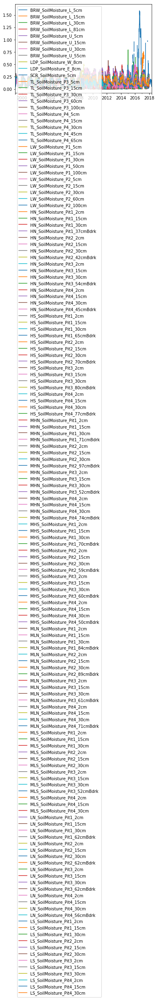

In [53]:
df_lst = [BRW_SM,LDP_SM,SCR_SM,TL_SM,LW_SM,HN_SM,HS_SM,MHN_SM,MHS_SM,MLN_SM,MLS_SM,LN_SM,LS_SM]
for df in df_lst:  
    display(df.head(2))
    threC(df,'SoilMoisture') # modify the dataframe and set unphysical values to NAN
    df.index = pd.to_datetime(df.index,errors = 'coerce')
    display(df.head(2))
    print(df.shape)
    print(df.index[0],df.index[-1])
    
prep = aggre_and_comb_daily(df_lst, axis=1, func = "mean") 
prep.plot()

BRW_SoilMoisture_L_5cm
BRW_SoilMoisture_L_15cm
BRW_SoilMoisture_L_30cm
BRW_SoilMoisture_L_81cm
BRW_SoilMoisture_U_5cm
BRW_SoilMoisture_U_15cm
BRW_SoilMoisture_U_30cm
BRW_SoilMoisture_U_55cm
LDP_SoilMoisture_W_8cm
LDP_SoilMoisture_E_8cm
SCR_SoilMoisture_5cm
TL_SoilMoisture_P3_5cm
TL_SoilMoisture_P3_15cm
TL_SoilMoisture_P3_30cm
TL_SoilMoisture_P3_60cm
TL_SoilMoisture_P3_100cm
TL_SoilMoisture_P4_5cm
TL_SoilMoisture_P4_15cm
TL_SoilMoisture_P4_30cm
TL_SoilMoisture_P4_45cm
TL_SoilMoisture_P4_65cm
LW_SoilMoisture_P1_5cm
LW_SoilMoisture_P1_15cm
LW_SoilMoisture_P1_30cm
LW_SoilMoisture_P1_50cm
LW_SoilMoisture_P1_100cm
LW_SoilMoisture_P2_5cm
LW_SoilMoisture_P2_15cm
LW_SoilMoisture_P2_30cm
LW_SoilMoisture_P2_60cm
LW_SoilMoisture_P2_100cm
HN_SoilMoisture_Pit1_2cm
HN_SoilMoisture_Pit1_15cm
HN_SoilMoisture_Pit1_30cm
HN_SoilMoisture_Pit1_37cmBdrk
HN_SoilMoisture_Pit2_2cm
HN_SoilMoisture_Pit2_15cm
HN_SoilMoisture_Pit2_30cm
HN_SoilMoisture_Pit2_42cmBdrk
HN_SoilMoisture_Pit3_2cm
HN_SoilMoisture_Pit3_15cm

<Figure size 720x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

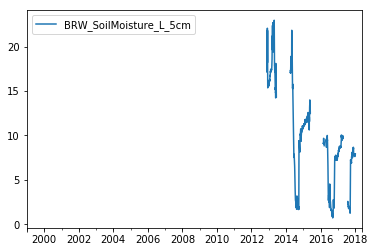

<Figure size 432x288 with 0 Axes>

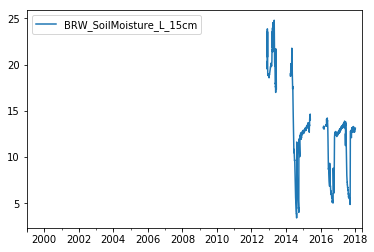

<Figure size 432x288 with 0 Axes>

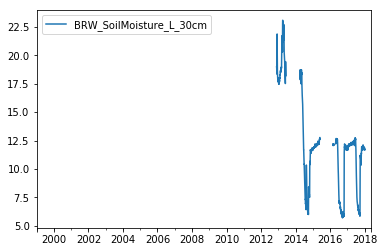

<Figure size 432x288 with 0 Axes>

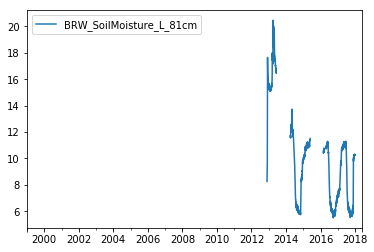

<Figure size 432x288 with 0 Axes>

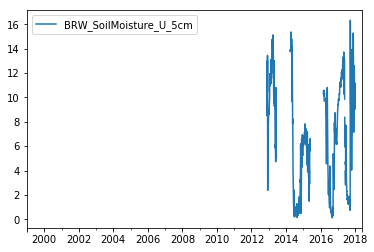

<Figure size 432x288 with 0 Axes>

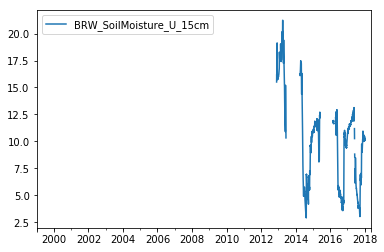

<Figure size 432x288 with 0 Axes>

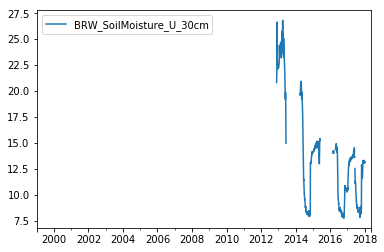

<Figure size 432x288 with 0 Axes>

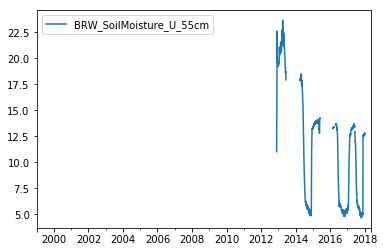

<Figure size 432x288 with 0 Axes>

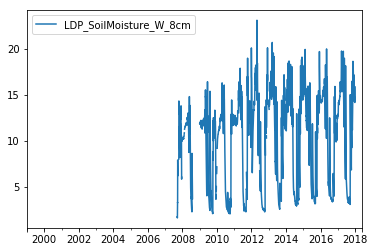

<Figure size 432x288 with 0 Axes>

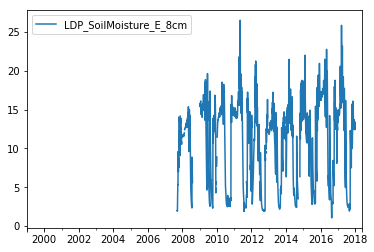

<Figure size 432x288 with 0 Axes>

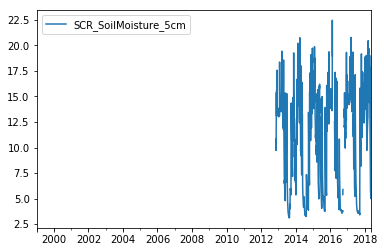

<Figure size 432x288 with 0 Axes>

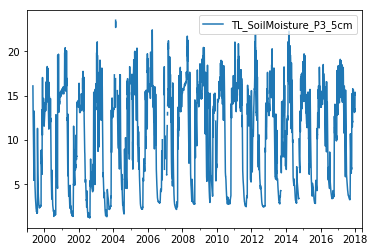

<Figure size 432x288 with 0 Axes>

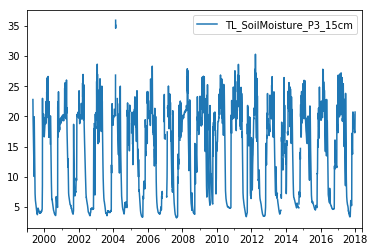

<Figure size 432x288 with 0 Axes>

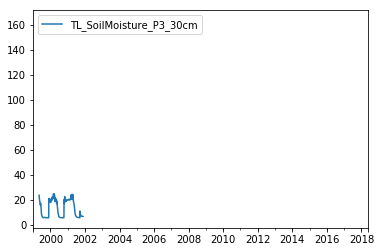

<Figure size 432x288 with 0 Axes>

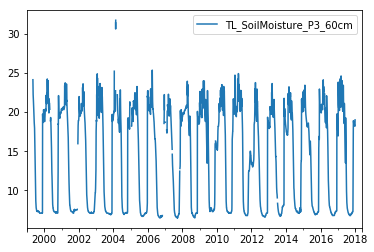

<Figure size 432x288 with 0 Axes>

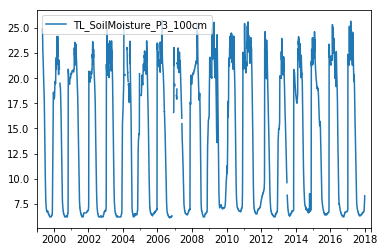

<Figure size 432x288 with 0 Axes>

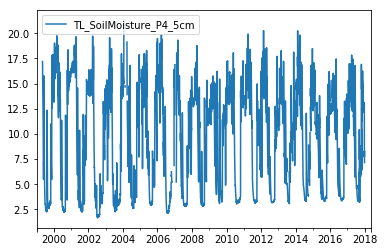

<Figure size 432x288 with 0 Axes>

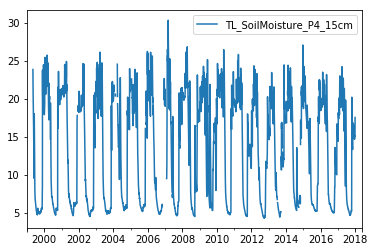

<Figure size 432x288 with 0 Axes>

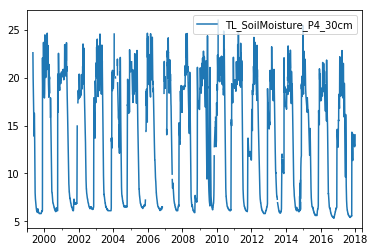

<Figure size 432x288 with 0 Axes>

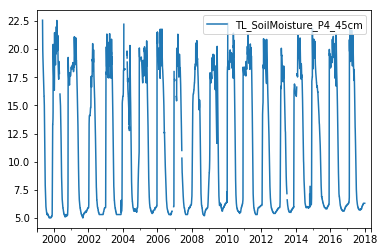

<Figure size 432x288 with 0 Axes>

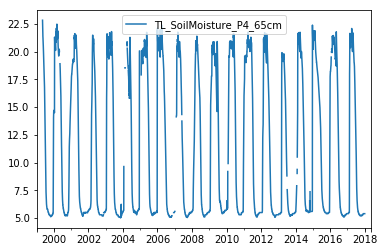

<Figure size 432x288 with 0 Axes>

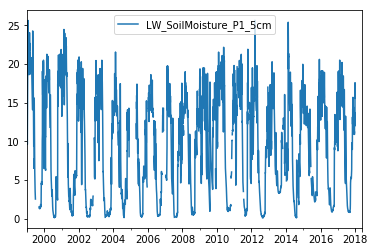

<Figure size 432x288 with 0 Axes>

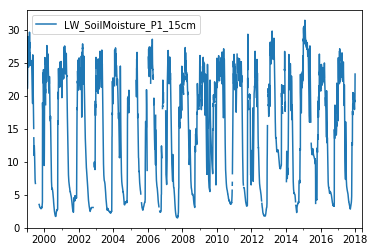

<Figure size 432x288 with 0 Axes>

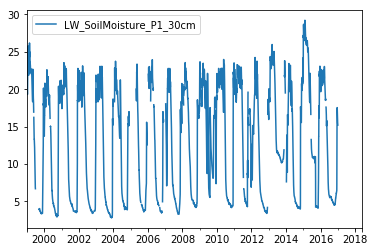

<Figure size 432x288 with 0 Axes>

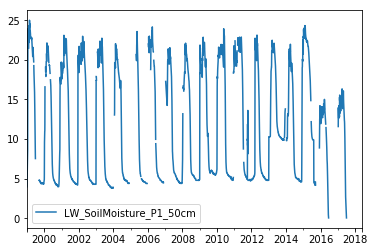

<Figure size 432x288 with 0 Axes>

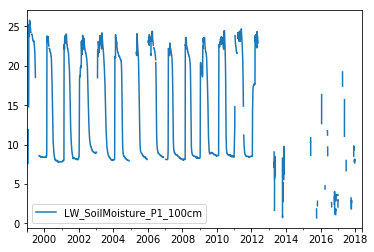

<Figure size 432x288 with 0 Axes>

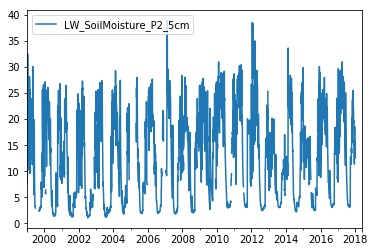

<Figure size 432x288 with 0 Axes>

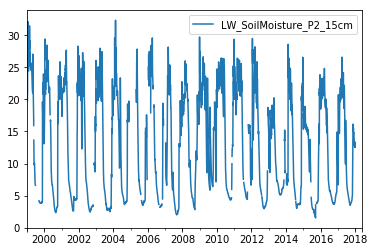

<Figure size 432x288 with 0 Axes>

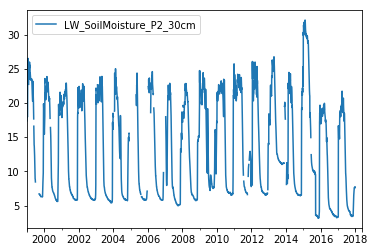

<Figure size 432x288 with 0 Axes>

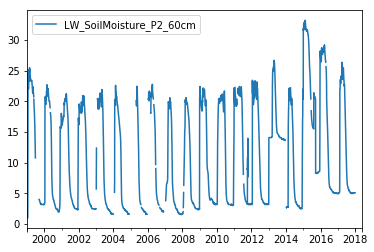

<Figure size 432x288 with 0 Axes>

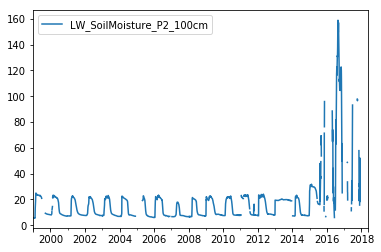

<Figure size 432x288 with 0 Axes>

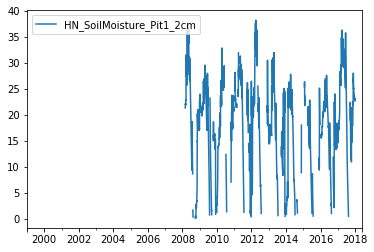

<Figure size 432x288 with 0 Axes>

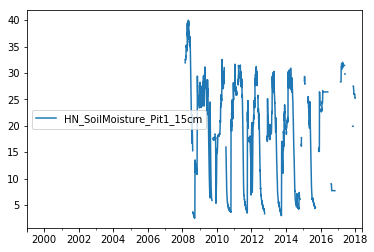

<Figure size 432x288 with 0 Axes>

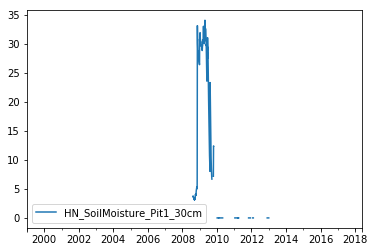

<Figure size 432x288 with 0 Axes>

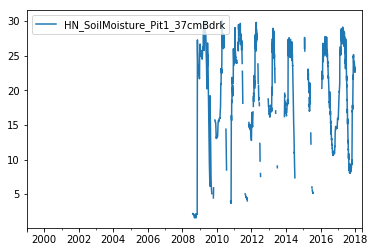

<Figure size 432x288 with 0 Axes>

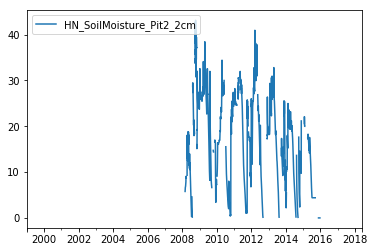

<Figure size 432x288 with 0 Axes>

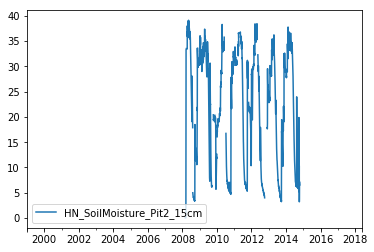

<Figure size 432x288 with 0 Axes>

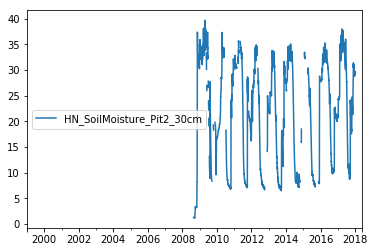

<Figure size 432x288 with 0 Axes>

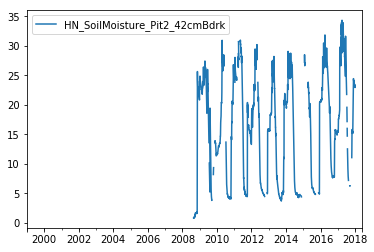

<Figure size 432x288 with 0 Axes>

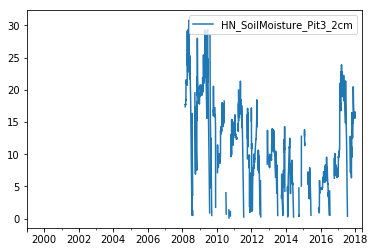

<Figure size 432x288 with 0 Axes>

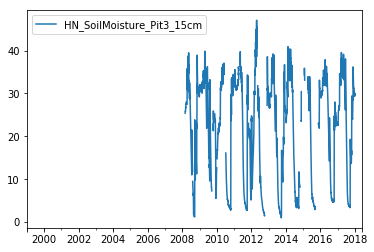

<Figure size 432x288 with 0 Axes>

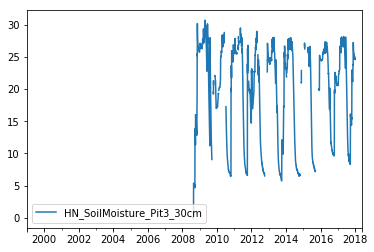

<Figure size 432x288 with 0 Axes>

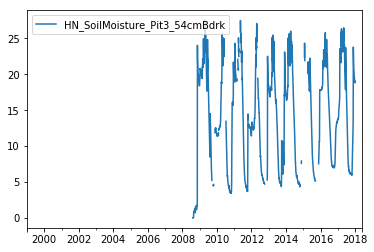

<Figure size 432x288 with 0 Axes>

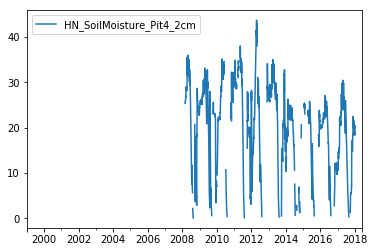

<Figure size 432x288 with 0 Axes>

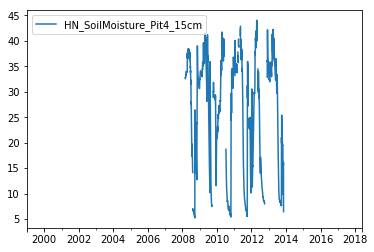

<Figure size 432x288 with 0 Axes>

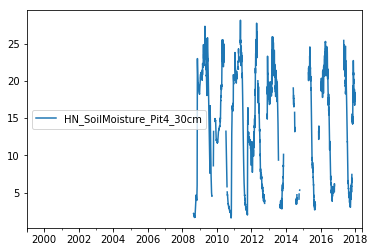

<Figure size 432x288 with 0 Axes>

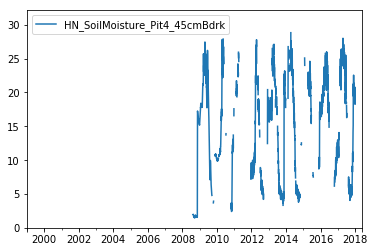

<Figure size 432x288 with 0 Axes>

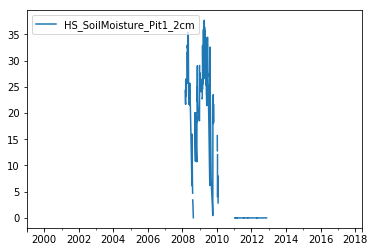

<Figure size 432x288 with 0 Axes>

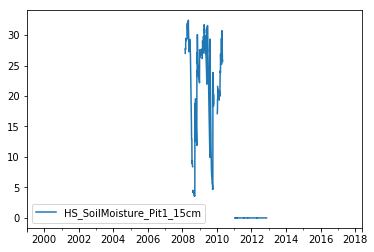

<Figure size 432x288 with 0 Axes>

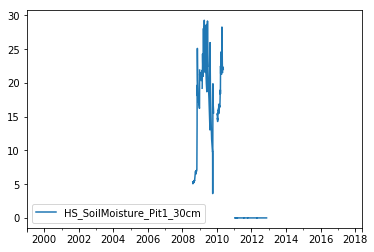

<Figure size 432x288 with 0 Axes>

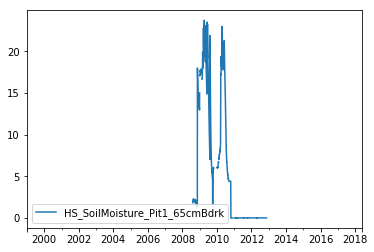

<Figure size 432x288 with 0 Axes>

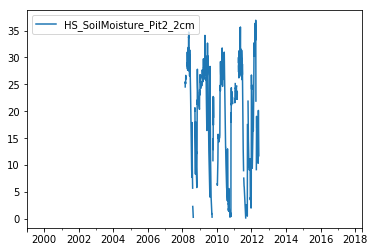

<Figure size 432x288 with 0 Axes>

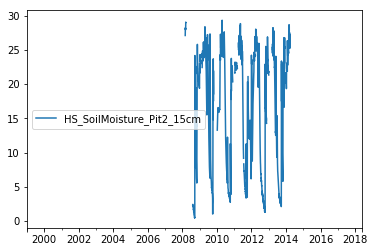

<Figure size 432x288 with 0 Axes>

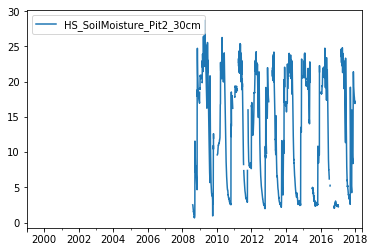

<Figure size 432x288 with 0 Axes>

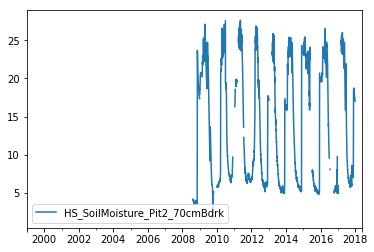

<Figure size 432x288 with 0 Axes>

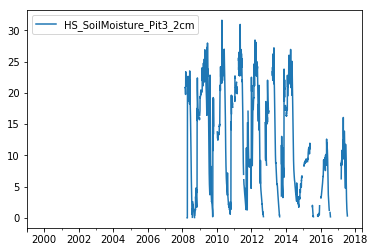

<Figure size 432x288 with 0 Axes>

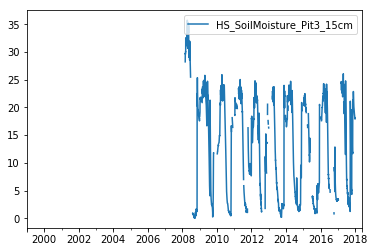

<Figure size 432x288 with 0 Axes>

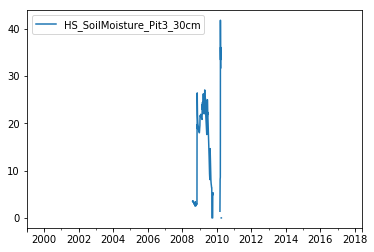

<Figure size 432x288 with 0 Axes>

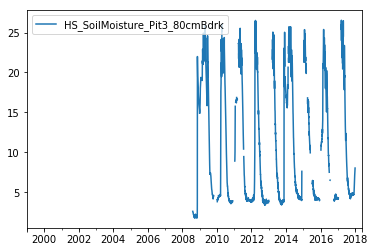

<Figure size 432x288 with 0 Axes>

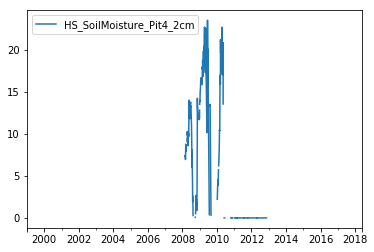

<Figure size 432x288 with 0 Axes>

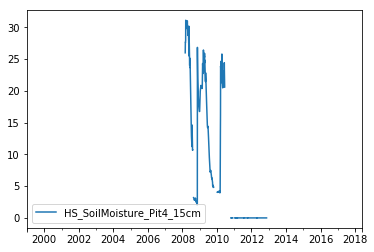

<Figure size 432x288 with 0 Axes>

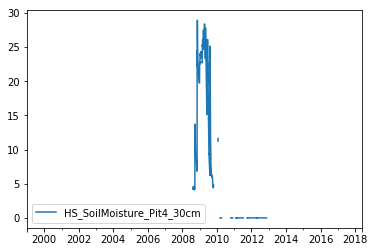

<Figure size 432x288 with 0 Axes>

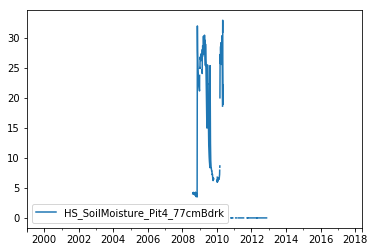

<Figure size 432x288 with 0 Axes>

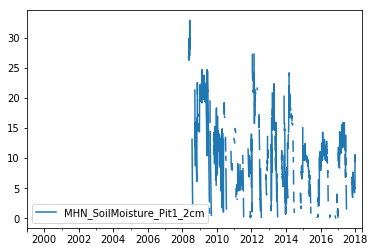

<Figure size 432x288 with 0 Axes>

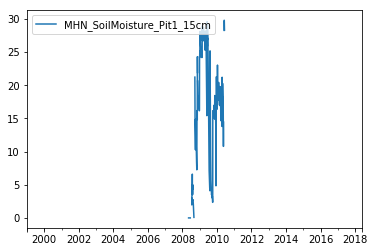

<Figure size 432x288 with 0 Axes>

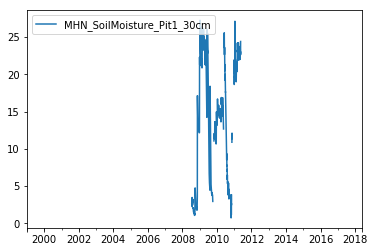

<Figure size 432x288 with 0 Axes>

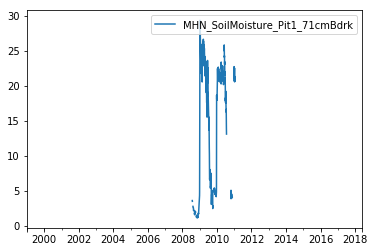

<Figure size 432x288 with 0 Axes>

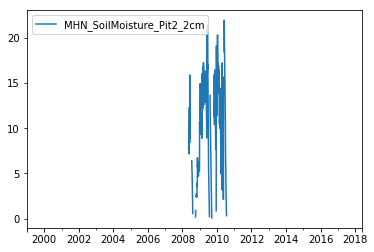

<Figure size 432x288 with 0 Axes>

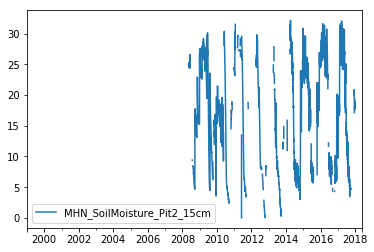

<Figure size 432x288 with 0 Axes>

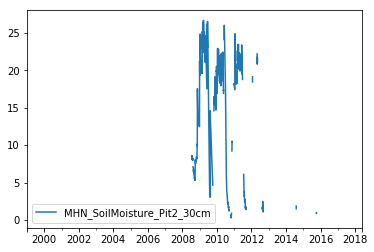

<Figure size 432x288 with 0 Axes>

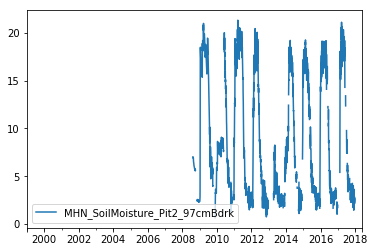

<Figure size 432x288 with 0 Axes>

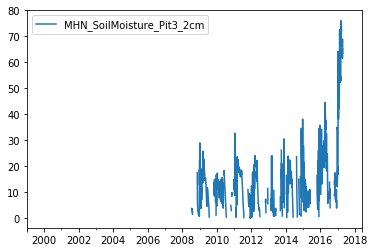

<Figure size 432x288 with 0 Axes>

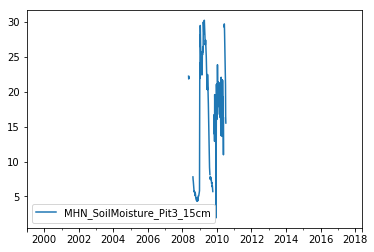

<Figure size 432x288 with 0 Axes>

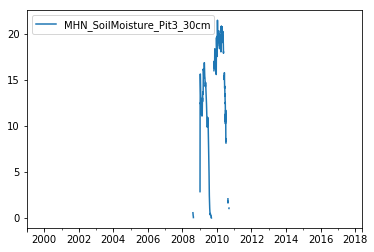

<Figure size 432x288 with 0 Axes>

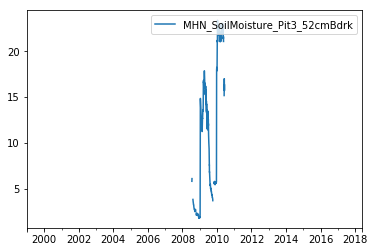

<Figure size 432x288 with 0 Axes>

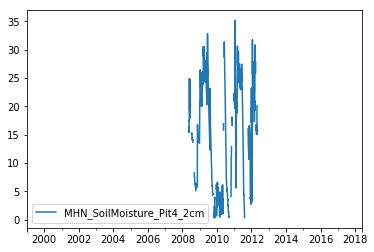

<Figure size 432x288 with 0 Axes>

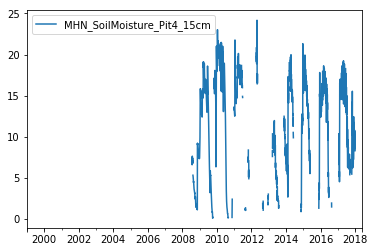

<Figure size 432x288 with 0 Axes>

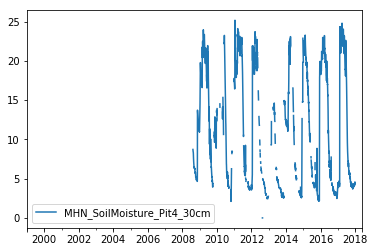

<Figure size 432x288 with 0 Axes>

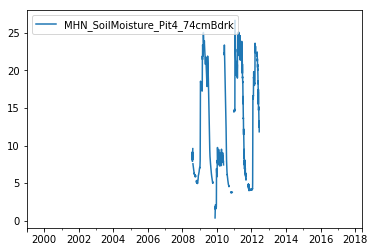

<Figure size 432x288 with 0 Axes>

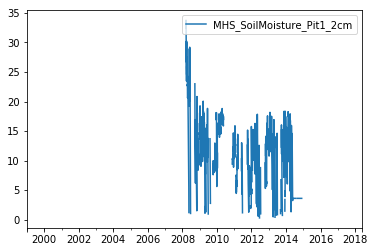

<Figure size 432x288 with 0 Axes>

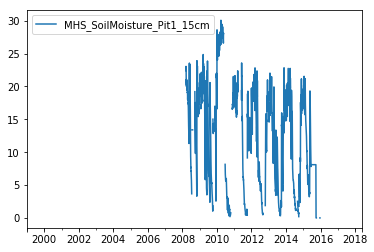

<Figure size 432x288 with 0 Axes>

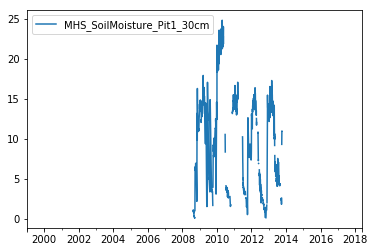

<Figure size 432x288 with 0 Axes>

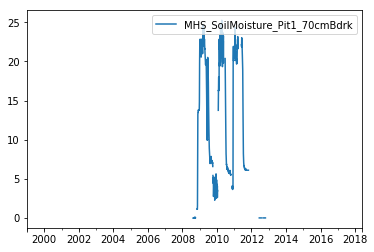

<Figure size 432x288 with 0 Axes>

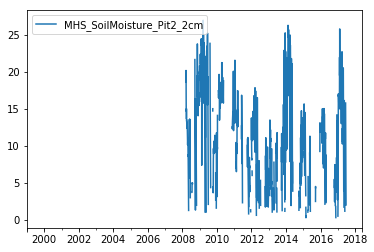

<Figure size 432x288 with 0 Axes>

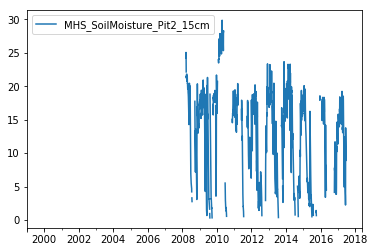

<Figure size 432x288 with 0 Axes>

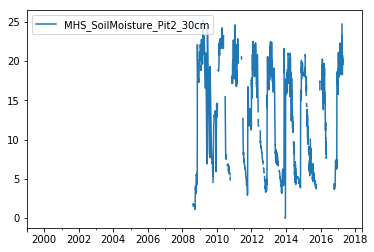

<Figure size 432x288 with 0 Axes>

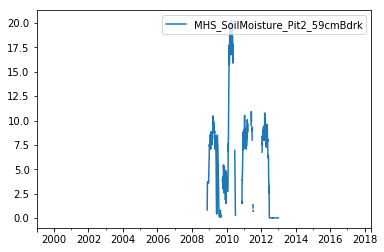

<Figure size 432x288 with 0 Axes>

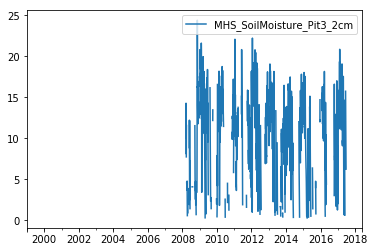

<Figure size 432x288 with 0 Axes>

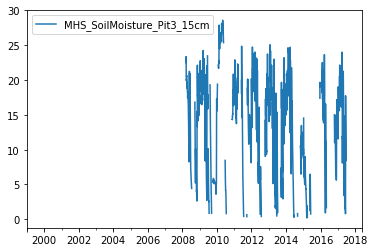

<Figure size 432x288 with 0 Axes>

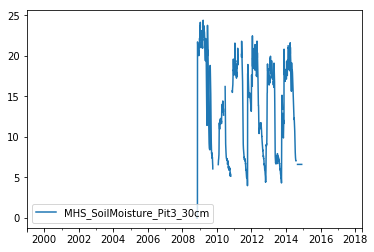

<Figure size 432x288 with 0 Axes>

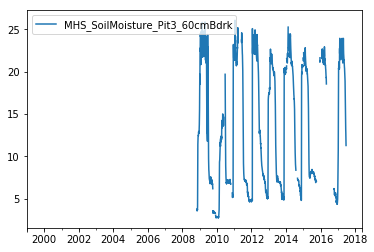

<Figure size 432x288 with 0 Axes>

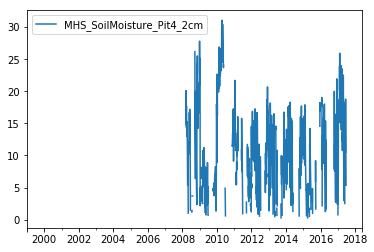

<Figure size 432x288 with 0 Axes>

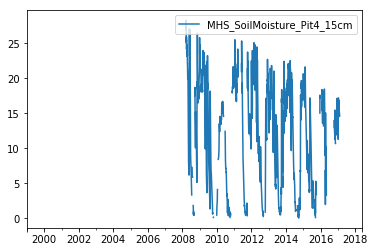

<Figure size 432x288 with 0 Axes>

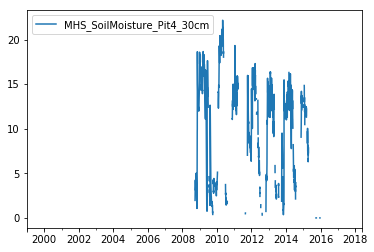

<Figure size 432x288 with 0 Axes>

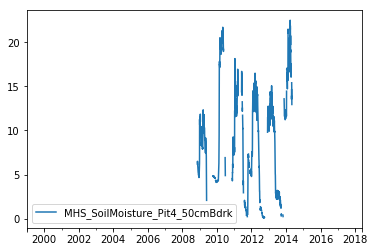

<Figure size 432x288 with 0 Axes>

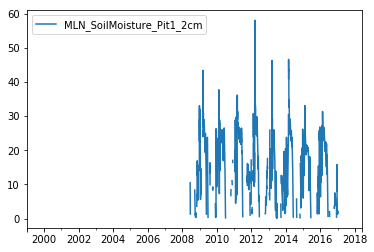

<Figure size 432x288 with 0 Axes>

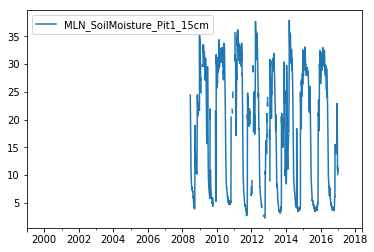

<Figure size 432x288 with 0 Axes>

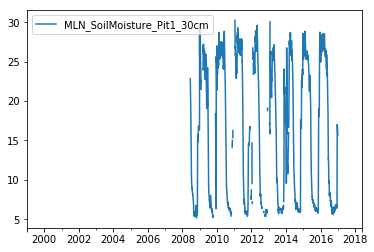

<Figure size 432x288 with 0 Axes>

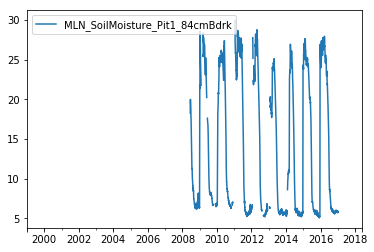

<Figure size 432x288 with 0 Axes>

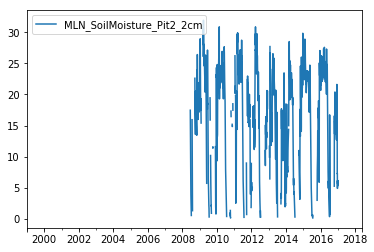

<Figure size 432x288 with 0 Axes>

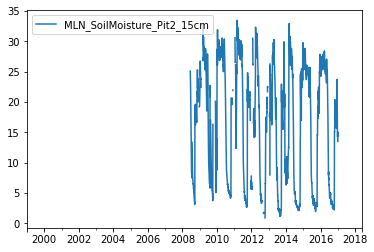

<Figure size 432x288 with 0 Axes>

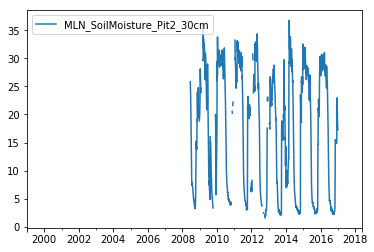

<Figure size 432x288 with 0 Axes>

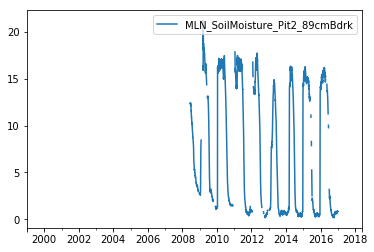

<Figure size 432x288 with 0 Axes>

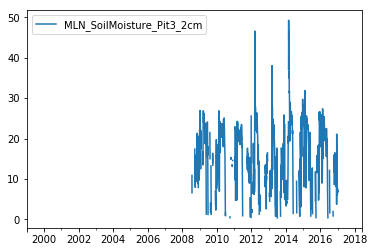

<Figure size 432x288 with 0 Axes>

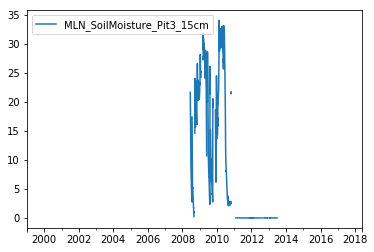

<Figure size 432x288 with 0 Axes>

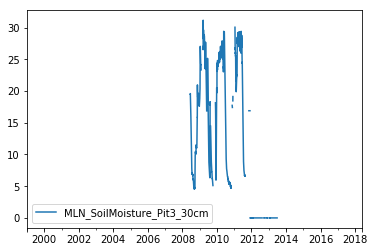

<Figure size 432x288 with 0 Axes>

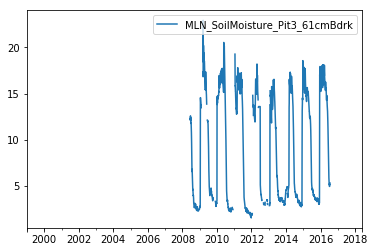

<Figure size 432x288 with 0 Axes>

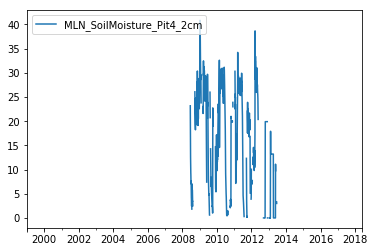

<Figure size 432x288 with 0 Axes>

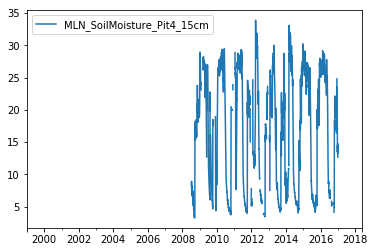

<Figure size 432x288 with 0 Axes>

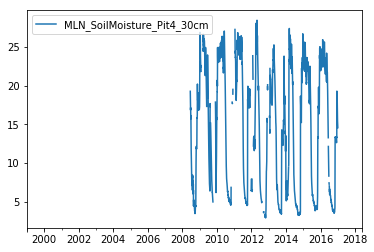

<Figure size 432x288 with 0 Axes>

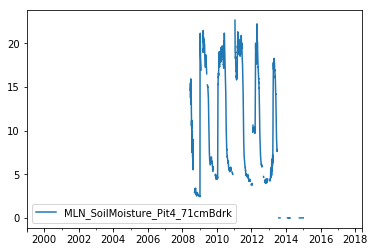

<Figure size 432x288 with 0 Axes>

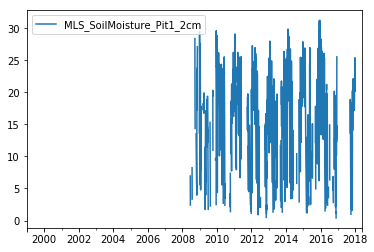

<Figure size 432x288 with 0 Axes>

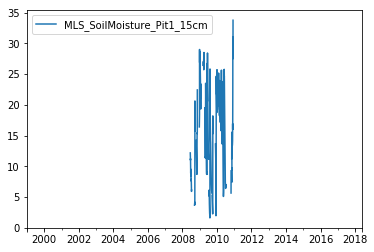

<Figure size 432x288 with 0 Axes>

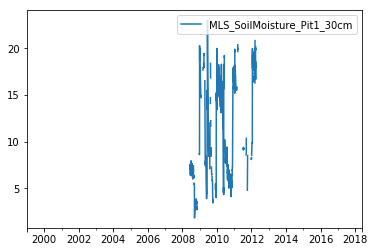

<Figure size 432x288 with 0 Axes>

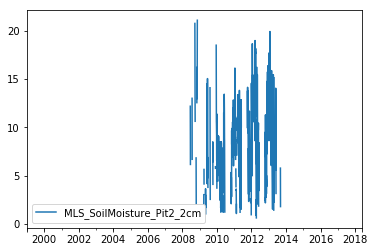

<Figure size 432x288 with 0 Axes>

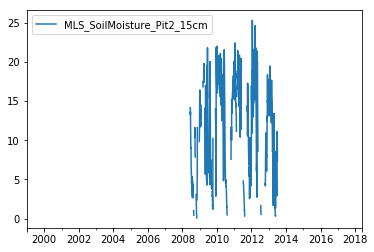

<Figure size 432x288 with 0 Axes>

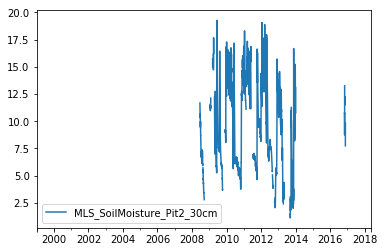

<Figure size 432x288 with 0 Axes>

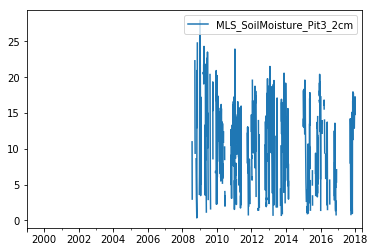

<Figure size 432x288 with 0 Axes>

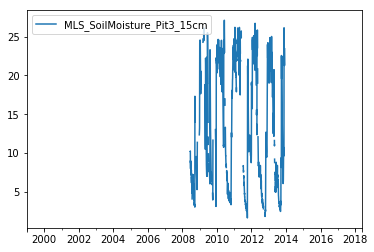

<Figure size 432x288 with 0 Axes>

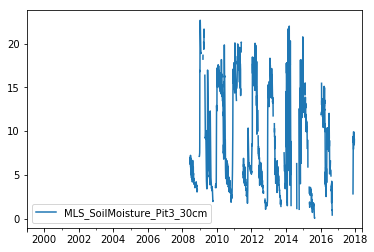

<Figure size 432x288 with 0 Axes>

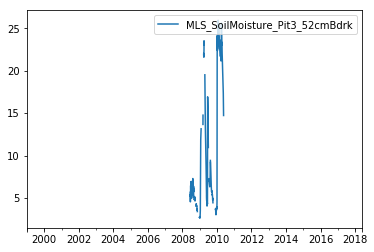

<Figure size 432x288 with 0 Axes>

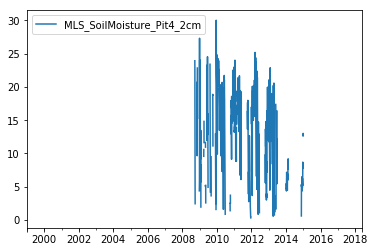

<Figure size 432x288 with 0 Axes>

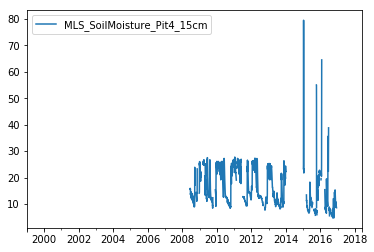

<Figure size 432x288 with 0 Axes>

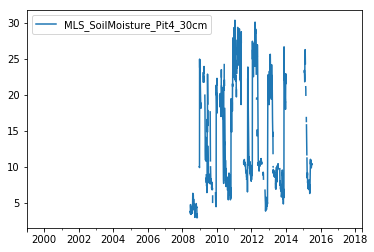

<Figure size 432x288 with 0 Axes>

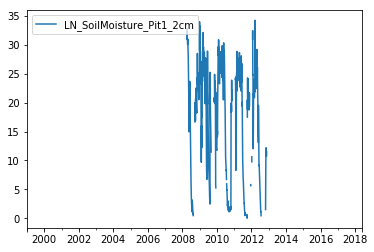

<Figure size 432x288 with 0 Axes>

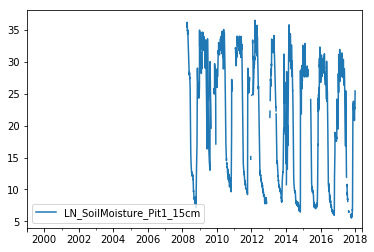

<Figure size 432x288 with 0 Axes>

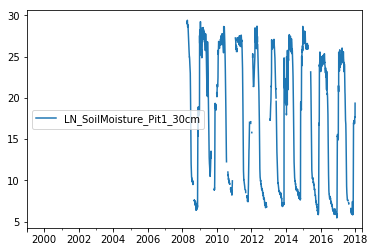

<Figure size 432x288 with 0 Axes>

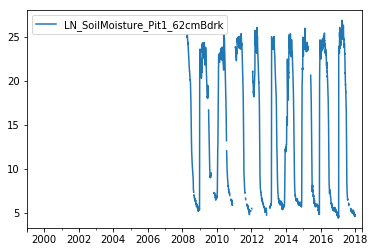

<Figure size 432x288 with 0 Axes>

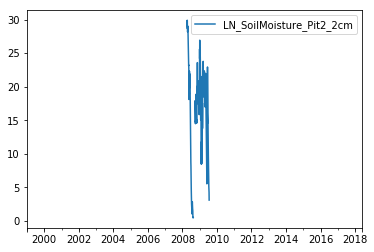

<Figure size 432x288 with 0 Axes>

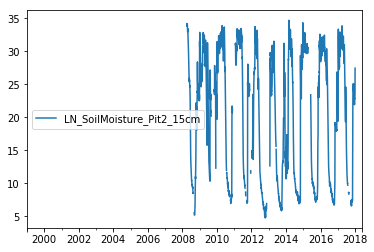

<Figure size 432x288 with 0 Axes>

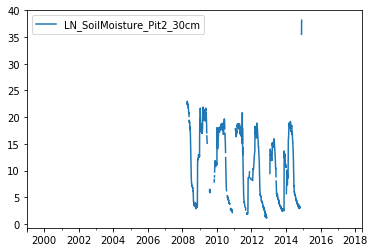

<Figure size 432x288 with 0 Axes>

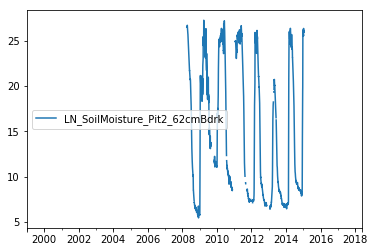

<Figure size 432x288 with 0 Axes>

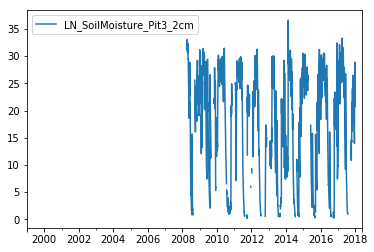

<Figure size 432x288 with 0 Axes>

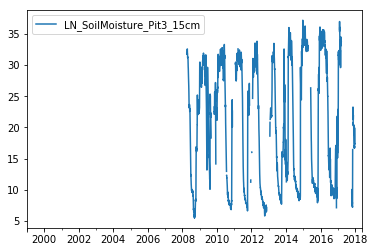

<Figure size 432x288 with 0 Axes>

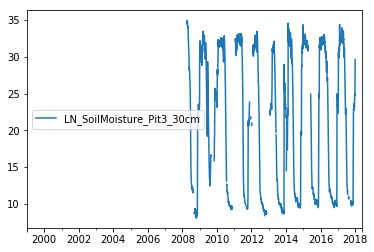

<Figure size 432x288 with 0 Axes>

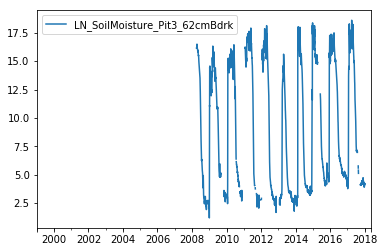

<Figure size 432x288 with 0 Axes>

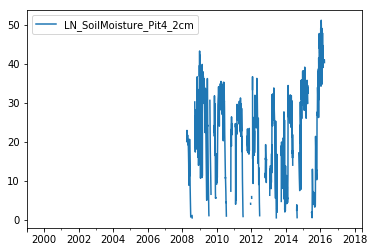

<Figure size 432x288 with 0 Axes>

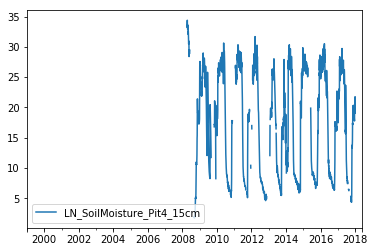

<Figure size 432x288 with 0 Axes>

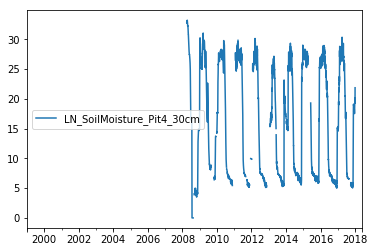

<Figure size 432x288 with 0 Axes>

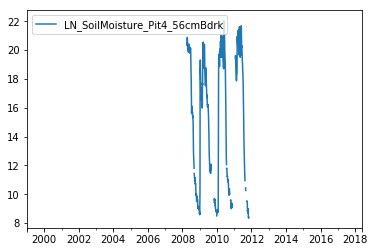

<Figure size 432x288 with 0 Axes>

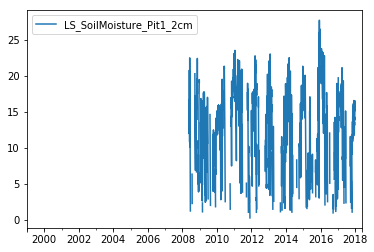

<Figure size 432x288 with 0 Axes>

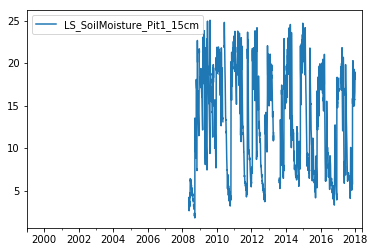

<Figure size 432x288 with 0 Axes>

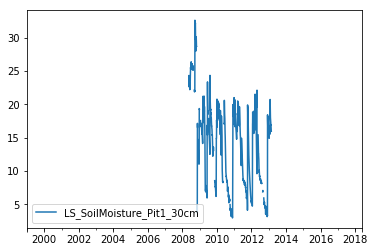

<Figure size 432x288 with 0 Axes>

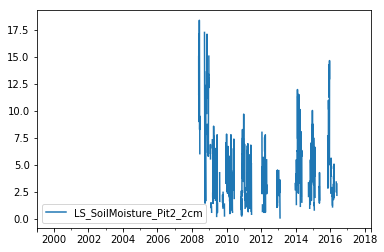

<Figure size 432x288 with 0 Axes>

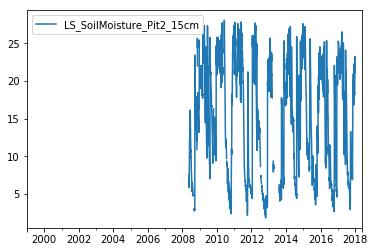

<Figure size 432x288 with 0 Axes>

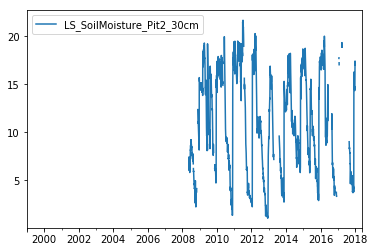

<Figure size 432x288 with 0 Axes>

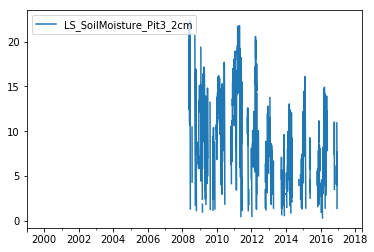

<Figure size 432x288 with 0 Axes>

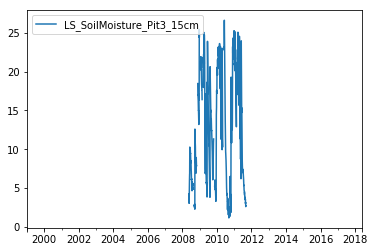

<Figure size 432x288 with 0 Axes>

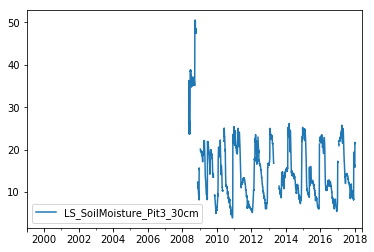

<Figure size 432x288 with 0 Axes>

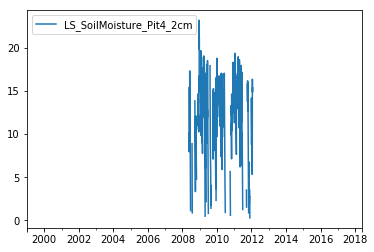

<Figure size 432x288 with 0 Axes>

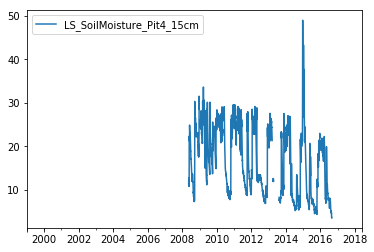

<Figure size 432x288 with 0 Axes>

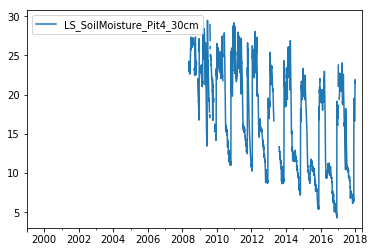

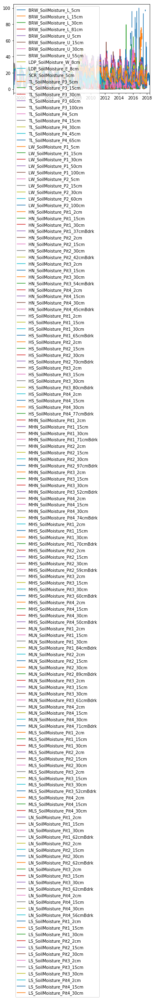

In [54]:
# create a new dataframe and put all the data into it, this is to avoid missing index since the new df has continuous idnex
# check the unit of variable here! SoilMoisture data should be %

indexUnique = pd.date_range(str(prep.index[0]), str(prep.index[-1]))  
ready_columns = pd.unique(prep.columns)  
siteList = ready_columns
nan_values = np.nan*np.ones([len(indexUnique),len(ready_columns)])
df = pd.DataFrame(nan_values, index=indexUnique, columns = ready_columns) 

plt.figure(figsize=(10,4))
for i in np.arange(len(ready_columns)):  
    print(siteList[i])            
    site = siteList[i]     
    tab = prep[site]
    for j in np.arange(len(prep)):  
        df.loc[tab.index[j]][ready_columns[i]] = tab[j]*100  # convert to the right unit
    plt.figure()
    df[[site]].plot()
    
df = threC(df,'SoilMoisture')      
SoilMoisture = copy.deepcopy(df)
SoilMoisture.plot()

### 12. SoilTemperature

In [55]:
BRW_ST = BRW_soil[[i for i in BRW_soil.columns if i.split('_')[1] == 'SoilTemperature']]
LDP_ST = LDP_soil[[i for i in LDP_soil.columns if i.split('_')[1] == 'SoilTemperature']]
SCR_ST = SCR_soil[[i for i in SCR_soil.columns if i.split('_')[1] == 'SoilTemperature']]
TL_ST = TL_soil[[i for i in TL_soil.columns if i.split('_')[1] == 'SoilTemperature']]
LW_ST = LW_soil[[i for i in LW_soil.columns if i.split('_')[1] == 'SoilTemperature']]
HN_ST = HN_soil[[i for i in HN_soil.columns if i.split('_')[1] == 'SoilTemperature']]
HS_ST = HS_soil[[i for i in HS_soil.columns if i.split('_')[1] == 'SoilTemperature']]
MHN_ST = MHN_soil[[i for i in MHN_soil.columns if i.split('_')[1] == 'SoilTemperature']]
MHS_ST = MHS_soil[[i for i in MHS_soil.columns if i.split('_')[1] == 'SoilTemperature']]
MLN_ST = MLN_soil[[i for i in MLN_soil.columns if i.split('_')[1] == 'SoilTemperature']]
MLS_ST = MLS_soil[[i for i in MLS_soil.columns if i.split('_')[1] == 'SoilTemperature']]
LN_ST = LN_soil[[i for i in LN_soil.columns if i.split('_')[1] == 'SoilTemperature']]
LS_ST = LS_soil[[i for i in LS_soil.columns if i.split('_')[1] == 'SoilTemperature']]

,BRW_SoilTemperature_L_5cm,BRW_SoilTemperature_L_15cm,BRW_SoilTemperature_L_30cm,BRW_SoilTemperature_L_81cm,BRW_SoilTemperature_U_5cm,BRW_SoilTemperature_U_15cm,BRW_SoilTemperature_U_30cm,BRW_SoilTemperature_U_55cm
DateTime,,,,,,,,
11/24/2012 10:00,0.3,0.6,1.6,3.8,0.0,0.9,1.9,3.3
11/24/2012 10:15,0.3,0.6,1.6,3.8,0.0,0.8,1.9,3.3


,BRW_SoilTemperature_L_5cm,BRW_SoilTemperature_L_15cm,BRW_SoilTemperature_L_30cm,BRW_SoilTemperature_L_81cm,BRW_SoilTemperature_U_5cm,BRW_SoilTemperature_U_15cm,BRW_SoilTemperature_U_30cm,BRW_SoilTemperature_U_55cm
DateTime,,,,,,,,
2012-11-24 10:00:00,0.3,0.6,1.6,3.8,0.0,0.9,1.9,3.3
2012-11-24 10:15:00,0.3,0.6,1.6,3.8,0.0,0.8,1.9,3.3


(44461, 8)
2012-11-24 10:00:00 2018-01-05 12:00:00


,LDP_SoilTemperature_W_2cm,LDP_SoilTemperature_W_6cm,LDP_SoilTemperature_E_2cm,LDP_SoilTemperature_E_6cm,LDP_SoilTemperature_2.5cm,LDP_SoilTemperature_20cm,LDP_SoilTemperature_33cm
DateTime,,,,,,,
1/1/2007 0:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0
1/1/2007 1:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0


,LDP_SoilTemperature_W_2cm,LDP_SoilTemperature_W_6cm,LDP_SoilTemperature_E_2cm,LDP_SoilTemperature_E_6cm,LDP_SoilTemperature_2.5cm,LDP_SoilTemperature_20cm,LDP_SoilTemperature_33cm
DateTime,,,,,,,
2007-01-01 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2007-01-01 01:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN


(96432, 7)
2007-01-01 00:00:00 2017-12-31 23:00:00


,SCR_SoilTemperature_5cm
DateTime,
1/1/2012 0:00,-6999.0
1/1/2012 1:00,-6999.0


,SCR_SoilTemperature_5cm
DateTime,
2012-01-01 00:00:00,NaN
2012-01-01 01:00:00,NaN


(55978, 1)
2012-01-01 00:00:00 2018-05-21 09:00:00


,TL_SoilTemperature_P3_5cm,TL_SoilTemperature_P3_30cm,TL_SoilTemperature_P3_60cm,TL_SoilTemperature_P3_100cm,TL_SoilTemperature_P4_5cm,TL_SoilTemperature_P4_15cm,TL_SoilTemperature_P4_30cm,TL_SoilTemperature_P4_45cm,TL_SoilTemperature_P4_65cm
1/1/1999 0:00,-6999.0,-6999.0,-6999.0,-6999,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0
1/1/1999 1:00,-6999.0,-6999.0,-6999.0,-6999,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0


,TL_SoilTemperature_P3_5cm,TL_SoilTemperature_P3_30cm,TL_SoilTemperature_P3_60cm,TL_SoilTemperature_P3_100cm,TL_SoilTemperature_P4_5cm,TL_SoilTemperature_P4_15cm,TL_SoilTemperature_P4_30cm,TL_SoilTemperature_P4_45cm,TL_SoilTemperature_P4_65cm
1999-01-01 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1999-01-01 01:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


(166814, 9)
1999-01-01 00:00:00 2017-12-31 23:00:00


,LW_SoilTemperature_P1_5cm,LW_SoilTemperature_P1_15cm,LW_SoilTemperature_P1_30cm,LW_SoilTemperature_P1_50cm,LW_SoilTemperature_P1_100cm,LW_SoilTemperature_P2_5cm,LW_SoilTemperature_P2_15cm,LW_SoilTemperature_P2_30cm,LW_SoilTemperature_P2_60cm,LW_SoilTemperature_P2_100cm
DateTime,,,,,,,,,,
01/01/1999 00:00,-0.1,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0
01/01/1999 01:00,0.3,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0


,LW_SoilTemperature_P1_5cm,LW_SoilTemperature_P1_15cm,LW_SoilTemperature_P1_30cm,LW_SoilTemperature_P1_50cm,LW_SoilTemperature_P1_100cm,LW_SoilTemperature_P2_5cm,LW_SoilTemperature_P2_15cm,LW_SoilTemperature_P2_30cm,LW_SoilTemperature_P2_60cm,LW_SoilTemperature_P2_100cm
DateTime,,,,,,,,,,
1999-01-01 00:00:00,-0.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1999-01-01 01:00:00,0.3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


(175591, 10)
1999-01-01 00:00:00 2017-12-31 23:00:00


,HN_SoilTemperature_Pit1_2cm,HN_SoilTemperature_Pit1_15cm,HN_SoilTemperature_Pit1_30cm,HN_SoilTemperature_Pit1_37cmBdrk,HN_SoilTemperature_Pit2_2cm,HN_SoilTemperature_Pit2_15cm,HN_SoilTemperature_Pit2_30cm,HN_SoilTemperature_Pit2_42cmBdrk,HN_SoilTemperature_Pit3_2cm,HN_SoilTemperature_Pit3_15cm,HN_SoilTemperature_Pit3_30cm,HN_SoilTemperature_Pit3_54cmBdrk,HN_SoilTemperature_Pit4_2cm,HN_SoilTemperature_Pit4_15cm,HN_SoilTemperature_Pit4_30cm,HN_SoilTemperature_Pit4_45cmBdrk
DateTime,,,,,,,,,,,,,,,,
01/01/2008 00:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0
01/01/2008 01:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0


,HN_SoilTemperature_Pit1_2cm,HN_SoilTemperature_Pit1_15cm,HN_SoilTemperature_Pit1_30cm,HN_SoilTemperature_Pit1_37cmBdrk,HN_SoilTemperature_Pit2_2cm,HN_SoilTemperature_Pit2_15cm,HN_SoilTemperature_Pit2_30cm,HN_SoilTemperature_Pit2_42cmBdrk,HN_SoilTemperature_Pit3_2cm,HN_SoilTemperature_Pit3_15cm,HN_SoilTemperature_Pit3_30cm,HN_SoilTemperature_Pit3_54cmBdrk,HN_SoilTemperature_Pit4_2cm,HN_SoilTemperature_Pit4_15cm,HN_SoilTemperature_Pit4_30cm,HN_SoilTemperature_Pit4_45cmBdrk
DateTime,,,,,,,,,,,,,,,,
2008-01-01 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2008-01-01 01:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


(87754, 16)
2008-01-01 00:00:00 2017-12-31 23:00:00


,HS_SoilTemperature_Pit1_2cm,HS_SoilTemperature_Pit1_15cm,HS_SoilTemperature_Pit1_30cm,HS_SoilTemperature_Pit1_65cmBdrk,HS_SoilTemperature_Pit2_2cm,HS_SoilTemperature_Pit2_15cm,HS_SoilTemperature_Pit2_30cm,HS_SoilTemperature_Pit2_70cmBdrk,HS_SoilTemperature_Pit3_2cm,HS_SoilTemperature_Pit3_15cm,HS_SoilTemperature_Pit3_30cm,HS_SoilTemperature_Pit3_80cmBdrk,HS_SoilTemperature_Pit4_2cm,HS_SoilTemperature_Pit4_15cm,HS_SoilTemperature_Pit4_30cm,HS_SoilTemperature_Pit4_77cmBdrk
DateTime,,,,,,,,,,,,,,,,
1/1/2008 0:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0
1/1/2008 1:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0


,HS_SoilTemperature_Pit1_2cm,HS_SoilTemperature_Pit1_15cm,HS_SoilTemperature_Pit1_30cm,HS_SoilTemperature_Pit1_65cmBdrk,HS_SoilTemperature_Pit2_2cm,HS_SoilTemperature_Pit2_15cm,HS_SoilTemperature_Pit2_30cm,HS_SoilTemperature_Pit2_70cmBdrk,HS_SoilTemperature_Pit3_2cm,HS_SoilTemperature_Pit3_15cm,HS_SoilTemperature_Pit3_30cm,HS_SoilTemperature_Pit3_80cmBdrk,HS_SoilTemperature_Pit4_2cm,HS_SoilTemperature_Pit4_15cm,HS_SoilTemperature_Pit4_30cm,HS_SoilTemperature_Pit4_77cmBdrk
DateTime,,,,,,,,,,,,,,,,
2008-01-01 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2008-01-01 01:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


(87648, 16)
2008-01-01 00:00:00 2017-12-31 23:00:00


,MHN_SoilTemperature_Pit1_2cm,MHN_SoilTemperature_Pit1_15cm,MHN_SoilTemperature_Pit1_30cm,MHN_SoilTemperature_Pit1_71cmBdrk,MHN_SoilTemperature_Pit2_2cm,MHN_SoilTemperature_Pit2_15cm,MHN_SoilTemperature_Pit2_30cm,MHN_SoilTemperature_Pit2_97cmBdrk,MHN_SoilTemperature_Pit3_2cm,MHN_SoilTemperature_Pit3_15cm,MHN_SoilTemperature_Pit3_30cm,MHN_SoilTemperature_Pit3_52cmBdrk,MHN_SoilTemperature_Pit4_2cm,MHN_SoilTemperature_Pit4_15cm,MHN_SoilTemperature_Pit4_30cm,MHN_SoilTemperature_Pit4_74cmBdrk
DateTime,,,,,,,,,,,,,,,,
01/01/2008 00:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0
01/01/2008 01:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0


,MHN_SoilTemperature_Pit1_2cm,MHN_SoilTemperature_Pit1_15cm,MHN_SoilTemperature_Pit1_30cm,MHN_SoilTemperature_Pit1_71cmBdrk,MHN_SoilTemperature_Pit2_2cm,MHN_SoilTemperature_Pit2_15cm,MHN_SoilTemperature_Pit2_30cm,MHN_SoilTemperature_Pit2_97cmBdrk,MHN_SoilTemperature_Pit3_2cm,MHN_SoilTemperature_Pit3_15cm,MHN_SoilTemperature_Pit3_30cm,MHN_SoilTemperature_Pit3_52cmBdrk,MHN_SoilTemperature_Pit4_2cm,MHN_SoilTemperature_Pit4_15cm,MHN_SoilTemperature_Pit4_30cm,MHN_SoilTemperature_Pit4_74cmBdrk
DateTime,,,,,,,,,,,,,,,,
2008-01-01 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2008-01-01 01:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


(87754, 16)
2008-01-01 00:00:00 2017-12-31 23:00:00


,MHS_SoilTemperature_Pit1_2cm,MHS_SoilTemperature_Pit1_15cm,MHS_SoilTemperature_Pit1_30cm,MHS_SoilTemperature_Pit1_70cmBdrk,MHS_SoilTemperature_Pit2_2cm,MHS_SoilTemperature_Pit2_15cm,MHS_SoilTemperature_Pit2_30cm,MHS_SoilTemperature_Pit2_59cmBdrk,MHS_SoilTemperature_Pit3_2cm,MHS_SoilTemperature_Pit3_15cm,MHS_SoilTemperature_Pit3_30cm,MHS_SoilTemperature_Pit3_60cmBdrk,MHS_SoilTemperature_Pit4_2cm,MHS_SoilTemperature_Pit4_15cm,MHS_SoilTemperature_Pit4_30cm,MHS_SoilTemperature_Pit4_50cmBdrk
DateTime,,,,,,,,,,,,,,,,
01/01/2008 00:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0
01/01/2008 01:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0


,MHS_SoilTemperature_Pit1_2cm,MHS_SoilTemperature_Pit1_15cm,MHS_SoilTemperature_Pit1_30cm,MHS_SoilTemperature_Pit1_70cmBdrk,MHS_SoilTemperature_Pit2_2cm,MHS_SoilTemperature_Pit2_15cm,MHS_SoilTemperature_Pit2_30cm,MHS_SoilTemperature_Pit2_59cmBdrk,MHS_SoilTemperature_Pit3_2cm,MHS_SoilTemperature_Pit3_15cm,MHS_SoilTemperature_Pit3_30cm,MHS_SoilTemperature_Pit3_60cmBdrk,MHS_SoilTemperature_Pit4_2cm,MHS_SoilTemperature_Pit4_15cm,MHS_SoilTemperature_Pit4_30cm,MHS_SoilTemperature_Pit4_50cmBdrk
DateTime,,,,,,,,,,,,,,,,
2008-01-01 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2008-01-01 01:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


(83182, 16)
2008-01-01 00:00:00 2017-06-23 17:00:00


,MLN_SoilTemperature_Pit1_2cm,MLN_SoilTemperature_Pit1_15cm,MLN_SoilTemperature_Pit1_30cm,MLN_SoilTemperature_Pit1_84cmBdrk,MLN_SoilTemperature_Pit2_2cm,MLN_SoilTemperature_Pit2_15cm,MLN_SoilTemperature_Pit2_30cm,MLN_SoilTemperature_Pit2_89cmBdrk,MLN_SoilTemperature_Pit3_2cm,MLN_SoilTemperature_Pit3_15cm,MLN_SoilTemperature_Pit3_30cm,MLN_SoilTemperature_Pit3_61cmBdrk,MLN_SoilTemperature_Pit4_2cm,MLN_SoilTemperature_Pit4_15cm,MLN_SoilTemperature_Pit4_30cm,MLN_SoilTemperature_Pit4_71cmBdrk
DateTime,,,,,,,,,,,,,,,,
01/01/2008 00:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0
01/01/2008 01:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0


,MLN_SoilTemperature_Pit1_2cm,MLN_SoilTemperature_Pit1_15cm,MLN_SoilTemperature_Pit1_30cm,MLN_SoilTemperature_Pit1_84cmBdrk,MLN_SoilTemperature_Pit2_2cm,MLN_SoilTemperature_Pit2_15cm,MLN_SoilTemperature_Pit2_30cm,MLN_SoilTemperature_Pit2_89cmBdrk,MLN_SoilTemperature_Pit3_2cm,MLN_SoilTemperature_Pit3_15cm,MLN_SoilTemperature_Pit3_30cm,MLN_SoilTemperature_Pit3_61cmBdrk,MLN_SoilTemperature_Pit4_2cm,MLN_SoilTemperature_Pit4_15cm,MLN_SoilTemperature_Pit4_30cm,MLN_SoilTemperature_Pit4_71cmBdrk
DateTime,,,,,,,,,,,,,,,,
2008-01-01 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2008-01-01 01:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


(79004, 16)
2008-01-01 00:00:00 2016-12-31 23:00:00


,MLS_SoilTemperature_Pit1_2cm,MLS_SoilTemperature_Pit1_15cm,MLS_SoilTemperature_Pit1_30cm,MLS_SoilTemperature_Pit2_2cm,MLS_SoilTemperature_Pit2_15cm,MLS_SoilTemperature_Pit2_30cm,MLS_SoilTemperature_Pit3_2cm,MLS_SoilTemperature_Pit3_15cm,MLS_SoilTemperature_Pit3_30cm,MLS_SoilTemperature_Pit3_52cmBdrk,MLS_SoilTemperature_Pit4_2cm,MLS_SoilTemperature_Pit4_15cm,MLS_SoilTemperature_Pit4_30cm
DateTime,,,,,,,,,,,,,
01/01/08 00:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0
01/01/08 01:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0


,MLS_SoilTemperature_Pit1_2cm,MLS_SoilTemperature_Pit1_15cm,MLS_SoilTemperature_Pit1_30cm,MLS_SoilTemperature_Pit2_2cm,MLS_SoilTemperature_Pit2_15cm,MLS_SoilTemperature_Pit2_30cm,MLS_SoilTemperature_Pit3_2cm,MLS_SoilTemperature_Pit3_15cm,MLS_SoilTemperature_Pit3_30cm,MLS_SoilTemperature_Pit3_52cmBdrk,MLS_SoilTemperature_Pit4_2cm,MLS_SoilTemperature_Pit4_15cm,MLS_SoilTemperature_Pit4_30cm
DateTime,,,,,,,,,,,,,
2008-01-01 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2008-01-01 01:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


(87754, 13)
2008-01-01 00:00:00 2017-12-31 23:00:00


,LN_SoilTemperature_Pit1_2cm,LN_SoilTemperature_Pit1_15cm,LN_SoilTemperature_Pit1_30cm,LN_SoilTemperature_Pit1_62cmBdrk,LN_SoilTemperature_Pit2_2cm,LN_SoilTemperature_Pit2_15cm,LN_SoilTemperature_Pit2_30cm,LN_SoilTemperature_Pit2_62cmBdrk,LN_SoilTemperature_Pit3_2cm,LN_SoilTemperature_Pit3_15cm,LN_SoilTemperature_Pit3_30cm,LN_SoilTemperature_Pit3_62cmBdrk,LN_SoilTemperature_Pit4_2cm,LN_SoilTemperature_Pit4_15cm,LN_SoilTemperature_Pit4_30cm,LN_SoilTemperature_Pit4_56cmBdrk
DateTime,,,,,,,,,,,,,,,,
01/01/2008 00:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999,-6999.0,-6999.0,-6999.0
01/01/2008 01:00,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999.0,-6999,-6999.0,-6999.0,-6999.0


,LN_SoilTemperature_Pit1_2cm,LN_SoilTemperature_Pit1_15cm,LN_SoilTemperature_Pit1_30cm,LN_SoilTemperature_Pit1_62cmBdrk,LN_SoilTemperature_Pit2_2cm,LN_SoilTemperature_Pit2_15cm,LN_SoilTemperature_Pit2_30cm,LN_SoilTemperature_Pit2_62cmBdrk,LN_SoilTemperature_Pit3_2cm,LN_SoilTemperature_Pit3_15cm,LN_SoilTemperature_Pit3_30cm,LN_SoilTemperature_Pit3_62cmBdrk,LN_SoilTemperature_Pit4_2cm,LN_SoilTemperature_Pit4_15cm,LN_SoilTemperature_Pit4_30cm,LN_SoilTemperature_Pit4_56cmBdrk
DateTime,,,,,,,,,,,,,,,,
2008-01-01 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2008-01-01 01:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


(87752, 16)
2008-01-01 00:00:00 2017-12-31 23:00:00


,LS_SoilTemperature_Pit1_2cm,LS_SoilTemperature_Pit1_15cm,LS_SoilTemperature_Pit1_30cm,LS_SoilTemperature_Pit2_2cm,LS_SoilTemperature_Pit2_15cm,LS_SoilTemperature_Pit2_30cm,LS_SoilTemperature_Pit3_2cm,LS_SoilTemperature_Pit3_15cm,LS_SoilTemperature_Pit3_30cm,LS_SoilTemperature_Pit4_2cm,LS_SoilTemperature_Pit4_15cm,LS_SoilTemperature_Pit4_30cm
DateTime,,,,,,,,,,,,
1/1/2008 0:00,-6999.0,-6999.0,-6999,-6999.0,-6999.0,-6999.0,-6999.0,-6999,-6999.0,-6999,-6999.0,-6999.0
1/1/2008 1:00,-6999.0,-6999.0,-6999,-6999.0,-6999.0,-6999.0,-6999.0,-6999,-6999.0,-6999,-6999.0,-6999.0


,LS_SoilTemperature_Pit1_2cm,LS_SoilTemperature_Pit1_15cm,LS_SoilTemperature_Pit1_30cm,LS_SoilTemperature_Pit2_2cm,LS_SoilTemperature_Pit2_15cm,LS_SoilTemperature_Pit2_30cm,LS_SoilTemperature_Pit3_2cm,LS_SoilTemperature_Pit3_15cm,LS_SoilTemperature_Pit3_30cm,LS_SoilTemperature_Pit4_2cm,LS_SoilTemperature_Pit4_15cm,LS_SoilTemperature_Pit4_30cm
DateTime,,,,,,,,,,,,
2008-01-01 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2008-01-01 01:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


(92993, 12)
2008-01-01 00:00:00 2017-12-31 23:00:00
['BRW_SoilTemperature_L_5cm', datetime.date(2013, 3, 11)]
nan ratio is 0.052083333333333336 , groupby value is 0.10989010989010971
['BRW_SoilTemperature_L_15cm', datetime.date(2013, 3, 11)]
nan ratio is 0.052083333333333336 , groupby value is 0.19999999999999965
['BRW_SoilTemperature_L_30cm', datetime.date(2013, 3, 11)]
nan ratio is 0.052083333333333336 , groupby value is 0.7197802197802204
['BRW_SoilTemperature_L_81cm', datetime.date(2013, 3, 11)]
nan ratio is 0.052083333333333336 , groupby value is 1.7527472527472518
['BRW_SoilTemperature_U_5cm', datetime.date(2013, 3, 11)]
nan ratio is 0.052083333333333336 , groupby value is -0.08791208791208778
['BRW_SoilTemperature_U_15cm', datetime.date(2013, 3, 11)]
nan ratio is 0.052083333333333336 , groupby value is 0.3000000000000005
['BRW_SoilTemperature_U_30cm', datetime.date(2013, 3, 11)]
nan ratio is 0.052083333333333336 , groupby value is 0.7835164835164827
['BRW_SoilTemperature_U_55cm'

['LDP_SoilTemperature_E_2cm', datetime.date(2016, 3, 19)]
nan ratio is 0.041666666666666664 , groupby value is 0.8830185826086957
['LDP_SoilTemperature_E_2cm', datetime.date(2016, 9, 7)]
nan ratio is 0.041666666666666664 , groupby value is 13.818898
['LDP_SoilTemperature_E_2cm', datetime.date(2016, 9, 20)]
nan ratio is 0.041666666666666664 , groupby value is 17.543906956521738
['LDP_SoilTemperature_E_2cm', datetime.date(2016, 9, 29)]
nan ratio is 0.041666666666666664 , groupby value is 17.67112869565217
['LDP_SoilTemperature_E_2cm', datetime.date(2017, 8, 24)]
nan ratio is 0.041666666666666664 , groupby value is 22.203172608695652
['LDP_SoilTemperature_E_6cm', datetime.date(2007, 9, 26)]
nan ratio is 0.08333333333333333 , groupby value is 11.98
['LDP_SoilTemperature_E_6cm', datetime.date(2007, 11, 17)]
nan ratio is 0.08333333333333333 , groupby value is 5.232318181818181
['LDP_SoilTemperature_E_6cm', datetime.date(2008, 1, 19)]
nan ratio is 0.041666666666666664 , groupby value is 0.932

['LDP_SoilTemperature_20cm', datetime.date(2017, 8, 24)]
nan ratio is 0.041666666666666664 , groupby value is 19.95016913043478
['LDP_SoilTemperature_33cm', datetime.date(2007, 9, 26)]
nan ratio is 0.08333333333333333 , groupby value is 13.169545454545455
['LDP_SoilTemperature_33cm', datetime.date(2007, 11, 17)]
nan ratio is 0.08333333333333333 , groupby value is 5.833000000000001
['LDP_SoilTemperature_33cm', datetime.date(2008, 1, 19)]
nan ratio is 0.041666666666666664 , groupby value is 1.8525652173913048
['LDP_SoilTemperature_33cm', datetime.date(2008, 1, 30)]
nan ratio is 0.041666666666666664 , groupby value is 1.717
['LDP_SoilTemperature_33cm', datetime.date(2008, 2, 7)]
nan ratio is 0.08333333333333333 , groupby value is 1.6289090909090909
['LDP_SoilTemperature_33cm', datetime.date(2009, 1, 1)]
nan ratio is 0.041666666666666664 , groupby value is 2.2434782608695647
['LDP_SoilTemperature_33cm', datetime.date(2009, 12, 15)]
nan ratio is 0.041666666666666664 , groupby value is 0.495

['TL_SoilTemperature_P3_30cm', datetime.date(2000, 7, 7)]
nan ratio is 0.041666666666666664 , groupby value is 18.430434782608696
['TL_SoilTemperature_P3_30cm', datetime.date(2000, 7, 8)]
nan ratio is 0.041666666666666664 , groupby value is 19.02173913043478
['TL_SoilTemperature_P3_30cm', datetime.date(2000, 7, 20)]
nan ratio is 0.041666666666666664 , groupby value is 20.72173913043478
['TL_SoilTemperature_P3_30cm', datetime.date(2000, 8, 20)]
nan ratio is 0.041666666666666664 , groupby value is 21.147826086956517
['TL_SoilTemperature_P3_30cm', datetime.date(2000, 11, 13)]
nan ratio is 0.041666666666666664 , groupby value is 3.41304347826087
['TL_SoilTemperature_P3_30cm', datetime.date(2001, 4, 30)]
nan ratio is 0.041666666666666664 , groupby value is 9.330434782608696
['TL_SoilTemperature_P3_30cm', datetime.date(2001, 10, 17)]
nan ratio is 0.041666666666666664 , groupby value is 10.995652173913046
['TL_SoilTemperature_P3_30cm', datetime.date(2001, 10, 18)]
nan ratio is 0.0416666666666

['TL_SoilTemperature_P3_100cm', datetime.date(2000, 8, 20)]
nan ratio is 0.041666666666666664 , groupby value is 16.97826086956522
['TL_SoilTemperature_P3_100cm', datetime.date(2001, 4, 30)]
nan ratio is 0.041666666666666664 , groupby value is 6.782608695652174
['TL_SoilTemperature_P3_100cm', datetime.date(2001, 10, 17)]
nan ratio is 0.041666666666666664 , groupby value is 12.552173913043475
['TL_SoilTemperature_P3_100cm', datetime.date(2001, 10, 18)]
nan ratio is 0.041666666666666664 , groupby value is 12.465217391304348
['TL_SoilTemperature_P3_100cm', datetime.date(2001, 10, 22)]
nan ratio is 0.041666666666666664 , groupby value is 11.9304347826087
['TL_SoilTemperature_P3_100cm', datetime.date(2001, 10, 25)]
nan ratio is 0.041666666666666664 , groupby value is 11.530434782608697
['TL_SoilTemperature_P3_100cm', datetime.date(2001, 10, 26)]
nan ratio is 0.041666666666666664 , groupby value is 11.2695652173913
['TL_SoilTemperature_P3_100cm', datetime.date(2001, 10, 30)]
nan ratio is 0.0

['TL_SoilTemperature_P4_15cm', datetime.date(2001, 4, 30)]
nan ratio is 0.041666666666666664 , groupby value is 10.204347826086956
['TL_SoilTemperature_P4_15cm', datetime.date(2001, 10, 17)]
nan ratio is 0.041666666666666664 , groupby value is 9.27391304347826
['TL_SoilTemperature_P4_15cm', datetime.date(2001, 10, 18)]
nan ratio is 0.041666666666666664 , groupby value is 6.326086956521739
['TL_SoilTemperature_P4_15cm', datetime.date(2001, 10, 22)]
nan ratio is 0.041666666666666664 , groupby value is 7.582608695652175
['TL_SoilTemperature_P4_15cm', datetime.date(2001, 10, 25)]
nan ratio is 0.041666666666666664 , groupby value is 4.08695652173913
['TL_SoilTemperature_P4_15cm', datetime.date(2001, 10, 26)]
nan ratio is 0.041666666666666664 , groupby value is 5.056521739130434
['TL_SoilTemperature_P4_15cm', datetime.date(2001, 10, 30)]
nan ratio is 0.041666666666666664 , groupby value is 8.560869565217391
['TL_SoilTemperature_P4_15cm', datetime.date(2001, 11, 9)]
nan ratio is 0.04166666666

['TL_SoilTemperature_P4_45cm', datetime.date(2001, 4, 30)]
nan ratio is 0.041666666666666664 , groupby value is 8.665217391304349
['TL_SoilTemperature_P4_45cm', datetime.date(2001, 10, 17)]
nan ratio is 0.041666666666666664 , groupby value is 10.717391304347828
['TL_SoilTemperature_P4_45cm', datetime.date(2001, 10, 18)]
nan ratio is 0.041666666666666664 , groupby value is 10.304347826086955
['TL_SoilTemperature_P4_45cm', datetime.date(2001, 10, 22)]
nan ratio is 0.041666666666666664 , groupby value is 9.443478260869565
['TL_SoilTemperature_P4_45cm', datetime.date(2001, 10, 25)]
nan ratio is 0.041666666666666664 , groupby value is 8.104347826086956
['TL_SoilTemperature_P4_45cm', datetime.date(2001, 10, 26)]
nan ratio is 0.041666666666666664 , groupby value is 7.895652173913043
['TL_SoilTemperature_P4_45cm', datetime.date(2001, 10, 30)]
nan ratio is 0.041666666666666664 , groupby value is 9.37826086956522
['TL_SoilTemperature_P4_45cm', datetime.date(2001, 11, 9)]
nan ratio is 0.041666666

['LW_SoilTemperature_P1_5cm', datetime.date(2011, 8, 12)]
nan ratio is 0.041666666666666664 , groupby value is 23.508695652173916
['LW_SoilTemperature_P1_5cm', datetime.date(2011, 10, 14)]
nan ratio is 0.08333333333333333 , groupby value is 10.240909090909092
['LW_SoilTemperature_P1_5cm', datetime.date(2011, 10, 22)]
nan ratio is 0.08333333333333333 , groupby value is 8.140909090909092
['LW_SoilTemperature_P1_5cm', datetime.date(2013, 10, 12)]
nan ratio is 0.041666666666666664 , groupby value is 7.191130434782608
['LW_SoilTemperature_P1_5cm', datetime.date(2015, 9, 8)]
nan ratio is 0.041666666666666664 , groupby value is 16.682608695652174
['LW_SoilTemperature_P1_5cm', datetime.date(2015, 9, 9)]
nan ratio is 0.08333333333333333 , groupby value is 17.750000000000004
['LW_SoilTemperature_P1_5cm', datetime.date(2015, 9, 10)]
nan ratio is 0.041666666666666664 , groupby value is 18.47826086956522
['LW_SoilTemperature_P1_5cm', datetime.date(2015, 9, 11)]
nan ratio is 0.08333333333333333 , gr

['LW_SoilTemperature_P1_30cm', datetime.date(2016, 4, 26)]
nan ratio is 0.041666666666666664 , groupby value is 9.456521739130435
['LW_SoilTemperature_P1_30cm', datetime.date(2016, 5, 13)]
nan ratio is 0.041666666666666664 , groupby value is 12.508695652173913
['LW_SoilTemperature_P1_30cm', datetime.date(2016, 6, 29)]
nan ratio is 0.041666666666666664 , groupby value is 20.004347826086953
['LW_SoilTemperature_P1_30cm', datetime.date(2017, 8, 4)]
nan ratio is 0.041666666666666664 , groupby value is 23.08260869565217
['LW_SoilTemperature_P1_50cm', datetime.date(1999, 3, 2)]
nan ratio is 0.041666666666666664 , groupby value is 3.2173913043478253
['LW_SoilTemperature_P1_50cm', datetime.date(1999, 3, 25)]
nan ratio is 0.041666666666666664 , groupby value is 5.617391304347826
['LW_SoilTemperature_P1_50cm', datetime.date(2000, 2, 3)]
nan ratio is 0.041666666666666664 , groupby value is 2.0956521739130447
['LW_SoilTemperature_P1_50cm', datetime.date(2000, 8, 29)]
nan ratio is 0.041666666666666

['LW_SoilTemperature_P2_5cm', datetime.date(2005, 4, 26)]
nan ratio is 0.041666666666666664 , groupby value is 11.94782608695652
['LW_SoilTemperature_P2_5cm', datetime.date(2009, 9, 25)]
nan ratio is 0.041666666666666664 , groupby value is 16.600000000000005
['LW_SoilTemperature_P2_5cm', datetime.date(2009, 11, 24)]
nan ratio is 0.041666666666666664 , groupby value is 0.8173913043478265
['LW_SoilTemperature_P2_5cm', datetime.date(2009, 12, 9)]
nan ratio is 0.041666666666666664 , groupby value is -4.539130434782608
['LW_SoilTemperature_P2_5cm', datetime.date(2010, 10, 4)]
nan ratio is 0.041666666666666664 , groupby value is 16.708695652173912
['LW_SoilTemperature_P2_5cm', datetime.date(2010, 10, 26)]
nan ratio is 0.041666666666666664 , groupby value is 6.139130434782608
['LW_SoilTemperature_P2_5cm', datetime.date(2010, 11, 22)]
nan ratio is 0.08333333333333333 , groupby value is 1.9772727272727282
['LW_SoilTemperature_P2_5cm', datetime.date(2011, 8, 12)]
nan ratio is 0.04166666666666666

['LW_SoilTemperature_P2_60cm', datetime.date(1999, 3, 2)]
nan ratio is 0.041666666666666664 , groupby value is 3.130434782608695
['LW_SoilTemperature_P2_60cm', datetime.date(1999, 3, 25)]
nan ratio is 0.041666666666666664 , groupby value is 5.282608695652175
['LW_SoilTemperature_P2_60cm', datetime.date(2000, 2, 3)]
nan ratio is 0.041666666666666664 , groupby value is 2.704347826086958
['LW_SoilTemperature_P2_60cm', datetime.date(2000, 8, 29)]
nan ratio is 0.041666666666666664 , groupby value is 20.000000000000004
['LW_SoilTemperature_P2_60cm', datetime.date(2000, 9, 20)]
nan ratio is 0.041666666666666664 , groupby value is 17.143478260869568
['LW_SoilTemperature_P2_60cm', datetime.date(2005, 4, 26)]
nan ratio is 0.041666666666666664 , groupby value is 7.7086956521739145
['LW_SoilTemperature_P2_60cm', datetime.date(2009, 9, 25)]
nan ratio is 0.041666666666666664 , groupby value is 15.913043478260867
['LW_SoilTemperature_P2_60cm', datetime.date(2009, 11, 24)]
nan ratio is 0.0416666666666

['HN_SoilTemperature_Pit1_15cm', datetime.date(2008, 8, 24)]
nan ratio is 0.041666666666666664 , groupby value is 11.43913043478261
['HN_SoilTemperature_Pit1_15cm', datetime.date(2008, 11, 16)]
nan ratio is 0.041666666666666664 , groupby value is 4.143478260869566
['HN_SoilTemperature_Pit1_15cm', datetime.date(2009, 4, 24)]
nan ratio is 0.041666666666666664 , groupby value is 1.7521739130434784
['HN_SoilTemperature_Pit1_15cm', datetime.date(2010, 2, 2)]
nan ratio is 0.08333333333333333 , groupby value is 0.9681818181818183
['HN_SoilTemperature_Pit1_15cm', datetime.date(2011, 7, 22)]
nan ratio is 0.041666666666666664 , groupby value is 10.32608695652174
['HN_SoilTemperature_Pit1_15cm', datetime.date(2012, 1, 24)]
nan ratio is 0.041666666666666664 , groupby value is -0.40000000000000013
['HN_SoilTemperature_Pit1_15cm', datetime.date(2012, 12, 24)]
nan ratio is 0.041666666666666664 , groupby value is 1.6304347826086962
['HN_SoilTemperature_Pit1_15cm', datetime.date(2013, 12, 26)]
nan rati

['HN_SoilTemperature_Pit1_37cmBdrk', datetime.date(2012, 6, 23)]
nan ratio is 0.08333333333333333 , groupby value is 7.795454545454547
['HN_SoilTemperature_Pit1_37cmBdrk', datetime.date(2012, 7, 1)]
nan ratio is 0.041666666666666664 , groupby value is 8.673913043478258
['HN_SoilTemperature_Pit1_37cmBdrk', datetime.date(2012, 7, 10)]
nan ratio is 0.08333333333333333 , groupby value is 10.204545454545457
['HN_SoilTemperature_Pit1_37cmBdrk', datetime.date(2012, 7, 11)]
nan ratio is 0.08333333333333333 , groupby value is 10.472727272727273
['HN_SoilTemperature_Pit1_37cmBdrk', datetime.date(2012, 8, 6)]
nan ratio is 0.08333333333333333 , groupby value is 11.086363636363632
['HN_SoilTemperature_Pit1_37cmBdrk', datetime.date(2012, 8, 30)]
nan ratio is 0.08333333333333333 , groupby value is 11.013636363636364
['HN_SoilTemperature_Pit1_37cmBdrk', datetime.date(2012, 9, 1)]
nan ratio is 0.08333333333333333 , groupby value is 10.977272727272728
['HN_SoilTemperature_Pit1_37cmBdrk', datetime.date(2

['HN_SoilTemperature_Pit1_37cmBdrk', datetime.date(2014, 9, 29)]
nan ratio is 0.08333333333333333 , groupby value is 9.68181818181818
['HN_SoilTemperature_Pit1_37cmBdrk', datetime.date(2015, 1, 22)]
nan ratio is 0.041666666666666664 , groupby value is 2.7000000000000015
['HN_SoilTemperature_Pit1_37cmBdrk', datetime.date(2015, 4, 7)]
nan ratio is 0.08333333333333333 , groupby value is 3.1681818181818184
['HN_SoilTemperature_Pit1_37cmBdrk', datetime.date(2015, 4, 14)]
nan ratio is 0.041666666666666664 , groupby value is 3.4565217391304346
['HN_SoilTemperature_Pit1_37cmBdrk', datetime.date(2015, 4, 17)]
nan ratio is 0.041666666666666664 , groupby value is 3.2695652173913037
['HN_SoilTemperature_Pit1_37cmBdrk', datetime.date(2015, 5, 25)]
nan ratio is 0.041666666666666664 , groupby value is 6.878260869565221
['HN_SoilTemperature_Pit1_37cmBdrk', datetime.date(2015, 6, 12)]
nan ratio is 0.041666666666666664 , groupby value is 9.400000000000004
['HN_SoilTemperature_Pit1_37cmBdrk', datetime.da

['HN_SoilTemperature_Pit2_42cmBdrk', datetime.date(2011, 7, 22)]
nan ratio is 0.041666666666666664 , groupby value is 9.421739130434785
['HN_SoilTemperature_Pit2_42cmBdrk', datetime.date(2012, 1, 24)]
nan ratio is 0.041666666666666664 , groupby value is 1.5521739130434782
['HN_SoilTemperature_Pit2_42cmBdrk', datetime.date(2012, 12, 24)]
nan ratio is 0.041666666666666664 , groupby value is 2.8521739130434782
['HN_SoilTemperature_Pit2_42cmBdrk', datetime.date(2013, 12, 26)]
nan ratio is 0.08333333333333333 , groupby value is 2.2500000000000004
['HN_SoilTemperature_Pit2_42cmBdrk', datetime.date(2014, 10, 21)]
nan ratio is 0.041666666666666664 , groupby value is 8.804347826086955
['HN_SoilTemperature_Pit2_42cmBdrk', datetime.date(2015, 1, 22)]
nan ratio is 0.041666666666666664 , groupby value is 2.7173913043478266
['HN_SoilTemperature_Pit2_42cmBdrk', datetime.date(2015, 4, 7)]
nan ratio is 0.08333333333333333 , groupby value is 3.340909090909091
['HN_SoilTemperature_Pit2_42cmBdrk', datetim

['HN_SoilTemperature_Pit3_30cm', datetime.date(2012, 12, 24)]
nan ratio is 0.041666666666666664 , groupby value is 1.7999999999999996
['HN_SoilTemperature_Pit3_30cm', datetime.date(2013, 12, 26)]
nan ratio is 0.08333333333333333 , groupby value is 1.1000000000000003
['HN_SoilTemperature_Pit3_30cm', datetime.date(2014, 10, 21)]
nan ratio is 0.041666666666666664 , groupby value is 8.426086956521742
['HN_SoilTemperature_Pit3_30cm', datetime.date(2015, 1, 22)]
nan ratio is 0.041666666666666664 , groupby value is 1.8347826086956516
['HN_SoilTemperature_Pit3_30cm', datetime.date(2015, 4, 7)]
nan ratio is 0.08333333333333333 , groupby value is 2.313636363636363
['HN_SoilTemperature_Pit3_54cmBdrk', datetime.date(2008, 8, 24)]
nan ratio is 0.041666666666666664 , groupby value is 4.647826086956521
['HN_SoilTemperature_Pit3_54cmBdrk', datetime.date(2008, 11, 16)]
nan ratio is 0.041666666666666664 , groupby value is 4.704347826086958
['HN_SoilTemperature_Pit3_54cmBdrk', datetime.date(2009, 4, 24)]

['HN_SoilTemperature_Pit4_30cm', datetime.date(2015, 4, 21)]
nan ratio is 0.041666666666666664 , groupby value is 4.565217391304347
['HN_SoilTemperature_Pit4_30cm', datetime.date(2015, 4, 25)]
nan ratio is 0.041666666666666664 , groupby value is 4.699999999999999
['HN_SoilTemperature_Pit4_30cm', datetime.date(2015, 4, 26)]
nan ratio is 0.08333333333333333 , groupby value is 4.422727272727273
['HN_SoilTemperature_Pit4_30cm', datetime.date(2015, 5, 26)]
nan ratio is 0.041666666666666664 , groupby value is 7.430434782608697
['HN_SoilTemperature_Pit4_30cm', datetime.date(2015, 11, 28)]
nan ratio is 0.041666666666666664 , groupby value is 3.8695652173913038
['HN_SoilTemperature_Pit4_30cm', datetime.date(2016, 1, 22)]
nan ratio is 0.041666666666666664 , groupby value is 2.8
['HN_SoilTemperature_Pit4_30cm', datetime.date(2016, 1, 23)]
nan ratio is 0.08333333333333333 , groupby value is 2.818181818181818
['HN_SoilTemperature_Pit4_30cm', datetime.date(2016, 1, 24)]
nan ratio is 0.08333333333333

['HN_SoilTemperature_Pit4_45cmBdrk', datetime.date(2008, 8, 8)]
nan ratio is 0.041666666666666664 , groupby value is 11.221739130434779
['HN_SoilTemperature_Pit4_45cmBdrk', datetime.date(2008, 8, 9)]
nan ratio is 0.08333333333333333 , groupby value is 11.199999999999996
['HN_SoilTemperature_Pit4_45cmBdrk', datetime.date(2008, 8, 21)]
nan ratio is 0.041666666666666664 , groupby value is 11.082608695652171
['HN_SoilTemperature_Pit4_45cmBdrk', datetime.date(2008, 11, 16)]
nan ratio is 0.041666666666666664 , groupby value is 4.63478260869565
['HN_SoilTemperature_Pit4_45cmBdrk', datetime.date(2009, 4, 24)]
nan ratio is 0.041666666666666664 , groupby value is 1.817391304347826
['HN_SoilTemperature_Pit4_45cmBdrk', datetime.date(2009, 7, 19)]
nan ratio is 0.041666666666666664 , groupby value is 11.00869565217391
['HN_SoilTemperature_Pit4_45cmBdrk', datetime.date(2009, 7, 21)]
nan ratio is 0.08333333333333333 , groupby value is 11.199999999999996
['HN_SoilTemperature_Pit4_45cmBdrk', datetime.da

['HN_SoilTemperature_Pit4_45cmBdrk', datetime.date(2011, 4, 3)]
nan ratio is 0.08333333333333333 , groupby value is 1.7999999999999998
['HN_SoilTemperature_Pit4_45cmBdrk', datetime.date(2011, 4, 6)]
nan ratio is 0.041666666666666664 , groupby value is 1.7999999999999996
['HN_SoilTemperature_Pit4_45cmBdrk', datetime.date(2011, 5, 9)]
nan ratio is 0.08333333333333333 , groupby value is 1.6409090909090904
['HN_SoilTemperature_Pit4_45cmBdrk', datetime.date(2011, 5, 10)]
nan ratio is 0.08333333333333333 , groupby value is 1.863636363636363
['HN_SoilTemperature_Pit4_45cmBdrk', datetime.date(2011, 7, 19)]
nan ratio is 0.08333333333333333 , groupby value is 10.059090909090905
['HN_SoilTemperature_Pit4_45cmBdrk', datetime.date(2011, 7, 21)]
nan ratio is 0.08333333333333333 , groupby value is 9.859090909090915
['HN_SoilTemperature_Pit4_45cmBdrk', datetime.date(2011, 7, 25)]
nan ratio is 0.08333333333333333 , groupby value is 9.91818181818182
['HN_SoilTemperature_Pit4_45cmBdrk', datetime.date(201

['HN_SoilTemperature_Pit4_45cmBdrk', datetime.date(2012, 8, 23)]
nan ratio is 0.041666666666666664 , groupby value is 11.878260869565223
['HN_SoilTemperature_Pit4_45cmBdrk', datetime.date(2012, 8, 24)]
nan ratio is 0.041666666666666664 , groupby value is 11.769565217391303
['HN_SoilTemperature_Pit4_45cmBdrk', datetime.date(2012, 8, 25)]
nan ratio is 0.041666666666666664 , groupby value is 11.552173913043477
['HN_SoilTemperature_Pit4_45cmBdrk', datetime.date(2012, 8, 26)]
nan ratio is 0.041666666666666664 , groupby value is 11.400000000000004
['HN_SoilTemperature_Pit4_45cmBdrk', datetime.date(2012, 8, 28)]
nan ratio is 0.08333333333333333 , groupby value is 11.577272727272723
['HN_SoilTemperature_Pit4_45cmBdrk', datetime.date(2012, 8, 29)]
nan ratio is 0.041666666666666664 , groupby value is 11.578260869565215
['HN_SoilTemperature_Pit4_45cmBdrk', datetime.date(2012, 8, 30)]
nan ratio is 0.08333333333333333 , groupby value is 11.45909090909091
['HN_SoilTemperature_Pit4_45cmBdrk', datetim

['HN_SoilTemperature_Pit4_45cmBdrk', datetime.date(2013, 5, 30)]
nan ratio is 0.08333333333333333 , groupby value is 5.849999999999998
['HN_SoilTemperature_Pit4_45cmBdrk', datetime.date(2013, 5, 31)]
nan ratio is 0.08333333333333333 , groupby value is 5.799999999999998
['HN_SoilTemperature_Pit4_45cmBdrk', datetime.date(2013, 6, 1)]
nan ratio is 0.08333333333333333 , groupby value is 5.804545454545453
['HN_SoilTemperature_Pit4_45cmBdrk', datetime.date(2013, 6, 2)]
nan ratio is 0.041666666666666664 , groupby value is 6.03478260869565
['HN_SoilTemperature_Pit4_45cmBdrk', datetime.date(2013, 6, 3)]
nan ratio is 0.08333333333333333 , groupby value is 6.286363636363635
['HN_SoilTemperature_Pit4_45cmBdrk', datetime.date(2013, 6, 4)]
nan ratio is 0.08333333333333333 , groupby value is 6.413636363636365
['HN_SoilTemperature_Pit4_45cmBdrk', datetime.date(2013, 6, 5)]
nan ratio is 0.08333333333333333 , groupby value is 6.590909090909088
['HN_SoilTemperature_Pit4_45cmBdrk', datetime.date(2013, 6, 

['HN_SoilTemperature_Pit4_45cmBdrk', datetime.date(2014, 3, 9)]
nan ratio is 0.041666666666666664 , groupby value is 1.7
['HN_SoilTemperature_Pit4_45cmBdrk', datetime.date(2014, 3, 10)]
nan ratio is 0.041666666666666664 , groupby value is 1.7
['HN_SoilTemperature_Pit4_45cmBdrk', datetime.date(2014, 3, 13)]
nan ratio is 0.041666666666666664 , groupby value is 1.7
['HN_SoilTemperature_Pit4_45cmBdrk', datetime.date(2014, 3, 14)]
nan ratio is 0.041666666666666664 , groupby value is 1.7043478260869562
['HN_SoilTemperature_Pit4_45cmBdrk', datetime.date(2014, 3, 15)]
nan ratio is 0.041666666666666664 , groupby value is 1.7826086956521736
['HN_SoilTemperature_Pit4_45cmBdrk', datetime.date(2014, 3, 18)]
nan ratio is 0.08333333333333333 , groupby value is 1.7999999999999998
['HN_SoilTemperature_Pit4_45cmBdrk', datetime.date(2014, 3, 21)]
nan ratio is 0.041666666666666664 , groupby value is 1.7999999999999996
['HN_SoilTemperature_Pit4_45cmBdrk', datetime.date(2014, 3, 22)]
nan ratio is 0.08333333

['HN_SoilTemperature_Pit4_45cmBdrk', datetime.date(2015, 7, 10)]
nan ratio is 0.041666666666666664 , groupby value is 10.96521739130435
['HN_SoilTemperature_Pit4_45cmBdrk', datetime.date(2015, 8, 5)]
nan ratio is 0.041666666666666664 , groupby value is 11.139130434782606
['HN_SoilTemperature_Pit4_45cmBdrk', datetime.date(2015, 8, 12)]
nan ratio is 0.041666666666666664 , groupby value is 11.121739130434781
['HN_SoilTemperature_Pit4_45cmBdrk', datetime.date(2015, 8, 13)]
nan ratio is 0.041666666666666664 , groupby value is 11.291304347826088
['HN_SoilTemperature_Pit4_45cmBdrk', datetime.date(2015, 8, 15)]
nan ratio is 0.041666666666666664 , groupby value is 11.59565217391304
['HN_SoilTemperature_Pit4_45cmBdrk', datetime.date(2015, 8, 18)]
nan ratio is 0.08333333333333333 , groupby value is 11.127272727272727
['HN_SoilTemperature_Pit4_45cmBdrk', datetime.date(2015, 8, 22)]
nan ratio is 0.08333333333333333 , groupby value is 10.986363636363638
['HN_SoilTemperature_Pit4_45cmBdrk', datetime.

['HN_SoilTemperature_Pit4_45cmBdrk', datetime.date(2017, 3, 23)]
nan ratio is 0.08333333333333333 , groupby value is 2.0090909090909093
['HN_SoilTemperature_Pit4_45cmBdrk', datetime.date(2017, 3, 26)]
nan ratio is 0.041666666666666664 , groupby value is 2.047826086956522
['HN_SoilTemperature_Pit4_45cmBdrk', datetime.date(2017, 3, 27)]
nan ratio is 0.041666666666666664 , groupby value is 2.008695652173913
['HN_SoilTemperature_Pit4_45cmBdrk', datetime.date(2017, 3, 28)]
nan ratio is 0.08333333333333333 , groupby value is 2.0090909090909093
['HN_SoilTemperature_Pit4_45cmBdrk', datetime.date(2017, 3, 29)]
nan ratio is 0.041666666666666664 , groupby value is 2.0304347826086957
['HN_SoilTemperature_Pit4_45cmBdrk', datetime.date(2017, 3, 30)]
nan ratio is 0.08333333333333333 , groupby value is 1.9818181818181815
['HN_SoilTemperature_Pit4_45cmBdrk', datetime.date(2017, 4, 1)]
nan ratio is 0.08333333333333333 , groupby value is 1.9272727272727272
['HN_SoilTemperature_Pit4_45cmBdrk', datetime.da

['HS_SoilTemperature_Pit1_15cm', datetime.date(2008, 6, 3)]
nan ratio is 0.041666666666666664 , groupby value is 7.352173913043477
['HS_SoilTemperature_Pit1_15cm', datetime.date(2008, 7, 31)]
nan ratio is 0.041666666666666664 , groupby value is 12.586956521739127
['HS_SoilTemperature_Pit1_15cm', datetime.date(2008, 8, 24)]
nan ratio is 0.041666666666666664 , groupby value is 13.521739130434785
['HS_SoilTemperature_Pit1_15cm', datetime.date(2008, 11, 16)]
nan ratio is 0.041666666666666664 , groupby value is 5.356521739130434
['HS_SoilTemperature_Pit1_15cm', datetime.date(2009, 4, 24)]
nan ratio is 0.041666666666666664 , groupby value is 5.113043478260869
['HS_SoilTemperature_Pit1_15cm', datetime.date(2009, 7, 25)]
nan ratio is 0.041666666666666664 , groupby value is 14.621739130434781
['HS_SoilTemperature_Pit1_15cm', datetime.date(2010, 2, 3)]
nan ratio is 0.041666666666666664 , groupby value is 2.5
['HS_SoilTemperature_Pit1_15cm', datetime.date(2010, 2, 12)]
nan ratio is 0.041666666666

['HS_SoilTemperature_Pit2_2cm', datetime.date(2010, 2, 3)]
nan ratio is 0.041666666666666664 , groupby value is 11.295652173913044
['HS_SoilTemperature_Pit2_2cm', datetime.date(2010, 6, 1)]
nan ratio is 0.041666666666666664 , groupby value is 14.52173913043478
['HS_SoilTemperature_Pit2_2cm', datetime.date(2010, 11, 5)]
nan ratio is 0.08333333333333333 , groupby value is 8.095454545454542
['HS_SoilTemperature_Pit2_2cm', datetime.date(2011, 1, 23)]
nan ratio is 0.041666666666666664 , groupby value is 3.3652173913043475
['HS_SoilTemperature_Pit2_2cm', datetime.date(2011, 3, 7)]
nan ratio is 0.08333333333333333 , groupby value is 3.4
['HS_SoilTemperature_Pit2_2cm', datetime.date(2011, 3, 21)]
nan ratio is 0.041666666666666664 , groupby value is 3.3391304347826085
['HS_SoilTemperature_Pit2_2cm', datetime.date(2011, 9, 29)]
nan ratio is 0.041666666666666664 , groupby value is 11.8
['HS_SoilTemperature_Pit2_2cm', datetime.date(2011, 10, 20)]
nan ratio is 0.041666666666666664 , groupby value i

['HS_SoilTemperature_Pit2_70cmBdrk', datetime.date(2012, 10, 5)]
nan ratio is 0.041666666666666664 , groupby value is 10.121739130434783
['HS_SoilTemperature_Pit2_70cmBdrk', datetime.date(2013, 12, 8)]
nan ratio is 0.041666666666666664 , groupby value is 3.3
['HS_SoilTemperature_Pit2_70cmBdrk', datetime.date(2013, 12, 10)]
nan ratio is 0.08333333333333333 , groupby value is 3.027272727272727
['HS_SoilTemperature_Pit2_70cmBdrk', datetime.date(2014, 2, 13)]
nan ratio is 0.041666666666666664 , groupby value is 1.8956521739130425
['HS_SoilTemperature_Pit2_70cmBdrk', datetime.date(2014, 12, 4)]
nan ratio is 0.08333333333333333 , groupby value is 3.954545454545455
['HS_SoilTemperature_Pit2_70cmBdrk', datetime.date(2015, 12, 7)]
nan ratio is 0.041666666666666664 , groupby value is 4.099999999999999
['HS_SoilTemperature_Pit2_70cmBdrk', datetime.date(2016, 7, 21)]
nan ratio is 0.041666666666666664 , groupby value is 10.760869565217394
['HS_SoilTemperature_Pit2_70cmBdrk', datetime.date(2016, 12,

['HS_SoilTemperature_Pit3_15cm', datetime.date(2013, 7, 29)]
nan ratio is 0.041666666666666664 , groupby value is 13.417391304347827
['HS_SoilTemperature_Pit3_15cm', datetime.date(2013, 8, 13)]
nan ratio is 0.041666666666666664 , groupby value is 13.469565217391308
['HS_SoilTemperature_Pit3_15cm', datetime.date(2013, 8, 24)]
nan ratio is 0.041666666666666664 , groupby value is 13.769565217391303
['HS_SoilTemperature_Pit3_15cm', datetime.date(2013, 8, 29)]
nan ratio is 0.041666666666666664 , groupby value is 13.930434782608701
['HS_SoilTemperature_Pit3_15cm', datetime.date(2013, 9, 4)]
nan ratio is 0.08333333333333333 , groupby value is 13.854545454545455
['HS_SoilTemperature_Pit3_15cm', datetime.date(2013, 12, 24)]
nan ratio is 0.08333333333333333 , groupby value is 1.1136363636363635
['HS_SoilTemperature_Pit3_15cm', datetime.date(2013, 12, 25)]
nan ratio is 0.041666666666666664 , groupby value is 1.1391304347826092
['HS_SoilTemperature_Pit3_15cm', datetime.date(2014, 1, 14)]
nan ratio

['HS_SoilTemperature_Pit3_80cmBdrk', datetime.date(2009, 4, 24)]
nan ratio is 0.041666666666666664 , groupby value is 3.4565217391304346
['HS_SoilTemperature_Pit3_80cmBdrk', datetime.date(2009, 7, 25)]
nan ratio is 0.041666666666666664 , groupby value is 11.300000000000004
['HS_SoilTemperature_Pit3_80cmBdrk', datetime.date(2009, 9, 18)]
nan ratio is 0.041666666666666664 , groupby value is 11.882608695652177
['HS_SoilTemperature_Pit3_80cmBdrk', datetime.date(2009, 9, 19)]
nan ratio is 0.041666666666666664 , groupby value is 11.900000000000002
['HS_SoilTemperature_Pit3_80cmBdrk', datetime.date(2009, 9, 20)]
nan ratio is 0.041666666666666664 , groupby value is 11.913043478260873
['HS_SoilTemperature_Pit3_80cmBdrk', datetime.date(2009, 9, 21)]
nan ratio is 0.08333333333333333 , groupby value is 11.78181818181818
['HS_SoilTemperature_Pit3_80cmBdrk', datetime.date(2009, 10, 17)]
nan ratio is 0.08333333333333333 , groupby value is 8.340909090909092
['HS_SoilTemperature_Pit3_80cmBdrk', datetim

['HS_SoilTemperature_Pit4_15cm', datetime.date(2010, 2, 3)]
nan ratio is 0.041666666666666664 , groupby value is 3.7347826086956535
['HS_SoilTemperature_Pit4_15cm', datetime.date(2010, 3, 25)]
nan ratio is 0.08333333333333333 , groupby value is 4.118181818181818
['HS_SoilTemperature_Pit4_15cm', datetime.date(2010, 5, 17)]
nan ratio is 0.041666666666666664 , groupby value is 9.221739130434782
['HS_SoilTemperature_Pit4_15cm', datetime.date(2010, 5, 18)]
nan ratio is 0.041666666666666664 , groupby value is 9.852173913043476
['HS_SoilTemperature_Pit4_15cm', datetime.date(2010, 5, 30)]
nan ratio is 0.08333333333333333 , groupby value is 10.881818181818183
['HS_SoilTemperature_Pit4_15cm', datetime.date(2010, 6, 1)]
nan ratio is 0.08333333333333333 , groupby value is 11.427272727272728
['HS_SoilTemperature_Pit4_15cm', datetime.date(2010, 6, 2)]
nan ratio is 0.041666666666666664 , groupby value is 11.795652173913046
['HS_SoilTemperature_Pit4_15cm', datetime.date(2010, 6, 9)]
nan ratio is 0.041

['HS_SoilTemperature_Pit4_77cmBdrk', datetime.date(2012, 10, 5)]
nan ratio is 0.041666666666666664 , groupby value is 0.0
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2008, 7, 18)]
nan ratio is 0.041666666666666664 , groupby value is 18.930434782608696
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2008, 8, 23)]
nan ratio is 0.041666666666666664 , groupby value is 17.482608695652175
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2008, 9, 8)]
nan ratio is 0.041666666666666664 , groupby value is 15.008695652173913
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2008, 9, 12)]
nan ratio is 0.08333333333333333 , groupby value is 14.513636363636362
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2008, 9, 13)]
nan ratio is 0.041666666666666664 , groupby value is 15.660869565217393
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2008, 9, 28)]
nan ratio is 0.041666666666666664 , groupby value is 11.917391304347827
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2008, 10, 7)]
nan ratio is 0.041666

['MHN_SoilTemperature_Pit1_2cm', datetime.date(2010, 9, 14)]
nan ratio is 0.08333333333333333 , groupby value is 14.48181818181818
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2010, 11, 3)]
nan ratio is 0.041666666666666664 , groupby value is 8.13478260869565
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2010, 11, 4)]
nan ratio is 0.08333333333333333 , groupby value is 8.299999999999999
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2010, 12, 24)]
nan ratio is 0.041666666666666664 , groupby value is 1.1304347826086953
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2010, 12, 27)]
nan ratio is 0.08333333333333333 , groupby value is 1.4454545454545455
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2010, 12, 29)]
nan ratio is 0.08333333333333333 , groupby value is 1.6045454545454552
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2011, 1, 4)]
nan ratio is 0.041666666666666664 , groupby value is 1.5260869565217392
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2011, 1, 7)]
nan ratio is 0.

['MHN_SoilTemperature_Pit1_2cm', datetime.date(2011, 10, 30)]
nan ratio is 0.041666666666666664 , groupby value is 6.678260869565217
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2011, 12, 4)]
nan ratio is 0.041666666666666664 , groupby value is 0.2913043478260869
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2011, 12, 15)]
nan ratio is 0.041666666666666664 , groupby value is -0.8173913043478259
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2011, 12, 19)]
nan ratio is 0.041666666666666664 , groupby value is -0.8173913043478259
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2011, 12, 25)]
nan ratio is 0.041666666666666664 , groupby value is -1.2826086956521736
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2012, 1, 2)]
nan ratio is 0.041666666666666664 , groupby value is 0.24782608695652167
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2012, 1, 5)]
nan ratio is 0.041666666666666664 , groupby value is 3.2347826086956517
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2012, 1, 17)]
nan

['MHN_SoilTemperature_Pit1_2cm', datetime.date(2012, 9, 19)]
nan ratio is 0.041666666666666664 , groupby value is 16.8
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2012, 9, 20)]
nan ratio is 0.08333333333333333 , groupby value is 16.972727272727273
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2012, 9, 23)]
nan ratio is 0.041666666666666664 , groupby value is 16.22608695652174
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2012, 9, 24)]
nan ratio is 0.041666666666666664 , groupby value is 14.630434782608694
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2012, 9, 26)]
nan ratio is 0.041666666666666664 , groupby value is 15.117391304347823
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2012, 9, 29)]
nan ratio is 0.08333333333333333 , groupby value is 15.79090909090909
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2012, 10, 2)]
nan ratio is 0.041666666666666664 , groupby value is 14.826086956521742
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2012, 10, 4)]
nan ratio is 0.04166666666

['MHN_SoilTemperature_Pit1_2cm', datetime.date(2013, 6, 7)]
nan ratio is 0.08333333333333333 , groupby value is 14.804545454545456
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2013, 6, 8)]
nan ratio is 0.08333333333333333 , groupby value is 14.55909090909091
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2013, 6, 9)]
nan ratio is 0.041666666666666664 , groupby value is 15.23913043478261
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2013, 6, 10)]
nan ratio is 0.08333333333333333 , groupby value is 15.604545454545452
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2013, 6, 12)]
nan ratio is 0.041666666666666664 , groupby value is 14.547826086956523
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2013, 6, 15)]
nan ratio is 0.08333333333333333 , groupby value is 12.772727272727273
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2013, 6, 18)]
nan ratio is 0.041666666666666664 , groupby value is 15.408695652173915
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2013, 6, 20)]
nan ratio is 0.08

['MHN_SoilTemperature_Pit1_2cm', datetime.date(2013, 11, 13)]
nan ratio is 0.041666666666666664 , groupby value is 7.339130434782611
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2013, 11, 20)]
nan ratio is 0.08333333333333333 , groupby value is 4.163636363636365
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2013, 11, 21)]
nan ratio is 0.041666666666666664 , groupby value is 3.1956521739130435
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2013, 12, 1)]
nan ratio is 0.041666666666666664 , groupby value is 3.5739130434782616
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2013, 12, 4)]
nan ratio is 0.041666666666666664 , groupby value is 1.4391304347826088
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2013, 12, 6)]
nan ratio is 0.08333333333333333 , groupby value is 0.30000000000000004
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2013, 12, 9)]
nan ratio is 0.041666666666666664 , groupby value is -0.03913043478260869
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2013, 12, 10)]
nan r

['MHN_SoilTemperature_Pit1_2cm', datetime.date(2014, 5, 4)]
nan ratio is 0.08333333333333333 , groupby value is 8.60909090909091
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2014, 5, 5)]
nan ratio is 0.08333333333333333 , groupby value is 8.063636363636364
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2014, 5, 13)]
nan ratio is 0.041666666666666664 , groupby value is 6.978260869565219
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2014, 5, 20)]
nan ratio is 0.041666666666666664 , groupby value is 9.004347826086958
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2014, 5, 22)]
nan ratio is 0.08333333333333333 , groupby value is 9.509090909090913
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2014, 5, 25)]
nan ratio is 0.08333333333333333 , groupby value is 11.027272727272727
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2014, 5, 29)]
nan ratio is 0.08333333333333333 , groupby value is 9.94090909090909
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2014, 5, 31)]
nan ratio is 0.08333333

['MHN_SoilTemperature_Pit1_2cm', datetime.date(2014, 9, 25)]
nan ratio is 0.08333333333333333 , groupby value is 15.954545454545455
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2014, 9, 27)]
nan ratio is 0.08333333333333333 , groupby value is 13.963636363636363
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2014, 10, 5)]
nan ratio is 0.08333333333333333 , groupby value is 11.804545454545455
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2014, 10, 6)]
nan ratio is 0.041666666666666664 , groupby value is 12.504347826086958
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2014, 10, 9)]
nan ratio is 0.08333333333333333 , groupby value is 12.522727272727273
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2014, 10, 10)]
nan ratio is 0.041666666666666664 , groupby value is 11.643478260869566
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2014, 10, 11)]
nan ratio is 0.041666666666666664 , groupby value is 11.756521739130436
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2014, 10, 14)]
nan ratio

['MHN_SoilTemperature_Pit1_2cm', datetime.date(2015, 3, 3)]
nan ratio is 0.041666666666666664 , groupby value is 1.2304347826086954
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2015, 3, 5)]
nan ratio is 0.041666666666666664 , groupby value is 0.791304347826087
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2015, 3, 6)]
nan ratio is 0.041666666666666664 , groupby value is 0.8000000000000003
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2015, 3, 9)]
nan ratio is 0.041666666666666664 , groupby value is 3.2782608695652176
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2015, 3, 14)]
nan ratio is 0.041666666666666664 , groupby value is 5.88695652173913
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2015, 3, 17)]
nan ratio is 0.041666666666666664 , groupby value is 6.443478260869566
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2015, 3, 24)]
nan ratio is 0.041666666666666664 , groupby value is 4.213043478260871
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2015, 3, 25)]
nan ratio is 0.08

['MHN_SoilTemperature_Pit1_2cm', datetime.date(2015, 7, 25)]
nan ratio is 0.08333333333333333 , groupby value is 17.081818181818186
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2015, 7, 26)]
nan ratio is 0.08333333333333333 , groupby value is 16.96818181818182
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2015, 7, 29)]
nan ratio is 0.041666666666666664 , groupby value is 15.521739130434783
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2015, 7, 30)]
nan ratio is 0.041666666666666664 , groupby value is 16.652173913043477
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2015, 8, 1)]
nan ratio is 0.041666666666666664 , groupby value is 18.773913043478263
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2015, 8, 5)]
nan ratio is 0.08333333333333333 , groupby value is 18.204545454545453
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2015, 8, 6)]
nan ratio is 0.041666666666666664 , groupby value is 17.33043478260869
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2015, 8, 7)]
nan ratio is 0.08

['MHN_SoilTemperature_Pit1_2cm', datetime.date(2015, 12, 12)]
nan ratio is 0.08333333333333333 , groupby value is 2.313636363636363
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2015, 12, 16)]
nan ratio is 0.08333333333333333 , groupby value is 2.0090909090909093
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2015, 12, 17)]
nan ratio is 0.041666666666666664 , groupby value is 1.9826086956521736
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2015, 12, 21)]
nan ratio is 0.08333333333333333 , groupby value is 1.9272727272727275
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2015, 12, 23)]
nan ratio is 0.041666666666666664 , groupby value is 1.8304347826086957
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2015, 12, 25)]
nan ratio is 0.041666666666666664 , groupby value is 1.8608695652173906
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2015, 12, 28)]
nan ratio is 0.041666666666666664 , groupby value is 1.5782608695652176
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2015, 12, 29)]
nan 

['MHN_SoilTemperature_Pit1_2cm', datetime.date(2016, 7, 26)]
nan ratio is 0.08333333333333333 , groupby value is 17.809090909090912
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2016, 7, 31)]
nan ratio is 0.08333333333333333 , groupby value is 18.19545454545455
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2016, 8, 2)]
nan ratio is 0.041666666666666664 , groupby value is 17.834782608695654
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2016, 8, 3)]
nan ratio is 0.041666666666666664 , groupby value is 16.62608695652174
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2016, 8, 4)]
nan ratio is 0.041666666666666664 , groupby value is 16.38695652173913
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2016, 8, 5)]
nan ratio is 0.041666666666666664 , groupby value is 17.20434782608696
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2016, 8, 6)]
nan ratio is 0.041666666666666664 , groupby value is 17.547826086956526
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2016, 8, 8)]
nan ratio is 0.04166

['MHN_SoilTemperature_Pit1_2cm', datetime.date(2016, 12, 12)]
nan ratio is 0.041666666666666664 , groupby value is 1.3521739130434778
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2016, 12, 14)]
nan ratio is 0.041666666666666664 , groupby value is 1.2391304347826084
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2016, 12, 17)]
nan ratio is 0.041666666666666664 , groupby value is 1.2173913043478264
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2016, 12, 18)]
nan ratio is 0.08333333333333333 , groupby value is 0.7181818181818181
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2016, 12, 20)]
nan ratio is 0.041666666666666664 , groupby value is 0.20000000000000007
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2016, 12, 24)]
nan ratio is 0.041666666666666664 , groupby value is -0.23478260869565226
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2016, 12, 26)]
nan ratio is 0.08333333333333333 , groupby value is -0.20000000000000007
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2016, 12, 27

['MHN_SoilTemperature_Pit1_2cm', datetime.date(2017, 8, 8)]
nan ratio is 0.08333333333333333 , groupby value is 18.636363636363637
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2017, 8, 11)]
nan ratio is 0.041666666666666664 , groupby value is 18.856521739130436
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2017, 8, 15)]
nan ratio is 0.041666666666666664 , groupby value is 16.286956521739135
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2017, 8, 17)]
nan ratio is 0.041666666666666664 , groupby value is 16.843478260869563
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2017, 8, 18)]
nan ratio is 0.08333333333333333 , groupby value is 17.25
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2017, 8, 25)]
nan ratio is 0.041666666666666664 , groupby value is 17.59565217391305
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2017, 8, 26)]
nan ratio is 0.041666666666666664 , groupby value is 17.90434782608696
['MHN_SoilTemperature_Pit1_2cm', datetime.date(2017, 8, 30)]
nan ratio is 0.04166666666

['MHN_SoilTemperature_Pit1_15cm', datetime.date(2009, 4, 22)]
nan ratio is 0.041666666666666664 , groupby value is 9.02608695652174
['MHN_SoilTemperature_Pit1_15cm', datetime.date(2009, 7, 17)]
nan ratio is 0.041666666666666664 , groupby value is 16.48695652173913
['MHN_SoilTemperature_Pit1_30cm', datetime.date(2008, 7, 17)]
nan ratio is 0.041666666666666664 , groupby value is 16.45217391304348
['MHN_SoilTemperature_Pit1_30cm', datetime.date(2008, 7, 20)]
nan ratio is 0.041666666666666664 , groupby value is 15.752173913043478
['MHN_SoilTemperature_Pit1_30cm', datetime.date(2008, 7, 21)]
nan ratio is 0.041666666666666664 , groupby value is 17.160869565217393
['MHN_SoilTemperature_Pit1_30cm', datetime.date(2008, 8, 6)]
nan ratio is 0.041666666666666664 , groupby value is 17.90869565217391
['MHN_SoilTemperature_Pit1_30cm', datetime.date(2008, 9, 13)]
nan ratio is 0.041666666666666664 , groupby value is 14.056521739130435
['MHN_SoilTemperature_Pit1_30cm', datetime.date(2008, 9, 28)]
nan ra

['MHN_SoilTemperature_Pit2_2cm', datetime.date(2009, 4, 22)]
nan ratio is 0.041666666666666664 , groupby value is 9.830434782608695
['MHN_SoilTemperature_Pit2_2cm', datetime.date(2009, 7, 17)]
nan ratio is 0.041666666666666664 , groupby value is 17.917391304347824
['MHN_SoilTemperature_Pit2_15cm', datetime.date(2008, 7, 28)]
nan ratio is 0.041666666666666664 , groupby value is 17.178260869565214
['MHN_SoilTemperature_Pit2_15cm', datetime.date(2008, 8, 5)]
nan ratio is 0.08333333333333333 , groupby value is 15.809090909090912
['MHN_SoilTemperature_Pit2_15cm', datetime.date(2008, 9, 13)]
nan ratio is 0.041666666666666664 , groupby value is 13.743478260869564
['MHN_SoilTemperature_Pit2_15cm', datetime.date(2008, 9, 28)]
nan ratio is 0.041666666666666664 , groupby value is 12.043478260869565
['MHN_SoilTemperature_Pit2_15cm', datetime.date(2008, 10, 26)]
nan ratio is 0.041666666666666664 , groupby value is 7.339130434782608
['MHN_SoilTemperature_Pit2_15cm', datetime.date(2009, 4, 22)]
nan r

['MHN_SoilTemperature_Pit2_15cm', datetime.date(2015, 11, 29)]
nan ratio is 0.041666666666666664 , groupby value is 4.569565217391304
['MHN_SoilTemperature_Pit2_15cm', datetime.date(2015, 12, 1)]
nan ratio is 0.041666666666666664 , groupby value is 4.095652173913043
['MHN_SoilTemperature_Pit2_15cm', datetime.date(2016, 1, 19)]
nan ratio is 0.041666666666666664 , groupby value is 4.273913043478261
['MHN_SoilTemperature_Pit2_15cm', datetime.date(2016, 1, 23)]
nan ratio is 0.041666666666666664 , groupby value is 4.304347826086956
['MHN_SoilTemperature_Pit2_15cm', datetime.date(2016, 2, 10)]
nan ratio is 0.041666666666666664 , groupby value is 3.817391304347826
['MHN_SoilTemperature_Pit2_15cm', datetime.date(2016, 5, 29)]
nan ratio is 0.041666666666666664 , groupby value is 11.90434782608696
['MHN_SoilTemperature_Pit2_15cm', datetime.date(2016, 6, 17)]
nan ratio is 0.041666666666666664 , groupby value is 13.117391304347825
['MHN_SoilTemperature_Pit2_15cm', datetime.date(2016, 8, 17)]
nan r

['MHN_SoilTemperature_Pit2_15cm', datetime.date(2017, 10, 3)]
nan ratio is 0.041666666666666664 , groupby value is 11.508695652173914
['MHN_SoilTemperature_Pit2_15cm', datetime.date(2017, 10, 4)]
nan ratio is 0.041666666666666664 , groupby value is 11.456521739130435
['MHN_SoilTemperature_Pit2_15cm', datetime.date(2017, 10, 6)]
nan ratio is 0.08333333333333333 , groupby value is 11.70909090909091
['MHN_SoilTemperature_Pit2_15cm', datetime.date(2017, 10, 7)]
nan ratio is 0.041666666666666664 , groupby value is 12.065217391304346
['MHN_SoilTemperature_Pit2_15cm', datetime.date(2017, 10, 8)]
nan ratio is 0.041666666666666664 , groupby value is 11.665217391304346
['MHN_SoilTemperature_Pit2_15cm', datetime.date(2017, 10, 10)]
nan ratio is 0.08333333333333333 , groupby value is 10.722727272727273
['MHN_SoilTemperature_Pit2_15cm', datetime.date(2017, 10, 16)]
nan ratio is 0.08333333333333333 , groupby value is 9.209090909090909
['MHN_SoilTemperature_Pit2_15cm', datetime.date(2017, 10, 17)]
na

['MHN_SoilTemperature_Pit2_97cmBdrk', datetime.date(2012, 3, 19)]
nan ratio is 0.041666666666666664 , groupby value is 2.2000000000000006
['MHN_SoilTemperature_Pit2_97cmBdrk', datetime.date(2012, 3, 23)]
nan ratio is 0.08333333333333333 , groupby value is 2.231818181818181
['MHN_SoilTemperature_Pit2_97cmBdrk', datetime.date(2012, 3, 27)]
nan ratio is 0.041666666666666664 , groupby value is 2.9391304347826086
['MHN_SoilTemperature_Pit2_97cmBdrk', datetime.date(2012, 3, 28)]
nan ratio is 0.041666666666666664 , groupby value is 3.043478260869566
['MHN_SoilTemperature_Pit2_97cmBdrk', datetime.date(2012, 4, 28)]
nan ratio is 0.08333333333333333 , groupby value is 6.459090909090909
['MHN_SoilTemperature_Pit2_97cmBdrk', datetime.date(2012, 9, 6)]
nan ratio is 0.08333333333333333 , groupby value is 14.413636363636362
['MHN_SoilTemperature_Pit2_97cmBdrk', datetime.date(2012, 10, 12)]
nan ratio is 0.041666666666666664 , groupby value is 11.89130434782609
['MHN_SoilTemperature_Pit2_97cmBdrk', dat

['MHN_SoilTemperature_Pit2_97cmBdrk', datetime.date(2014, 7, 3)]
nan ratio is 0.08333333333333333 , groupby value is 10.709090909090907
['MHN_SoilTemperature_Pit2_97cmBdrk', datetime.date(2014, 7, 4)]
nan ratio is 0.041666666666666664 , groupby value is 10.947826086956523
['MHN_SoilTemperature_Pit2_97cmBdrk', datetime.date(2014, 7, 14)]
nan ratio is 0.08333333333333333 , groupby value is 12.909090909090912
['MHN_SoilTemperature_Pit2_97cmBdrk', datetime.date(2014, 8, 24)]
nan ratio is 0.041666666666666664 , groupby value is 14.178260869565218
['MHN_SoilTemperature_Pit2_97cmBdrk', datetime.date(2014, 8, 25)]
nan ratio is 0.08333333333333333 , groupby value is 14.02727272727273
['MHN_SoilTemperature_Pit2_97cmBdrk', datetime.date(2014, 8, 26)]
nan ratio is 0.08333333333333333 , groupby value is 13.854545454545455
['MHN_SoilTemperature_Pit2_97cmBdrk', datetime.date(2014, 9, 5)]
nan ratio is 0.041666666666666664 , groupby value is 13.243478260869566
['MHN_SoilTemperature_Pit2_97cmBdrk', date

['MHN_SoilTemperature_Pit2_97cmBdrk', datetime.date(2016, 11, 28)]
nan ratio is 0.08333333333333333 , groupby value is 7.868181818181822
['MHN_SoilTemperature_Pit2_97cmBdrk', datetime.date(2017, 6, 14)]
nan ratio is 0.08333333333333333 , groupby value is 9.400000000000004
['MHN_SoilTemperature_Pit2_97cmBdrk', datetime.date(2017, 6, 21)]
nan ratio is 0.041666666666666664 , groupby value is 9.98695652173913
['MHN_SoilTemperature_Pit2_97cmBdrk', datetime.date(2017, 7, 3)]
nan ratio is 0.041666666666666664 , groupby value is 11.426086956521742
['MHN_SoilTemperature_Pit2_97cmBdrk', datetime.date(2017, 7, 9)]
nan ratio is 0.041666666666666664 , groupby value is 12.504347826086958
['MHN_SoilTemperature_Pit2_97cmBdrk', datetime.date(2017, 7, 10)]
nan ratio is 0.041666666666666664 , groupby value is 12.713043478260872
['MHN_SoilTemperature_Pit2_97cmBdrk', datetime.date(2017, 7, 11)]
nan ratio is 0.041666666666666664 , groupby value is 12.860869565217392
['MHN_SoilTemperature_Pit2_97cmBdrk', dat

['MHN_SoilTemperature_Pit3_2cm', datetime.date(2011, 8, 11)]
nan ratio is 0.08333333333333333 , groupby value is 16.154545454545456
['MHN_SoilTemperature_Pit3_2cm', datetime.date(2011, 8, 12)]
nan ratio is 0.041666666666666664 , groupby value is 16.32608695652174
['MHN_SoilTemperature_Pit3_2cm', datetime.date(2012, 4, 28)]
nan ratio is 0.08333333333333333 , groupby value is 5.586363636363637
['MHN_SoilTemperature_Pit3_2cm', datetime.date(2012, 9, 6)]
nan ratio is 0.08333333333333333 , groupby value is 17.713636363636365
['MHN_SoilTemperature_Pit3_2cm', datetime.date(2012, 10, 12)]
nan ratio is 0.041666666666666664 , groupby value is 12.721739130434779
['MHN_SoilTemperature_Pit3_2cm', datetime.date(2013, 8, 17)]
nan ratio is 0.041666666666666664 , groupby value is 23.54347826086956
['MHN_SoilTemperature_Pit3_2cm', datetime.date(2013, 8, 28)]
nan ratio is 0.041666666666666664 , groupby value is 22.36086956521739
['MHN_SoilTemperature_Pit3_2cm', datetime.date(2014, 7, 15)]
nan ratio is 0.

['MHN_SoilTemperature_Pit3_2cm', datetime.date(2017, 4, 14)]
nan ratio is 0.08333333333333333 , groupby value is 12.881818181818183
['MHN_SoilTemperature_Pit3_15cm', datetime.date(2008, 5, 19)]
nan ratio is 0.041666666666666664 , groupby value is 10.71304347826087
['MHN_SoilTemperature_Pit3_15cm', datetime.date(2008, 8, 23)]
nan ratio is 0.041666666666666664 , groupby value is 15.204347826086954
['MHN_SoilTemperature_Pit3_15cm', datetime.date(2008, 9, 13)]
nan ratio is 0.041666666666666664 , groupby value is 13.308695652173913
['MHN_SoilTemperature_Pit3_15cm', datetime.date(2008, 9, 28)]
nan ratio is 0.041666666666666664 , groupby value is 12.347826086956522
['MHN_SoilTemperature_Pit3_15cm', datetime.date(2008, 10, 10)]
nan ratio is 0.041666666666666664 , groupby value is 8.143478260869564
['MHN_SoilTemperature_Pit3_15cm', datetime.date(2008, 10, 26)]
nan ratio is 0.041666666666666664 , groupby value is 7.834782608695652
['MHN_SoilTemperature_Pit3_15cm', datetime.date(2009, 4, 22)]
nan

['MHN_SoilTemperature_Pit4_30cm', datetime.date(2009, 10, 29)]
nan ratio is 0.041666666666666664 , groupby value is 8.634782608695652
['MHN_SoilTemperature_Pit4_30cm', datetime.date(2009, 10, 30)]
nan ratio is 0.041666666666666664 , groupby value is 7.830434782608696
['MHN_SoilTemperature_Pit4_30cm', datetime.date(2009, 11, 3)]
nan ratio is 0.041666666666666664 , groupby value is 10.43913043478261
['MHN_SoilTemperature_Pit4_30cm', datetime.date(2009, 11, 6)]
nan ratio is 0.041666666666666664 , groupby value is 11.173913043478263
['MHN_SoilTemperature_Pit4_30cm', datetime.date(2009, 11, 7)]
nan ratio is 0.041666666666666664 , groupby value is 10.18695652173913
['MHN_SoilTemperature_Pit4_30cm', datetime.date(2009, 11, 8)]
nan ratio is 0.041666666666666664 , groupby value is 10.23913043478261
['MHN_SoilTemperature_Pit4_30cm', datetime.date(2009, 11, 15)]
nan ratio is 0.041666666666666664 , groupby value is 6.604347826086956
['MHN_SoilTemperature_Pit4_30cm', datetime.date(2009, 11, 16)]
na

['MHN_SoilTemperature_Pit4_30cm', datetime.date(2012, 5, 28)]
nan ratio is 0.041666666666666664 , groupby value is 8.421739130434785
['MHN_SoilTemperature_Pit4_30cm', datetime.date(2012, 5, 29)]
nan ratio is 0.041666666666666664 , groupby value is 8.808695652173913
['MHN_SoilTemperature_Pit4_30cm', datetime.date(2012, 7, 9)]
nan ratio is 0.041666666666666664 , groupby value is 14.35652173913044
['MHN_SoilTemperature_Pit4_30cm', datetime.date(2012, 7, 24)]
nan ratio is 0.041666666666666664 , groupby value is 15.869565217391312
['MHN_SoilTemperature_Pit4_30cm', datetime.date(2012, 7, 26)]
nan ratio is 0.08333333333333333 , groupby value is 15.995454545454548
['MHN_SoilTemperature_Pit4_30cm', datetime.date(2012, 7, 28)]
nan ratio is 0.041666666666666664 , groupby value is 16.34347826086957
['MHN_SoilTemperature_Pit4_30cm', datetime.date(2012, 8, 26)]
nan ratio is 0.041666666666666664 , groupby value is 16.05652173913044
['MHN_SoilTemperature_Pit4_30cm', datetime.date(2012, 9, 6)]
nan rati

['MHN_SoilTemperature_Pit4_30cm', datetime.date(2015, 5, 17)]
nan ratio is 0.041666666666666664 , groupby value is 9.556521739130433
['MHN_SoilTemperature_Pit4_30cm', datetime.date(2015, 6, 1)]
nan ratio is 0.08333333333333333 , groupby value is 12.431818181818185
['MHN_SoilTemperature_Pit4_30cm', datetime.date(2015, 6, 14)]
nan ratio is 0.041666666666666664 , groupby value is 13.521739130434785
['MHN_SoilTemperature_Pit4_30cm', datetime.date(2015, 6, 16)]
nan ratio is 0.08333333333333333 , groupby value is 13.609090909090906
['MHN_SoilTemperature_Pit4_30cm', datetime.date(2015, 6, 17)]
nan ratio is 0.041666666666666664 , groupby value is 13.795652173913046
['MHN_SoilTemperature_Pit4_30cm', datetime.date(2015, 6, 21)]
nan ratio is 0.041666666666666664 , groupby value is 14.269565217391303
['MHN_SoilTemperature_Pit4_30cm', datetime.date(2015, 6, 23)]
nan ratio is 0.08333333333333333 , groupby value is 14.386363636363637
['MHN_SoilTemperature_Pit4_30cm', datetime.date(2015, 6, 27)]
nan r

['MHN_SoilTemperature_Pit4_74cmBdrk', datetime.date(2008, 7, 22)]
nan ratio is 0.08333333333333333 , groupby value is 13.704545454545451
['MHN_SoilTemperature_Pit4_74cmBdrk', datetime.date(2008, 7, 26)]
nan ratio is 0.08333333333333333 , groupby value is 13.659090909090907
['MHN_SoilTemperature_Pit4_74cmBdrk', datetime.date(2008, 7, 27)]
nan ratio is 0.041666666666666664 , groupby value is 13.76521739130435
['MHN_SoilTemperature_Pit4_74cmBdrk', datetime.date(2008, 8, 2)]
nan ratio is 0.08333333333333333 , groupby value is 14.204545454545451
['MHN_SoilTemperature_Pit4_74cmBdrk', datetime.date(2008, 8, 3)]
nan ratio is 0.08333333333333333 , groupby value is 14.26818181818182
['MHN_SoilTemperature_Pit4_74cmBdrk', datetime.date(2008, 8, 4)]
nan ratio is 0.041666666666666664 , groupby value is 14.313043478260871
['MHN_SoilTemperature_Pit4_74cmBdrk', datetime.date(2008, 8, 8)]
nan ratio is 0.041666666666666664 , groupby value is 15.05217391304348
['MHN_SoilTemperature_Pit4_74cmBdrk', datetim

['MHS_SoilTemperature_Pit1_2cm', datetime.date(2012, 6, 13)]
nan ratio is 0.08333333333333333 , groupby value is 22.127272727272725
['MHS_SoilTemperature_Pit1_2cm', datetime.date(2012, 6, 20)]
nan ratio is 0.041666666666666664 , groupby value is 22.452173913043477
['MHS_SoilTemperature_Pit1_2cm', datetime.date(2012, 8, 6)]
nan ratio is 0.041666666666666664 , groupby value is 35.90869565217391
['MHS_SoilTemperature_Pit1_2cm', datetime.date(2013, 7, 19)]
nan ratio is 0.041666666666666664 , groupby value is 34.95652173913044
['MHS_SoilTemperature_Pit1_2cm', datetime.date(2013, 7, 20)]
nan ratio is 0.041666666666666664 , groupby value is 35.37391304347826
['MHS_SoilTemperature_Pit1_2cm', datetime.date(2013, 7, 21)]
nan ratio is 0.08333333333333333 , groupby value is 34.34545454545454
['MHS_SoilTemperature_Pit1_2cm', datetime.date(2013, 7, 22)]
nan ratio is 0.041666666666666664 , groupby value is 34.69999999999999
['MHS_SoilTemperature_Pit1_2cm', datetime.date(2013, 7, 23)]
nan ratio is 0.0

['MHS_SoilTemperature_Pit1_30cm', datetime.date(2013, 5, 9)]
nan ratio is 0.041666666666666664 , groupby value is 16.52608695652174
['MHS_SoilTemperature_Pit1_30cm', datetime.date(2013, 5, 16)]
nan ratio is 0.041666666666666664 , groupby value is 19.7695652173913
['MHS_SoilTemperature_Pit1_30cm', datetime.date(2013, 5, 29)]
nan ratio is 0.041666666666666664 , groupby value is 15.991304347826087
['MHS_SoilTemperature_Pit1_30cm', datetime.date(2013, 6, 6)]
nan ratio is 0.041666666666666664 , groupby value is 21.669565217391302
['MHS_SoilTemperature_Pit1_30cm', datetime.date(2013, 6, 9)]
nan ratio is 0.08333333333333333 , groupby value is 23.049999999999997
['MHS_SoilTemperature_Pit1_30cm', datetime.date(2013, 6, 10)]
nan ratio is 0.041666666666666664 , groupby value is 23.49130434782609
['MHS_SoilTemperature_Pit1_30cm', datetime.date(2013, 6, 14)]
nan ratio is 0.08333333333333333 , groupby value is 22.345454545454544
['MHS_SoilTemperature_Pit1_30cm', datetime.date(2013, 8, 12)]
nan ratio

['MHS_SoilTemperature_Pit2_15cm', datetime.date(2009, 4, 22)]
nan ratio is 0.041666666666666664 , groupby value is 15.356521739130438
['MHS_SoilTemperature_Pit2_15cm', datetime.date(2009, 6, 27)]
nan ratio is 0.041666666666666664 , groupby value is 19.56086956521739
['MHS_SoilTemperature_Pit2_15cm', datetime.date(2011, 8, 24)]
nan ratio is 0.041666666666666664 , groupby value is 29.834782608695665
['MHS_SoilTemperature_Pit2_15cm', datetime.date(2012, 6, 13)]
nan ratio is 0.08333333333333333 , groupby value is 19.904545454545453
['MHS_SoilTemperature_Pit2_15cm', datetime.date(2012, 6, 20)]
nan ratio is 0.041666666666666664 , groupby value is 19.565217391304348
['MHS_SoilTemperature_Pit2_15cm', datetime.date(2014, 2, 20)]
nan ratio is 0.08333333333333333 , groupby value is 3.1818181818181803
['MHS_SoilTemperature_Pit2_15cm', datetime.date(2014, 12, 20)]
nan ratio is 0.08333333333333333 , groupby value is 3.6772727272727277
['MHS_SoilTemperature_Pit2_15cm', datetime.date(2015, 5, 29)]
nan

['MHS_SoilTemperature_Pit2_30cm', datetime.date(2014, 2, 20)]
nan ratio is 0.08333333333333333 , groupby value is 3.036363636363636
['MHS_SoilTemperature_Pit2_30cm', datetime.date(2014, 6, 6)]
nan ratio is 0.08333333333333333 , groupby value is 19.536363636363635
['MHS_SoilTemperature_Pit2_30cm', datetime.date(2014, 7, 21)]
nan ratio is 0.041666666666666664 , groupby value is 25.3391304347826
['MHS_SoilTemperature_Pit2_30cm', datetime.date(2014, 7, 22)]
nan ratio is 0.041666666666666664 , groupby value is 24.543478260869566
['MHS_SoilTemperature_Pit2_30cm', datetime.date(2014, 7, 23)]
nan ratio is 0.041666666666666664 , groupby value is 24.639130434782604
['MHS_SoilTemperature_Pit2_30cm', datetime.date(2014, 7, 26)]
nan ratio is 0.041666666666666664 , groupby value is 24.70434782608696
['MHS_SoilTemperature_Pit2_30cm', datetime.date(2014, 12, 19)]
nan ratio is 0.041666666666666664 , groupby value is 5.939130434782609
['MHS_SoilTemperature_Pit2_30cm', datetime.date(2015, 1, 4)]
nan rati

['MHS_SoilTemperature_Pit2_30cm', datetime.date(2016, 1, 16)]
nan ratio is 0.041666666666666664 , groupby value is 3.3260869565217392
['MHS_SoilTemperature_Pit2_30cm', datetime.date(2016, 4, 8)]
nan ratio is 0.041666666666666664 , groupby value is 11.57391304347826
['MHS_SoilTemperature_Pit2_30cm', datetime.date(2016, 11, 13)]
nan ratio is 0.041666666666666664 , groupby value is 12.85217391304348
['MHS_SoilTemperature_Pit2_30cm', datetime.date(2017, 3, 3)]
nan ratio is 0.041666666666666664 , groupby value is 4.126086956521738
['MHS_SoilTemperature_Pit2_30cm', datetime.date(2017, 3, 10)]
nan ratio is 0.041666666666666664 , groupby value is 5.573913043478262
['MHS_SoilTemperature_Pit2_30cm', datetime.date(2017, 3, 11)]
nan ratio is 0.041666666666666664 , groupby value is 6.856521739130434
['MHS_SoilTemperature_Pit2_30cm', datetime.date(2017, 3, 12)]
nan ratio is 0.041666666666666664 , groupby value is 7.195652173913044
['MHS_SoilTemperature_Pit2_30cm', datetime.date(2017, 3, 13)]
nan rat

['MHS_SoilTemperature_Pit3_2cm', datetime.date(2011, 8, 1)]
nan ratio is 0.041666666666666664 , groupby value is 32.08695652173913
['MHS_SoilTemperature_Pit3_2cm', datetime.date(2011, 8, 3)]
nan ratio is 0.08333333333333333 , groupby value is 31.472727272727266
['MHS_SoilTemperature_Pit3_2cm', datetime.date(2011, 8, 6)]
nan ratio is 0.08333333333333333 , groupby value is 30.477272727272727
['MHS_SoilTemperature_Pit3_2cm', datetime.date(2011, 8, 8)]
nan ratio is 0.08333333333333333 , groupby value is 30.418181818181825
['MHS_SoilTemperature_Pit3_2cm', datetime.date(2011, 8, 9)]
nan ratio is 0.08333333333333333 , groupby value is 30.613636363636363
['MHS_SoilTemperature_Pit3_2cm', datetime.date(2011, 8, 10)]
nan ratio is 0.08333333333333333 , groupby value is 30.16363636363636
['MHS_SoilTemperature_Pit3_2cm', datetime.date(2011, 8, 11)]
nan ratio is 0.08333333333333333 , groupby value is 29.359090909090913
['MHS_SoilTemperature_Pit3_2cm', datetime.date(2011, 8, 12)]
nan ratio is 0.083333

['MHS_SoilTemperature_Pit4_2cm', datetime.date(2008, 7, 9)]
nan ratio is 0.041666666666666664 , groupby value is 30.995652173913037
['MHS_SoilTemperature_Pit4_2cm', datetime.date(2008, 7, 10)]
nan ratio is 0.08333333333333333 , groupby value is 30.90000000000001
['MHS_SoilTemperature_Pit4_2cm', datetime.date(2008, 7, 13)]
nan ratio is 0.08333333333333333 , groupby value is 29.836363636363636
['MHS_SoilTemperature_Pit4_2cm', datetime.date(2008, 7, 14)]
nan ratio is 0.08333333333333333 , groupby value is 31.2
['MHS_SoilTemperature_Pit4_2cm', datetime.date(2008, 8, 23)]
nan ratio is 0.041666666666666664 , groupby value is 29.46521739130435
['MHS_SoilTemperature_Pit4_2cm', datetime.date(2008, 10, 26)]
nan ratio is 0.041666666666666664 , groupby value is 13.708695652173914
['MHS_SoilTemperature_Pit4_2cm', datetime.date(2009, 4, 22)]
nan ratio is 0.041666666666666664 , groupby value is 20.96521739130435
['MHS_SoilTemperature_Pit4_2cm', datetime.date(2009, 6, 27)]
nan ratio is 0.0416666666666

['MHS_SoilTemperature_Pit4_15cm', datetime.date(2014, 2, 20)]
nan ratio is 0.08333333333333333 , groupby value is 2.781818181818182
['MHS_SoilTemperature_Pit4_15cm', datetime.date(2014, 12, 20)]
nan ratio is 0.08333333333333333 , groupby value is 3.236363636363637
['MHS_SoilTemperature_Pit4_15cm', datetime.date(2015, 5, 29)]
nan ratio is 0.041666666666666664 , groupby value is 21.59565217391304
['MHS_SoilTemperature_Pit4_15cm', datetime.date(2016, 1, 16)]
nan ratio is 0.041666666666666664 , groupby value is 5.343478260869565
['MHS_SoilTemperature_Pit4_15cm', datetime.date(2016, 4, 5)]
nan ratio is 0.041666666666666664 , groupby value is 12.899999999999997
['MHS_SoilTemperature_Pit4_15cm', datetime.date(2016, 4, 7)]
nan ratio is 0.08333333333333333 , groupby value is 15.945454545454544
['MHS_SoilTemperature_Pit4_15cm', datetime.date(2016, 4, 8)]
nan ratio is 0.041666666666666664 , groupby value is 17.769565217391307
['MHS_SoilTemperature_Pit4_15cm', datetime.date(2016, 4, 9)]
nan ratio 

['MHS_SoilTemperature_Pit4_30cm', datetime.date(2011, 6, 28)]
nan ratio is 0.041666666666666664 , groupby value is 20.860869565217392
['MHS_SoilTemperature_Pit4_30cm', datetime.date(2011, 6, 30)]
nan ratio is 0.08333333333333333 , groupby value is 19.745454545454546
['MHS_SoilTemperature_Pit4_30cm', datetime.date(2011, 7, 17)]
nan ratio is 0.08333333333333333 , groupby value is 23.754545454545454
['MHS_SoilTemperature_Pit4_30cm', datetime.date(2011, 7, 30)]
nan ratio is 0.08333333333333333 , groupby value is 25.18636363636364
['MHS_SoilTemperature_Pit4_30cm', datetime.date(2011, 8, 2)]
nan ratio is 0.08333333333333333 , groupby value is 25.85
['MHS_SoilTemperature_Pit4_30cm', datetime.date(2011, 8, 24)]
nan ratio is 0.041666666666666664 , groupby value is 26.92173913043479
['MHS_SoilTemperature_Pit4_30cm', datetime.date(2011, 9, 5)]
nan ratio is 0.041666666666666664 , groupby value is 25.073913043478257
['MHS_SoilTemperature_Pit4_30cm', datetime.date(2011, 9, 6)]
nan ratio is 0.0833333

['MHS_SoilTemperature_Pit4_30cm', datetime.date(2014, 2, 20)]
nan ratio is 0.08333333333333333 , groupby value is 4.16818181818182
['MHS_SoilTemperature_Pit4_30cm', datetime.date(2014, 5, 27)]
nan ratio is 0.08333333333333333 , groupby value is 23.200000000000003
['MHS_SoilTemperature_Pit4_30cm', datetime.date(2014, 6, 1)]
nan ratio is 0.08333333333333333 , groupby value is 23.427272727272726
['MHS_SoilTemperature_Pit4_30cm', datetime.date(2014, 6, 2)]
nan ratio is 0.041666666666666664 , groupby value is 23.547826086956523
['MHS_SoilTemperature_Pit4_30cm', datetime.date(2014, 6, 22)]
nan ratio is 0.041666666666666664 , groupby value is 24.791304347826085
['MHS_SoilTemperature_Pit4_30cm', datetime.date(2014, 6, 23)]
nan ratio is 0.041666666666666664 , groupby value is 25.395652173913046
['MHS_SoilTemperature_Pit4_30cm', datetime.date(2014, 7, 10)]
nan ratio is 0.041666666666666664 , groupby value is 28.339130434782607
['MHS_SoilTemperature_Pit4_30cm', datetime.date(2014, 7, 12)]
nan rat

['MHS_SoilTemperature_Pit4_50cmBdrk', datetime.date(2008, 8, 23)]
nan ratio is 0.041666666666666664 , groupby value is 23.143478260869568
['MHS_SoilTemperature_Pit4_50cmBdrk', datetime.date(2008, 10, 26)]
nan ratio is 0.041666666666666664 , groupby value is 14.26086956521739
['MHS_SoilTemperature_Pit4_50cmBdrk', datetime.date(2009, 2, 12)]
nan ratio is 0.041666666666666664 , groupby value is 3.604347826086957
['MHS_SoilTemperature_Pit4_50cmBdrk', datetime.date(2009, 4, 22)]
nan ratio is 0.041666666666666664 , groupby value is 12.652173913043478
['MHS_SoilTemperature_Pit4_50cmBdrk', datetime.date(2009, 8, 12)]
nan ratio is 0.041666666666666664 , groupby value is 22.339130434782607
['MHS_SoilTemperature_Pit4_50cmBdrk', datetime.date(2009, 8, 19)]
nan ratio is 0.041666666666666664 , groupby value is 22.800000000000004
['MHS_SoilTemperature_Pit4_50cmBdrk', datetime.date(2009, 8, 22)]
nan ratio is 0.041666666666666664 , groupby value is 24.630434782608695
['MHS_SoilTemperature_Pit4_50cmBdrk

['MHS_SoilTemperature_Pit4_50cmBdrk', datetime.date(2011, 11, 1)]
nan ratio is 0.041666666666666664 , groupby value is 13.72173913043478
['MHS_SoilTemperature_Pit4_50cmBdrk', datetime.date(2011, 11, 2)]
nan ratio is 0.041666666666666664 , groupby value is 12.92608695652174
['MHS_SoilTemperature_Pit4_50cmBdrk', datetime.date(2011, 11, 3)]
nan ratio is 0.08333333333333333 , groupby value is 12.404545454545456
['MHS_SoilTemperature_Pit4_50cmBdrk', datetime.date(2011, 11, 18)]
nan ratio is 0.041666666666666664 , groupby value is 8.443478260869567
['MHS_SoilTemperature_Pit4_50cmBdrk', datetime.date(2011, 11, 19)]
nan ratio is 0.041666666666666664 , groupby value is 7.913043478260868
['MHS_SoilTemperature_Pit4_50cmBdrk', datetime.date(2011, 11, 25)]
nan ratio is 0.041666666666666664 , groupby value is 7.365217391304348
['MHS_SoilTemperature_Pit4_50cmBdrk', datetime.date(2011, 11, 26)]
nan ratio is 0.041666666666666664 , groupby value is 7.447826086956525
['MHS_SoilTemperature_Pit4_50cmBdrk',

['MHS_SoilTemperature_Pit4_50cmBdrk', datetime.date(2014, 2, 20)]
nan ratio is 0.08333333333333333 , groupby value is 4.327272727272727
['MHS_SoilTemperature_Pit4_50cmBdrk', datetime.date(2014, 3, 8)]
nan ratio is 0.041666666666666664 , groupby value is 6.743478260869565
['MHS_SoilTemperature_Pit4_50cmBdrk', datetime.date(2014, 3, 9)]
nan ratio is 0.08333333333333333 , groupby value is 6.972727272727273
['MHS_SoilTemperature_Pit4_50cmBdrk', datetime.date(2014, 3, 14)]
nan ratio is 0.041666666666666664 , groupby value is 7.356521739130436
['MHS_SoilTemperature_Pit4_50cmBdrk', datetime.date(2014, 3, 28)]
nan ratio is 0.041666666666666664 , groupby value is 7.86086956521739
['MHS_SoilTemperature_Pit4_50cmBdrk', datetime.date(2014, 4, 1)]
nan ratio is 0.08333333333333333 , groupby value is 7.127272727272726
['MHS_SoilTemperature_Pit4_50cmBdrk', datetime.date(2014, 4, 4)]
nan ratio is 0.041666666666666664 , groupby value is 7.056521739130432
['MHS_SoilTemperature_Pit4_50cmBdrk', datetime.da

['MLN_SoilTemperature_Pit2_2cm', datetime.date(2013, 4, 8)]
nan ratio is 0.041666666666666664 , groupby value is 4.500000000000001
['MLN_SoilTemperature_Pit2_2cm', datetime.date(2014, 7, 4)]
nan ratio is 0.041666666666666664 , groupby value is 19.217391304347824
['MLN_SoilTemperature_Pit2_2cm', datetime.date(2015, 8, 28)]
nan ratio is 0.041666666666666664 , groupby value is 19.286956521739135
['MLN_SoilTemperature_Pit2_15cm', datetime.date(2009, 4, 25)]
nan ratio is 0.041666666666666664 , groupby value is 6.52608695652174
['MLN_SoilTemperature_Pit2_15cm', datetime.date(2009, 7, 12)]
nan ratio is 0.041666666666666664 , groupby value is 18.108695652173914
['MLN_SoilTemperature_Pit2_15cm', datetime.date(2010, 11, 23)]
nan ratio is 0.041666666666666664 , groupby value is 2.37391304347826
['MLN_SoilTemperature_Pit2_15cm', datetime.date(2011, 2, 3)]
nan ratio is 0.041666666666666664 , groupby value is -0.19999999999999998
['MLN_SoilTemperature_Pit2_15cm', datetime.date(2011, 9, 17)]
nan rati

['MLN_SoilTemperature_Pit3_2cm', datetime.date(2008, 6, 29)]
nan ratio is 0.08333333333333333 , groupby value is 28.504545454545454
['MLN_SoilTemperature_Pit3_2cm', datetime.date(2008, 7, 19)]
nan ratio is 0.08333333333333333 , groupby value is 26.622727272727275
['MLN_SoilTemperature_Pit3_2cm', datetime.date(2008, 7, 20)]
nan ratio is 0.041666666666666664 , groupby value is 29.969565217391306
['MLN_SoilTemperature_Pit3_2cm', datetime.date(2008, 8, 4)]
nan ratio is 0.08333333333333333 , groupby value is 26.313636363636366
['MLN_SoilTemperature_Pit3_2cm', datetime.date(2008, 8, 7)]
nan ratio is 0.08333333333333333 , groupby value is 28.781818181818185
['MLN_SoilTemperature_Pit3_2cm', datetime.date(2009, 4, 25)]
nan ratio is 0.041666666666666664 , groupby value is 6.739130434782608
['MLN_SoilTemperature_Pit3_2cm', datetime.date(2009, 7, 12)]
nan ratio is 0.041666666666666664 , groupby value is 20.260869565217387
['MLN_SoilTemperature_Pit3_2cm', datetime.date(2010, 11, 23)]
nan ratio is 0

['MLN_SoilTemperature_Pit4_15cm', datetime.date(2011, 9, 17)]
nan ratio is 0.041666666666666664 , groupby value is 14.078260869565215
['MLN_SoilTemperature_Pit4_15cm', datetime.date(2011, 12, 6)]
nan ratio is 0.041666666666666664 , groupby value is 1.7304347826086959
['MLN_SoilTemperature_Pit4_15cm', datetime.date(2012, 5, 28)]
nan ratio is 0.041666666666666664 , groupby value is 11.652173913043478
['MLN_SoilTemperature_Pit4_15cm', datetime.date(2012, 5, 31)]
nan ratio is 0.041666666666666664 , groupby value is 14.260869565217389
['MLN_SoilTemperature_Pit4_15cm', datetime.date(2012, 6, 1)]
nan ratio is 0.041666666666666664 , groupby value is 15.160869565217391
['MLN_SoilTemperature_Pit4_15cm', datetime.date(2012, 6, 2)]
nan ratio is 0.041666666666666664 , groupby value is 16.065217391304344
['MLN_SoilTemperature_Pit4_15cm', datetime.date(2012, 6, 5)]
nan ratio is 0.041666666666666664 , groupby value is 14.73478260869565
['MLN_SoilTemperature_Pit4_15cm', datetime.date(2012, 6, 24)]
nan 

['MLS_SoilTemperature_Pit1_2cm', datetime.date(2009, 5, 4)]
nan ratio is 0.08333333333333333 , groupby value is 9.15909090909091
['MLS_SoilTemperature_Pit1_2cm', datetime.date(2009, 5, 6)]
nan ratio is 0.041666666666666664 , groupby value is 11.200000000000001
['MLS_SoilTemperature_Pit1_2cm', datetime.date(2009, 5, 11)]
nan ratio is 0.041666666666666664 , groupby value is 18.078260869565216
['MLS_SoilTemperature_Pit1_2cm', datetime.date(2009, 5, 12)]
nan ratio is 0.08333333333333333 , groupby value is 14.100000000000001
['MLS_SoilTemperature_Pit1_2cm', datetime.date(2009, 5, 13)]
nan ratio is 0.08333333333333333 , groupby value is 13.17727272727273
['MLS_SoilTemperature_Pit1_2cm', datetime.date(2009, 5, 16)]
nan ratio is 0.041666666666666664 , groupby value is 18.73478260869565
['MLS_SoilTemperature_Pit1_2cm', datetime.date(2009, 5, 20)]
nan ratio is 0.08333333333333333 , groupby value is 19.231818181818184
['MLS_SoilTemperature_Pit1_2cm', datetime.date(2009, 5, 21)]
nan ratio is 0.083

['MLS_SoilTemperature_Pit1_2cm', datetime.date(2014, 9, 8)]
nan ratio is 0.041666666666666664 , groupby value is 0.09721739130434784
['MLS_SoilTemperature_Pit1_2cm', datetime.date(2014, 9, 12)]
nan ratio is 0.08333333333333333 , groupby value is 0.08963636363636364
['MLS_SoilTemperature_Pit1_2cm', datetime.date(2014, 9, 16)]
nan ratio is 0.041666666666666664 , groupby value is 0.08943478260869565
['MLS_SoilTemperature_Pit1_2cm', datetime.date(2014, 9, 22)]
nan ratio is 0.041666666666666664 , groupby value is 0.08473913043478262
['MLS_SoilTemperature_Pit1_2cm', datetime.date(2014, 9, 23)]
nan ratio is 0.041666666666666664 , groupby value is 0.08426086956521738
['MLS_SoilTemperature_Pit1_2cm', datetime.date(2014, 9, 24)]
nan ratio is 0.041666666666666664 , groupby value is 0.08556521739130435
['MLS_SoilTemperature_Pit1_2cm', datetime.date(2014, 9, 26)]
nan ratio is 0.041666666666666664 , groupby value is 0.08369565217391303
['MLS_SoilTemperature_Pit1_2cm', datetime.date(2014, 9, 29)]
nan

['MLS_SoilTemperature_Pit1_15cm', datetime.date(2014, 11, 14)]
nan ratio is 0.08333333333333333 , groupby value is 0.1640909090909091
['MLS_SoilTemperature_Pit1_15cm', datetime.date(2014, 11, 17)]
nan ratio is 0.041666666666666664 , groupby value is 0.15504347826086953
['MLS_SoilTemperature_Pit1_15cm', datetime.date(2014, 11, 18)]
nan ratio is 0.041666666666666664 , groupby value is 0.1546086956521739
['MLS_SoilTemperature_Pit1_30cm', datetime.date(2008, 8, 25)]
nan ratio is 0.041666666666666664 , groupby value is 28.586956521739125
['MLS_SoilTemperature_Pit1_30cm', datetime.date(2008, 8, 31)]
nan ratio is 0.08333333333333333 , groupby value is 27.504545454545454
['MLS_SoilTemperature_Pit1_30cm', datetime.date(2008, 9, 2)]
nan ratio is 0.08333333333333333 , groupby value is 24.40454545454546
['MLS_SoilTemperature_Pit1_30cm', datetime.date(2009, 5, 30)]
nan ratio is 0.041666666666666664 , groupby value is 21.956521739130437
['MLS_SoilTemperature_Pit1_30cm', datetime.date(2009, 6, 1)]
na

['MLS_SoilTemperature_Pit2_2cm', datetime.date(2009, 5, 30)]
nan ratio is 0.041666666666666664 , groupby value is 28.639130434782615
['MLS_SoilTemperature_Pit2_2cm', datetime.date(2009, 7, 18)]
nan ratio is 0.041666666666666664 , groupby value is 32.517391304347825
['MLS_SoilTemperature_Pit2_2cm', datetime.date(2009, 7, 22)]
nan ratio is 0.08333333333333333 , groupby value is 32.46818181818182
['MLS_SoilTemperature_Pit2_2cm', datetime.date(2009, 7, 25)]
nan ratio is 0.08333333333333333 , groupby value is 31.313636363636363
['MLS_SoilTemperature_Pit2_2cm', datetime.date(2009, 8, 1)]
nan ratio is 0.08333333333333333 , groupby value is 32.52727272727273
['MLS_SoilTemperature_Pit2_2cm', datetime.date(2009, 8, 3)]
nan ratio is 0.08333333333333333 , groupby value is 32.79545454545455
['MLS_SoilTemperature_Pit2_2cm', datetime.date(2009, 8, 27)]
nan ratio is 0.041666666666666664 , groupby value is 31.830434782608698
['MLS_SoilTemperature_Pit2_2cm', datetime.date(2009, 9, 15)]
nan ratio is 0.04

['MLS_SoilTemperature_Pit2_30cm', datetime.date(2016, 4, 8)]
nan ratio is 0.041666666666666664 , groupby value is 15.291304347826085
['MLS_SoilTemperature_Pit2_30cm', datetime.date(2016, 4, 9)]
nan ratio is 0.08333333333333333 , groupby value is 15.613636363636367
['MLS_SoilTemperature_Pit2_30cm', datetime.date(2016, 4, 10)]
nan ratio is 0.041666666666666664 , groupby value is 15.982608695652173
['MLS_SoilTemperature_Pit2_30cm', datetime.date(2016, 4, 11)]
nan ratio is 0.041666666666666664 , groupby value is 16.1
['MLS_SoilTemperature_Pit2_30cm', datetime.date(2016, 4, 12)]
nan ratio is 0.041666666666666664 , groupby value is 15.92608695652174
['MLS_SoilTemperature_Pit2_30cm', datetime.date(2016, 4, 16)]
nan ratio is 0.041666666666666664 , groupby value is 13.869565217391305
['MLS_SoilTemperature_Pit2_30cm', datetime.date(2016, 4, 17)]
nan ratio is 0.041666666666666664 , groupby value is 14.773913043478261
['MLS_SoilTemperature_Pit2_30cm', datetime.date(2016, 4, 22)]
nan ratio is 0.041

['MLS_SoilTemperature_Pit3_2cm', datetime.date(2009, 12, 8)]
nan ratio is 0.041666666666666664 , groupby value is -2.382608695652174
['MLS_SoilTemperature_Pit3_2cm', datetime.date(2010, 4, 18)]
nan ratio is 0.041666666666666664 , groupby value is 16.573913043478257
['MLS_SoilTemperature_Pit3_2cm', datetime.date(2010, 4, 24)]
nan ratio is 0.041666666666666664 , groupby value is 11.439130434782607
['MLS_SoilTemperature_Pit3_2cm', datetime.date(2010, 4, 28)]
nan ratio is 0.08333333333333333 , groupby value is 5.1409090909090915
['MLS_SoilTemperature_Pit3_2cm', datetime.date(2010, 4, 29)]
nan ratio is 0.041666666666666664 , groupby value is 4.534782608695653
['MLS_SoilTemperature_Pit3_2cm', datetime.date(2010, 5, 8)]
nan ratio is 0.041666666666666664 , groupby value is 13.43913043478261
['MLS_SoilTemperature_Pit3_2cm', datetime.date(2010, 5, 16)]
nan ratio is 0.08333333333333333 , groupby value is 19.98181818181818
['MLS_SoilTemperature_Pit3_2cm', datetime.date(2010, 5, 19)]
nan ratio is 0

['MLS_SoilTemperature_Pit3_2cm', datetime.date(2013, 1, 3)]
nan ratio is 0.08333333333333333 , groupby value is -0.022727272727272728
['MLS_SoilTemperature_Pit3_2cm', datetime.date(2013, 3, 31)]
nan ratio is 0.041666666666666664 , groupby value is 12.282608695652174
['MLS_SoilTemperature_Pit3_2cm', datetime.date(2013, 4, 2)]
nan ratio is 0.08333333333333333 , groupby value is 12.47272727272727
['MLS_SoilTemperature_Pit3_2cm', datetime.date(2013, 4, 25)]
nan ratio is 0.08333333333333333 , groupby value is 12.186363636363636
['MLS_SoilTemperature_Pit3_2cm', datetime.date(2013, 5, 5)]
nan ratio is 0.041666666666666664 , groupby value is 16.917391304347824
['MLS_SoilTemperature_Pit3_2cm', datetime.date(2013, 5, 6)]
nan ratio is 0.041666666666666664 , groupby value is 17.64347826086956
['MLS_SoilTemperature_Pit3_2cm', datetime.date(2013, 5, 7)]
nan ratio is 0.041666666666666664 , groupby value is 16.856521739130436
['MLS_SoilTemperature_Pit3_2cm', datetime.date(2013, 5, 21)]
nan ratio is 0.

['MLS_SoilTemperature_Pit3_2cm', datetime.date(2016, 1, 6)]
nan ratio is 0.08333333333333333 , groupby value is -0.19999999999999998
['MLS_SoilTemperature_Pit3_2cm', datetime.date(2016, 1, 7)]
nan ratio is 0.041666666666666664 , groupby value is 0.826086956521739
['MLS_SoilTemperature_Pit3_2cm', datetime.date(2016, 2, 5)]
nan ratio is 0.08333333333333333 , groupby value is 3.159090909090909
['MLS_SoilTemperature_Pit3_2cm', datetime.date(2016, 3, 5)]
nan ratio is 0.08333333333333333 , groupby value is 10.545454545454545
['MLS_SoilTemperature_Pit3_2cm', datetime.date(2016, 3, 15)]
nan ratio is 0.041666666666666664 , groupby value is 1.817391304347826
['MLS_SoilTemperature_Pit3_2cm', datetime.date(2016, 3, 17)]
nan ratio is 0.041666666666666664 , groupby value is 5.552173913043478
['MLS_SoilTemperature_Pit3_2cm', datetime.date(2016, 3, 24)]
nan ratio is 0.041666666666666664 , groupby value is 6.743478260869565
['MLS_SoilTemperature_Pit3_2cm', datetime.date(2016, 3, 25)]
nan ratio is 0.041

['MLS_SoilTemperature_Pit3_15cm', datetime.date(2010, 1, 6)]
nan ratio is 0.041666666666666664 , groupby value is 2.195652173913044
['MLS_SoilTemperature_Pit3_15cm', datetime.date(2010, 1, 24)]
nan ratio is 0.041666666666666664 , groupby value is 2.0434782608695654
['MLS_SoilTemperature_Pit3_15cm', datetime.date(2010, 1, 25)]
nan ratio is 0.041666666666666664 , groupby value is 2.4869565217391307
['MLS_SoilTemperature_Pit3_15cm', datetime.date(2010, 1, 29)]
nan ratio is 0.041666666666666664 , groupby value is 3.026086956521739
['MLS_SoilTemperature_Pit3_15cm', datetime.date(2010, 2, 18)]
nan ratio is 0.041666666666666664 , groupby value is 4.1869565217391305
['MLS_SoilTemperature_Pit3_15cm', datetime.date(2010, 4, 19)]
nan ratio is 0.041666666666666664 , groupby value is 14.986956521739133
['MLS_SoilTemperature_Pit3_15cm', datetime.date(2010, 4, 20)]
nan ratio is 0.08333333333333333 , groupby value is 15.404545454545454
['MLS_SoilTemperature_Pit3_15cm', datetime.date(2010, 4, 22)]
nan 

['MLS_SoilTemperature_Pit3_15cm', datetime.date(2013, 1, 3)]
nan ratio is 0.08333333333333333 , groupby value is 1.5909090909090913
['MLS_SoilTemperature_Pit3_15cm', datetime.date(2013, 4, 2)]
nan ratio is 0.041666666666666664 , groupby value is 11.943478260869565
['MLS_SoilTemperature_Pit3_15cm', datetime.date(2013, 4, 26)]
nan ratio is 0.08333333333333333 , groupby value is 12.51818181818182
['MLS_SoilTemperature_Pit3_15cm', datetime.date(2013, 4, 27)]
nan ratio is 0.041666666666666664 , groupby value is 13.72173913043478
['MLS_SoilTemperature_Pit3_15cm', datetime.date(2013, 4, 30)]
nan ratio is 0.041666666666666664 , groupby value is 11.621739130434783
['MLS_SoilTemperature_Pit3_15cm', datetime.date(2013, 5, 2)]
nan ratio is 0.041666666666666664 , groupby value is 12.217391304347826
['MLS_SoilTemperature_Pit3_15cm', datetime.date(2013, 5, 4)]
nan ratio is 0.08333333333333333 , groupby value is 14.204545454545455
['MLS_SoilTemperature_Pit3_15cm', datetime.date(2013, 5, 5)]
nan ratio 

['MLS_SoilTemperature_Pit3_30cm', datetime.date(2009, 5, 30)]
nan ratio is 0.041666666666666664 , groupby value is 22.778260869565216
['MLS_SoilTemperature_Pit3_30cm', datetime.date(2010, 6, 28)]
nan ratio is 0.041666666666666664 , groupby value is 21.282608695652172
['MLS_SoilTemperature_Pit3_30cm', datetime.date(2010, 6, 30)]
nan ratio is 0.08333333333333333 , groupby value is 21.390909090909094
['MLS_SoilTemperature_Pit3_30cm', datetime.date(2010, 7, 1)]
nan ratio is 0.08333333333333333 , groupby value is 21.659090909090903
['MLS_SoilTemperature_Pit3_30cm', datetime.date(2010, 7, 2)]
nan ratio is 0.041666666666666664 , groupby value is 21.843478260869563
['MLS_SoilTemperature_Pit3_30cm', datetime.date(2010, 7, 3)]
nan ratio is 0.041666666666666664 , groupby value is 21.09565217391304
['MLS_SoilTemperature_Pit3_30cm', datetime.date(2010, 7, 5)]
nan ratio is 0.08333333333333333 , groupby value is 20.895454545454548
['MLS_SoilTemperature_Pit3_30cm', datetime.date(2010, 7, 6)]
nan ratio

['MLS_SoilTemperature_Pit3_30cm', datetime.date(2013, 6, 9)]
nan ratio is 0.041666666666666664 , groupby value is 21.778260869565216
['MLS_SoilTemperature_Pit3_30cm', datetime.date(2013, 6, 10)]
nan ratio is 0.041666666666666664 , groupby value is 22.47826086956521
['MLS_SoilTemperature_Pit3_30cm', datetime.date(2015, 1, 1)]
nan ratio is 0.041666666666666664 , groupby value is 2.4173913043478255
['MLS_SoilTemperature_Pit3_30cm', datetime.date(2015, 1, 5)]
nan ratio is 0.08333333333333333 , groupby value is 2.0318181818181826
['MLS_SoilTemperature_Pit3_30cm', datetime.date(2015, 1, 6)]
nan ratio is 0.08333333333333333 , groupby value is 2.3000000000000003
['MLS_SoilTemperature_Pit3_30cm', datetime.date(2015, 1, 9)]
nan ratio is 0.08333333333333333 , groupby value is 3.127272727272727
['MLS_SoilTemperature_Pit3_30cm', datetime.date(2015, 1, 16)]
nan ratio is 0.041666666666666664 , groupby value is 1.7173913043478262
['MLS_SoilTemperature_Pit3_30cm', datetime.date(2015, 1, 29)]
nan ratio 

['MLS_SoilTemperature_Pit3_30cm', datetime.date(2016, 10, 4)]
nan ratio is 0.041666666666666664 , groupby value is 12.760869565217396
['MLS_SoilTemperature_Pit3_30cm', datetime.date(2016, 10, 6)]
nan ratio is 0.041666666666666664 , groupby value is 12.06521739130435
['MLS_SoilTemperature_Pit3_30cm', datetime.date(2016, 10, 24)]
nan ratio is 0.041666666666666664 , groupby value is 8.191304347826087
['MLS_SoilTemperature_Pit3_30cm', datetime.date(2016, 11, 12)]
nan ratio is 0.08333333333333333 , groupby value is 6.995454545454546
['MLS_SoilTemperature_Pit3_30cm', datetime.date(2016, 12, 9)]
nan ratio is 0.041666666666666664 , groupby value is -0.7565217391304347
['MLS_SoilTemperature_Pit3_30cm', datetime.date(2016, 12, 10)]
nan ratio is 0.08333333333333333 , groupby value is -0.9045454545454544
['MLS_SoilTemperature_Pit3_30cm', datetime.date(2017, 10, 6)]
nan ratio is 0.08333333333333333 , groupby value is 6.731818181818181
['MLS_SoilTemperature_Pit3_30cm', datetime.date(2017, 10, 7)]
na

['MLS_SoilTemperature_Pit4_2cm', datetime.date(2011, 8, 16)]
nan ratio is 0.041666666666666664 , groupby value is 31.33913043478261
['MLS_SoilTemperature_Pit4_2cm', datetime.date(2011, 8, 17)]
nan ratio is 0.08333333333333333 , groupby value is 31.568181818181817
['MLS_SoilTemperature_Pit4_2cm', datetime.date(2011, 8, 19)]
nan ratio is 0.041666666666666664 , groupby value is 31.72608695652174
['MLS_SoilTemperature_Pit4_2cm', datetime.date(2011, 8, 23)]
nan ratio is 0.041666666666666664 , groupby value is 32.97826086956522
['MLS_SoilTemperature_Pit4_2cm', datetime.date(2011, 8, 24)]
nan ratio is 0.08333333333333333 , groupby value is 32.56818181818182
['MLS_SoilTemperature_Pit4_2cm', datetime.date(2011, 8, 25)]
nan ratio is 0.041666666666666664 , groupby value is 34.37826086956522
['MLS_SoilTemperature_Pit4_2cm', datetime.date(2011, 8, 28)]
nan ratio is 0.08333333333333333 , groupby value is 31.4
['MLS_SoilTemperature_Pit4_2cm', datetime.date(2011, 8, 29)]
nan ratio is 0.041666666666666

['MLS_SoilTemperature_Pit4_15cm', datetime.date(2014, 6, 9)]
nan ratio is 0.041666666666666664 , groupby value is 28.152173913043477
['MLS_SoilTemperature_Pit4_15cm', datetime.date(2014, 6, 10)]
nan ratio is 0.041666666666666664 , groupby value is 27.59130434782608
['MLS_SoilTemperature_Pit4_15cm', datetime.date(2014, 6, 14)]
nan ratio is 0.041666666666666664 , groupby value is 22.117391304347827
['MLS_SoilTemperature_Pit4_15cm', datetime.date(2014, 7, 1)]
nan ratio is 0.041666666666666664 , groupby value is 30.09565217391304
['MLS_SoilTemperature_Pit4_15cm', datetime.date(2014, 7, 6)]
nan ratio is 0.041666666666666664 , groupby value is 34.05217391304348
['MLS_SoilTemperature_Pit4_15cm', datetime.date(2014, 7, 8)]
nan ratio is 0.041666666666666664 , groupby value is 33.71304347826088
['MLS_SoilTemperature_Pit4_15cm', datetime.date(2014, 7, 12)]
nan ratio is 0.041666666666666664 , groupby value is 34.90434782608695
['MLS_SoilTemperature_Pit4_15cm', datetime.date(2014, 7, 14)]
nan ratio

['MLS_SoilTemperature_Pit4_30cm', datetime.date(2009, 9, 8)]
nan ratio is 0.08333333333333333 , groupby value is 25.636363636363637
['MLS_SoilTemperature_Pit4_30cm', datetime.date(2009, 9, 9)]
nan ratio is 0.08333333333333333 , groupby value is 25.831818181818186
['MLS_SoilTemperature_Pit4_30cm', datetime.date(2009, 9, 10)]
nan ratio is 0.08333333333333333 , groupby value is 26.531818181818174
['MLS_SoilTemperature_Pit4_30cm', datetime.date(2009, 9, 13)]
nan ratio is 0.041666666666666664 , groupby value is 27.36086956521739
['MLS_SoilTemperature_Pit4_30cm', datetime.date(2009, 9, 25)]
nan ratio is 0.08333333333333333 , groupby value is 26.227272727272734
['MLS_SoilTemperature_Pit4_30cm', datetime.date(2009, 9, 26)]
nan ratio is 0.08333333333333333 , groupby value is 26.295454545454547
['MLS_SoilTemperature_Pit4_30cm', datetime.date(2009, 9, 28)]
nan ratio is 0.08333333333333333 , groupby value is 25.45909090909091
['MLS_SoilTemperature_Pit4_30cm', datetime.date(2009, 12, 1)]
nan ratio 

['MLS_SoilTemperature_Pit4_30cm', datetime.date(2013, 1, 2)]
nan ratio is 0.041666666666666664 , groupby value is 2.6
['MLS_SoilTemperature_Pit4_30cm', datetime.date(2013, 4, 12)]
nan ratio is 0.08333333333333333 , groupby value is 10.73181818181818
['MLS_SoilTemperature_Pit4_30cm', datetime.date(2013, 4, 19)]
nan ratio is 0.041666666666666664 , groupby value is 10.778260869565216
['MLS_SoilTemperature_Pit4_30cm', datetime.date(2013, 4, 20)]
nan ratio is 0.041666666666666664 , groupby value is 10.15217391304348
['MLS_SoilTemperature_Pit4_30cm', datetime.date(2013, 5, 22)]
nan ratio is 0.041666666666666664 , groupby value is 17.991304347826084
['MLS_SoilTemperature_Pit4_30cm', datetime.date(2013, 5, 23)]
nan ratio is 0.041666666666666664 , groupby value is 17.608695652173914
['MLS_SoilTemperature_Pit4_30cm', datetime.date(2013, 5, 27)]
nan ratio is 0.041666666666666664 , groupby value is 18.53913043478261
['MLS_SoilTemperature_Pit4_30cm', datetime.date(2013, 6, 5)]
nan ratio is 0.083333

['LN_SoilTemperature_Pit1_15cm', datetime.date(2010, 9, 1)]
nan ratio is 0.08333333333333333 , groupby value is 15.286363636363637
['LN_SoilTemperature_Pit1_15cm', datetime.date(2010, 9, 29)]
nan ratio is 0.041666666666666664 , groupby value is 13.77391304347826
['LN_SoilTemperature_Pit1_15cm', datetime.date(2010, 11, 23)]
nan ratio is 0.041666666666666664 , groupby value is 4.069565217391305
['LN_SoilTemperature_Pit1_15cm', datetime.date(2013, 1, 15)]
nan ratio is 0.041666666666666664 , groupby value is 0.9695652173913045
['LN_SoilTemperature_Pit1_15cm', datetime.date(2013, 1, 27)]
nan ratio is 0.08333333333333333 , groupby value is 0.440909090909091
['LN_SoilTemperature_Pit1_15cm', datetime.date(2013, 1, 29)]
nan ratio is 0.041666666666666664 , groupby value is 0.7
['LN_SoilTemperature_Pit1_15cm', datetime.date(2014, 8, 20)]
nan ratio is 0.041666666666666664 , groupby value is 19.352173913043476
['LN_SoilTemperature_Pit1_15cm', datetime.date(2017, 6, 17)]
nan ratio is 0.0833333333333

['LN_SoilTemperature_Pit1_62cmBdrk', datetime.date(2010, 9, 1)]
nan ratio is 0.08333333333333333 , groupby value is 15.245454545454539
['LN_SoilTemperature_Pit1_62cmBdrk', datetime.date(2010, 9, 29)]
nan ratio is 0.041666666666666664 , groupby value is 13.699999999999994
['LN_SoilTemperature_Pit1_62cmBdrk', datetime.date(2010, 10, 16)]
nan ratio is 0.08333333333333333 , groupby value is 11.750000000000002
['LN_SoilTemperature_Pit1_62cmBdrk', datetime.date(2010, 10, 25)]
nan ratio is 0.041666666666666664 , groupby value is 10.800000000000006
['LN_SoilTemperature_Pit1_62cmBdrk', datetime.date(2011, 4, 3)]
nan ratio is 0.041666666666666664 , groupby value is 5.665217391304348
['LN_SoilTemperature_Pit1_62cmBdrk', datetime.date(2011, 4, 7)]
nan ratio is 0.08333333333333333 , groupby value is 5.5
['LN_SoilTemperature_Pit1_62cmBdrk', datetime.date(2011, 4, 10)]
nan ratio is 0.041666666666666664 , groupby value is 5.395652173913046
['LN_SoilTemperature_Pit1_62cmBdrk', datetime.date(2011, 4, 11

['LN_SoilTemperature_Pit2_30cm', datetime.date(2010, 4, 12)]
nan ratio is 0.041666666666666664 , groupby value is 4.817391304347826
['LN_SoilTemperature_Pit2_30cm', datetime.date(2010, 4, 13)]
nan ratio is 0.041666666666666664 , groupby value is 5.095652173913043
['LN_SoilTemperature_Pit2_30cm', datetime.date(2010, 4, 17)]
nan ratio is 0.08333333333333333 , groupby value is 6.990909090909091
['LN_SoilTemperature_Pit2_30cm', datetime.date(2010, 4, 18)]
nan ratio is 0.041666666666666664 , groupby value is 7.408695652173913
['LN_SoilTemperature_Pit2_30cm', datetime.date(2010, 4, 20)]
nan ratio is 0.08333333333333333 , groupby value is 8.013636363636364
['LN_SoilTemperature_Pit2_30cm', datetime.date(2010, 4, 21)]
nan ratio is 0.041666666666666664 , groupby value is 8.43913043478261
['LN_SoilTemperature_Pit2_30cm', datetime.date(2010, 4, 22)]
nan ratio is 0.041666666666666664 , groupby value is 8.56521739130435
['LN_SoilTemperature_Pit2_30cm', datetime.date(2010, 4, 23)]
nan ratio is 0.0833

['LN_SoilTemperature_Pit2_30cm', datetime.date(2011, 5, 12)]
nan ratio is 0.08333333333333333 , groupby value is 9.381818181818181
['LN_SoilTemperature_Pit2_30cm', datetime.date(2011, 5, 14)]
nan ratio is 0.041666666666666664 , groupby value is 10.673913043478262
['LN_SoilTemperature_Pit2_30cm', datetime.date(2011, 5, 17)]
nan ratio is 0.041666666666666664 , groupby value is 9.530434782608696
['LN_SoilTemperature_Pit2_30cm', datetime.date(2011, 5, 19)]
nan ratio is 0.041666666666666664 , groupby value is 9.673913043478258
['LN_SoilTemperature_Pit2_30cm', datetime.date(2011, 5, 31)]
nan ratio is 0.08333333333333333 , groupby value is 10.1
['LN_SoilTemperature_Pit2_30cm', datetime.date(2011, 6, 4)]
nan ratio is 0.08333333333333333 , groupby value is 10.804545454545451
['LN_SoilTemperature_Pit2_30cm', datetime.date(2011, 6, 8)]
nan ratio is 0.041666666666666664 , groupby value is 12.365217391304347
['LN_SoilTemperature_Pit2_30cm', datetime.date(2011, 6, 10)]
nan ratio is 0.041666666666666

['LN_SoilTemperature_Pit2_62cmBdrk', datetime.date(2014, 3, 7)]
nan ratio is 0.041666666666666664 , groupby value is 3.4086956521739125
['LN_SoilTemperature_Pit2_62cmBdrk', datetime.date(2014, 3, 26)]
nan ratio is 0.041666666666666664 , groupby value is 3.7043478260869573
['LN_SoilTemperature_Pit2_62cmBdrk', datetime.date(2014, 3, 29)]
nan ratio is 0.041666666666666664 , groupby value is 4.373913043478261
['LN_SoilTemperature_Pit2_62cmBdrk', datetime.date(2014, 4, 3)]
nan ratio is 0.041666666666666664 , groupby value is 4.81304347826087
['LN_SoilTemperature_Pit2_62cmBdrk', datetime.date(2014, 4, 8)]
nan ratio is 0.08333333333333333 , groupby value is 5.327272727272727
['LN_SoilTemperature_Pit2_62cmBdrk', datetime.date(2014, 4, 9)]
nan ratio is 0.041666666666666664 , groupby value is 5.586956521739129
['LN_SoilTemperature_Pit2_62cmBdrk', datetime.date(2014, 8, 20)]
nan ratio is 0.041666666666666664 , groupby value is 17.304347826086953
['LN_SoilTemperature_Pit2_62cmBdrk', datetime.date(

['LN_SoilTemperature_Pit3_30cm', datetime.date(2009, 3, 22)]
nan ratio is 0.041666666666666664 , groupby value is 5.117391304347826
['LN_SoilTemperature_Pit3_30cm', datetime.date(2009, 4, 22)]
nan ratio is 0.041666666666666664 , groupby value is 8.830434782608698
['LN_SoilTemperature_Pit3_30cm', datetime.date(2009, 4, 23)]
nan ratio is 0.041666666666666664 , groupby value is 9.330434782608698
['LN_SoilTemperature_Pit3_30cm', datetime.date(2009, 5, 1)]
nan ratio is 0.041666666666666664 , groupby value is 7.930434782608697
['LN_SoilTemperature_Pit3_30cm', datetime.date(2009, 5, 2)]
nan ratio is 0.041666666666666664 , groupby value is 8.22608695652174
['LN_SoilTemperature_Pit3_30cm', datetime.date(2009, 5, 5)]
nan ratio is 0.041666666666666664 , groupby value is 8.843478260869569
['LN_SoilTemperature_Pit3_30cm', datetime.date(2010, 9, 1)]
nan ratio is 0.08333333333333333 , groupby value is 15.827272727272726
['LN_SoilTemperature_Pit3_30cm', datetime.date(2010, 9, 29)]
nan ratio is 0.04166

['LN_SoilTemperature_Pit4_2cm', datetime.date(2015, 3, 17)]
nan ratio is 0.041666666666666664 , groupby value is 14.269565217391309
['LN_SoilTemperature_Pit4_2cm', datetime.date(2015, 3, 30)]
nan ratio is 0.041666666666666664 , groupby value is 11.782608695652172
['LN_SoilTemperature_Pit4_2cm', datetime.date(2015, 7, 2)]
nan ratio is 0.08333333333333333 , groupby value is 28.413636363636364
['LN_SoilTemperature_Pit4_2cm', datetime.date(2015, 12, 20)]
nan ratio is 0.041666666666666664 , groupby value is 8.717391304347826
['LN_SoilTemperature_Pit4_2cm', datetime.date(2016, 3, 23)]
nan ratio is 0.08333333333333333 , groupby value is 11.481818181818182
['LN_SoilTemperature_Pit4_2cm', datetime.date(2016, 3, 26)]
nan ratio is 0.08333333333333333 , groupby value is 10.181818181818182
['LN_SoilTemperature_Pit4_2cm', datetime.date(2016, 3, 30)]
nan ratio is 0.08333333333333333 , groupby value is 11.154545454545454
['LN_SoilTemperature_Pit4_2cm', datetime.date(2017, 2, 14)]
nan ratio is 0.041666

['LS_SoilTemperature_Pit1_2cm', datetime.date(2008, 11, 5)]
nan ratio is 0.041666666666666664 , groupby value is 7.430434782608694
['LS_SoilTemperature_Pit1_2cm', datetime.date(2008, 11, 9)]
nan ratio is 0.041666666666666664 , groupby value is 9.069565217391304
['LS_SoilTemperature_Pit1_2cm', datetime.date(2009, 4, 22)]
nan ratio is 0.041666666666666664 , groupby value is 24.926086956521743
['LS_SoilTemperature_Pit1_2cm', datetime.date(2009, 5, 28)]
nan ratio is 0.08333333333333333 , groupby value is 30.83181818181819
['LS_SoilTemperature_Pit1_2cm', datetime.date(2009, 5, 29)]
nan ratio is 0.08333333333333333 , groupby value is 32.07727272727273
['LS_SoilTemperature_Pit1_2cm', datetime.date(2009, 5, 30)]
nan ratio is 0.08333333333333333 , groupby value is 33.25
['LS_SoilTemperature_Pit1_2cm', datetime.date(2009, 7, 10)]
nan ratio is 0.08333333333333333 , groupby value is 31.186363636363637
['LS_SoilTemperature_Pit1_2cm', datetime.date(2009, 8, 25)]
nan ratio is 0.08333333333333333 , gr

['LS_SoilTemperature_Pit1_2cm', datetime.date(2014, 7, 4)]
nan ratio is 0.08333333333333333 , groupby value is 34.88181818181818
['LS_SoilTemperature_Pit1_2cm', datetime.date(2014, 7, 5)]
nan ratio is 0.08333333333333333 , groupby value is 35.050000000000004
['LS_SoilTemperature_Pit1_2cm', datetime.date(2014, 7, 8)]
nan ratio is 0.08333333333333333 , groupby value is 35.340909090909086
['LS_SoilTemperature_Pit1_2cm', datetime.date(2014, 7, 16)]
nan ratio is 0.08333333333333333 , groupby value is 36.97727272727273
['LS_SoilTemperature_Pit1_2cm', datetime.date(2014, 7, 18)]
nan ratio is 0.08333333333333333 , groupby value is 35.38636363636364
['LS_SoilTemperature_Pit1_2cm', datetime.date(2014, 7, 19)]
nan ratio is 0.041666666666666664 , groupby value is 35.5
['LS_SoilTemperature_Pit1_2cm', datetime.date(2014, 7, 23)]
nan ratio is 0.08333333333333333 , groupby value is 34.059090909090905
['LS_SoilTemperature_Pit1_2cm', datetime.date(2014, 7, 26)]
nan ratio is 0.08333333333333333 , groupby

['LS_SoilTemperature_Pit1_15cm', datetime.date(2008, 8, 17)]
nan ratio is 0.08333333333333333 , groupby value is 32.28181818181818
['LS_SoilTemperature_Pit1_15cm', datetime.date(2008, 8, 19)]
nan ratio is 0.08333333333333333 , groupby value is 32.17272727272727
['LS_SoilTemperature_Pit1_15cm', datetime.date(2008, 8, 24)]
nan ratio is 0.041666666666666664 , groupby value is 30.73478260869565
['LS_SoilTemperature_Pit1_15cm', datetime.date(2008, 8, 29)]
nan ratio is 0.041666666666666664 , groupby value is 29.74782608695652
['LS_SoilTemperature_Pit1_15cm', datetime.date(2008, 9, 28)]
nan ratio is 0.041666666666666664 , groupby value is 24.213043478260875
['LS_SoilTemperature_Pit1_15cm', datetime.date(2008, 11, 5)]
nan ratio is 0.041666666666666664 , groupby value is 8.64782608695652
['LS_SoilTemperature_Pit1_15cm', datetime.date(2008, 11, 9)]
nan ratio is 0.041666666666666664 , groupby value is 10.460869565217395
['LS_SoilTemperature_Pit1_15cm', datetime.date(2008, 12, 25)]
nan ratio is 0.

['LS_SoilTemperature_Pit1_30cm', datetime.date(2012, 2, 6)]
nan ratio is 0.041666666666666664 , groupby value is 8.765217391304347
['LS_SoilTemperature_Pit1_30cm', datetime.date(2012, 7, 24)]
nan ratio is 0.08333333333333333 , groupby value is 30.509090909090904
['LS_SoilTemperature_Pit1_30cm', datetime.date(2012, 8, 5)]
nan ratio is 0.08333333333333333 , groupby value is 31.40454545454546
['LS_SoilTemperature_Pit1_30cm', datetime.date(2012, 8, 21)]
nan ratio is 0.08333333333333333 , groupby value is 31.281818181818178
['LS_SoilTemperature_Pit1_30cm', datetime.date(2012, 8, 23)]
nan ratio is 0.08333333333333333 , groupby value is 30.963636363636365
['LS_SoilTemperature_Pit1_30cm', datetime.date(2012, 8, 26)]
nan ratio is 0.041666666666666664 , groupby value is 30.321739130434786
['LS_SoilTemperature_Pit1_30cm', datetime.date(2012, 8, 28)]
nan ratio is 0.08333333333333333 , groupby value is 31.354545454545452
['LS_SoilTemperature_Pit1_30cm', datetime.date(2012, 8, 29)]
nan ratio is 0.08

['LS_SoilTemperature_Pit2_2cm', datetime.date(2011, 6, 28)]
nan ratio is 0.08333333333333333 , groupby value is 30.518181818181816
['LS_SoilTemperature_Pit2_2cm', datetime.date(2011, 6, 30)]
nan ratio is 0.08333333333333333 , groupby value is 27.681818181818183
['LS_SoilTemperature_Pit2_2cm', datetime.date(2011, 7, 13)]
nan ratio is 0.08333333333333333 , groupby value is 31.718181818181822
['LS_SoilTemperature_Pit2_2cm', datetime.date(2011, 9, 18)]
nan ratio is 0.08333333333333333 , groupby value is 28.072727272727274
['LS_SoilTemperature_Pit2_2cm', datetime.date(2012, 6, 4)]
nan ratio is 0.041666666666666664 , groupby value is 29.55217391304348
['LS_SoilTemperature_Pit2_2cm', datetime.date(2012, 6, 14)]
nan ratio is 0.041666666666666664 , groupby value is 27.58260869565217
['LS_SoilTemperature_Pit2_2cm', datetime.date(2012, 6, 15)]
nan ratio is 0.08333333333333333 , groupby value is 28.022727272727273
['LS_SoilTemperature_Pit2_2cm', datetime.date(2012, 6, 20)]
nan ratio is 0.083333333

['LS_SoilTemperature_Pit2_2cm', datetime.date(2017, 10, 3)]
nan ratio is 0.08333333333333333 , groupby value is 16.82272727272727
['LS_SoilTemperature_Pit2_2cm', datetime.date(2017, 10, 5)]
nan ratio is 0.041666666666666664 , groupby value is 17.969565217391306
['LS_SoilTemperature_Pit2_2cm', datetime.date(2017, 10, 9)]
nan ratio is 0.041666666666666664 , groupby value is 16.334782608695654
['LS_SoilTemperature_Pit2_2cm', datetime.date(2017, 10, 10)]
nan ratio is 0.041666666666666664 , groupby value is 19.94782608695653
['LS_SoilTemperature_Pit2_2cm', datetime.date(2017, 10, 18)]
nan ratio is 0.08333333333333333 , groupby value is 19.44545454545454
['LS_SoilTemperature_Pit2_2cm', datetime.date(2017, 10, 19)]
nan ratio is 0.08333333333333333 , groupby value is 21.368181818181824
['LS_SoilTemperature_Pit2_15cm', datetime.date(2008, 9, 28)]
nan ratio is 0.041666666666666664 , groupby value is 24.139130434782604
['LS_SoilTemperature_Pit2_15cm', datetime.date(2008, 11, 3)]
nan ratio is 0.08

['LS_SoilTemperature_Pit3_2cm', datetime.date(2008, 8, 7)]
nan ratio is 0.08333333333333333 , groupby value is 33.095454545454544
['LS_SoilTemperature_Pit3_2cm', datetime.date(2008, 8, 16)]
nan ratio is 0.08333333333333333 , groupby value is 32.24090909090909
['LS_SoilTemperature_Pit3_2cm', datetime.date(2008, 8, 30)]
nan ratio is 0.08333333333333333 , groupby value is 33.16818181818182
['LS_SoilTemperature_Pit3_2cm', datetime.date(2008, 9, 28)]
nan ratio is 0.041666666666666664 , groupby value is 22.36086956521739
['LS_SoilTemperature_Pit3_2cm', datetime.date(2009, 4, 22)]
nan ratio is 0.041666666666666664 , groupby value is 22.043478260869566
['LS_SoilTemperature_Pit3_2cm', datetime.date(2009, 5, 28)]
nan ratio is 0.041666666666666664 , groupby value is 30.547826086956526
['LS_SoilTemperature_Pit3_2cm', datetime.date(2009, 5, 29)]
nan ratio is 0.08333333333333333 , groupby value is 31.181818181818187
['LS_SoilTemperature_Pit3_2cm', datetime.date(2009, 5, 30)]
nan ratio is 0.041666666

['LS_SoilTemperature_Pit3_2cm', datetime.date(2014, 6, 2)]
nan ratio is 0.041666666666666664 , groupby value is 27.93043478260869
['LS_SoilTemperature_Pit3_2cm', datetime.date(2014, 6, 4)]
nan ratio is 0.041666666666666664 , groupby value is 28.260869565217398
['LS_SoilTemperature_Pit3_2cm', datetime.date(2014, 6, 5)]
nan ratio is 0.08333333333333333 , groupby value is 27.727272727272727
['LS_SoilTemperature_Pit3_2cm', datetime.date(2014, 6, 8)]
nan ratio is 0.08333333333333333 , groupby value is 27.554545454545448
['LS_SoilTemperature_Pit3_2cm', datetime.date(2014, 6, 10)]
nan ratio is 0.08333333333333333 , groupby value is 28.822727272727267
['LS_SoilTemperature_Pit3_2cm', datetime.date(2014, 6, 11)]
nan ratio is 0.08333333333333333 , groupby value is 27.972727272727273
['LS_SoilTemperature_Pit3_2cm', datetime.date(2014, 6, 22)]
nan ratio is 0.08333333333333333 , groupby value is 29.672727272727272
['LS_SoilTemperature_Pit3_2cm', datetime.date(2014, 7, 2)]
nan ratio is 0.083333333333

['LS_SoilTemperature_Pit3_15cm', datetime.date(2009, 2, 20)]
nan ratio is 0.041666666666666664 , groupby value is 8.208695652173915
['LS_SoilTemperature_Pit3_15cm', datetime.date(2009, 2, 21)]
nan ratio is 0.08333333333333333 , groupby value is 8.595454545454546
['LS_SoilTemperature_Pit3_15cm', datetime.date(2009, 2, 25)]
nan ratio is 0.041666666666666664 , groupby value is 8.639130434782608
['LS_SoilTemperature_Pit3_15cm', datetime.date(2009, 2, 27)]
nan ratio is 0.041666666666666664 , groupby value is 6.217391304347827
['LS_SoilTemperature_Pit3_15cm', datetime.date(2009, 3, 12)]
nan ratio is 0.041666666666666664 , groupby value is 7.68695652173913
['LS_SoilTemperature_Pit3_15cm', datetime.date(2009, 3, 13)]
nan ratio is 0.08333333333333333 , groupby value is 8.64090909090909
['LS_SoilTemperature_Pit3_15cm', datetime.date(2009, 3, 14)]
nan ratio is 0.08333333333333333 , groupby value is 9.122727272727271
['LS_SoilTemperature_Pit3_15cm', datetime.date(2009, 3, 17)]
nan ratio is 0.04166

['LS_SoilTemperature_Pit3_30cm', datetime.date(2008, 8, 17)]
nan ratio is 0.08333333333333333 , groupby value is 30.781818181818178
['LS_SoilTemperature_Pit3_30cm', datetime.date(2008, 9, 28)]
nan ratio is 0.041666666666666664 , groupby value is 23.578260869565224
['LS_SoilTemperature_Pit3_30cm', datetime.date(2008, 10, 27)]
nan ratio is 0.041666666666666664 , groupby value is 17.069565217391304
['LS_SoilTemperature_Pit3_30cm', datetime.date(2009, 4, 22)]
nan ratio is 0.041666666666666664 , groupby value is 17.552173913043475
['LS_SoilTemperature_Pit3_30cm', datetime.date(2009, 9, 15)]
nan ratio is 0.041666666666666664 , groupby value is 29.973913043478255
['LS_SoilTemperature_Pit3_30cm', datetime.date(2013, 8, 9)]
nan ratio is 0.041666666666666664 , groupby value is 31.63913043478261
['LS_SoilTemperature_Pit3_30cm', datetime.date(2013, 11, 6)]
nan ratio is 0.041666666666666664 , groupby value is 11.643478260869562
['LS_SoilTemperature_Pit3_30cm', datetime.date(2014, 6, 19)]
nan ratio 

['LS_SoilTemperature_Pit4_30cm', datetime.date(2009, 2, 22)]
nan ratio is 0.041666666666666664 , groupby value is 7.082608695652173
['LS_SoilTemperature_Pit4_30cm', datetime.date(2009, 2, 25)]
nan ratio is 0.041666666666666664 , groupby value is 7.869565217391305
['LS_SoilTemperature_Pit4_30cm', datetime.date(2009, 2, 27)]
nan ratio is 0.041666666666666664 , groupby value is 6.195652173913042
['LS_SoilTemperature_Pit4_30cm', datetime.date(2009, 2, 28)]
nan ratio is 0.041666666666666664 , groupby value is 6.573913043478262
['LS_SoilTemperature_Pit4_30cm', datetime.date(2009, 3, 1)]
nan ratio is 0.041666666666666664 , groupby value is 6.608695652173912
['LS_SoilTemperature_Pit4_30cm', datetime.date(2009, 3, 6)]
nan ratio is 0.041666666666666664 , groupby value is 5.134782608695651
['LS_SoilTemperature_Pit4_30cm', datetime.date(2009, 3, 7)]
nan ratio is 0.041666666666666664 , groupby value is 4.817391304347825
['LS_SoilTemperature_Pit4_30cm', datetime.date(2009, 3, 8)]
nan ratio is 0.0416

['LS_SoilTemperature_Pit4_30cm', datetime.date(2009, 12, 25)]
nan ratio is 0.041666666666666664 , groupby value is 4.034782608695652
['LS_SoilTemperature_Pit4_30cm', datetime.date(2010, 1, 9)]
nan ratio is 0.041666666666666664 , groupby value is 2.9999999999999996
['LS_SoilTemperature_Pit4_30cm', datetime.date(2010, 1, 22)]
nan ratio is 0.041666666666666664 , groupby value is 6.352173913043477
['LS_SoilTemperature_Pit4_30cm', datetime.date(2010, 2, 24)]
nan ratio is 0.041666666666666664 , groupby value is 5.92608695652174
['LS_SoilTemperature_Pit4_30cm', datetime.date(2010, 3, 4)]
nan ratio is 0.08333333333333333 , groupby value is 8.627272727272727
['LS_SoilTemperature_Pit4_30cm', datetime.date(2010, 3, 8)]
nan ratio is 0.08333333333333333 , groupby value is 9.327272727272726
['LS_SoilTemperature_Pit4_30cm', datetime.date(2010, 3, 10)]
nan ratio is 0.041666666666666664 , groupby value is 7.739130434782608
['LS_SoilTemperature_Pit4_30cm', datetime.date(2010, 3, 12)]
nan ratio is 0.0416

,BRW_SoilTemperature_L_5cm,BRW_SoilTemperature_L_15cm,BRW_SoilTemperature_L_30cm,BRW_SoilTemperature_L_81cm,BRW_SoilTemperature_U_5cm,BRW_SoilTemperature_U_15cm,BRW_SoilTemperature_U_30cm,BRW_SoilTemperature_U_55cm,LDP_SoilTemperature_W_2cm,LDP_SoilTemperature_W_6cm,...,LS_SoilTemperature_Pit1_30cm,LS_SoilTemperature_Pit2_2cm,LS_SoilTemperature_Pit2_15cm,LS_SoilTemperature_Pit2_30cm,LS_SoilTemperature_Pit3_2cm,LS_SoilTemperature_Pit3_15cm,LS_SoilTemperature_Pit3_30cm,LS_SoilTemperature_Pit4_2cm,LS_SoilTemperature_Pit4_15cm,LS_SoilTemperature_Pit4_30cm
1999-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1999-01-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


,BRW_SoilTemperature_L_5cm,BRW_SoilTemperature_L_15cm,BRW_SoilTemperature_L_30cm,BRW_SoilTemperature_L_81cm,BRW_SoilTemperature_U_5cm,BRW_SoilTemperature_U_15cm,BRW_SoilTemperature_U_30cm,BRW_SoilTemperature_U_55cm,LDP_SoilTemperature_W_2cm,LDP_SoilTemperature_W_6cm,...,LS_SoilTemperature_Pit1_30cm,LS_SoilTemperature_Pit2_2cm,LS_SoilTemperature_Pit2_15cm,LS_SoilTemperature_Pit2_30cm,LS_SoilTemperature_Pit3_2cm,LS_SoilTemperature_Pit3_15cm,LS_SoilTemperature_Pit3_30cm,LS_SoilTemperature_Pit4_2cm,LS_SoilTemperature_Pit4_15cm,LS_SoilTemperature_Pit4_30cm
2018-05-20,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-05-21,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


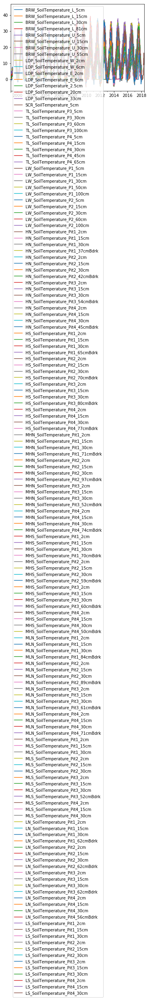

In [56]:
df_lst = [BRW_ST,LDP_ST,SCR_ST,TL_ST,LW_ST,HN_ST,HS_ST,MHN_ST,MHS_ST,MLN_ST,MLS_ST,LN_ST,LS_ST]
for df in df_lst:  
    display(df.head(2))
    threC(df,'SoilTemperature') # modify the dataframe and set unphysical values to NAN
    df.index = pd.to_datetime(df.index,errors = 'coerce')
    display(df.head(2))
    print(df.shape)
    print(df.index[0],df.index[-1])
    
prep = aggre_and_comb_daily(df_lst, axis=1, func = "mean") 
prep.plot()

BRW_SoilTemperature_L_5cm
BRW_SoilTemperature_L_15cm
BRW_SoilTemperature_L_30cm
BRW_SoilTemperature_L_81cm
BRW_SoilTemperature_U_5cm
BRW_SoilTemperature_U_15cm
BRW_SoilTemperature_U_30cm
BRW_SoilTemperature_U_55cm
LDP_SoilTemperature_W_2cm
LDP_SoilTemperature_W_6cm
LDP_SoilTemperature_E_2cm
LDP_SoilTemperature_E_6cm
LDP_SoilTemperature_2.5cm
LDP_SoilTemperature_20cm
LDP_SoilTemperature_33cm
SCR_SoilTemperature_5cm
TL_SoilTemperature_P3_5cm
TL_SoilTemperature_P3_30cm
TL_SoilTemperature_P3_60cm
TL_SoilTemperature_P3_100cm
TL_SoilTemperature_P4_5cm
TL_SoilTemperature_P4_15cm
TL_SoilTemperature_P4_30cm
TL_SoilTemperature_P4_45cm
TL_SoilTemperature_P4_65cm
LW_SoilTemperature_P1_5cm
LW_SoilTemperature_P1_15cm
LW_SoilTemperature_P1_30cm
LW_SoilTemperature_P1_50cm
LW_SoilTemperature_P1_100cm
LW_SoilTemperature_P2_5cm
LW_SoilTemperature_P2_15cm
LW_SoilTemperature_P2_30cm
LW_SoilTemperature_P2_60cm
LW_SoilTemperature_P2_100cm
HN_SoilTemperature_Pit1_2cm
HN_SoilTemperature_Pit1_15cm
HN_SoilTemper

<Figure size 720x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

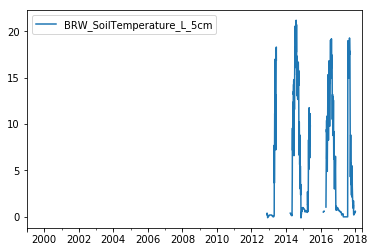

<Figure size 432x288 with 0 Axes>

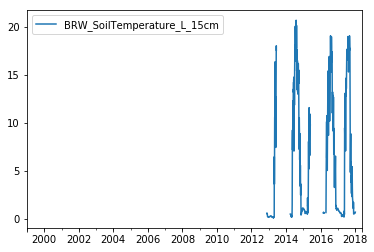

<Figure size 432x288 with 0 Axes>

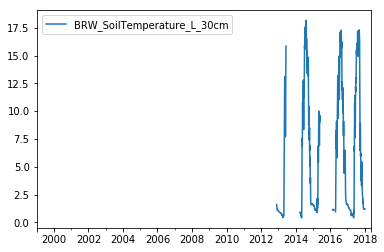

<Figure size 432x288 with 0 Axes>

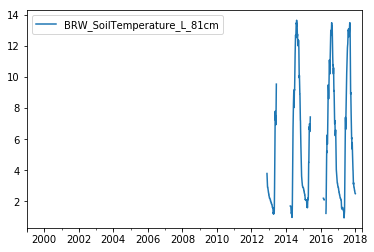

<Figure size 432x288 with 0 Axes>

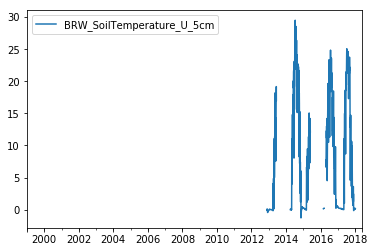

<Figure size 432x288 with 0 Axes>

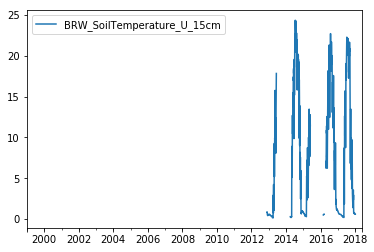

<Figure size 432x288 with 0 Axes>

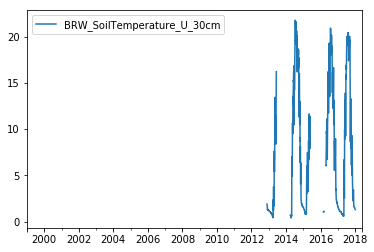

<Figure size 432x288 with 0 Axes>

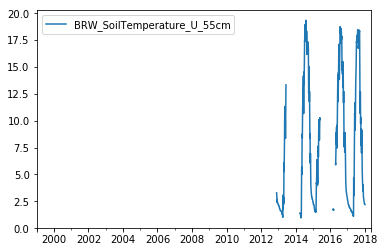

<Figure size 432x288 with 0 Axes>

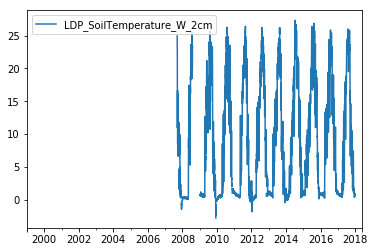

<Figure size 432x288 with 0 Axes>

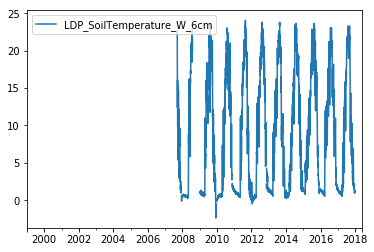

<Figure size 432x288 with 0 Axes>

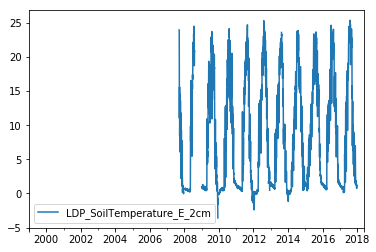

<Figure size 432x288 with 0 Axes>

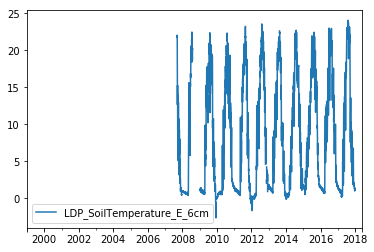

<Figure size 432x288 with 0 Axes>

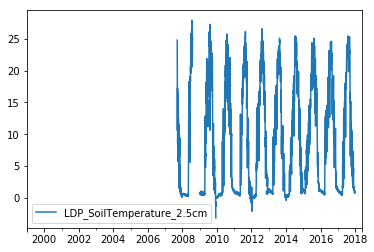

<Figure size 432x288 with 0 Axes>

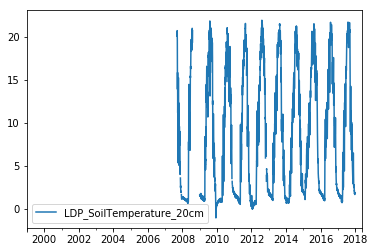

<Figure size 432x288 with 0 Axes>

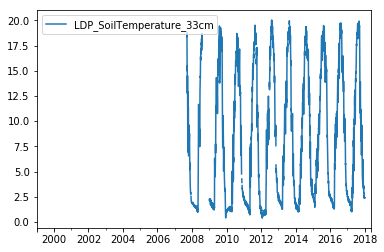

<Figure size 432x288 with 0 Axes>

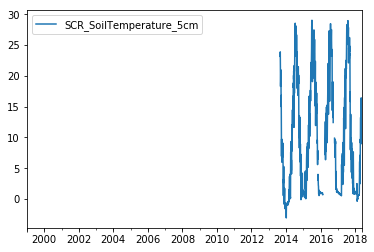

<Figure size 432x288 with 0 Axes>

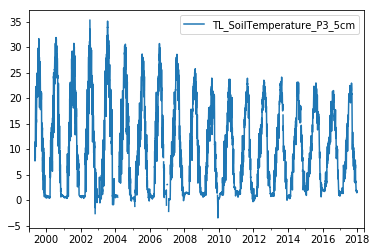

<Figure size 432x288 with 0 Axes>

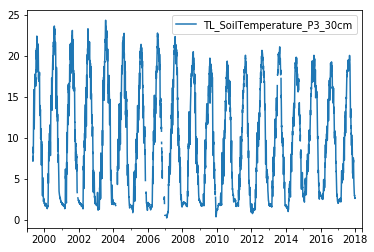

<Figure size 432x288 with 0 Axes>

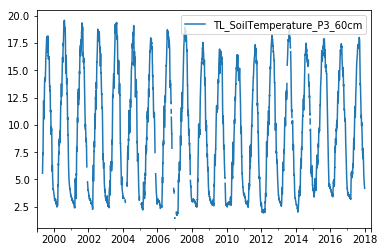

<Figure size 432x288 with 0 Axes>

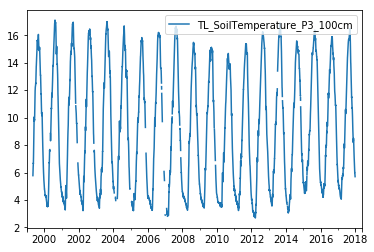

<Figure size 432x288 with 0 Axes>

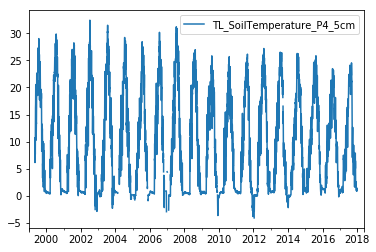

<Figure size 432x288 with 0 Axes>

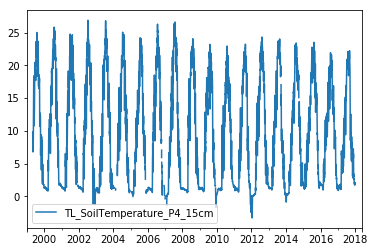

<Figure size 432x288 with 0 Axes>

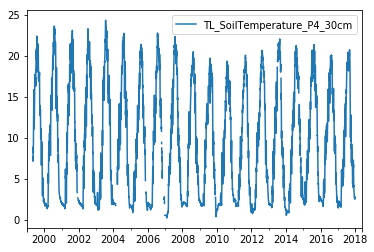

<Figure size 432x288 with 0 Axes>

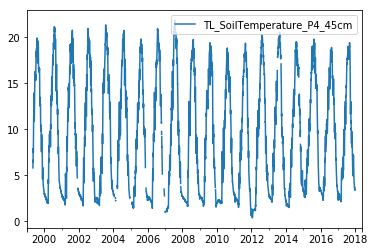

<Figure size 432x288 with 0 Axes>

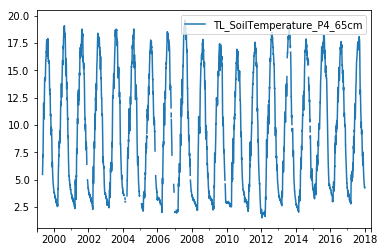

<Figure size 432x288 with 0 Axes>

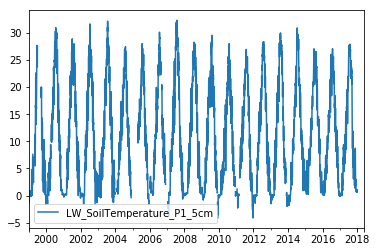

<Figure size 432x288 with 0 Axes>

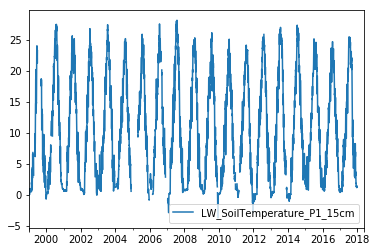

<Figure size 432x288 with 0 Axes>

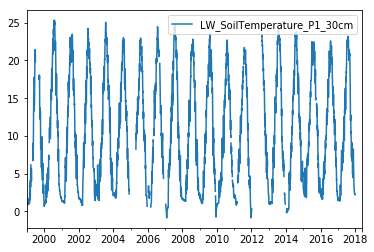

<Figure size 432x288 with 0 Axes>

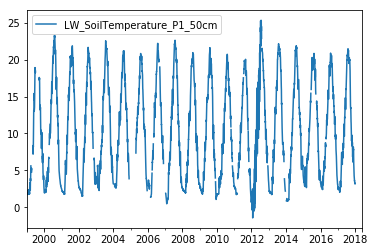

<Figure size 432x288 with 0 Axes>

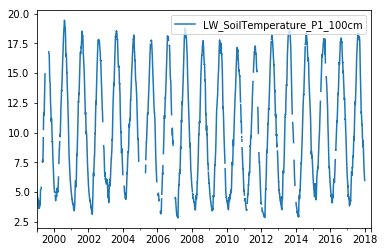

<Figure size 432x288 with 0 Axes>

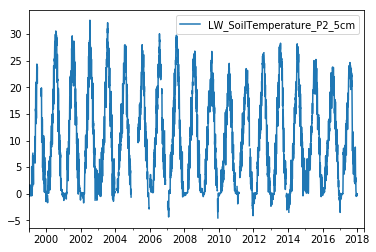

<Figure size 432x288 with 0 Axes>

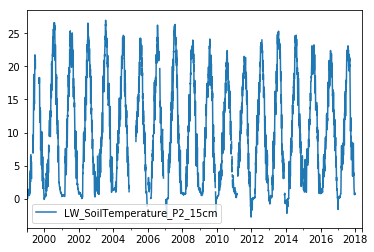

<Figure size 432x288 with 0 Axes>

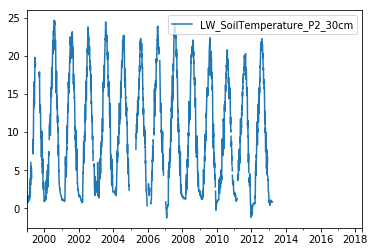

<Figure size 432x288 with 0 Axes>

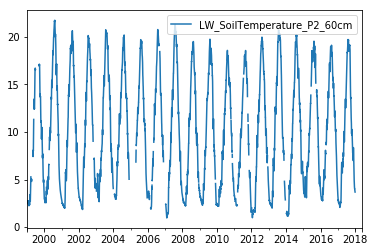

<Figure size 432x288 with 0 Axes>

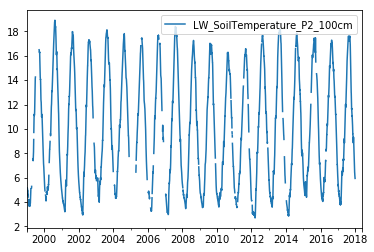

<Figure size 432x288 with 0 Axes>

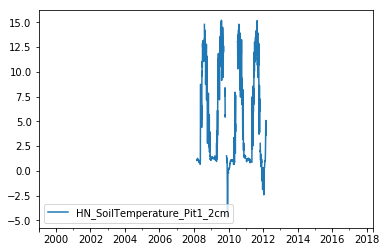

<Figure size 432x288 with 0 Axes>

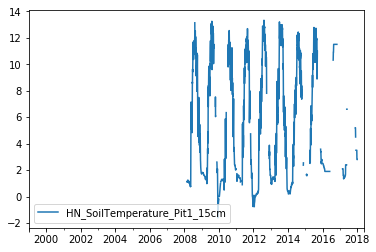

<Figure size 432x288 with 0 Axes>

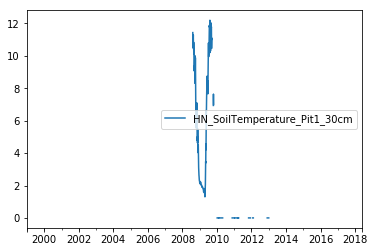

<Figure size 432x288 with 0 Axes>

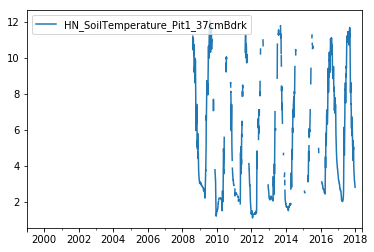

<Figure size 432x288 with 0 Axes>

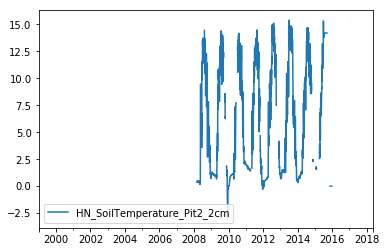

<Figure size 432x288 with 0 Axes>

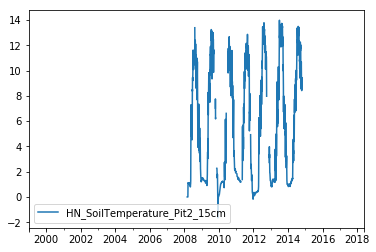

<Figure size 432x288 with 0 Axes>

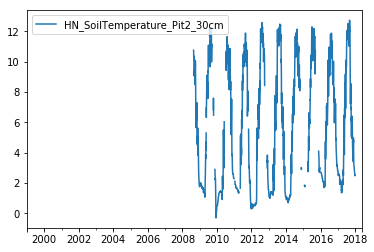

<Figure size 432x288 with 0 Axes>

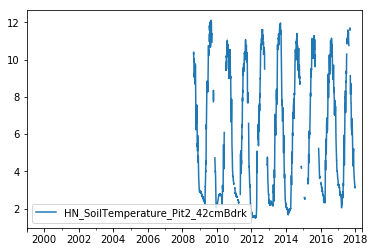

<Figure size 432x288 with 0 Axes>

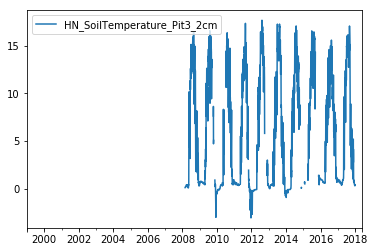

<Figure size 432x288 with 0 Axes>

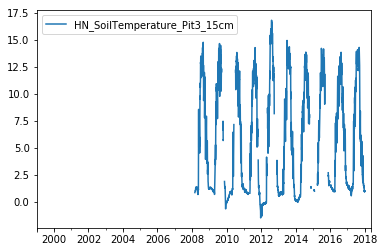

<Figure size 432x288 with 0 Axes>

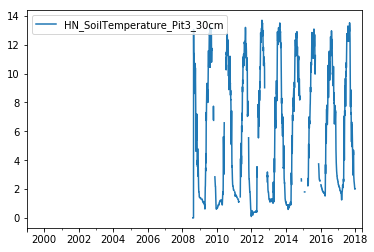

<Figure size 432x288 with 0 Axes>

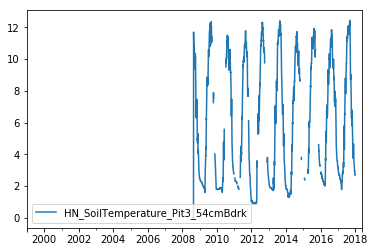

<Figure size 432x288 with 0 Axes>

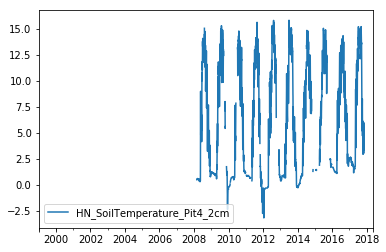

<Figure size 432x288 with 0 Axes>

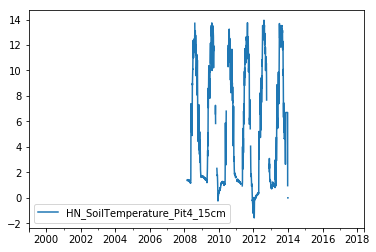

<Figure size 432x288 with 0 Axes>

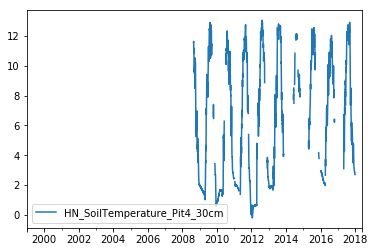

<Figure size 432x288 with 0 Axes>

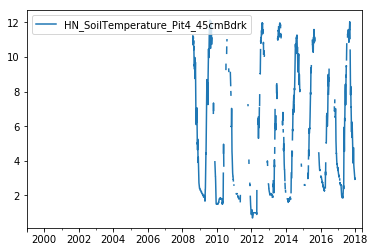

<Figure size 432x288 with 0 Axes>

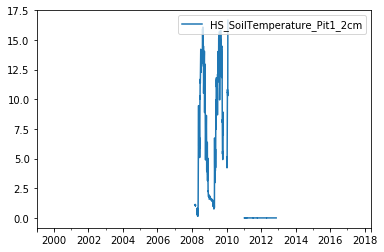

<Figure size 432x288 with 0 Axes>

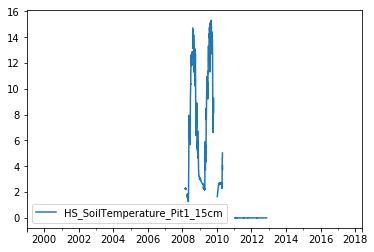

<Figure size 432x288 with 0 Axes>

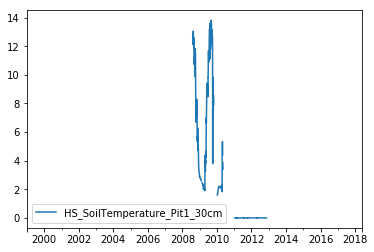

<Figure size 432x288 with 0 Axes>

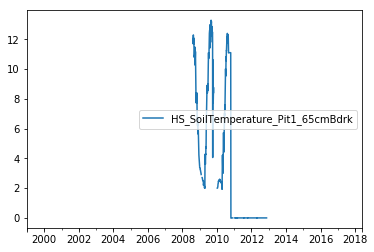

<Figure size 432x288 with 0 Axes>

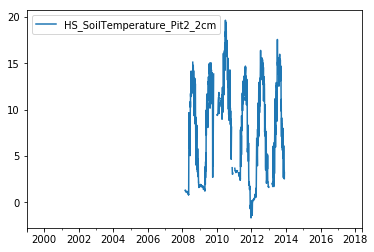

<Figure size 432x288 with 0 Axes>

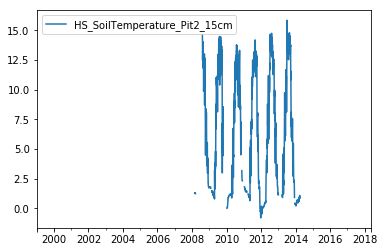

<Figure size 432x288 with 0 Axes>

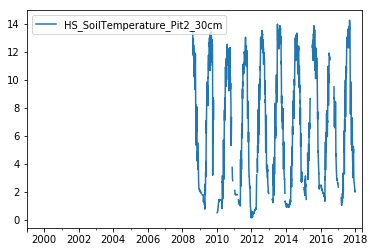

<Figure size 432x288 with 0 Axes>

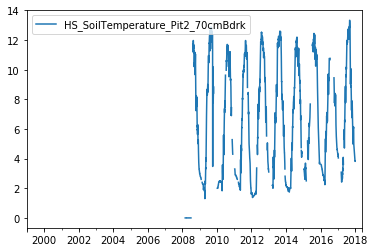

<Figure size 432x288 with 0 Axes>

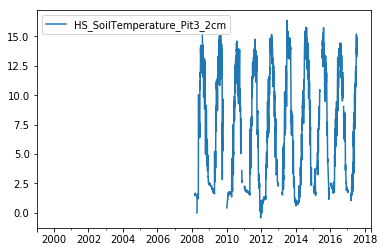

<Figure size 432x288 with 0 Axes>

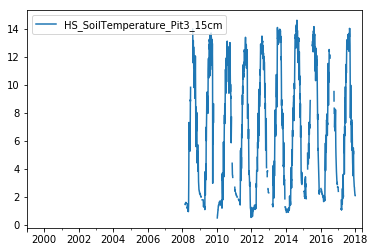

<Figure size 432x288 with 0 Axes>

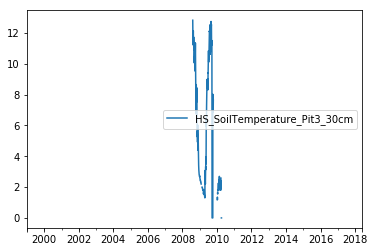

<Figure size 432x288 with 0 Axes>

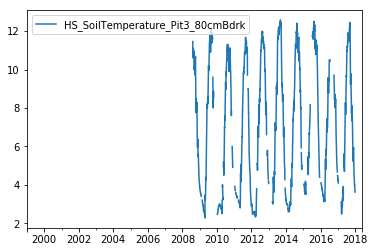

<Figure size 432x288 with 0 Axes>

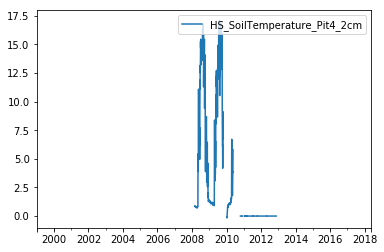

<Figure size 432x288 with 0 Axes>

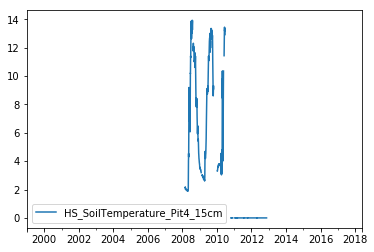

<Figure size 432x288 with 0 Axes>

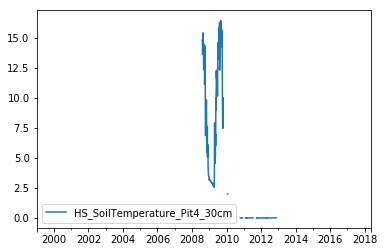

<Figure size 432x288 with 0 Axes>

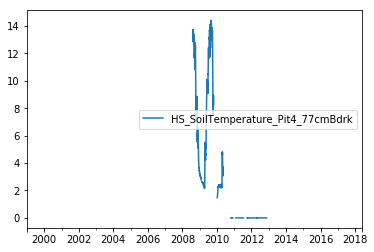

<Figure size 432x288 with 0 Axes>

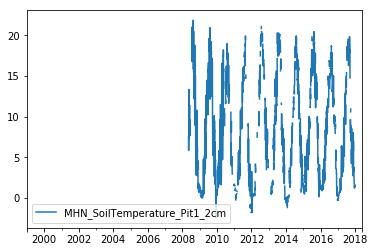

<Figure size 432x288 with 0 Axes>

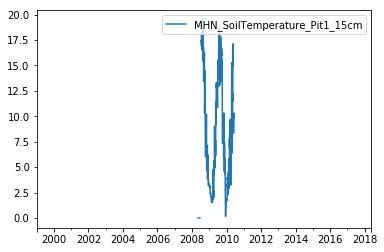

<Figure size 432x288 with 0 Axes>

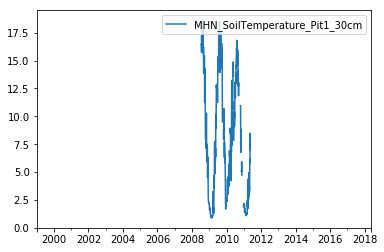

<Figure size 432x288 with 0 Axes>

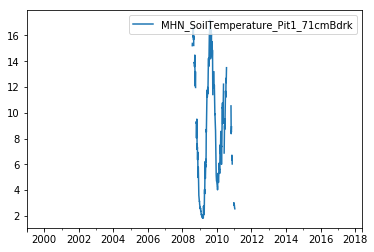

<Figure size 432x288 with 0 Axes>

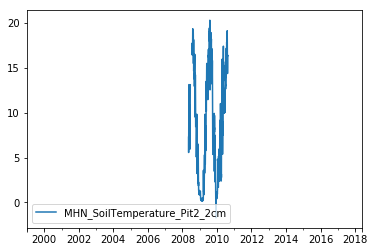

<Figure size 432x288 with 0 Axes>

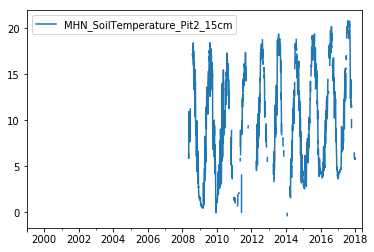

<Figure size 432x288 with 0 Axes>

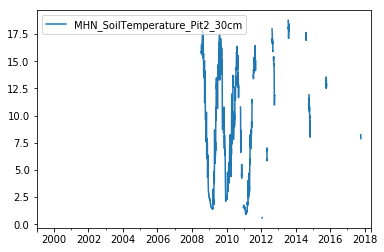

<Figure size 432x288 with 0 Axes>

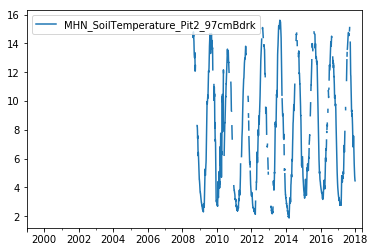

<Figure size 432x288 with 0 Axes>

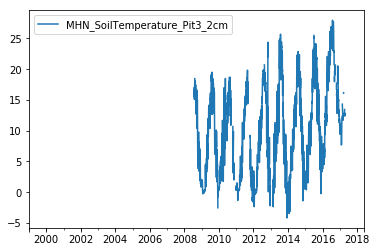

<Figure size 432x288 with 0 Axes>

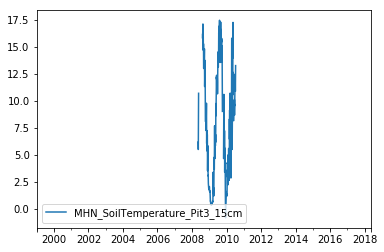

<Figure size 432x288 with 0 Axes>

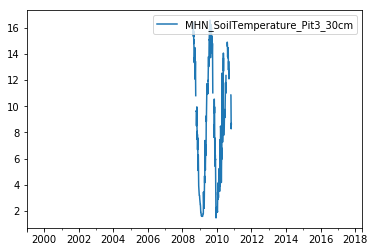

<Figure size 432x288 with 0 Axes>

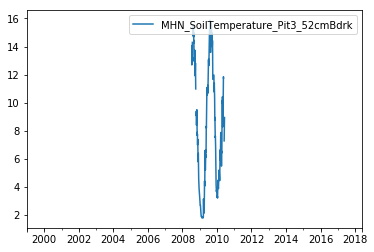

<Figure size 432x288 with 0 Axes>

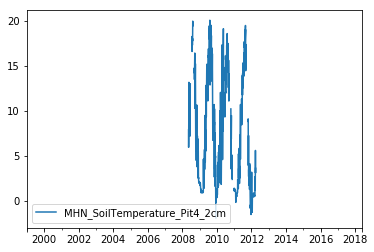

<Figure size 432x288 with 0 Axes>

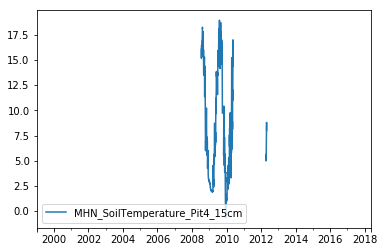

<Figure size 432x288 with 0 Axes>

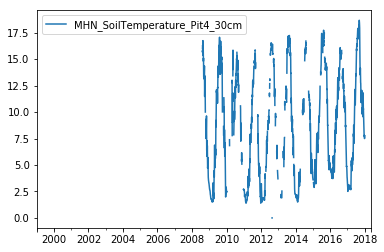

<Figure size 432x288 with 0 Axes>

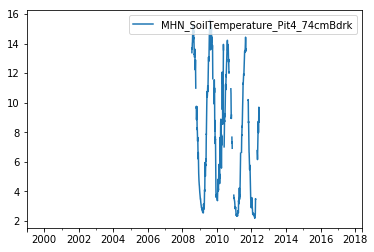

<Figure size 432x288 with 0 Axes>

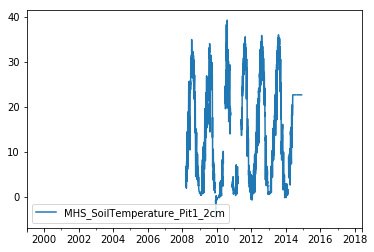

<Figure size 432x288 with 0 Axes>

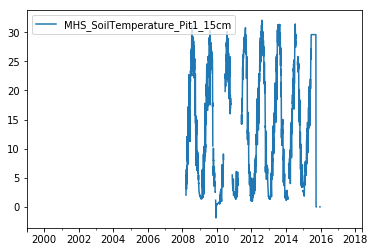

<Figure size 432x288 with 0 Axes>

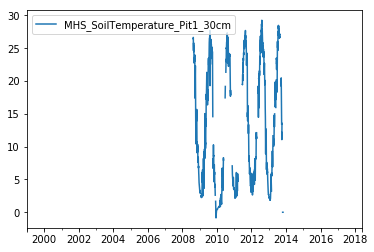

<Figure size 432x288 with 0 Axes>

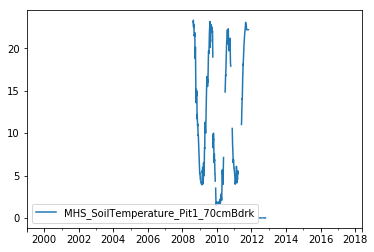

<Figure size 432x288 with 0 Axes>

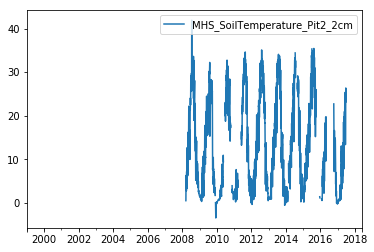

<Figure size 432x288 with 0 Axes>

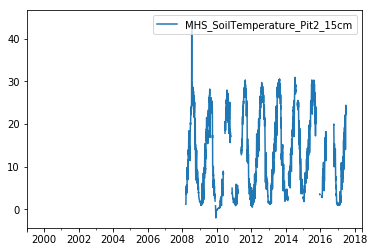

<Figure size 432x288 with 0 Axes>

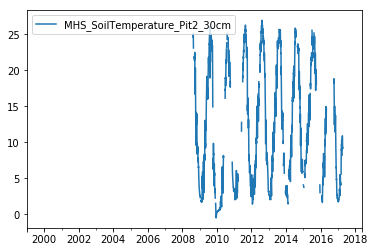

<Figure size 432x288 with 0 Axes>

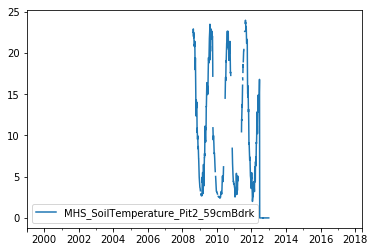

<Figure size 432x288 with 0 Axes>

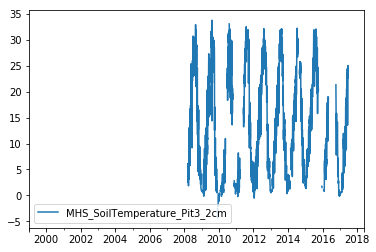

<Figure size 432x288 with 0 Axes>

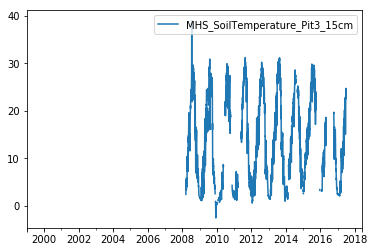

<Figure size 432x288 with 0 Axes>

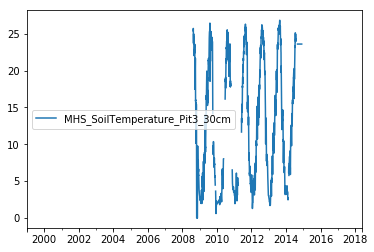

<Figure size 432x288 with 0 Axes>

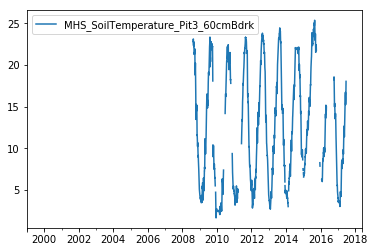

<Figure size 432x288 with 0 Axes>

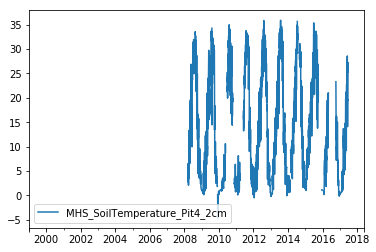

<Figure size 432x288 with 0 Axes>

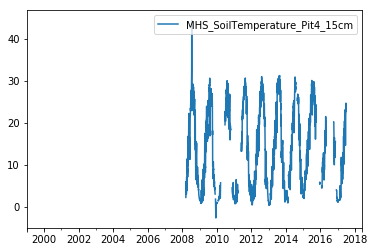

<Figure size 432x288 with 0 Axes>

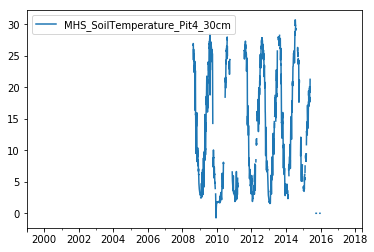

<Figure size 432x288 with 0 Axes>

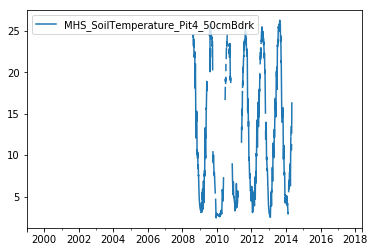

<Figure size 432x288 with 0 Axes>

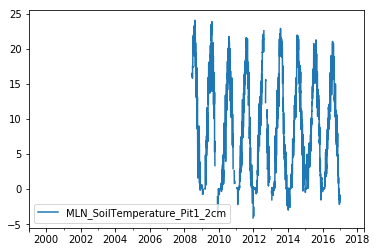

<Figure size 432x288 with 0 Axes>

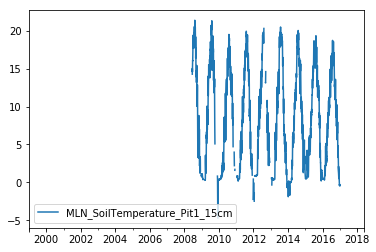

<Figure size 432x288 with 0 Axes>

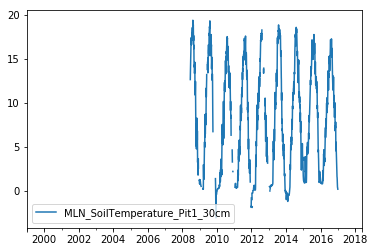

<Figure size 432x288 with 0 Axes>

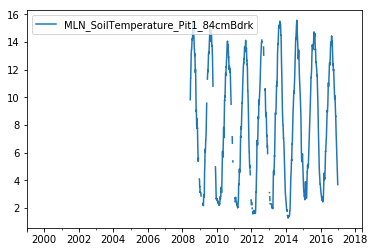

<Figure size 432x288 with 0 Axes>

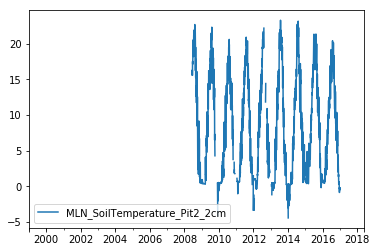

<Figure size 432x288 with 0 Axes>

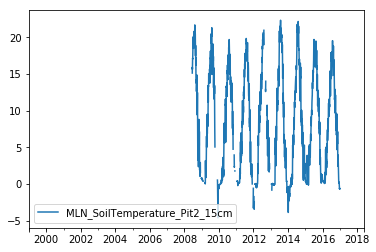

<Figure size 432x288 with 0 Axes>

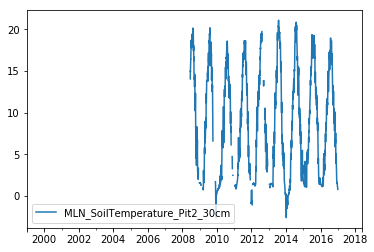

<Figure size 432x288 with 0 Axes>

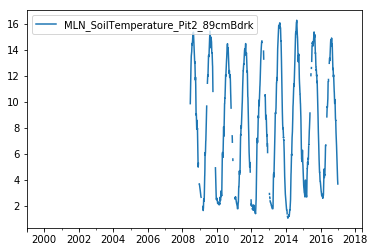

<Figure size 432x288 with 0 Axes>

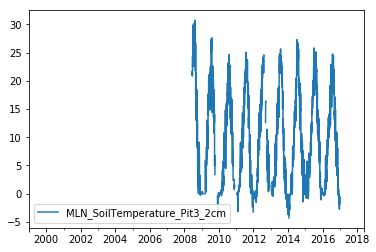

<Figure size 432x288 with 0 Axes>

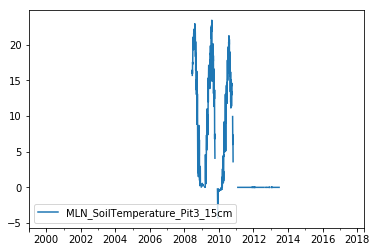

<Figure size 432x288 with 0 Axes>

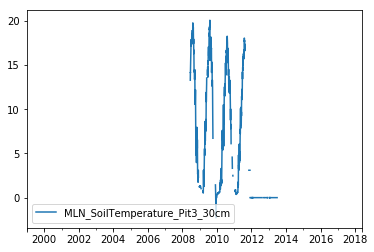

<Figure size 432x288 with 0 Axes>

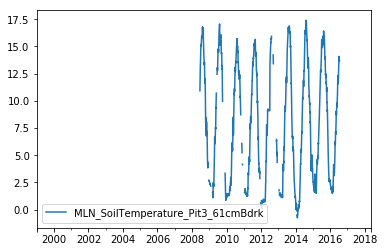

<Figure size 432x288 with 0 Axes>

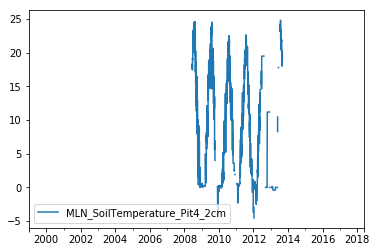

<Figure size 432x288 with 0 Axes>

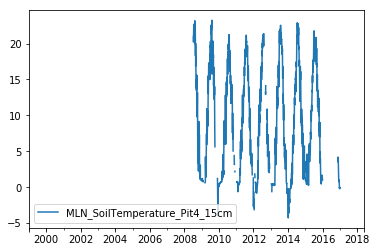

<Figure size 432x288 with 0 Axes>

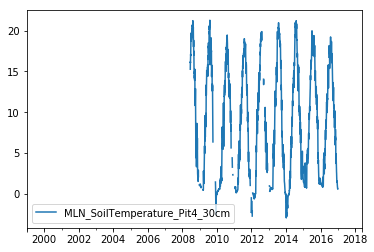

<Figure size 432x288 with 0 Axes>

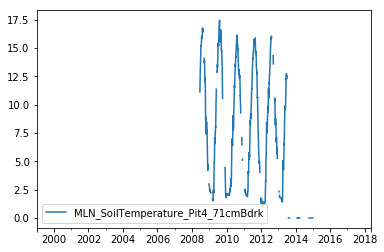

<Figure size 432x288 with 0 Axes>

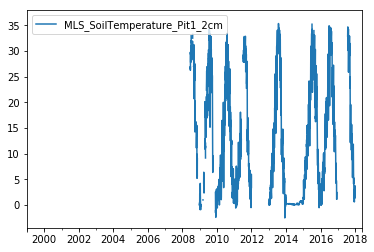

<Figure size 432x288 with 0 Axes>

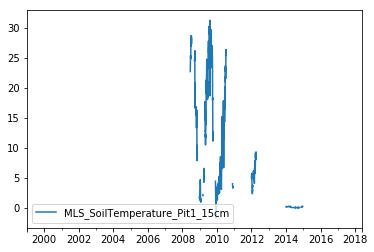

<Figure size 432x288 with 0 Axes>

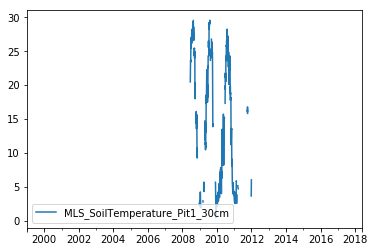

<Figure size 432x288 with 0 Axes>

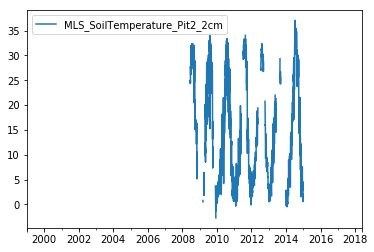

<Figure size 432x288 with 0 Axes>

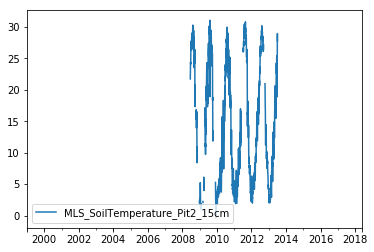

<Figure size 432x288 with 0 Axes>

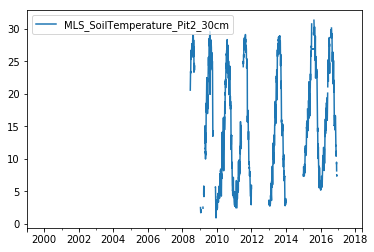

<Figure size 432x288 with 0 Axes>

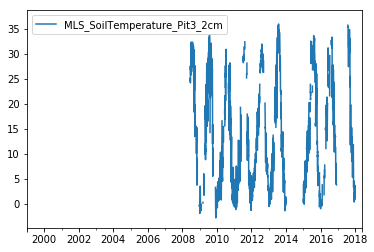

<Figure size 432x288 with 0 Axes>

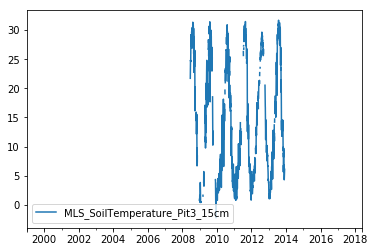

<Figure size 432x288 with 0 Axes>

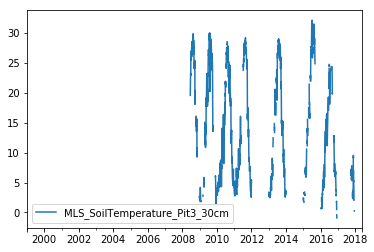

<Figure size 432x288 with 0 Axes>

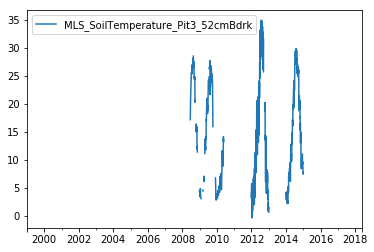

<Figure size 432x288 with 0 Axes>

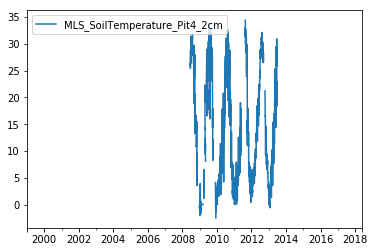

<Figure size 432x288 with 0 Axes>

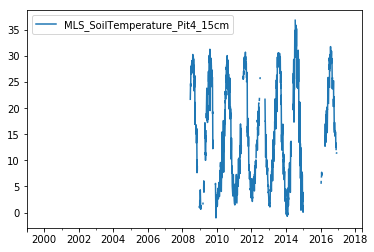

<Figure size 432x288 with 0 Axes>

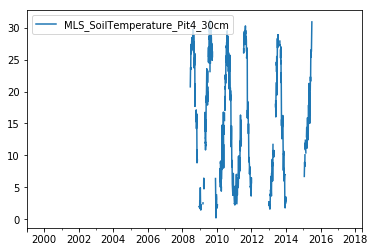

<Figure size 432x288 with 0 Axes>

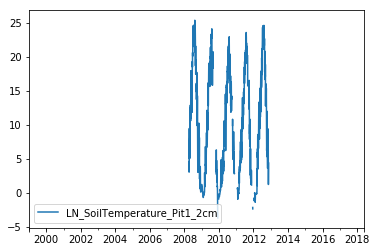

<Figure size 432x288 with 0 Axes>

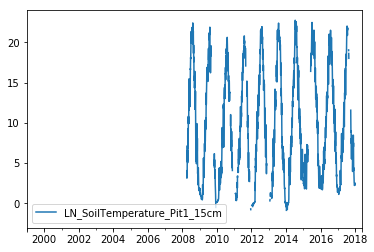

<Figure size 432x288 with 0 Axes>

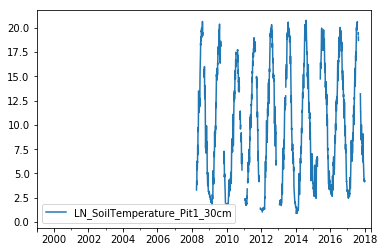

<Figure size 432x288 with 0 Axes>

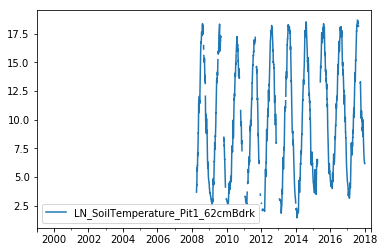

<Figure size 432x288 with 0 Axes>

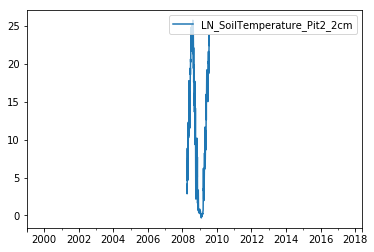

<Figure size 432x288 with 0 Axes>

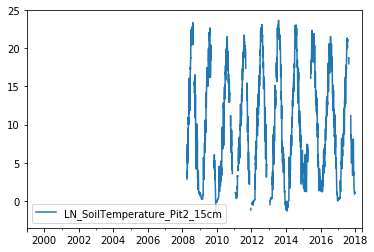

<Figure size 432x288 with 0 Axes>

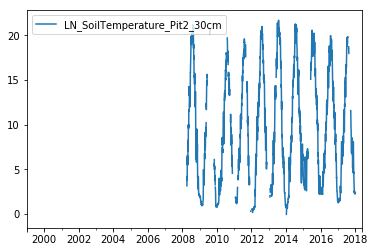

<Figure size 432x288 with 0 Axes>

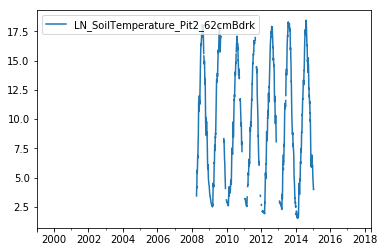

<Figure size 432x288 with 0 Axes>

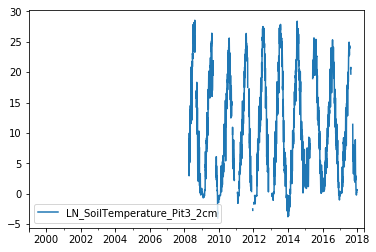

<Figure size 432x288 with 0 Axes>

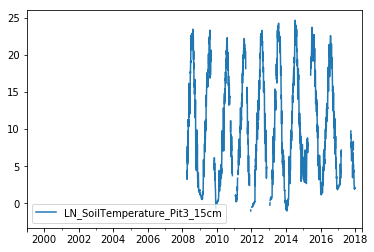

<Figure size 432x288 with 0 Axes>

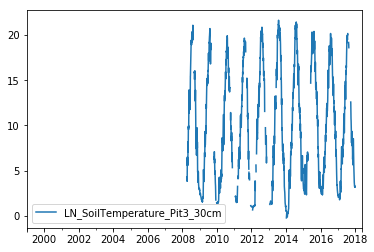

<Figure size 432x288 with 0 Axes>

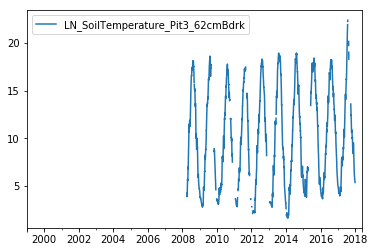

<Figure size 432x288 with 0 Axes>

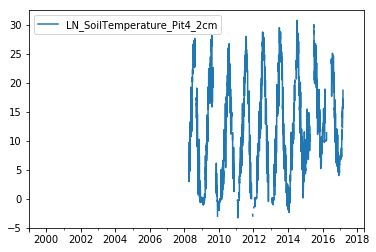

<Figure size 432x288 with 0 Axes>

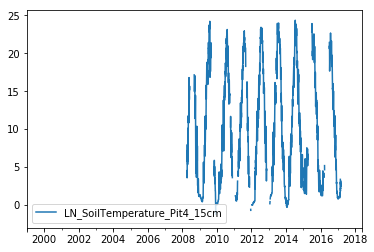

<Figure size 432x288 with 0 Axes>

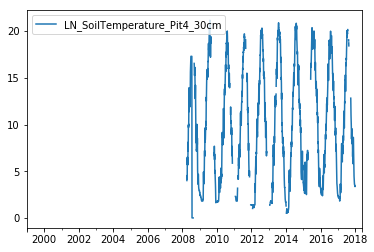

<Figure size 432x288 with 0 Axes>

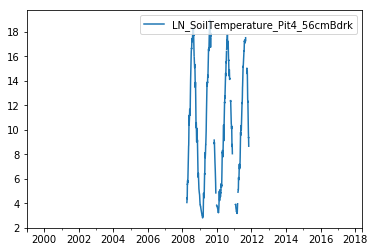

<Figure size 432x288 with 0 Axes>

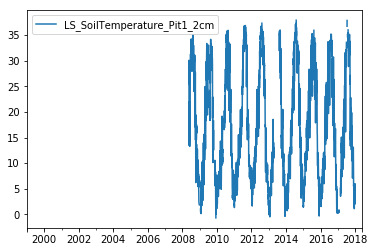

<Figure size 432x288 with 0 Axes>

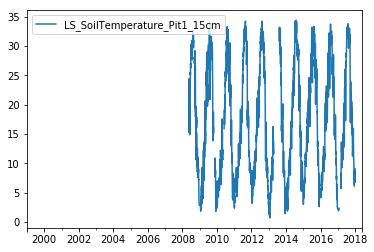

<Figure size 432x288 with 0 Axes>

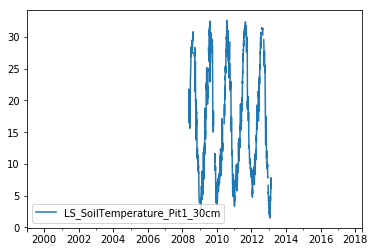

<Figure size 432x288 with 0 Axes>

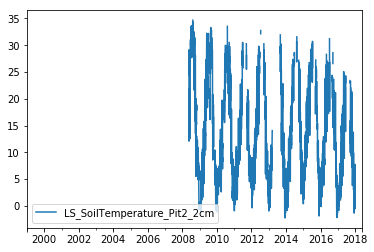

<Figure size 432x288 with 0 Axes>

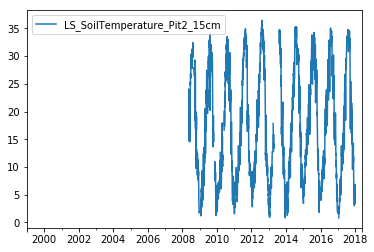

<Figure size 432x288 with 0 Axes>

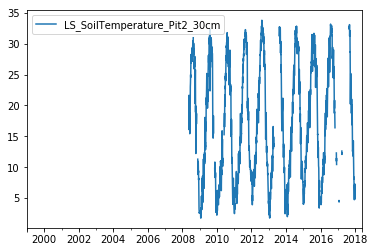

<Figure size 432x288 with 0 Axes>

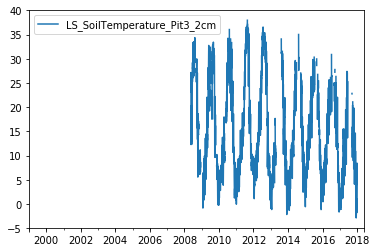

<Figure size 432x288 with 0 Axes>

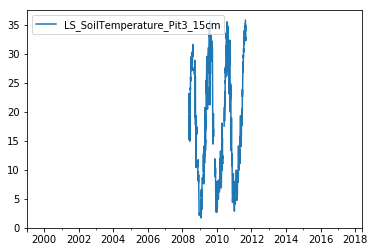

<Figure size 432x288 with 0 Axes>

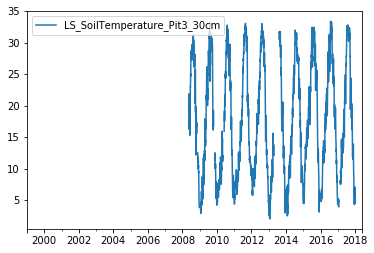

<Figure size 432x288 with 0 Axes>

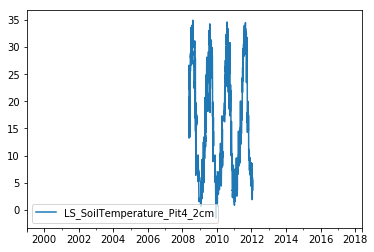

<Figure size 432x288 with 0 Axes>

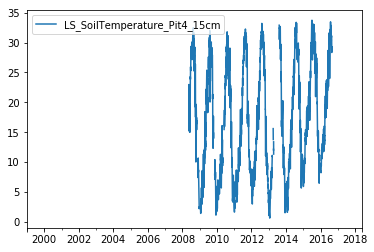

<Figure size 432x288 with 0 Axes>

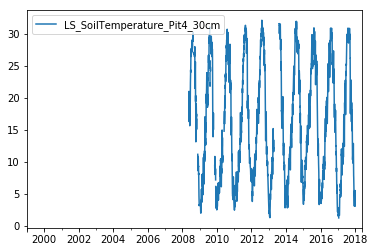

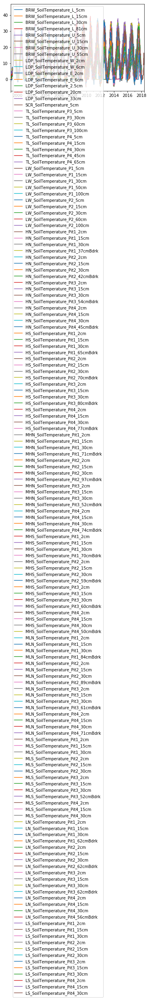

In [57]:
# create a new dataframe and put all the data into it, this is to avoid missing index since the new df has continuous idnex
# check the unit of variable here! SoilTemperature data should be degree celsius

indexUnique = pd.date_range(str(prep.index[0]), str(prep.index[-1]) )  
ready_columns = pd.unique(prep.columns)  
siteList = ready_columns
nan_values = np.nan*np.ones([len(indexUnique),len(ready_columns)])
df = pd.DataFrame(nan_values, index=indexUnique, columns = ready_columns) 

plt.figure(figsize=(10,4))
for i in np.arange(len(ready_columns)):  
    print(siteList[i])            
    site = siteList[i]     
    tab = prep[site]
    for j in np.arange(len(prep)):  
        df.loc[tab.index[j]][ready_columns[i]] = tab[j]  # convert to the right unit
    plt.figure()
    df[[site]].plot()
    
df = threC(df,'SoilTemperature')     
SoilTemperature = copy.deepcopy(df)
SoilTemperature.plot()

### 13. Isotope

In [58]:
# None

### Combine all data tables

In [59]:
result = pd.concat([Discharge,Precipitation,AirTemperature,SolarRadiation,RelativeHumidity, 
                    WindDirection,WindSpeed,SnowDepth,SoilMoisture, SoilTemperature],
                    axis=1,join='outer')
result.index.rename('DateTime',inplace = True)
display(result.head())
result.tail()

,TL_Discharge,BSG_Discharge,LG_Discharge,C1E_Discharge,C1W_Discharge,C2E_Discharge,C2M_Discharge,BRW_Precipitation,LDP_Precipitation,SCR_Precipitation,...,LS_SoilTemperature_Pit1_30cm,LS_SoilTemperature_Pit2_2cm,LS_SoilTemperature_Pit2_15cm,LS_SoilTemperature_Pit2_30cm,LS_SoilTemperature_Pit3_2cm,LS_SoilTemperature_Pit3_15cm,LS_SoilTemperature_Pit3_30cm,LS_SoilTemperature_Pit4_2cm,LS_SoilTemperature_Pit4_15cm,LS_SoilTemperature_Pit4_30cm
DateTime,,,,,,,,,,,,,,,,,,,,,
1999-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1999-01-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1999-01-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1999-01-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1999-01-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


,TL_Discharge,BSG_Discharge,LG_Discharge,C1E_Discharge,C1W_Discharge,C2E_Discharge,C2M_Discharge,BRW_Precipitation,LDP_Precipitation,SCR_Precipitation,...,LS_SoilTemperature_Pit1_30cm,LS_SoilTemperature_Pit2_2cm,LS_SoilTemperature_Pit2_15cm,LS_SoilTemperature_Pit2_30cm,LS_SoilTemperature_Pit3_2cm,LS_SoilTemperature_Pit3_15cm,LS_SoilTemperature_Pit3_30cm,LS_SoilTemperature_Pit4_2cm,LS_SoilTemperature_Pit4_15cm,LS_SoilTemperature_Pit4_30cm
DateTime,,,,,,,,,,,,,,,,,,,,,
2020-05-07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.218182,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-05-08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-05-09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-05-10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.218182,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-05-11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.108333,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [60]:
result.to_csv('1_DryCreek_Download_Aggregation.csv', sep=',')